# Tesco Large

In [1]:
#import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import datetime as dt
import statsmodels.api as sm 
import seaborn as sns
from scipy import stats
from sklearn.metrics import mean_squared_error
from math import sqrt

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.express as px

In [3]:
#import dataset - pladis products
mcv_dig_250g=pd.read_excel("Tesco Large/Tesco Large MCVTS DGSTVS 250G SNGL.xlsx")
mcv_dig_400g=pd.read_excel("Tesco others/new-Tesco Large MCVTS DGSTVS 400G SNGL.xlsx")
mcv_dig_400g_twin=pd.read_excel("Tesco others/new-Tesco Large MCVTS DGSTVS 400G 2PACK.xlsx")
mcv_rt_300g=pd.read_excel("Tesco Large/Tesco Large RCH T MCVTS RCH T PLN 300 GM SNGL.xlsx")
mcv_rt_300g_twin=pd.read_excel("Tesco Large/Tesco Large RCH T MCVTS RCH T PLN 300 GM 2 PCK.xlsx")

#import dataset - competitors products
tes_dig_400g=pd.read_excel("Tesco Large/Tesco Large (own label) TSC DGSTVS PLN 400 GM SNGL.xlsx")
tes_molly_400g=pd.read_excel("Tesco Large/missing - Tesco Large (own label) 'TSC-MS-MLL'S-DGSTV-BSCTS PLN 400 GM SNGL.xlsx")
tes_rt_250g=pd.read_excel("Tesco Large/Tesco Large (own label) RCH T TSC RCH T FNGRS PLN 250 GM SNGL.xlsx")
tes_rt_300g=pd.read_excel("Tesco Large/missing - Tesco Large (own label) RCH T TSC RCH T PLN 300 GM SNGL.xlsx")



## Exploration of the dataset 

In [4]:
pd.plotting.register_matplotlib_converters()

In [5]:
#need original dataset
def basic_info(df):
    # look at data
    display(df.head())

    # look a shape of data
    display(df.shape)

    # look at data types. Ideally look at all rows. 
    display(df.dtypes)
   
    # display descriptive statistics
    display(df.describe(percentiles=[0.25,0.5,0.75,0.95,0.99]))
    
    print('Dataset has: ' + str(len(df.index)) + 'rows')
    
    print('Missing values:') 
    print(df.isnull().sum())
    
    print('Screen out distribution>100:')
    print(df[df.Distribution>100].count(axis=0))
    
    print('Screen out negative data: ')
    print(df[df.iloc[:,1:8]<0].count(axis=0))
    

In [6]:
#put corresponding dataset file into lists
mcv_list=[mcv_dig_250g,mcv_dig_400g,mcv_dig_400g_twin,mcv_rt_300g,mcv_rt_300g_twin]
tes_list=[tes_dig_400g,tes_molly_400g,tes_rt_250g,tes_rt_300g]
tes_large=[mcv_dig_250g,mcv_dig_400g,mcv_dig_400g_twin,mcv_rt_300g,mcv_rt_300g_twin,
           tes_dig_400g,tes_molly_400g,tes_rt_250g,tes_rt_300g]

In [7]:
#transform date format and add quarter, week and month
tes_large1=[]

for df in tes_large:
#     df = DataFrame(data)
    df=df[:275]
    date_time = df['SDESC'].str[3:]
    date_time=pd.to_datetime(date_time, format='%d.%m.%y')
    df['SDESC']=date_time
    df=df.dropna()
    df.rename(columns={'SDESC':'Date'}, inplace=True)
    
    df['year'] = pd.DatetimeIndex(df['Date']).year
    df['quarter'] = pd.DatetimeIndex(df['Date']).quarter
    # month as number
    df['month'] = pd.DatetimeIndex(df['Date']).month
    # week as number
    df['week'] = pd.DatetimeIndex(df['Date']).week
#     df=df.set_index('Date')

    tes_large1.append(df)
    continue


#assign list name
mcv_dig_250g_origin=tes_large1[0]
mcv_dig_400g_origin=tes_large1[1]
mcv_dig_400g_twin_origin=tes_large1[2]
mcv_rt_300g_origin=tes_large1[3]
mcv_rt_300g_twin_origin=tes_large1[4]
tes_dig_400g_origin=tes_large1[5]
tes_molly_400g_origin=tes_large1[6]
tes_rt_250g_origin=tes_large1[7]
tes_rt_300g_origin=tes_large1[8]

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:
#plot each variable in the dataframe, need original dataset 
def plot_data(dt):

# specify columns to plot
    values = dt.values
#   groups = [1, 2, 3, 4, 5, 6]
    
    # plot each column
    plt.figure()
    plt.figure(figsize=(23, 15))

    # for group in groups:
    plt.subplot(6, 1, 1)
    dt.groupby('Date')['Volume'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Volume',y=0.5, loc='right')
    plt.subplot(6, 1, 2)
    dt.groupby('Date')['Value'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Value', y=0.5, loc='right')
    plt.subplot(6, 1, 3)
    dt.groupby('Date')['Distribution'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Distribution', y=0.5, loc='right')
    plt.subplot(6, 1, 4)
    dt.groupby('Date')['Promotional Distribution'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('Promotional Distribution', y=0.5, loc='right')
    plt.subplot(6, 1, 5)
    dt.groupby('Date')['£/unit'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('£/unit', y=0.5, loc='right')
    plt.subplot(6, 1, 6)
    dt.groupby('Date')['£/kg'].sum().plot(kind='line', figsize=(23,15), color="royalblue", linewidth=2)
    plt.title('£/kg', y=0.5, loc='right')

    plt.show()


### Preparation for Time Series Models

Apply time series models first: standard time series dataset (date, sales units...). Time series models only require date and sales data, and the models are able to capture the trend and seasonality on their own. It's convenient and straightforward to see the results.

We need to check the stationarity of the dataset first. By stationarity, it means:
- constant mean and variance

Tests to check stationarity:
1. Rolling Statistics
    -Plot the moving average or moving variance and see if it varies with time. More of a visual technique.
2. ADCF Test
    -Null hypothesis is that the TS is non-stationary. Compare t-stats and p-value to see if can reject the null or 
    not. 

In [9]:
#plot original dataset aucorrelation

#plot acf, pacf, original graph
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

def tsplot(y, title, lags=100, figsize=(10,6)):
    '''Examine the patterns of ACF and PACF, along with the time series plot and histogram.
    '''
    fig=plt.figure(figsize=figsize)
    layout=(2,2)
    ts_ax=plt.subplot2grid(layout, (0,0))
    hist_ax=plt.subplot2grid(layout, (0,1))
    acf_ax=plt.subplot2grid(layout, (1,0))
    pacf_ax=plt.subplot2grid(layout, (1,1))
    
    y.plot(ax=ts_ax)
    ts_ax.set_title(title, fontsize=14, fontweight='bold')
    y.plot(ax=hist_ax, kind='hist', bins=25)
    hist_ax.set_title('Histogram')
    plot_acf(y, lags=lags, ax=acf_ax)
    plot_pacf(y, lags=lags, ax=pacf_ax)
    [ax.set_xlim(0) for ax in [acf_ax, pacf_ax]]
    sns.despine()
    plt.tight_layout()
    return ts_ax, acf_ax, pacf_ax

In [10]:
# stationarity check, only need values
from statsmodels.tsa.stattools import adfuller

def plot(data):
    
    dftest=adfuller(data['Volume'], autolag='AIC')
    dfoutput=pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]=value
    print(dfoutput)
    
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    sales.head()
    
    #rolling mean and std in a yearly base
    rolmean=sales.rolling(window=52).mean()
    rolstd=sales.rolling(window=52).std()

    #static graph
    origin=plt.plot(sales, color='blue', label='Original')
    mean=plt.plot(rolmean, color='red', label='Rolling Mean')
    std=plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

we are not able to reject the null, thus we confirm that our dataset is not stationary.

autocorrelation captures the series itself, and how it correlated with its own path. (yt and yt-1)
a correlation of a variable itself at different time is known as autocorrelation.

Large number of time series models require stationarity of the dataset because if the dataset is not stationary, it will hard for the model to capture the trend, which will affect the accuracy of the future predictions. 

In [11]:
# tsplot(series_transformed['Volume_transformed'].dropna(), title=sales.columns[0], lags=100)

Critical values are greater than test statistic, and our p-value is extremely small, which means we are able to reject the null hypothesis. Thus, our dataset is stationary. 

In [12]:
#make the dataset stationary, only need values
def plot_transform(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    
    series_transformed=sales.copy()
#     series_transformed['Volume_transformed']=np.log(sales).diff(1)
    series_transformed['Volume_transformed']=sales.diff(4)
    
    #rolling mean and std in a yearly base
    rolmean_diff=series_transformed['Volume_transformed'].rolling(window=52).mean()
    rolstd_diff=series_transformed['Volume_transformed'].rolling(window=52).std()

    #static graph
    origin=plt.plot(series_transformed['Volume_transformed'], color='blue', label='Original')
    mean=plt.plot(rolmean_diff, color='red', label='Rolling Mean')
    std=plt.plot(rolstd_diff, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    print('Results of Dickey-Fuller Test:')
    dftest=adfuller(series_transformed['Volume_transformed'].dropna(), autolag='AIC')
    dfoutput=pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]=value
    print(dfoutput)

## Overall Baseline Model

The algorithm uses the value at the previous time step (t-1) to predict the expected outcome at the next time step (t+1).

In [13]:
# baseline model. only need volume values
from pandas import DataFrame
from pandas import concat
from matplotlib import pyplot
from sklearn.metrics import mean_squared_error
 
def baseline_model(df):    
    # Create lagged dataset
    sales = df[['Date','Volume']]
    sales=sales.set_index('Date')
    values = DataFrame(sales.values)
    dataframe = concat([values.shift(4), values], axis=1)
    dataframe.columns = ['t-4', 't+1']
    print(dataframe.head(5))

    # split into train and test sets
    X = dataframe.values
    train_size = int(len(X) * 0.8)
    train, test = X[1:train_size], X[train_size:]
    train_X, train_y = train[:,0], train[:,1]
    test_X, test_y = test[:,0], test[:,1]

    # persistence model
    def model_persistence(x):
        return x

    # walk-forward validation
    predictions = list()
    for x in test_X:
        yhat = model_persistence(x)
        predictions.append(yhat)
    test_mse_score = mean_squared_error(test_y, predictions)
    test_rmse_score = sqrt(mean_squared_error(test_y, predictions))

    print('Test MSE: %.3f' % test_mse_score)
    print('Test RMSE: %.3f' % test_rmse_score)

    # plot predictions and expected results
    plt.plot(train_y)
    plt.plot([None for i in train_y] + [x for x in test_y])
    plt.plot([None for i in train_y] + [x for x in predictions])
    plt.show()

## Simple Exponential Smoothing

Simple exponential smoothing: forecast future values using a weighted average of all previous values in the series.
Exponential smoothing is an intuitive forecasting method that weights the observed time series unequally. Recent observations are weighted more heavily than remote observations.

This model does not require stationarity of a dataset, so we apply the model with original data first to see the accuracy. 

In [14]:
#extract volume column, only need volume values
from statsmodels.tsa.api import SimpleExpSmoothing
from pandas import DataFrame

def ses_model(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    sales_origin=sales.copy()
    sales_origin=sales_origin.shift(4)
    sales_origin=sales_origin.dropna()
    train_size = int(len(sales_origin) * 0.8)
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    print('Observations: %d' % (len(sales_origin)))
    print('Training Observations: %d' % (len(sales_train_origin)))
    print('Testing Observations: %d' % (len(sales_test_origin)))

    # then plotting it using different colors
    plt.plot(sales_train_origin)
    plt.plot(sales_test_origin)
    plt.show()
    
    for i in range(1,10,1):
        ses_pred_ori = sales_test_origin.copy()
        ses_ori_fit = SimpleExpSmoothing(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level=i*0.1, optimized=False)
        ses_pred_ori['SES_Ori'] = ses_ori_fit.forecast(len(sales_test_origin))

        rmse_ses_ori=sqrt(mean_squared_error(sales_test_origin.Volume, ses_pred_ori.SES_Ori))
        print("RMSE for Simple Exponential Smoothing α= " + str(i*0.1) + " is: " + str(round(rmse_ses_ori,2)))

    #lowest RMSE with graph
    ses_pred_ori = sales_test_origin.copy()
    ses_ori_fit = SimpleExpSmoothing(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level=0.1, optimized=False)
    ses_pred_ori['SES_Ori'] = ses_ori_fit.forecast(len(sales_test_origin))
    plt.figure(figsize=(8,4))
    plt.plot(sales_train_origin['Volume'], label='Train')
    plt.plot(sales_test_origin['Volume'], label='Test')
    plt.plot(ses_pred_ori['SES_Ori'], label='Simple_ES')
    plt.legend(loc='best')
    plt.show()
    
    
    sales_origin=np.log(sales).copy()
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    ses_pred_ori = sales_test_origin.copy()
    ses_ori_fit = SimpleExpSmoothing(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level=0.1, optimized=False)
    ses_pred_ori['SES_Ori'] = ses_ori_fit.forecast(len(sales_test_origin))

    ses_pred_ori['Actual_Sales']=np.exp(ses_ori_fit.forecast(len(sales_test_origin)))
    ses_pred_ori['Pred_Sales']=np.exp(ses_pred_ori['Volume'])

    rmse_ses_ori=sqrt(mean_squared_error(ses_pred_ori['Actual_Sales'], ses_pred_ori['Pred_Sales']))
    print('RMSE with the best simple exponential smoothing model parameter after log transformation generates: '+ str(round(rmse_ses_ori,2)))
    

We found out that RMSE above for different smoothing values are quite large. We consider to remove trend and seasonality to re-apply the model for another forecast. Such large RMSE also prove that Simple Exponential Smoothing model cannot capture the trend and seasonality of a dataset.

Even we use the stationary dataset, we are still got large error, which means the model is not able to capture the trend and seasonality of our data. 

## Holt's Linear Model 

Holt's linear model can only capture the trend, not seasonality.

In [15]:
# apply the model, only need volume values
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.api import Holt

def holt_linear_model(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')
    sales_origin=sales.copy()
    sales_origin=sales_origin.shift(4)
    sales_origin=sales_origin.dropna()
    train_size = int(len(sales_origin) * 0.8)
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    print('Observations: %d' % (len(sales_origin)))
    print('Training Observations: %d' % (len(sales_train_origin)))
    print('Testing Observations: %d' % (len(sales_test_origin)))

    aList=[]
    bList=[]
    cList=[]

    for i in range(1,10,1):
        for j in range(1,10,1): 
            holt_linear_pred = sales_test_origin.copy()

            sales_holt_linear_fit = Holt(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level = i*0.1,smoothing_slope = j*0.1, optimized=False)
            holt_linear_pred['Holt_linear'] = sales_holt_linear_fit.forecast(len(sales_test_origin))

            rmse_holt_linear=sqrt(mean_squared_error(sales_test_origin.Volume, holt_linear_pred.Holt_linear))
            aList.append(round(rmse_holt_linear,2))
            bList.append(str(i*0.1))
            cList.append(str(j*0.1))

    min_rmse=aList.index(min(aList))

    print("Min RMSE for Holt Linear Forecasting α= " + str(bList[min_rmse]) + " and β= " + str(cList[min_rmse]) + " is: " + str(aList[min_rmse]))

    holt_linear_pred = sales_test_origin.copy()
    sales_holt_linear_fit = Holt(np.asarray(sales_train_origin['Volume'])).fit(smoothing_level = 0.1,smoothing_slope = 0.1, optimized=False)
    holt_linear_pred['Holt_linear'] = sales_holt_linear_fit.forecast(len(sales_test_origin))

    plt.figure(figsize=(8,4))
    plt.plot(sales_train_origin['Volume'], label='Train')
    plt.plot(sales_test_origin['Volume'], label='Test')
    plt.plot(holt_linear_pred['Holt_linear'], label='Holt_linear')
    plt.legend(loc='best')
    plt.show()
    

### Re-apply the model by removing the seasonality through log & diff12

In [16]:
# only need volume values 
def holt_linear_model_log(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')

    # Remove seasonality by log&diff12
    sales_no_season=sales.copy()
    
    sales_no_season['diff1']=np.log(sales_no_season).diff(12)
    sales_no_season.head(15)

    #split training and test
    sales_origin=sales.copy()
    sales_origin=sales_origin.shift(4)
    sales_origin=sales_origin.dropna()
    train_size = int(len(sales_origin) * 0.8)
    holt_linear_train=sales_no_season.diff1[:train_size].dropna()
    holt_linear_test=sales_no_season.diff1[train_size:].dropna()
    
    sales_origin=sales.copy()

    print('Observations: %d' % (len(sales_origin)))
    print('Training Observations: %d' % (len(holt_linear_train)))
    print('Testing Observations: %d' % (len(holt_linear_test)))

    # then plotting it using different colors
    plt.plot(holt_linear_train)
    plt.plot(holt_linear_test)
    plt.show()

    sales_holt_linear_fit = Holt(np.asarray(holt_linear_train)).fit(smoothing_level = 0.1, smoothing_slope = 0.1, optimized=False)
    sales_pred_holt_linear= sales_holt_linear_fit.forecast(len(holt_linear_test))
    sales_pred_holt_linear

    #reverse the forecast to the original unit
    sales_org_test=sales[train_size:]

    holt_linear=np.exp(sales_pred_holt_linear)*sales.Volume[train_size:]
    holt_linear=holt_linear.to_frame(name='pred_value')

    pred_result_holt_linear=pd.merge(sales_org_test, holt_linear, how='left', on='Date')
    print(pred_result_holt_linear)

    
    plt.figure(figsize=(8,4))
    plt.plot(sales.Volume[:train_size], label='Train')
    plt.plot(sales.Volume[train_size:], label='Test')
    plt.plot(pred_result_holt_linear['pred_value'], label='Holt_linear')
    plt.legend(loc='best')
    plt.show()

    rmse_holt_linear=sqrt(mean_squared_error(sales.Volume[train_size:], holt_linear))
    print("RMSE for Holt Linear Forecasting with transformation is: " + str(rmse_holt_linear))
    

After differencing, the RMSE got much better.

--------------

## Holt Winter's Exponential Smoothing Model


This model can capture both trend and seasonlity.

In [17]:
#only need volume values
def holt_winter_model(data):
    sales=data[['Date','Volume']]
    sales=sales.set_index('Date')

    sales_origin=sales.copy()
    sales_origin=sales_origin.shift(4)
    sales_origin=sales_origin.dropna()
    train_size = int(len(sales_origin) * 0.8)
    sales_train_origin=sales_origin[:train_size]
    sales_test_origin=sales_origin[train_size:]

    fit1 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='add').fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit2 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='mul').fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit3 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='mul', seasonal='mul').fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit4 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='add', damped=True).fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit5 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='add', seasonal='mul', damped=True).fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)
    fit6 = ExponentialSmoothing(sales_train_origin, seasonal_periods=52, trend='mul', seasonal='mul', damped=True).fit(use_boxcox=True,smoothing_level=0.1, smoothing_slope=0.05,smoothing_seasonal=0.1)


    ax = sales_train_origin.plot(figsize=(10,6), marker='o', color='black', title="Forecasts from Holt-Winters' multiplicative method" )
    ax.set_ylabel("Volume Sales")
    ax.set_xlabel("Date")
    
    fit1.forecast(len(sales_test_origin)).rename('Holt-Winters (add-add-seasonal)').plot(ax=ax, style='--', marker='o', color='red', legend=True)
    fit2.forecast(len(sales_test_origin)).rename('Holt-Winters (add-mul-seasonal)').plot(ax=ax, style='--', marker='o', color='green', legend=True)
    fit3.forecast(len(sales_test_origin)).rename('Holt-Winters (mul-mul-seasonal)').plot(ax=ax, style='--', marker='o', color='pink', legend=True)
    fit4.forecast(len(sales_test_origin)).rename('Holt-Winters (add-add-damp-seasonal)').plot(ax=ax, style='--', marker='o', color='yellow', legend=True)
    fit5.forecast(len(sales_test_origin)).rename('Holt-Winters (add-add-damp-seasonal)').plot(ax=ax, style='--', marker='o', color='purple', legend=True)
    fit6.forecast(len(sales_test_origin)).rename('Holt-Winters (mul-mul-damp-seasonal)').plot(ax=ax, style='--', marker='o', color='blue', legend=True)

    plt.show()

    rmse_winter1=sqrt(mean_squared_error(sales_test_origin, fit1.forecast(len(sales_test_origin))))
    rmse_winter2=sqrt(mean_squared_error(sales_test_origin, fit2.forecast(len(sales_test_origin))))
    rmse_winter3=sqrt(mean_squared_error(sales_test_origin, fit3.forecast(len(sales_test_origin))))
    rmse_winter4=sqrt(mean_squared_error(sales_test_origin, fit4.forecast(len(sales_test_origin))))
    rmse_winter5=sqrt(mean_squared_error(sales_test_origin, fit5.forecast(len(sales_test_origin))))
    rmse_winter6=sqrt(mean_squared_error(sales_test_origin, fit6.forecast(len(sales_test_origin))))
    print("RMSE for Holt-winter are:")
    print(rmse_winter1)
    print(rmse_winter2)
    print(rmse_winter3)
    print(rmse_winter4)
    print(rmse_winter5)
    print(rmse_winter6)


Tried all three models with original value/unstationary dataset (without transformation). We can see that the RMSE is actually getting smaller. 

From Simple exponential smoothing: 1012
to Holt's linear: 898
to Holt Winter's: 738.

This can prove that holt winter's is the one that can capture more information than they other two models.

We also apply stationary data (after taking log and differencing) on holt's linear model. We get a small RMSE. Even though the exponential smoothing series models do not require stationarity, but stationarity and only contain the information the model can capture is important.

## Prophet 

In [18]:
!pip install fbprophet


         .:::.     .::.       
        ....yy:    .yy.       
        :.  .yy.    y.        
             :y:   .:         
             .yy  .:          
              yy..:           
              :y:.            
              .y.             
             .:.              
        ....:.                
        :::.                  

• Project files and data should be stored in /project. This is shared among everyone
  in the project.
• Personal files and configuration should be stored in /home/faculty.
• Files outside /project and /home/faculty will be lost when this server is terminated.
• Create custom environments to setup your servers reproducibly.



In [19]:
from fbprophet import Prophet

Facebook developed an open sourcing Prophet. Facebook provides prophet model not only can take care of some outliers/unusual values, but also it can take care of missing values. It is almost able to fully automatically forecast the trend of the future time series. 

Prophet can deal with missing observations or large outliers, and can roll with the punches in relation to product launches or marketing pushes.

Built in Stan, which is really fast.

Prophet needs a very specific kind of dataframe for it to work on. What we need is:

Date column as ds & Value column as y.

In [20]:
dir(Prophet)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_load_stan_backend',
 'add_country_holidays',
 'add_group_component',
 'add_regressor',
 'add_seasonality',
 'construct_holiday_dataframe',
 'fit',
 'fourier_series',
 'initialize_scales',
 'linear_growth_init',
 'logistic_growth_init',
 'make_all_seasonality_features',
 'make_future_dataframe',
 'make_holiday_features',
 'make_seasonality_features',
 'parse_seasonality_args',
 'percentile',
 'piecewise_linear',
 'piecewise_logistic',
 'plot',
 'plot_components',
 'predict',
 'predict_seasonal_components',
 'predict_trend',
 'predict_uncertainty',
 'predictive_samples',
 'regressor_column_matrix',
 'sample_model',
 'samp

In [21]:
# apply basic prophet model, only need volume values
def prophet_model(data):
    prophet_data=data[['Date','Volume']]

    # prophet_data['Date']=prophet_data.index
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)

    #define train and test size
#     prophet_data=prophet_data['Volume'].shift(4)
#     prophet_data=prophet_data.dropna()
#     print(prophet_data)
    train_size = int(len(prophet_data) * 0.8)
    prophet_train=prophet_data[:train_size]
    prediction_size=int(len(prophet_data[train_size:]))
    
    # fit model - baseline model (dataset is not stationary) 用原本的数据预测的 没有预测未来时间段的
    model=Prophet()
    model.fit(prophet_train)

    # make prediction
    future=model.make_future_dataframe(periods=prediction_size, freq='W')
    forecast=model.predict(future)
    
    #plot result
    pd.plotting.register_matplotlib_converters()
    mod=model.plot(forecast)
    forecast_graph=model.plot_components(forecast)
    
    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))
    plt.plot(forecast['yhat'])
    #plt.plot(cmp_df['yhat_lower'])
    #plt.plot(cmp_df['yhat_upper'])
    plt.plot(prophet_data['y'])
    plt.xlabel('Time')
    plt.ylabel('Weekly Sales Volume')
    ax.plot(forecast['yhat'], label='yhat', color='darkseagreen')
    #ax.plot(cmp_df['yhat_lower'], label='yhat_lower')
    #ax.plot(cmp_df['yhat_upper'], label='yhat_upper')
    ax.plot(prophet_data['y'], label='y', color='dodgerblue')
    ax.legend()
    plt.show()
    
    rmse_prophet=sqrt(mean_squared_error(prophet_data['y'], forecast['yhat']))
    print("RMSE for prophet model is: " + str(rmse_prophet))

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


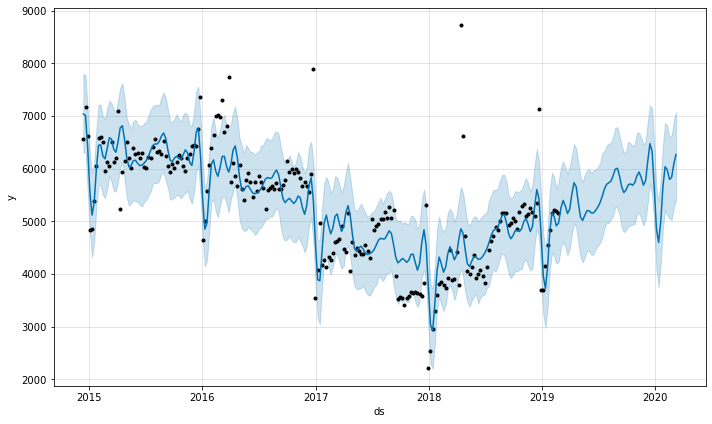

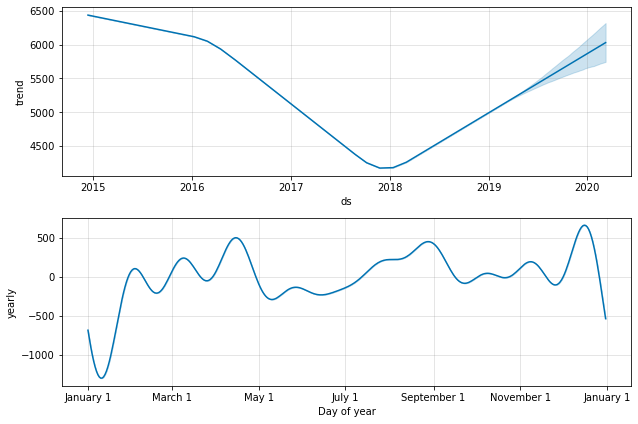

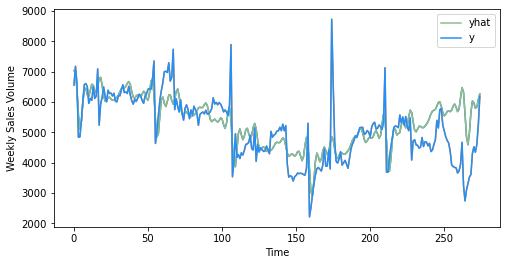

RMSE for prophet model is: 774.4738620997846


In [22]:
prophet_model(mcv_dig_250g_origin)

The default mode for the prophet model is linear growth, we need to make some adjustments for that. 

### Prophet with Log Transformation 

Forecast above is not based on the stationary dataset, now we can make our time series stationary and see the result.

In [23]:
# log the original dataframe, only need volume values
def prophet_model_log(data):
    prophet_data=data[['Date','Volume']]
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)
    prophet_log=np.log(prophet_data['y'])
    prophet_log=prophet_log.to_frame()
    prophet_log['ds']=prophet_data['ds']
    prophet_log.head(10)
    
#     prophet_log=prophet_log.shift(4)
#     prophet_log=prophet_log.dropna()
    train_size = int(len(prophet_log) * 0.8)
    prophet_log_train=prophet_log[:train_size]
    prediction_size=int(len(prophet_log[train_size:]))

    # fit model - prophet model with logged data (dataset is not stationary) 用原本的数据预测的 没有预测未来时间段的
    model_log=Prophet()
    model_log.fit(prophet_log_train)

    # make prediction
    future_log=model_log.make_future_dataframe(periods=prediction_size, freq='W')
    forecast_log=model_log.predict(future_log)
    forecast_log

    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))

    plt.plot(forecast_log['yhat'])
    #plt.plot(cmp_df['yhat_lower'])
    #plt.plot(cmp_df['yhat_upper'])
    plt.plot(prophet_log['y'])

    plt.xlabel('Time')
    plt.ylabel('Average Weekly Sales Volume')
    ax.plot(forecast_log['yhat'], label='yhat',color='darkseagreen')
    #ax.plot(cmp_df['yhat_lower'], label='yhat_lower')
    #ax.plot(cmp_df['yhat_upper'], label='yhat_upper')
    ax.plot(prophet_log['y'], label='y', color='dodgerblue')
    ax.legend()
    plt.show()

    # get the values back to their original scale
    forecast_df=forecast_log[['ds','yhat']]
    forecast_df.head()

    forecast_df['y_log']=prophet_log['y']
    forecast_df['sales_pred']=np.exp(forecast_df['yhat'])
    forecast_df['sales_origin']=np.exp(forecast_df['y_log'])
    forecast_df.head()

    rmse_prophet_log=sqrt(mean_squared_error(forecast_df['sales_origin'], forecast_df['sales_pred']))
    print("RMSE for prophet model after transformation is: "+ str(rmse_prophet_log))
          

### Prophet with Log Transformation and Seasonal Related Parameters

Now we see the dataset that has been transformed got lower RMSE. However, we still need to add other parameters because we want to capture the yearly peak pattern. We notice the seasonal pattern usually happened at the end of Dec. and April; thus, we will only focus on time around the two main holidays - Xmas and Easter.

In [24]:
# defined dataframe above, only need volume values 
def prophet_log_season(data):
    prophet_data=data[['Date','Volume']]
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)
    prophet_log=np.log(prophet_data['y'])
    prophet_log=prophet_log.to_frame()
    prophet_log['ds']=prophet_data['ds']
    prophet_log.head(10)
    
#     prophet_log=prophet_log.shift(4)
#     prophet_log=prophet_log.dropna()
    train_size = int(len(prophet_log) * 0.8)
    prophet_log_train=prophet_log[:train_size]
    prediction_size=int(len(prophet_log[train_size:]))
    
    model_season = Prophet(growth='linear', yearly_seasonality=True, holidays_prior_scale=10)
    model_season.add_seasonality(name='monthly', period=27, fourier_order=5)
    model_season.add_country_holidays(country_name='UK')

    # fit model
    model_season.fit(prophet_log_train)
    # holiday_prior_scale; seasonality_prior_scale, holidays

    # make prediction
    future_season=model_season.make_future_dataframe(periods=prediction_size, freq='W')
    forecast_season=model_season.predict(future_season)
    
    print(model_season.train_holiday_names)
    
    prophet_result=model_season.plot(forecast_season)
    
    fig=model_season.plot_components(forecast_season)
    
    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))

    plt.plot(forecast_season['yhat'])
    #plt.plot(cmp_df['yhat_lower'])
    #plt.plot(cmp_df['yhat_upper'])
    plt.plot(prophet_log['y'])

    plt.xlabel('Time')
    plt.ylabel('Average Weekly Sales Volume')
    ax.plot(forecast_season['yhat'], label='yhat',color='darkseagreen')
    #ax.plot(cmp_df['yhat_lower'], label='yhat_lower')
    #ax.plot(cmp_df['yhat_upper'], label='yhat_upper')
    ax.plot(prophet_log['y'], label='y',color='dodgerblue')
    ax.legend()
    plt.show()
    
    forecast_season_df=forecast_season[['ds','yhat']]
    forecast_season_df.head()
    
    forecast_season_df['y_log']=prophet_log['y']
    forecast_season_df['sales_pred']=np.exp(forecast_season_df['yhat'])
    forecast_season_df['sales_origin']=np.exp(forecast_season_df['y_log'])
    forecast_season_df.head()
    
    rmse_prophet_log=sqrt(mean_squared_error(forecast_season_df['sales_origin'], forecast_season_df['sales_pred']))
    print("RMSE for prophet with transformation and holiday is: "+ str(rmse_prophet_log))
    
    

### Transformation and Only focus on Christmas and Easter

In [25]:
easter=pd.DataFrame({
    'holiday': 'Easter',
    'ds': pd.to_datetime(['2014-04-20', '2015-04-05', '2016-03-27', '2017-04-16',
                         '2018-04-01', '2019-04-21', '2020-04-12']),
    'lower_window': -1,
    'upper_window': 1,
})

christmas=pd.DataFrame({
    'holiday': 'Christmas',
    'ds': pd.to_datetime(['2014-12-25','2015-12-25', '2016-12-25', '2017-12-25',
                         '2018-12-25', '2019-12-25', '2020-12-25']),
    'lower_window': -1,
    'upper_window': 1,
})

holidays=pd.concat((easter, christmas))

In [26]:
#only need volume values and holidays
def prophet_log_two_holiday(data):
    prophet_data=data[['Date','Volume']]
    prophet_data.rename(columns={'Date': 'ds','Volume': 'y'}, inplace=True)
    prophet_log=np.log(prophet_data['y'])
    prophet_log=prophet_log.to_frame()
    prophet_log['ds']=prophet_data['ds']
    prophet_log.head(10)
    
#     prophet_log=prophet_log.shift(4)
#     prophet_log=prophet_log.dropna()
    train_size = int(len(prophet_log) * 0.8)
    prophet_log_train=prophet_log[:train_size]
    prediction_size=int(len(prophet_log[train_size:]))
    
    model_holiday = Prophet(growth='linear', yearly_seasonality=True, holidays=holidays, holidays_prior_scale=10)

    # fit model
    model_holiday.fit(prophet_log_train)

    # make prediction
    future_holiday=model_holiday.make_future_dataframe(periods=prediction_size, freq='W')
    forecast_holiday=model_holiday.predict(future_holiday)
    forecast_holiday

    # holidays effect display
    forecast_holiday[(forecast_holiday['Easter'] + forecast_holiday['Christmas']).abs() > 0][
            ['ds', 'Easter', 'Christmas']][-10:]

    prophet_holiday_result=model_holiday.plot(forecast_holiday)

    fig2=model_holiday.plot_components(forecast_holiday)

    # checking the results
    fig, ax = plt.subplots(figsize=(8,4))

    plt.plot(forecast_holiday['yhat'])

    plt.plot(prophet_log['y'])

    plt.xlabel('Time')
    plt.ylabel('Average Weekly Sales Volume')
    ax.plot(forecast_holiday['yhat'], label='yhat',color='darkseagreen')
    ax.plot(prophet_log['y'], label='y',color='dodgerblue')
    ax.legend()
    plt.show()

    forecast_holiday_df=forecast_holiday[['ds','yhat']]
    forecast_holiday_df.head()

    forecast_holiday_df['y_log']=prophet_log['y']
    forecast_holiday_df['sales_pred']=np.exp(forecast_holiday_df['yhat'])
    forecast_holiday_df['sales_origin']=np.exp(forecast_holiday_df['y_log'])
    forecast_holiday_df.head()

    rmse_prophet_holiday=sqrt(mean_squared_error(forecast_holiday_df['sales_origin'], forecast_holiday_df['sales_pred']))
    print(rmse_prophet_holiday)

Apply all time series models and continue with ml models and deep learning method

### Tesco Large - McVitie's Digestives 250g

In [27]:
basic_info(mcv_dig_250g_origin)

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,26252,6563.0,23366.0,97,0,0.890066,3.560262,2014,4,12,50
1,2014-12-20,28719,7179.8,25560.4,97,0,0.890017,3.560043,2014,4,12,51
2,2014-12-27,26468,6617.0,23557.3,97,0,0.890029,3.560118,2014,4,12,52
3,2015-01-03,19371,4842.8,17240.9,97,0,0.890037,3.560110,2015,1,1,1
4,2015-01-10,19424,4856.0,17286.2,97,0,0.889940,3.559761,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,20520.490909,5130.149455,18329.931636,80.490909,0.0,0.893456,3.573803,2017.083636,2.469091,6.414545,26.043636
std,4210.161155,1052.540572,3749.070151,14.825841,0.0,0.016671,0.066685,1.534371,1.140635,3.547767,15.490223
min,8867.000000,2216.800000,7880.100000,58.000000,0.0,0.857718,3.430872,2014.000000,1.000000,1.000000,1.000000
25%,17533.500000,4383.400000,15739.200000,68.000000,0.0,0.889881,3.559501,2016.000000,1.000000,3.000000,12.000000
50%,20591.000000,5147.800000,18365.200000,75.000000,0.0,0.890022,3.560074,2017.000000,2.000000,6.000000,26.000000
75%,23810.000000,5952.550000,21191.250000,97.000000,0.0,0.890830,3.563291,2018.000000,3.500000,9.500000,39.500000
95%,26623.900000,6656.010000,23905.710000,99.000000,0.0,0.899990,3.599945,2019.000000,4.000000,12.000000,50.000000
99%,29826.920000,7456.730000,26560.368000,99.000000,0.0,0.999802,3.999195,2020.000000,4.000000,12.000000,52.000000
max,34927.000000,8731.800000,31083.300000,99.000000,0.0,1.000000,3.999962,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

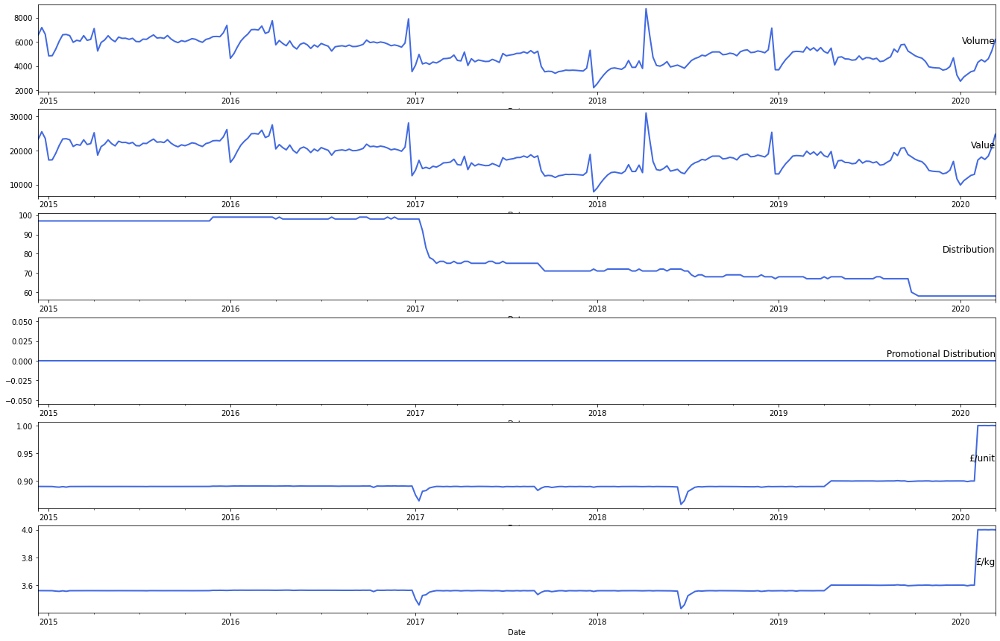

In [28]:
#plot each variable of the dataset
plot_data(mcv_dig_250g_origin)

(<matplotlib.axes._subplots.AxesSubplot at 0x7f3257ead898>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f325671e550>)

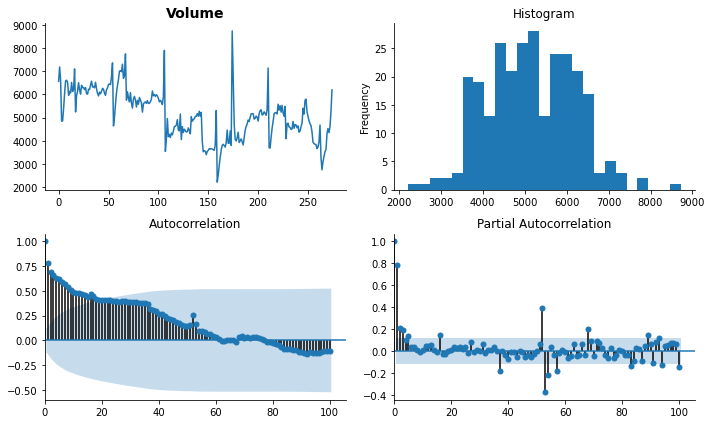

In [29]:
tsplot(mcv_dig_250g_origin['Volume'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)

Test Statistic                  -2.635004
p-value                          0.085976
#Lags Used                       4.000000
Number of Observations Used    270.000000
Critical Value (1%)             -3.454804
Critical Value (5%)             -2.872305
Critical Value (10%)            -2.572506
dtype: float64


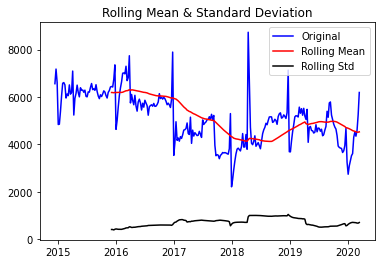

In [30]:
#check stationarity of the original dataset
plot(mcv_dig_250g_origin)

Autocorrelation captures the series itself, and how it correlated with its own path. (yt and yt-1)
a correlation of a variable itself at different time is known as autocorrelation. 

Since we got a relative large p-value, and the test statistic is not able to reject critical values at three levels; thus, we are not able to reject the null, we confirm that our dataset is not stationary.

Large number of time series models require stationarity of the dataset because if the dataset is not stationary, it will hard for the model to capture the trend, which will affect the accuracy of the future predictions. 

(<matplotlib.axes._subplots.AxesSubplot at 0x7f3254cfc898>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f3254c9c6a0>)

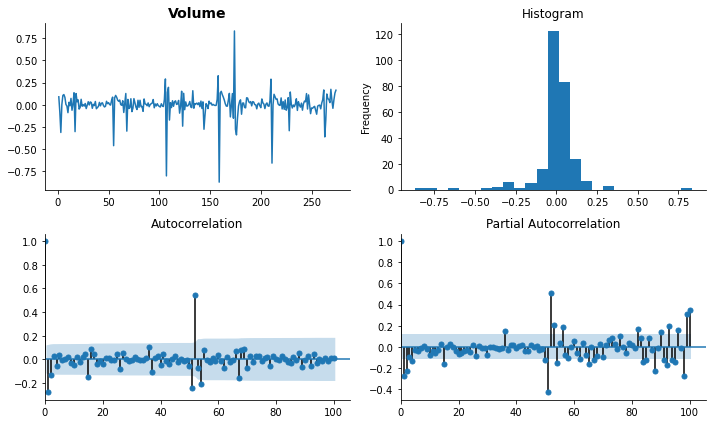

In [31]:
#plot stationary graph
series_transformed=mcv_dig_250g_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_dig_250g_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)


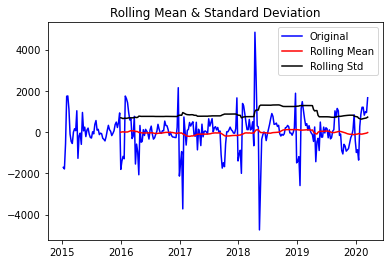

Results of Dickey-Fuller Test:
Test Statistic                  -5.536986
p-value                          0.000002
#Lags Used                      12.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64


In [32]:
plot_transform(mcv_dig_250g_origin)

After transforming the dataset into stationary dataset, we see the p-value is extremely small, and the test statistic is smaller than critical values. And the autocorrelation is near zero.

### Time Series Modeling Part

      t-4     t+1
0     NaN  6563.0
1     NaN  7179.8
2     NaN  6617.0
3     NaN  4842.8
4  6563.0  4856.0
Test MSE: 497173.396
Test RMSE: 705.105


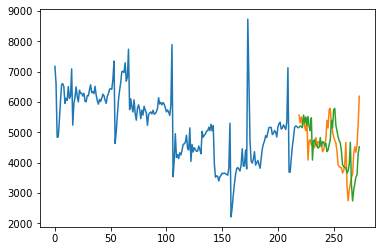

In [33]:
baseline_model(mcv_dig_250g_origin)

When we deal with a time series dataset, we need to check the baseline model before applying any other models. By baseline model, it means we use the value at the previous time step (t-1) to predict the expected outcome at time step at t. It provides a point of reference for all other model techniques.

### Simple Exponential Smoothing model

Observations: 271
Training Observations: 216
Testing Observations: 55


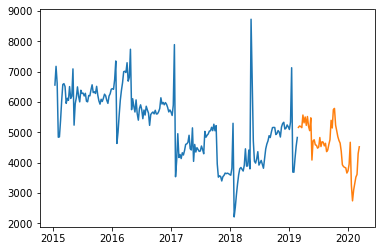

RMSE for Simple Exponential Smoothing α= 0.1 is: 742.44
RMSE for Simple Exponential Smoothing α= 0.2 is: 711.15
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 698.23
RMSE for Simple Exponential Smoothing α= 0.4 is: 696.87
RMSE for Simple Exponential Smoothing α= 0.5 is: 697.17
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 699.79
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 706.65
RMSE for Simple Exponential Smoothing α= 0.8 is: 717.0
RMSE for Simple Exponential Smoothing α= 0.9 is: 728.38


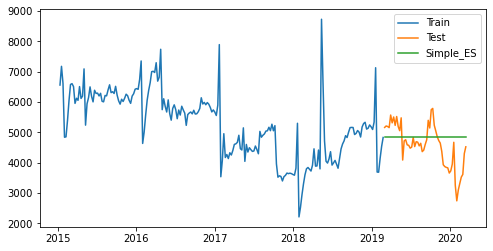

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 726.96


In [34]:
ses_model(mcv_dig_250g_origin)

Simple exponential smoothing: forecast future values using a weighted average of all previous values in the series.
Exponential smoothing is an intuitive forecasting method that weights the observed time series unequally. Recent observations are weighted more heavily than remote observations.

This model does not require stationarity of a dataset, so we apply the model with original data first to see the accuracy. 

### Holt's Linear Model

Holt's linear model can only capture the trend, not seasonality.

Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.8 and β= 0.1 is: 609.18


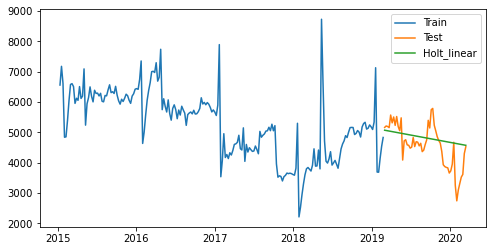

In [35]:
holt_linear_model(mcv_dig_250g_origin)

### Re-apply the model by removing the seasonality through log & diff12

Observations: 275
Training Observations: 204
Testing Observations: 59


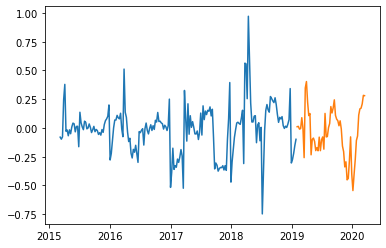

            Volume   pred_value
Date                           
2019-02-02  5166.5  4831.639907
2019-02-09  5214.0  4815.130602
2019-02-16  5196.8  4739.275611
2019-02-23  5159.0  4646.012871
2019-03-02  5574.8  4957.732502
2019-03-09  5317.0  4669.381708
2019-03-16  5510.5  4778.841674
2019-03-23  5234.0  4482.334593
2019-03-30  5525.5  4672.841555
2019-04-06  5197.8  4340.781797
2019-04-13  5059.5  4172.486200
2019-04-20  5482.0  4464.422191
2019-04-27  4091.3  3290.231615
2019-05-04  4723.5  3751.180682
2019-05-11  4760.3  3733.166029
2019-05-18  4590.3  3554.863833
2019-05-25  4578.0  3501.036243
2019-06-01  4482.8  3385.393062
2019-06-08  4518.3  3369.564066
2019-06-15  4833.5  3559.584411
2019-06-22  4535.5  3298.387399
2019-06-29  4695.3  3371.931596
2019-07-06  4680.8  3319.513300
2019-07-13  4558.5  3192.384587
2019-07-20  4643.3  3211.137546
2019-07-27  4369.0  2983.686076
2019-08-03  4418.8  2979.986842
2019-08-10  4605.0  3066.751271
2019-08-17  4761.3  3131.218570
2019-08-

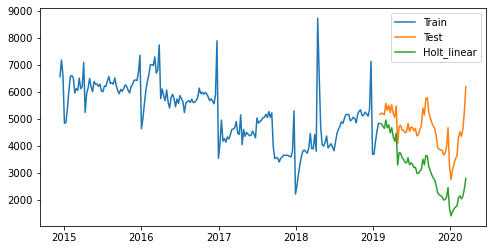

RMSE for Holt Linear Forecasting with transformation is: 1621.4815478740932


In [36]:
holt_linear_model_log(mcv_dig_250g_origin)

### Holt-Winter Model

This model can capture both trend and seasonlity.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

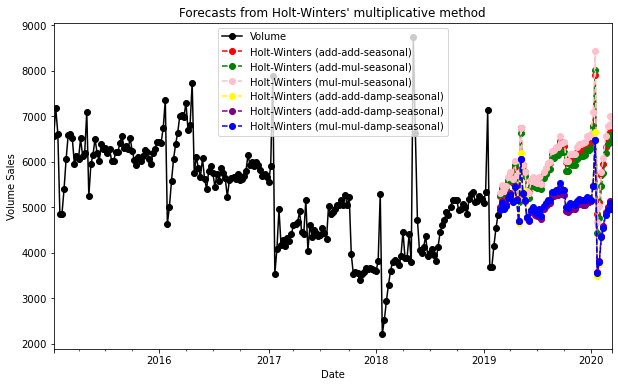

RMSE for Holt-winter are:
1643.2750190257825
1543.9275250555586
1756.3675088141833
793.1019206323773
772.2878932972977
793.6737178945676


In [37]:
holt_winter_model(mcv_dig_250g_origin)

Tried all three models with original value/unstationary dataset (without transformation). We can see that the RMSE is actually getting smaller. 

From Simple exponential smoothing: 1012
to Holt's linear: 898
to Holt Winter's: 738.

This can prove that holt winter's is the one that can capture more information than they other two models.

We also apply stationary data (after taking log and differencing) on holt's linear model. We get a small RMSE. Even though the exponential smoothing series models do not require stationarity, but non-stationary dataset results can be misleading, and it is essential to have stationary dataset for the model to capture the information.

### Prophet Model

Facebook developed an open sourcing Prophet. Facebook provides prophet model not only can take care of some outliers/unusual values, but also it can take care of missing values. It is almost able to fully automatically forecast the trend of the future time series. 

Prophet can deal with missing observations or large outliers, and can roll with the punches in relation to product launches or marketing pushes.

Built in Stan, which is really fast.

Prophet needs a very specific kind of dataframe for it to work on. What we need is:

Date column as ds & Value column as y.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


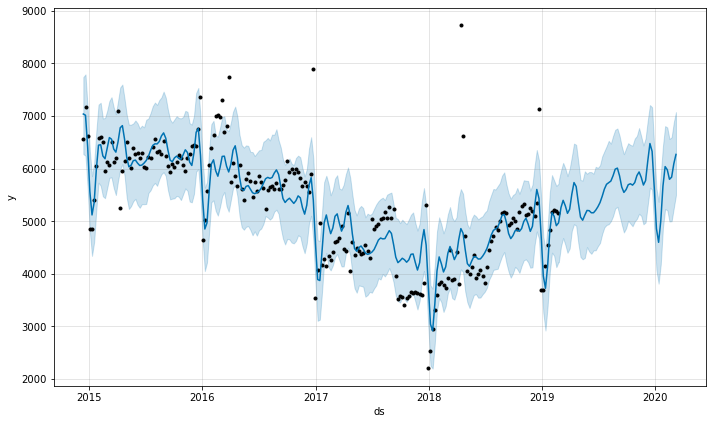

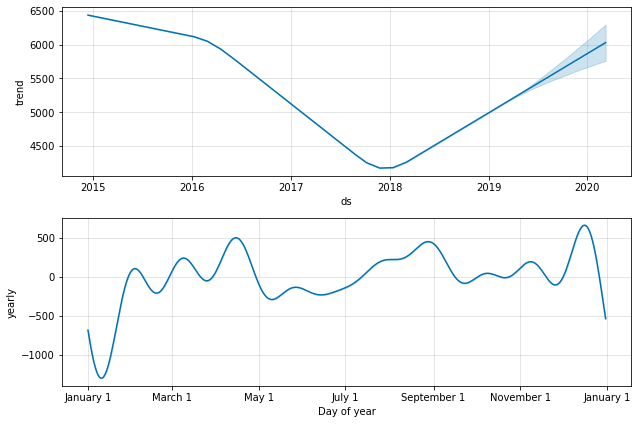

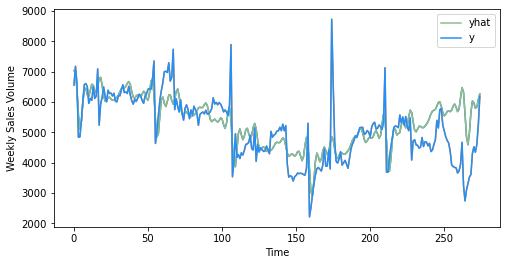

RMSE for prophet model is: 774.4738620997846


In [38]:
prophet_model(mcv_dig_250g_origin)

The default mode for the prophet model is linear growth, we need to make some adjustments for that. 

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


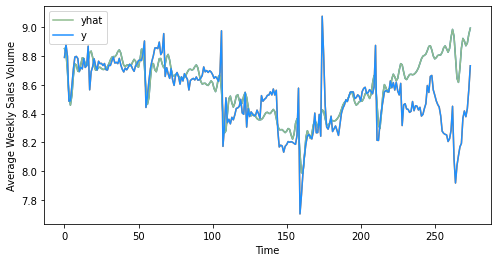

RMSE for prophet model after transformation is: 1103.3304092745504


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [39]:
prophet_model_log(mcv_dig_250g_origin)

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ireland] (Observed)
17                                Boxing Day (Ob

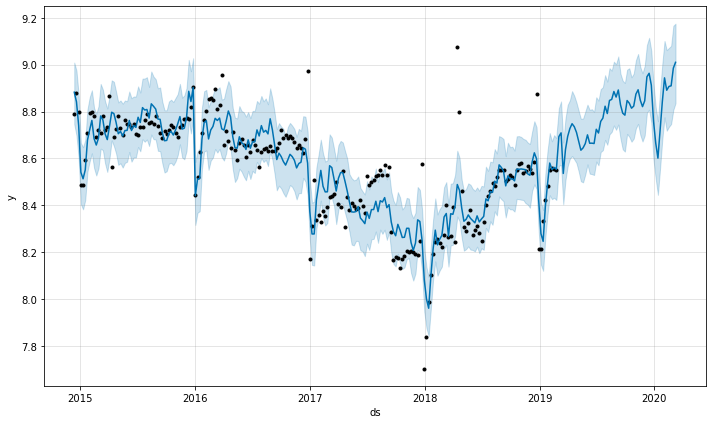

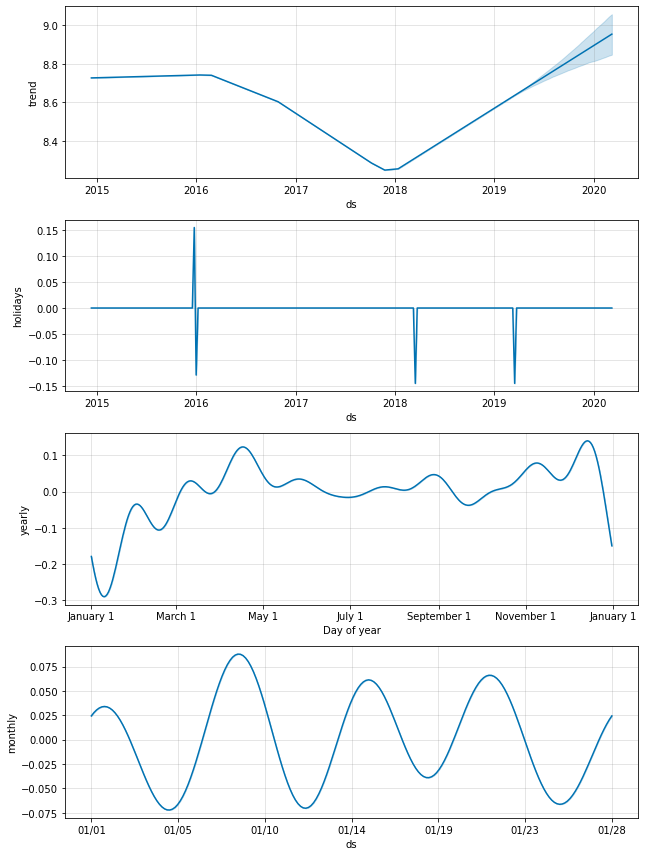

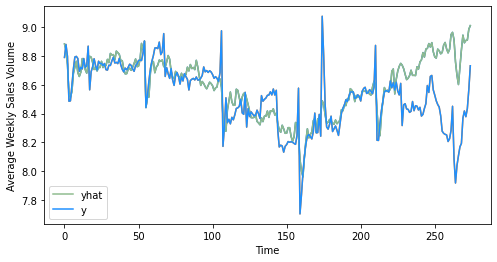

RMSE for prophet with transformation and holiday is: 1111.9139427141167


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [40]:
prophet_log_season(mcv_dig_250g_origin)

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


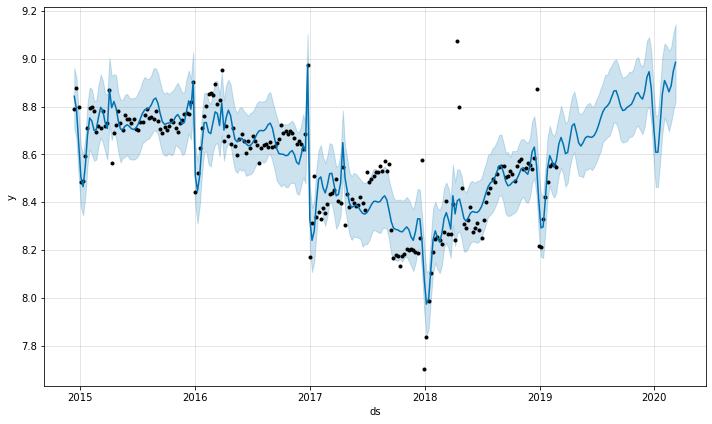

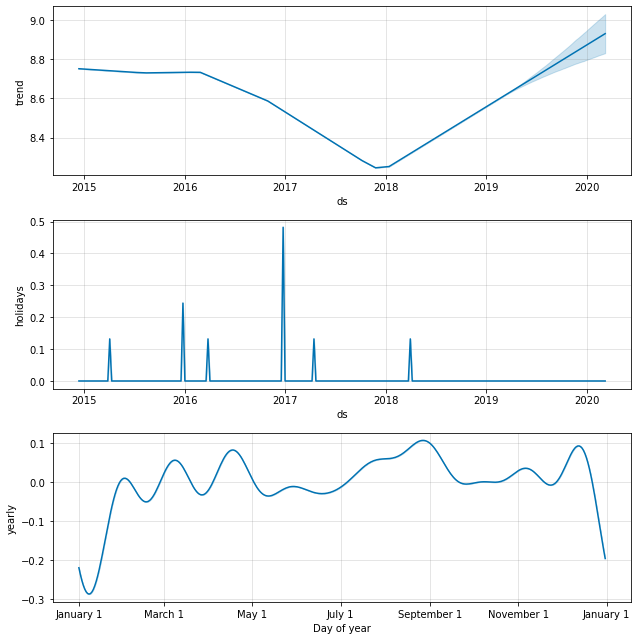

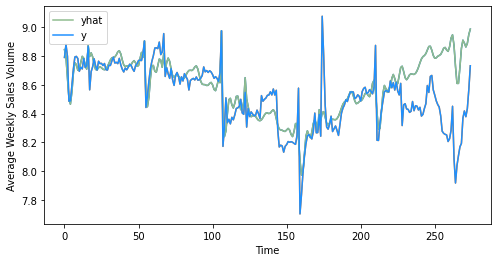

1063.619134552686


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [41]:
prophet_log_two_holiday(mcv_dig_250g_origin)

### Variables Analysis

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

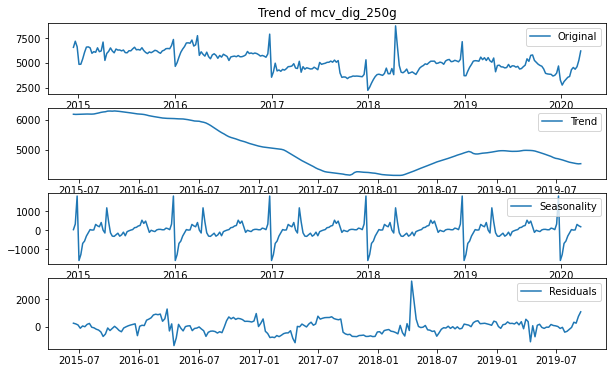

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

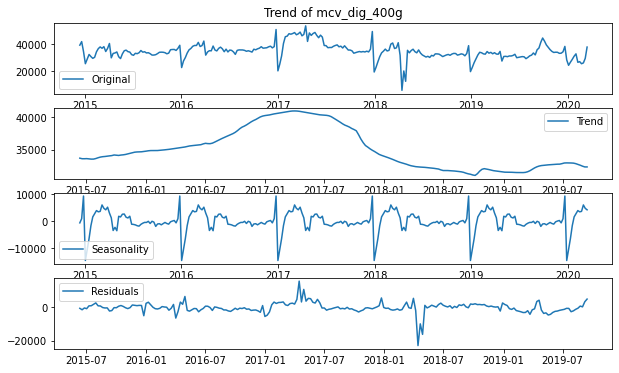

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

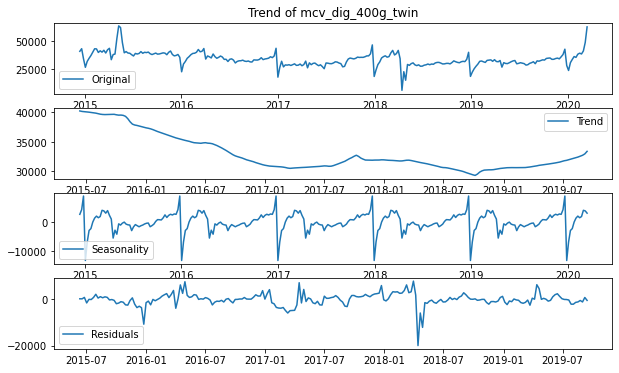

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

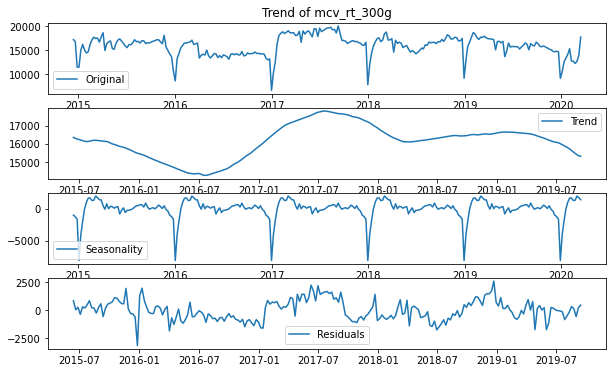

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin')

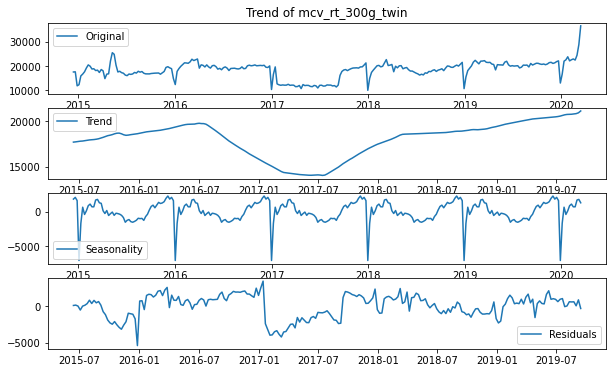

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

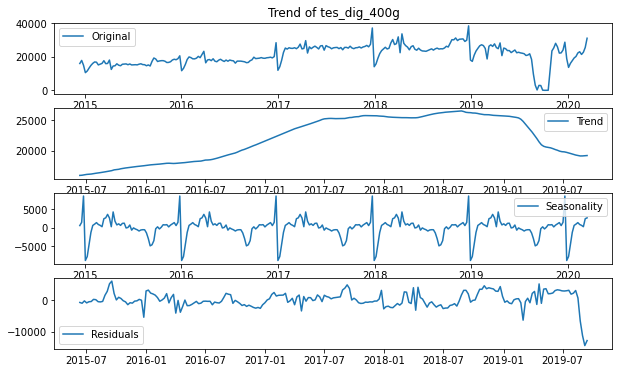

No enough datapoints for plotting the complete graphs


<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_molly_400g')

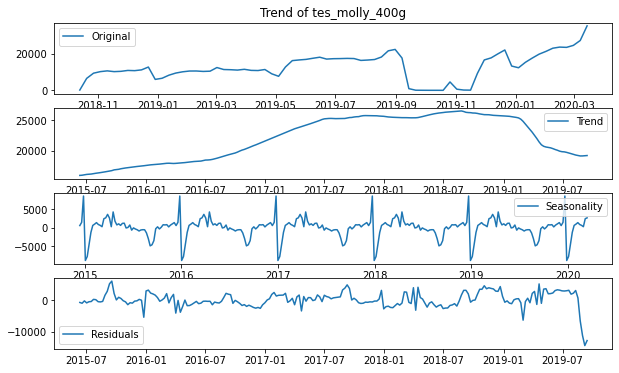

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

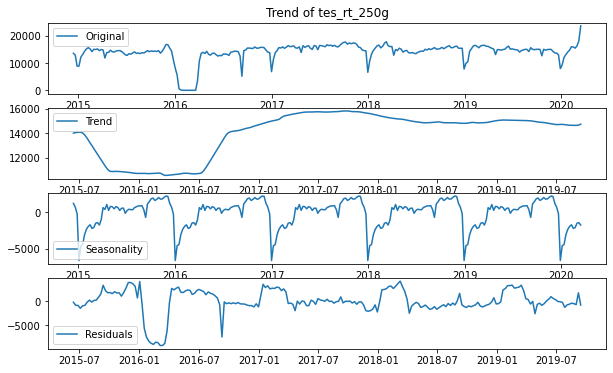

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

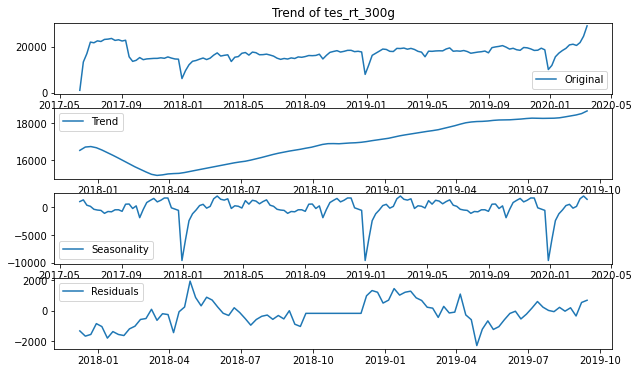

In [42]:
#decomposition for pladis products
from statsmodels.tsa.seasonal import seasonal_decompose

mcv_name=['mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin',
          'mcv_rt_300g','mcv_rt_300g_twin','tes_dig_400g',
          'tes_molly_400g', 'tes_rt_250g','tes_rt_300g'
         ]
#tes_large1 contains original dataset, only transform the date

tes_large2=[]
i=0
for df in tes_large1:
    df=df.set_index('Date')
    df=df[['Volume']]
    df = df.dropna()
    tes_large2.append(df)
    
    try:
        decomposition=seasonal_decompose(df)
    except ValueError:
        print('No enough datapoints for plotting the complete graphs')
   
    trend=decomposition.trend
    seasonal=decomposition.seasonal
    residual=decomposition.resid

    plt.figure(figsize=(10,6))
    plt.subplot(411)
    plt.plot(df, label='Original')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_name[i] )
    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal, label='Seasonality')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals')
    plt.legend(loc='best')
    plt.show()
    i=i+1

mcv_dig_250g_volume=tes_large2[0]
mcv_dig_400g_volume=tes_large2[1]
mcv_dig_400g_twin_volume=tes_large2[2]
mcv_rt_300g_volume=tes_large2[3]
mcv_rt_300g_twin_volume=tes_large2[4]
tes_dig_400g_volume=tes_large2[5]
tes_molly_400g_volume=tes_large2[6]
tes_rt_250g_volume=tes_large2[7]
tes_rt_300g_volume=tes_large2[8]

#### Compare trends with Pladis product and competitors' product

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

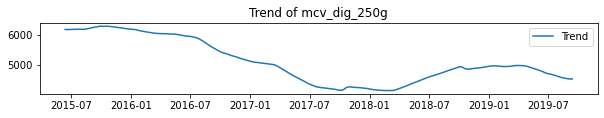

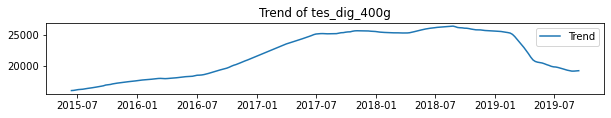

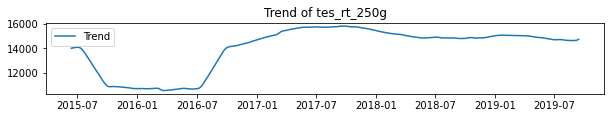

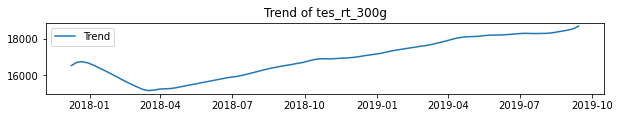

In [43]:
mcv_dig_250g_competitor=[mcv_dig_250g_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_dig_250g_competitor_list=['mcv_dig_250g','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_dig_400g_competitor=[mcv_dig_400g_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_dig_400g_competitor_list=['mcv_dig_400g','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_dig_400g_twin_competitor=[mcv_dig_400g_twin_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_dig_400g_twin_competitor_list=['mcv_dig_400g_twin','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_rt_300g_competitor=[mcv_rt_300g_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_rt_300g_competitor_list=['mcv_rt_300g','tes_dig_400g','tes_rt_250g','tes_rt_300g']
mcv_rt_300g_twin_competitor=[mcv_rt_300g_twin_volume,tes_dig_400g_volume,tes_rt_250g_volume,tes_rt_300g_volume]
mcv_rt_300g_twin_competitor_list=['mcv_rt_300g_twin','tes_dig_400g','tes_rt_250g','tes_rt_300g']

# product_name=['mcv_dig_250g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#              'mcv_dig_400g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_dig_400g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g'
#              ]

i=0
for product in mcv_dig_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_250g_competitor_list[i] )
    i=i+1
    

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

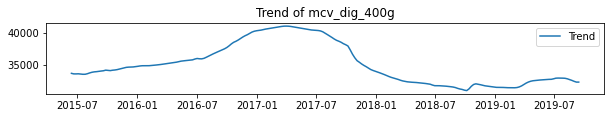

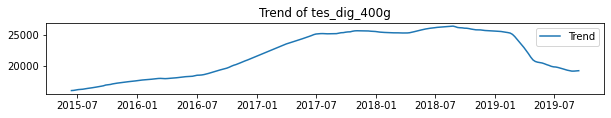

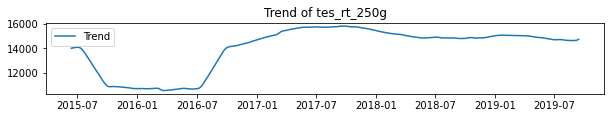

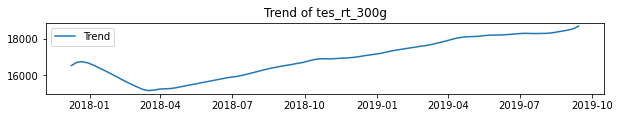

In [44]:
i=0
for product in mcv_dig_400g_competitor:
    decomposition=seasonal_decompose(product)
    trend_2=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_2, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_400g_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

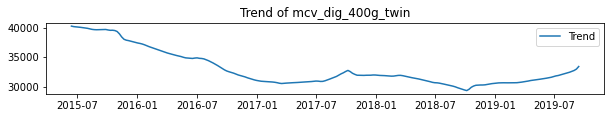

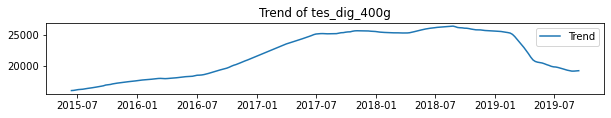

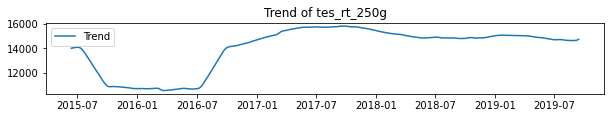

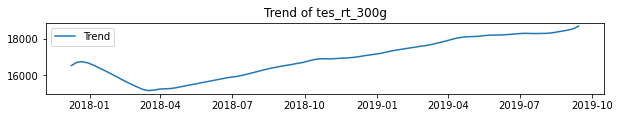

In [45]:
i=0
for product in mcv_dig_400g_twin_competitor:
    decomposition=seasonal_decompose(product)
    trend_3=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_3, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_400g_twin_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

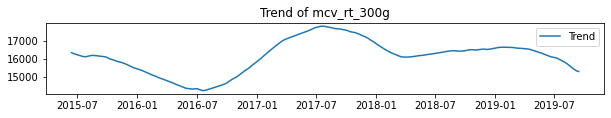

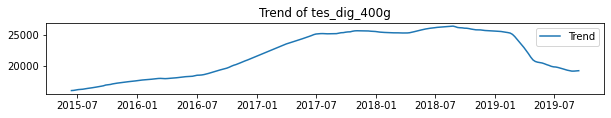

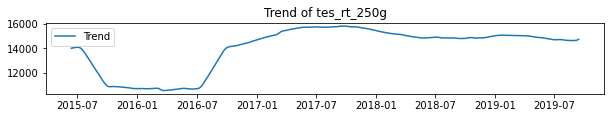

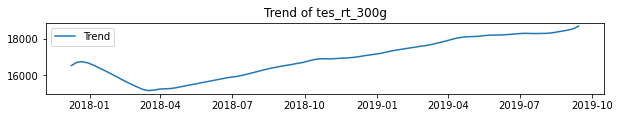

In [46]:
i=0
for product in mcv_rt_300g_competitor:
    decomposition=seasonal_decompose(product)
    trend_4=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_4, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_rt_300g_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_300g')

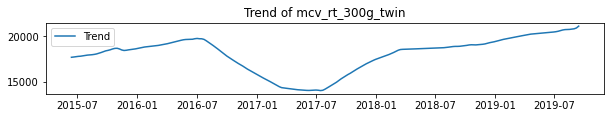

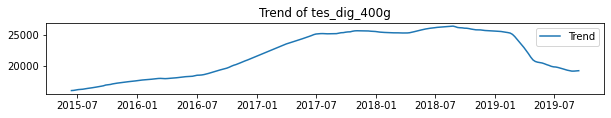

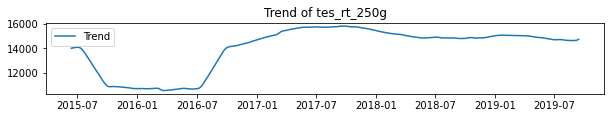

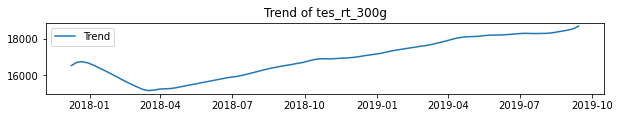

In [47]:
i=0
for product in mcv_rt_300g_twin_competitor:
    decomposition=seasonal_decompose(product)
    trend_5=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_5, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_rt_300g_twin_competitor_list[i])
    i=i+1

,mcv_dig_250g_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_dig_250g_trend,1.000000,-0.866579,-0.886110,0.609020
tes_dig_400g_trend,-0.866579,1.000000,0.791993,-0.795277
tes_rt_250g_trend,-0.886110,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.609020,-0.795277,-0.389964,1.000000


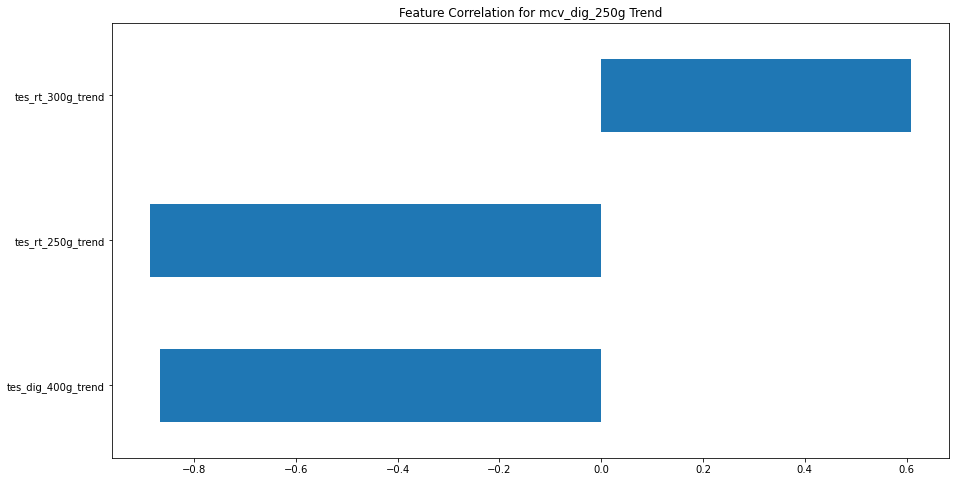

In [48]:
decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
trend_1=decomposition_1.trend
trend_1=trend_1.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# # datapoints are less than 104 observations
# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_dig_250g_comp=pd.merge(trend_1,comp_trend1, how='left', on='Date')
# mcv_dig_250g=pd.merge(mcv_dig_250g,comp_trend2, how='left', on='Date')
mcv_dig_250g_comp=pd.merge(mcv_dig_250g_comp,comp_trend3, how='left', on='Date')
mcv_dig_250g_comp=pd.merge(mcv_dig_250g_comp,comp_trend4, how='left', on='Date')
mcv_dig_250g_comp.columns=['mcv_dig_250g_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_dig_250g_comp.corr()

#correlation graph
mcv_dig_250g_comp_corr=mcv_dig_250g_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
mcv_dig_250g_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_dig_250g Trend",legend=False, figsize=(15, 8))


,mcv_dig_400g_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_dig_400g_trend,1.000000,-0.079756,0.073859,0.013966
tes_dig_400g_trend,-0.079756,1.000000,0.791993,-0.795277
tes_rt_250g_trend,0.073859,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.013966,-0.795277,-0.389964,1.000000


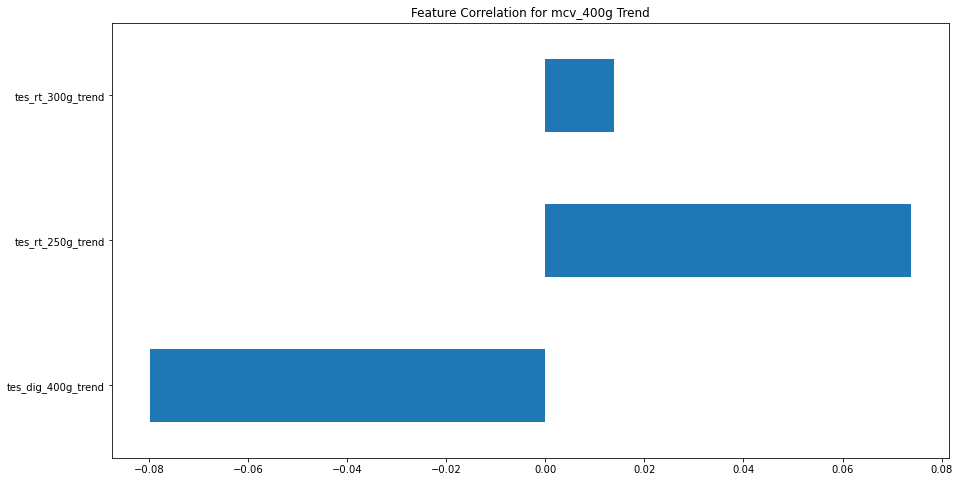

In [49]:
decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
trend_2=decomposition_2.trend
trend_2=trend_2.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_400g_comp=pd.merge(trend_2,comp_trend1, how='left', on='Date')
# mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend2, how='left', on='Date')
mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend3, how='left', on='Date')
mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend4, how='left', on='Date')
mcv_400g_comp.columns=['mcv_dig_400g_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_400g_comp.corr()

#correlation graph
mcv_dig_400g_comp_corr=mcv_400g_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
mcv_dig_400g_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_400g Trend",legend=False, figsize=(15, 8))



,mcv_dig_400g_twin_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_dig_400g_twin_trend,1.000000,-0.838641,-0.767722,0.159325
tes_dig_400g_trend,-0.838641,1.000000,0.791993,-0.795277
tes_rt_250g_trend,-0.767722,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.159325,-0.795277,-0.389964,1.000000


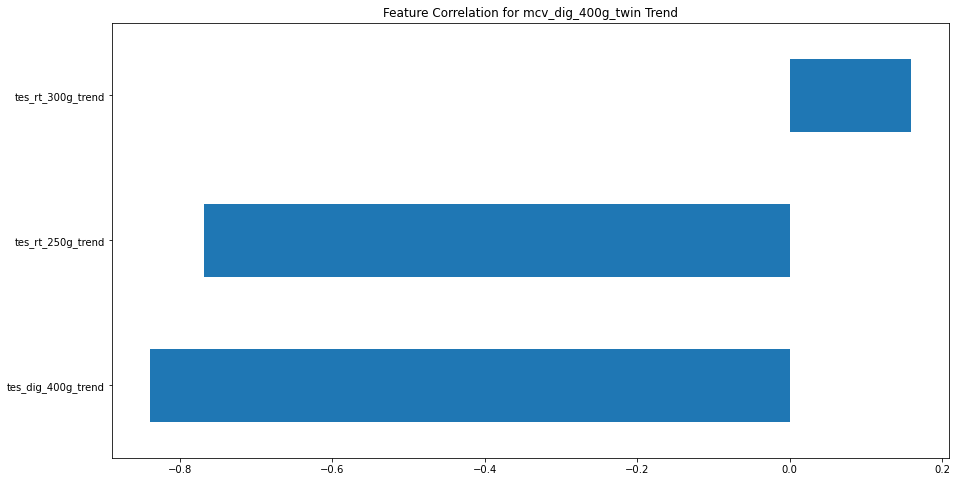

In [50]:
decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
trend_3=decomposition_3.trend
trend_3=trend_3.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_dig_400g_twin_comp=pd.merge(trend_3,comp_trend1, how='left', on='Date')
# mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend2, how='left', on='Date')
mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend3, how='left', on='Date')
mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend4, how='left', on='Date')
mcv_dig_400g_twin_comp.columns=['mcv_dig_400g_twin_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_dig_400g_twin_comp.corr()

#correlation graph
mcv_dig_400g_twin_comp_corr=mcv_dig_400g_twin_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
mcv_dig_400g_twin_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_dig_400g_twin Trend",legend=False, figsize=(15, 8))


,mcv_rt_300g_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_rt_300g_trend,1.000000,0.675009,0.760581,-0.195562
tes_dig_400g_trend,0.675009,1.000000,0.791993,-0.795277
tes_rt_250g_trend,0.760581,0.791993,1.000000,-0.389964
tes_rt_300g_trend,-0.195562,-0.795277,-0.389964,1.000000


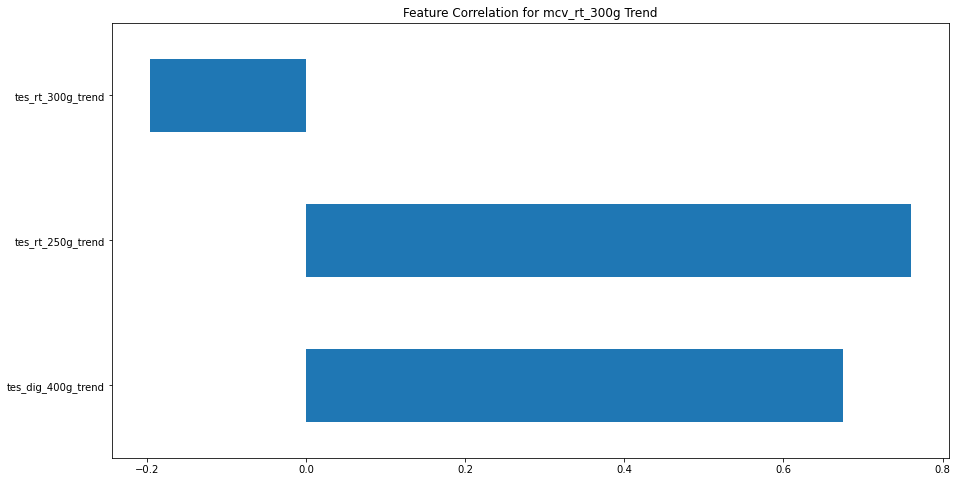

In [51]:
decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
trend_4=decomposition_4.trend
trend_4=trend_4.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_rt_300g_comp=pd.merge(trend_4,comp_trend1, how='left', on='Date')
# mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend2, how='left', on='Date')
mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend3, how='left', on='Date')
mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend4, how='left', on='Date')
mcv_rt_300g_comp.columns=['mcv_rt_300g_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']


mcv_rt_300g_comp.corr()

#correlation graph
mcv_rt_300g_comp_corr=mcv_rt_300g_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
mcv_rt_300g_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_rt_300g Trend",legend=False, figsize=(15, 8))



,mcv_rt_300g_twin_trend,tes_dig_400g_trend,tes_rt_250g_trend,tes_rt_300g_trend
mcv_rt_300g_twin_trend,1.000000,-0.299945,-0.394315,0.843504
tes_dig_400g_trend,-0.299945,1.000000,0.791993,-0.795277
tes_rt_250g_trend,-0.394315,0.791993,1.000000,-0.389964
tes_rt_300g_trend,0.843504,-0.795277,-0.389964,1.000000


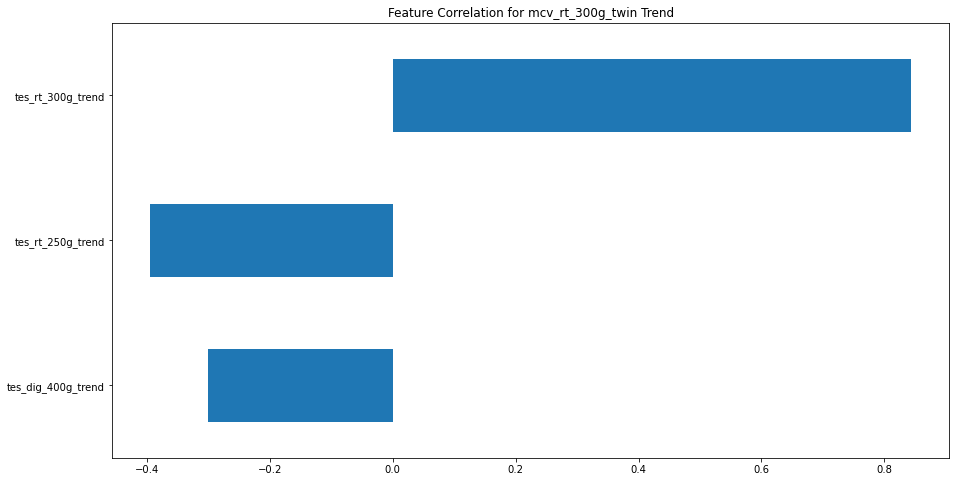

In [52]:
#mcv_rt_300g_twin trend correlation
decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
trend_5=decomposition_5.trend
trend_5=trend_5.to_frame()

comp_decomposition_1=seasonal_decompose(tes_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(tes_molly_400g)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(tes_rt_250g_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

mcv_rt_300g_twin_comp=pd.merge(trend_5,comp_trend1, how='left', on='Date')
# mcv_rt_300g_twin_comp=pd.merge(mcv_rt_300g_twin_comp,comp_trend2, how='left', on='Date')
mcv_rt_300g_twin_comp=pd.merge(mcv_rt_300g_twin_comp,comp_trend3, how='left', on='Date')
mcv_rt_300g_twin_comp=pd.merge(mcv_rt_300g_twin_comp,comp_trend4, how='left', on='Date')
mcv_rt_300g_twin_comp.columns=['mcv_rt_300g_twin_trend', 'tes_dig_400g_trend','tes_rt_250g_trend','tes_rt_300g_trend']

mcv_rt_300g_twin_comp.corr()

#correlation graph
mcv_rt_300g_twin_comp_corr=mcv_rt_300g_twin_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
mcv_rt_300g_twin_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_rt_300g_twin Trend",legend=False, figsize=(15, 8))



In [53]:
# #correlation graph
# mcv_rt_300g_twin_comp_corr=mcv_rt_300g_twin_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
# mcv_rt_300g_twin_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_rt_300g Trend",legend=False, figsize=(15, 8))



## Machine Learning Model

In [54]:
#extract own product variables: sales price distribution promotional week month quarter
def own_product_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
    x=x[['Volume','£/kg','Distribution','Promotional Distribution','year','quarter','month','week']]
    return x

mcv_dig_250g_own_variable=own_product_variables(mcv_dig_250g_origin)
mcv_dig_400g_own_variable=own_product_variables(mcv_dig_400g_origin)
mcv_dig_400g_twin_own_variable=own_product_variables(mcv_dig_400g_twin_origin)
mcv_rt_300g_own_variable=own_product_variables(mcv_rt_300g_origin)
mcv_rt_300g_twin_own_variable=own_product_variables(mcv_rt_300g_twin_origin)


In [55]:
mcv_dig_250g_with_comp_1=mcv_dig_250g_own_variable
mcv_dig_400g_with_comp_1=mcv_dig_400g_own_variable
mcv_dig_400g_twin_with_comp1=mcv_dig_400g_twin_own_variable
mcv_rt_300g_with_comp1=mcv_rt_300g_own_variable
mcv_rt_300g_twin_with_comp1=mcv_rt_300g_twin_own_variable

In [56]:
def comp_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
#     x=x.dropna(subset=['Volume'])
    x=x[['£/kg','Distribution']]
    return x

tesco_digs400g_price_dis=comp_variables(tes_dig_400g_origin)
tesco_rt250g_price_dis=comp_variables(tes_rt_250g_origin)
tesco_molly400g_price_dis=comp_variables(tes_molly_400g_origin)
tesco_rt300g_price_dis=comp_variables(tes_rt_300g_origin)

In [57]:
# compose competitors' variables as a list
competitor_list=[tesco_rt250g_price_dis, tesco_molly400g_price_dis, tesco_rt300g_price_dis, tesco_digs400g_price_dis]

variable_columns=['Volume','£/kg','Distribution','Promotional Distribution',
                  'year','quarter','month','week',
                   'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                   'tesco_digs400g_price_kg','tesco_dig400g_distribution'
                  ]

In [58]:
# mcv_dig_250g product
# each variable with their competitors
# merge own product variables with four competitors' variables
for variable in competitor_list:
    mcv_dig_250g_with_comp_1=mcv_dig_250g_with_comp_1.merge(variable, how='left', on='Date')
    mcv_dig_250g_with_comp=mcv_dig_250g_with_comp_1
    
#drop all missing values
mcv_dig_250g_with_comp.columns=variable_columns
mcv_dig_250g_with_comp=mcv_dig_250g_with_comp.dropna()
mcv_dig_250g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,,
2018-10-13,4850.3,3.559244,69,0,2018,4,10,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,5179.0,3.558718,69,0,2018,4,10,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,5293.5,3.557684,68,0,2018,4,10,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,5335.8,3.558061,68,0,2018,4,11,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,5111.3,3.557921,68,0,2018,4,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [59]:
# mcv_dig_400g product
for variable in competitor_list:
    mcv_dig_400g_with_comp_1=mcv_dig_400g_with_comp_1.merge(variable, how='left', on='Date')
    mcv_dig_400g_with_comp=mcv_dig_400g_with_comp_1
    
mcv_dig_400g_with_comp.columns=variable_columns
mcv_dig_400g_with_comp=mcv_dig_400g_with_comp.dropna()
mcv_dig_400g_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,,
2018-10-13,31698.0,2.501574,100,0,2018,4,10,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,32629.2,2.501698,100,0,2018,4,10,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,33110.0,2.501824,100,0,2018,4,10,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,33014.8,2.501599,100,0,2018,4,11,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,31830.0,2.501929,100,0,2018,4,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [60]:
#mcv_dig_400g_twin product
for variable in competitor_list:
    mcv_dig_400g_twin_with_comp1=mcv_dig_400g_twin_with_comp1.merge(variable, how='left', on='Date')
    mcv_dig_400g_twin_with_comp=mcv_dig_400g_twin_with_comp1
    
mcv_dig_400g_twin_with_comp.columns=variable_columns
mcv_dig_400g_twin_with_comp=mcv_dig_400g_twin_with_comp.dropna()
mcv_dig_400g_twin_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,,
2018-10-13,29722.4,2.361640,98,0,2018,4,10,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,30899.2,2.362333,98,0,2018,4,10,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,32409.6,2.362053,98,0,2018,4,10,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,31647.2,2.362421,98,0,2018,4,11,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,31065.6,2.361049,98,0,2018,4,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [61]:
#mcv_rt_300g product
for variable in competitor_list:
    mcv_rt_300g_with_comp1=mcv_rt_300g_with_comp1.merge(variable, how='left', on='Date')
    mcv_rt_300g_with_comp=mcv_rt_300g_with_comp1
    
mcv_rt_300g_with_comp.columns=variable_columns
mcv_rt_300g_with_comp=mcv_rt_300g_with_comp.dropna()
mcv_rt_300g_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,,
2018-10-13,16893.0,3.328089,100,0,2018,4,10,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,17493.9,3.330738,100,0,2018,4,10,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,18264.9,3.335835,100,0,2018,4,10,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,18000.0,3.332644,100,0,2018,4,11,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,17365.2,3.329135,100,0,2018,4,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


In [62]:
#mcv_rt_300g_twin product
for variable in competitor_list:
    mcv_rt_300g_twin_with_comp1=mcv_rt_300g_twin_with_comp1.merge(variable, how='left', on='Date')
    mcv_rt_300g_twin_with_comp=mcv_rt_300g_twin_with_comp1
    
mcv_rt_300g_twin_with_comp.columns=variable_columns
mcv_rt_300g_twin_with_comp=mcv_rt_300g_twin_with_comp.dropna()
mcv_rt_300g_twin_with_comp.head()

,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution
Date,,,,,,,,,,,,,,,,
2018-10-13,18062,3.15,98,0,2018,4,10,41,2.241567,100,0.775123,14.0,0.999896,83.0,1.125344,99
2018-10-20,19108,3.15,98,0,2018,4,10,42,2.241541,100,0.775011,57.0,0.999892,83.0,1.125224,99
2018-10-27,20010,3.15,98,0,2018,4,10,43,2.241566,100,0.774954,57.0,0.999978,83.0,1.125292,99
2018-11-03,19879,3.15,98,0,2018,4,11,44,2.241457,100,0.775021,57.0,0.999962,83.0,1.125552,99
2018-11-10,19467,3.15,98,0,2018,4,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99


### Random Forest Regressor

In [63]:
def variable_lag(df):
    df=pd.DataFrame(df)
    X_lag=df[['£/kg','Distribution','Promotional Distribution',
             'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                   'tesco_digs400g_price_kg','tesco_dig400g_distribution'
             ]]
    X_lagged=X_lag.shift(4)
    non_lag=df[['Volume','year','quarter','month','week']]
    final_df=pd.merge(X_lagged,non_lag,left_index=True, right_index=True)
    final_df=final_df.dropna()
    return final_df

In [64]:
def input_var(var):
#     for var in final_var_list:
    X=var[['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
                 'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                   'tesco_digs400g_price_kg','tesco_dig400g_distribution'
              ]].values
    y=var['Volume'].values
    return X,y

In [65]:
#train test split
from sklearn.model_selection import TimeSeriesSplit

def rf_regressor_mcv(X, y):
    splits = TimeSeriesSplit(n_splits=5)

    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler

        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        regressor = RandomForestRegressor(n_estimators=20, random_state=0)
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        print(cross_val_score(regressor, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
                 'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                                              'tesco_digs400g_price_kg','tesco_dig400g_distribution'
], 'importance': regressor.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of Random Forest Model",legend=False, figsize=(15, 8))

In [66]:
mcv_dig_250g_with_comp=variable_lag(mcv_dig_250g_with_comp)

In [67]:
mcv_dig_250g_input_X,mcv_dig_250g_input_Y=input_var(mcv_dig_250g_with_comp)

Observations: 27
Training Observations: 16
Testing Observations: 11
[ 7.02057142e-04 -5.44301277e+01 -2.64004446e+00 -3.50911823e+01
 -2.66503195e+01]
Mean Absolute Error: 467.5427272727269
Mean Squared Error: 310104.716145454
Root Mean Squared Error: 556.870466217642
Observations: 38
Training Observations: 27
Testing Observations: 11
[-20.07234717 -15.04329908 -20.48505792   0.10692317  -0.77818695]
Mean Absolute Error: 355.52409090909185
Mean Squared Error: 147186.7367431825
Root Mean Squared Error: 383.64923659924375
Observations: 49
Training Observations: 38
Testing Observations: 11
[ -3.06461318  -9.65113927  -0.02750857  -6.97871858 -25.46187132]
Mean Absolute Error: 494.16499999999945
Mean Squared Error: 399432.34818409017
Root Mean Squared Error: 632.0066045415113
Observations: 60
Training Observations: 49
Testing Observations: 11
[  0.04386998  -0.23799184 -16.47293567  -1.21452799  -3.62265006]
Mean Absolute Error: 1639.6700000000017
Mean Squared Error: 2984470.9104954596
Roo

<Figure size 432x288 with 0 Axes>

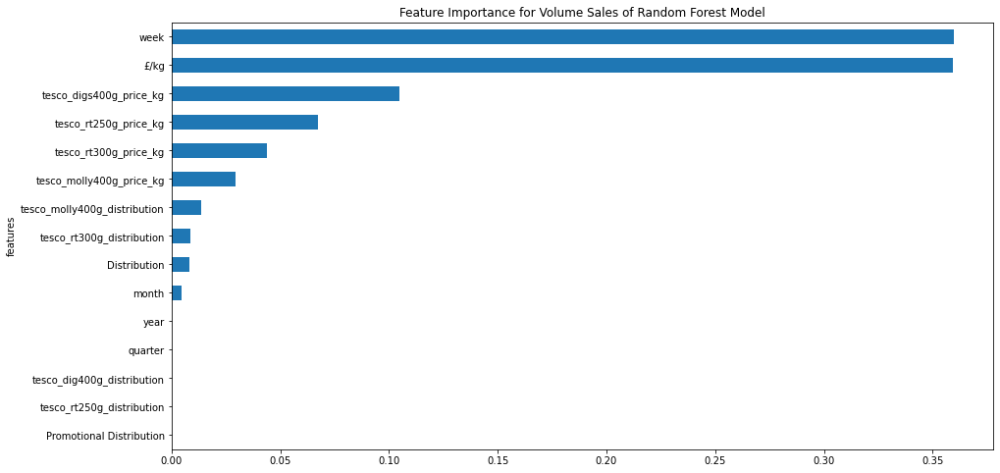

<Figure size 432x288 with 0 Axes>

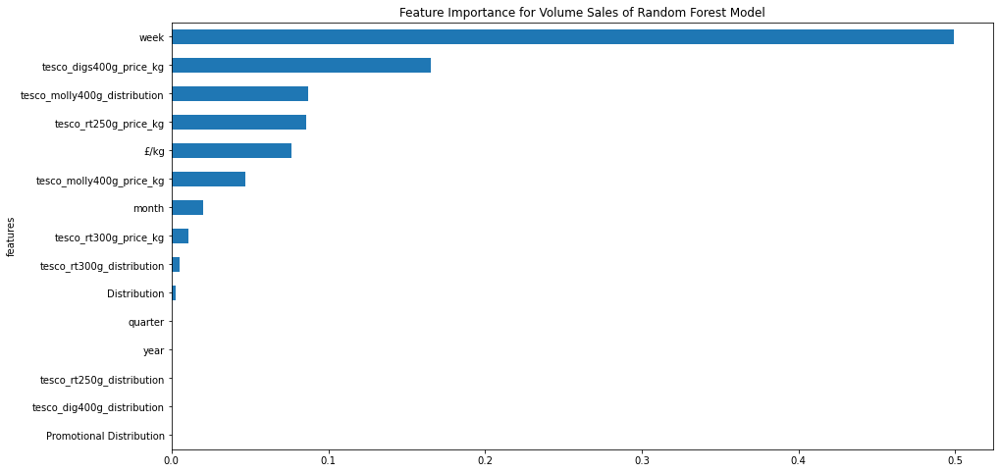

<Figure size 432x288 with 0 Axes>

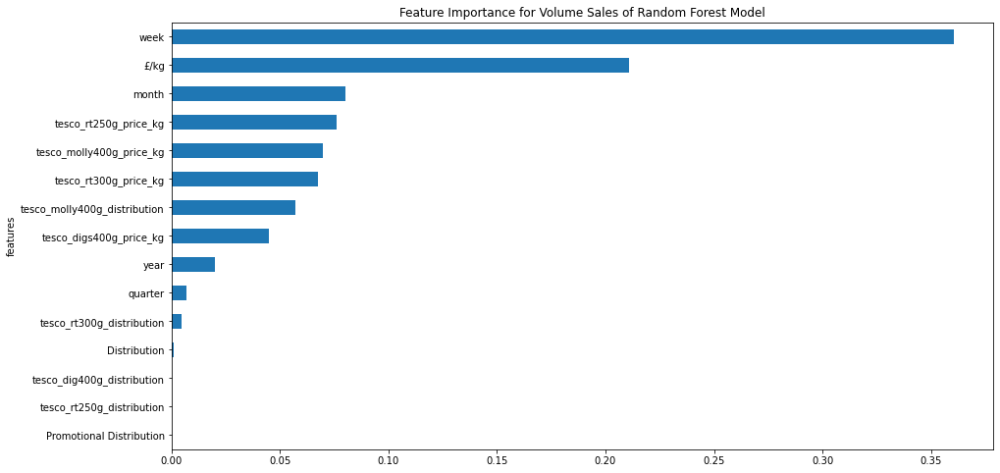

<Figure size 432x288 with 0 Axes>

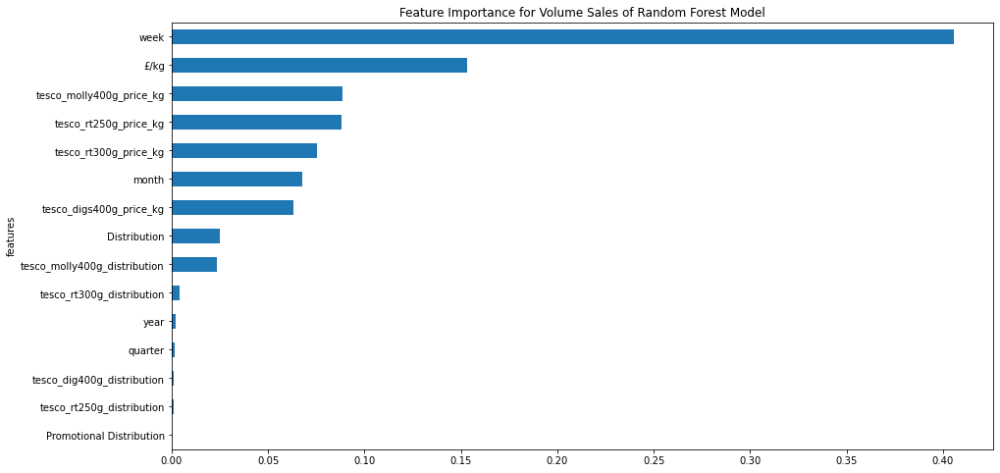

<Figure size 432x288 with 0 Axes>

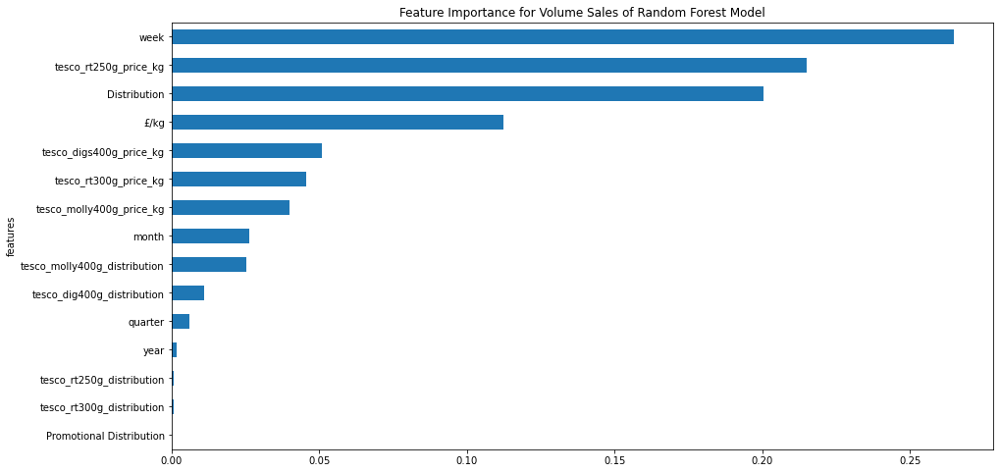

In [68]:
rf_regressor_mcv(mcv_dig_250g_input_X,mcv_dig_250g_input_Y)

### XGBoost Model

In [69]:
!pip3 install xgboost
from xgboost import XGBRegressor
import xgboost as xgb
# from sklearn.metrics import mean_squared_error



         .:::.     .::.       
        ....yy:    .yy.       
        :.  .yy.    y.        
             :y:   .:         
             .yy  .:          
              yy..:           
              :y:.            
              .y.             
             .:.              
        ....:.                
        :::.                  

• Project files and data should be stored in /project. This is shared among everyone
  in the project.
• Personal files and configuration should be stored in /home/faculty.
• Files outside /project and /home/faculty will be lost when this server is terminated.
• Create custom environments to setup your servers reproducibly.

  Using cached xgboost-1.1.1-py3-none-manylinux2010_x86_64.whl (127.6 MB)


In [70]:
def xgb_regressor_mcv(X, y):
    splits = TimeSeriesSplit(n_splits=5)
    
    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler


        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                    max_depth = 5, alpha = 10, n_estimators = 10)
        xg_reg.fit(X_train, y_train)
        y_pred = xg_reg.predict(X_test)
        print(cross_val_score(xg_reg, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
                 'tesco_rt250g_price_kg', 'tesco_rt250g_distribution',
                   'tesco_molly400g_price_kg','tesco_molly400g_distribution',
                   'tesco_rt300g_price_kg','tesco_rt300g_distribution',
                                              'tesco_digs400g_price_kg','tesco_dig400g_distribution'], 'importance': xg_reg.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of XGBoost Model",legend=False, figsize=(20, 13))


Observations: 27
Training Observations: 16
Testing Observations: 11
[-1.85992013e+00 -9.16640702e+00 -1.27734617e+02 -8.45577060e+03
 -1.23985415e+04]
Mean Absolute Error: 2107.844442471591
Mean Squared Error: 4664405.478320439
Root Mean Squared Error: 2159.7234726511724
Observations: 38
Training Observations: 27
Testing Observations: 11
[  -4.35979856 -181.65771358 -233.2616688  -143.45090301   -9.37288096]
Mean Absolute Error: 1355.4184303977272
Mean Squared Error: 1850890.4107180373
Root Mean Squared Error: 1360.4743329875935
Observations: 49
Training Observations: 38
Testing Observations: 11
[  -6.39332051 -236.64913766  -13.1129651  -119.43940839 -154.25546793]
Mean Absolute Error: 1905.808358487216
Mean Squared Error: 3816152.2146516372
Root Mean Squared Error: 1953.4974314422932
Observations: 60
Training Observations: 49
Testing Observations: 11
[ -24.70544984  -21.42445012 -133.50604802 -120.10577923  -33.86756622]
Mean Absolute Error: 806.0211337002842
Mean Squared Error: 7931

<Figure size 432x288 with 0 Axes>

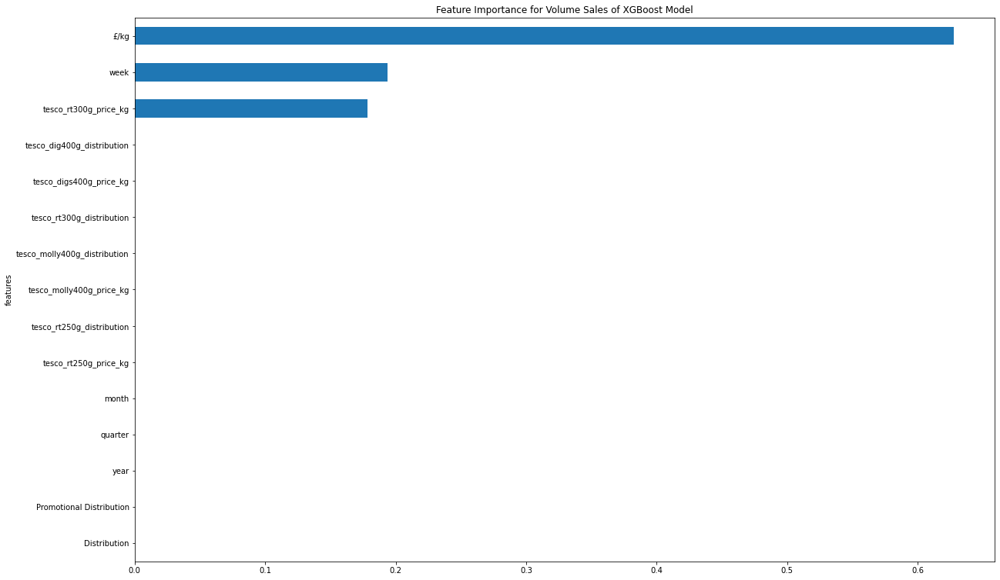

<Figure size 432x288 with 0 Axes>

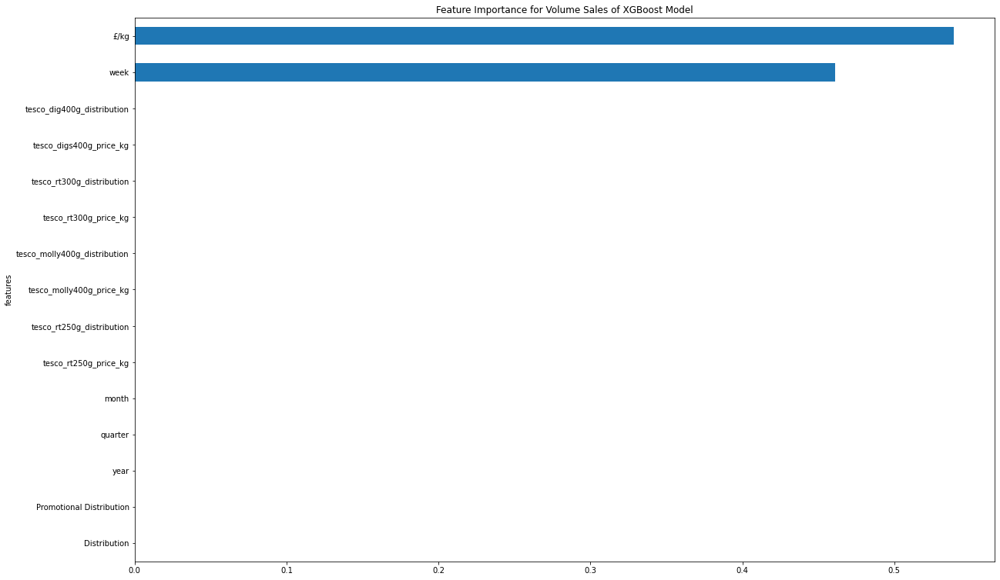

<Figure size 432x288 with 0 Axes>

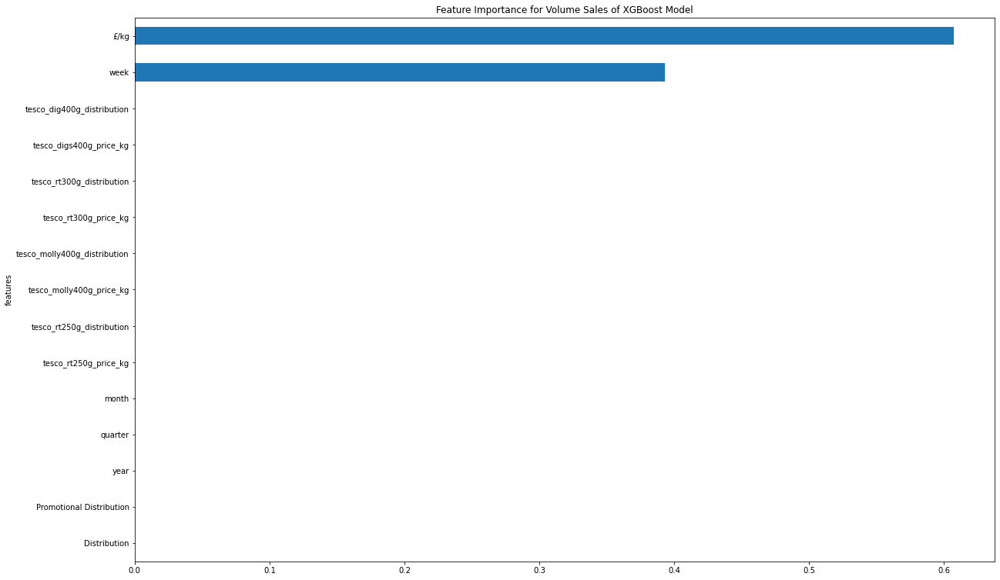

<Figure size 432x288 with 0 Axes>

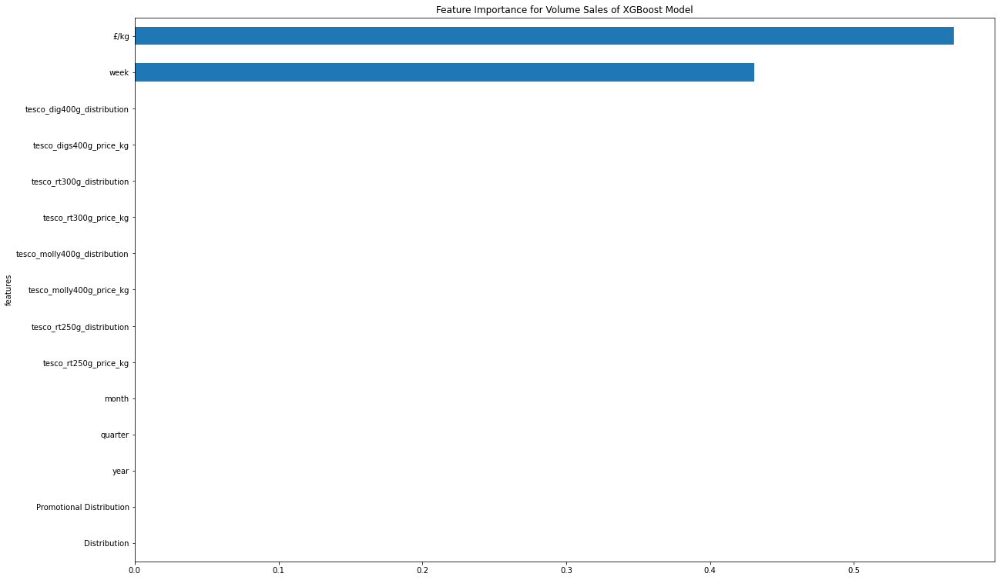

<Figure size 432x288 with 0 Axes>

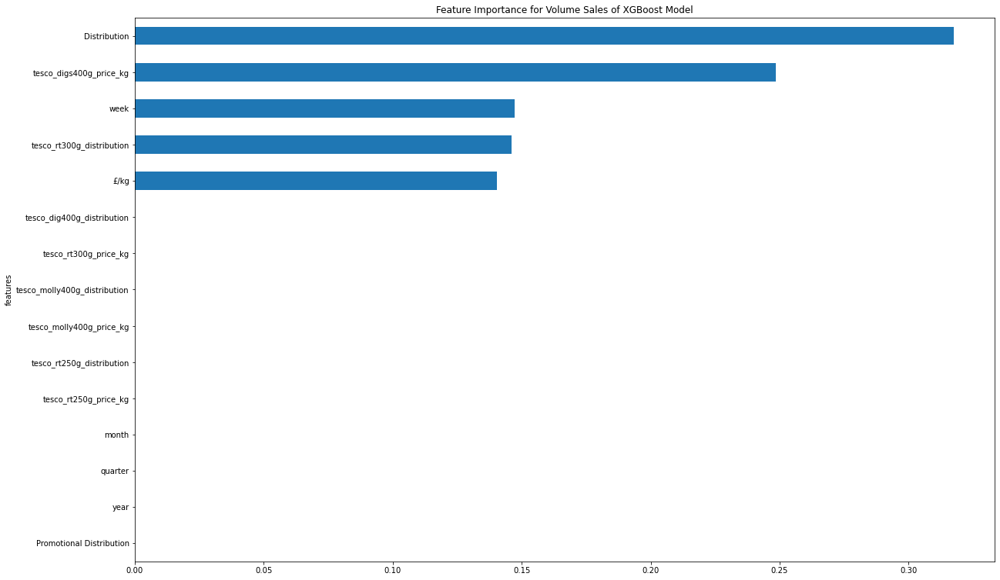

In [71]:
#dropna
xgb_regressor_mcv(mcv_dig_250g_input_X,mcv_dig_250g_input_Y)

### LSTM model

#### Univariate LSTM - Baseline Model

In [72]:
import numpy
import matplotlib.pyplot as plt
import pandas
import math
from pandas import DataFrame
from pandas import concat
!pip install tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


         .:::.     .::.       
        ....yy:    .yy.       
        :.  .yy.    y.        
             :y:   .:         
             .yy  .:          
              yy..:           
              :y:.            
              .y.             
             .:.              
        ....:.                
        :::.                  

• Project files and data should be stored in /project. This is shared among everyone
  in the project.
• Personal files and configuration should be stored in /home/faculty.
• Files outside /project and /home/faculty will be lost when this server is terminated.
• Create custom environments to setup your servers reproducibly.



/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it wi

In [73]:
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

In [74]:
# convert series to supervised learning
def series_to_supervised(data, n_in=4, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -4):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    if i == 0:
        names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
        names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
  # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [75]:
#def function version
def lstm_univariate(dataset):
    # load dataset
    values = dataset.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 4, 1)
    # drop columns we don't want to predict
    print(reframed.head())
    
    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
    
    # design network
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM univariate model loss vs. val loss',loc='center')
    plt.legend()
    plt.show()
    
    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

In [76]:
series_to_supervised(mcv_dig_250g_volume)

,var1(t-4),var1(t)
Date,,
2015-01-10,6563.0,4856.0
2015-01-17,7179.8,5394.5
2015-01-24,6617.0,6052.5
2015-01-31,4842.8,6581.5
2015-02-07,4856.0,6609.3
...,...,...
2020-02-15,3320.0,4527.5
2020-02-22,3530.0,4350.5
2020-02-29,3616.3,4605.0


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


   var1(t-4)   var1(t)
4   0.667107  0.405096
5   0.761780  0.487751
6   0.675395  0.588749
7   0.403070  0.669946
8   0.405096  0.674213
(216, 1, 1) (216,) (55, 1, 1) (55,)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 1s - loss: 0.4618 - val_loss: 0.3531
Epoch 2/50
216/216 - 0s - loss: 0.4513 - val_loss: 0.3430
Epoch 3/50
216/216 - 0s - loss: 0.4406 - val_loss: 0.3326
Epoch 4/50
216/216 - 0s - loss: 0.4297 - val_loss: 0.3219
Epoch 5/50
216/216 - 0s - loss: 0.4182 - val_loss: 0.3106
Epoch 6/50
216/216 - 0s - loss: 0.4063 - val_loss: 0.2988
Epoch 7/50
216/216 - 0s - loss: 0.3937 - val_loss: 0.2861
Epoch 8/50
216/216 - 0s - loss: 0.3803 - val_loss: 0.2727
Epoch 9/50
216/216 - 0s - loss: 0.3658 - val_loss: 0.2586
Epoch 10/50
216/216 - 0s - loss: 0.3502 - val_loss: 0.2433
Epoch 11/50
216/216 - 0s - loss: 0.3333 - val_loss: 0.2267
Epoch 12/50
216/216 - 0s - loss: 0.3149 - val_loss: 0.2091
Epoch 13/50
216/216 - 0s - loss: 0.2950 - val_loss: 0.1905
Epoch 14/50
216/216 - 0s - loss: 0.2733 - val_loss: 0.1712
Epoch 15/50
216/216 - 0s - loss: 0.2505 - val_loss: 0.1502
Epoch 16/50
216/216 - 0s - loss: 0.2271 - val_loss: 0.1286
Epoch 17/50
216/216 

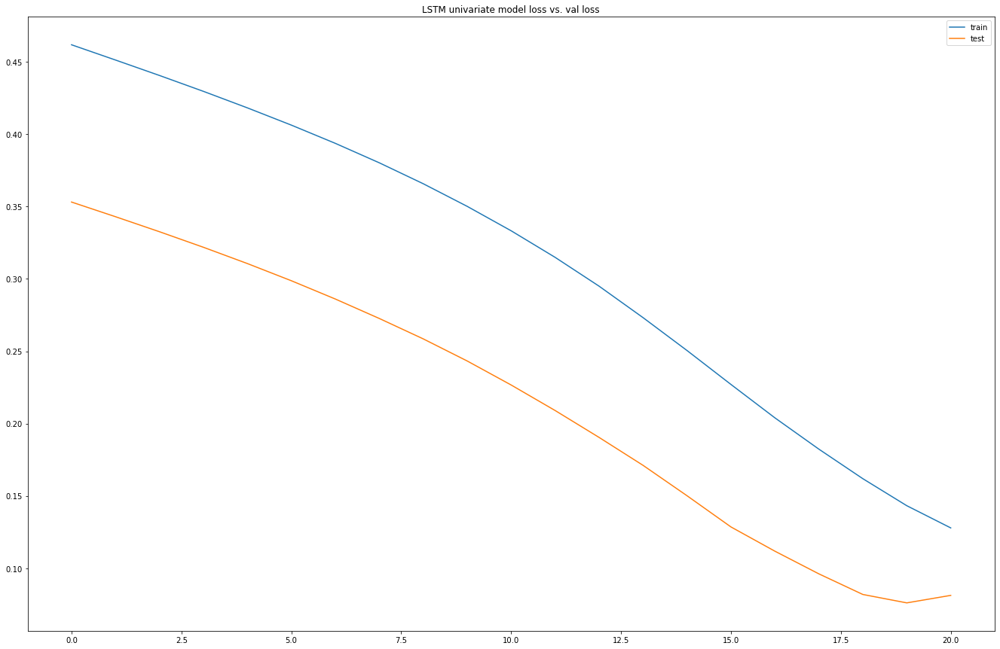

Test RMSE: 686.099


In [77]:
lstm_univariate(mcv_dig_250g_volume)

#### Multivariate LSTM - Without Competitors' Variables

In [78]:
# prepare data for lstm
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
# convert series to supervised learning
def series_to_supervised(data, n_in=4, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -4):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    if i == 0:
        names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
        names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
  # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg


In [79]:
def multivariate_lstm_without_competitor(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 4, 1)
    # drop columns we don't want to predict

    reframed.drop(reframed.columns[[9,10,11,12,13,14,15]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]

    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    # design network
    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model without competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    # make a prediction
    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

In [80]:
series_to_supervised(mcv_dig_250g_own_variable)

,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
Date,,,,,,,,,,,,,,,,
2015-01-10,6563.0,3.560262,97.0,0.0,2014.0,4.0,12.0,50.0,4856.0,3.559761,97,0,2015,1,1,2
2015-01-17,7179.8,3.560043,97.0,0.0,2014.0,4.0,12.0,51.0,5394.5,3.556789,97,0,2015,1,1,3
2015-01-24,6617.0,3.560118,97.0,0.0,2014.0,4.0,12.0,52.0,6052.5,3.555143,97,0,2015,1,1,4
2015-01-31,4842.8,3.560110,97.0,0.0,2015.0,1.0,1.0,1.0,6581.5,3.559082,97,0,2015,1,1,5
2015-02-07,4856.0,3.559761,97.0,0.0,2015.0,1.0,1.0,2.0,6609.3,3.555369,97,0,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,3320.0,3.595392,58.0,0.0,2020.0,1.0,1.0,3.0,4527.5,3.999050,58,0,2020,1,2,7
2020-02-22,3530.0,3.599547,58.0,0.0,2020.0,1.0,1.0,4.0,4350.5,3.999678,58,0,2020,1,2,8
2020-02-29,3616.3,3.599397,58.0,0.0,2020.0,1.0,2.0,5.0,4605.0,3.998827,58,0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.667107   0.227363   0.951219        0.0   0.000000        1.0   
5   0.761780   0.226979   0.951219        0.0   0.000000        1.0   
6   0.675395   0.227110   0.951219        0.0   0.000000        1.0   
7   0.403070   0.227096   0.951219        0.0   0.166656        0.0   
8   0.405096   0.226483   0.951219        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)   var1(t)  
4        1.0   0.942308  0.405096  
5        1.0   0.961538  0.487751  
6        1.0   0.980769  0.588749  
7        0.0   0.000000  0.669946  
8        0.0   0.019231  0.674213  
(216, 1, 8) (216,) (55, 1, 8) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 1s - loss: 0.4704 - val_loss: 0.3561
Epoch 2/50
216/216 - 0s - loss: 0.4468 - val_loss: 0.3343
Epoch 3/50
216/216 - 0s - loss: 0.4233 - val_loss: 0.3116
Epoch 4/50
216/216 - 0s - loss: 0.3989 - val_loss: 0.2877
Epoch 5/50
216/216 - 0s - loss: 0.3726 - val

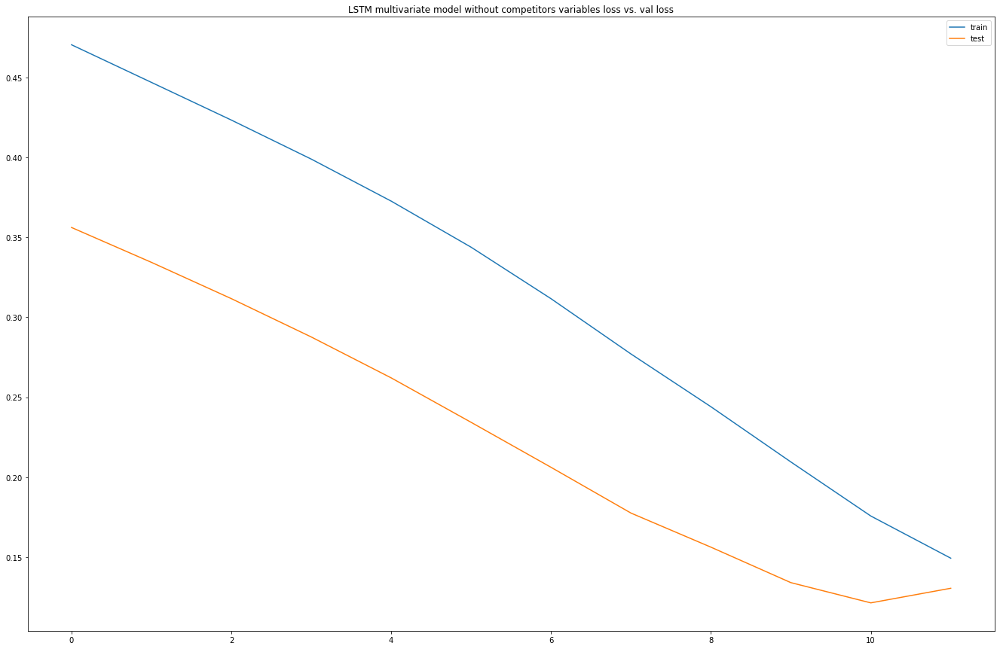

Test RMSE: 1116.071


In [81]:
multivariate_lstm_without_competitor(mcv_dig_250g_own_variable)

### LSTM Multivariate with Competitors'

In [82]:
mcv_dig_250g_with_comp.head()

,£/kg,Distribution,Promotional Distribution,tesco_rt250g_price_kg,tesco_rt250g_distribution,tesco_molly400g_price_kg,tesco_molly400g_distribution,tesco_rt300g_price_kg,tesco_rt300g_distribution,tesco_digs400g_price_kg,tesco_dig400g_distribution,Volume,year,quarter,month,week
Date,,,,,,,,,,,,,,,,
2018-11-10,3.559244,69.0,0.0,2.241567,100.0,0.775123,14.0,0.999896,83.0,1.125344,99.0,5111.3,2018,4,11,45
2018-11-17,3.558718,69.0,0.0,2.241541,100.0,0.775011,57.0,0.999892,83.0,1.125224,99.0,5140.5,2018,4,11,46
2018-11-24,3.557684,68.0,0.0,2.241566,100.0,0.774954,57.0,0.999978,83.0,1.125292,99.0,5248.8,2018,4,11,47
2018-12-01,3.558061,68.0,0.0,2.241457,100.0,0.775021,57.0,0.999962,83.0,1.125552,99.0,5186.0,2018,4,12,48
2018-12-08,3.557921,68.0,0.0,2.241417,100.0,0.774982,58.0,0.999921,83.0,1.125193,99.0,5098.3,2018,4,12,49


In [83]:
def series_to_supervised(data, n_in=4, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -4):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    if i == 0:
        names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
    else:
        names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
  # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg


In [84]:
def multivariate_with_competitor(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 4, 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model with competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)


In [85]:
series_to_supervised(mcv_dig_250g_with_comp)

,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-08,3.559244,69.0,0.0,2.241567,100.0,0.775123,14.0,0.999896,83.0,1.125344,...,58.0,0.999921,83.0,1.125193,99.0,5098.3,2018,4,12,49
2018-12-15,3.558718,69.0,0.0,2.241541,100.0,0.775011,57.0,0.999892,83.0,1.125224,...,58.0,0.999939,83.0,1.125797,99.0,5344.3,2018,4,12,50
2018-12-22,3.557684,68.0,0.0,2.241566,100.0,0.774954,57.0,0.999978,83.0,1.125292,...,58.0,0.999886,83.0,1.125535,99.0,7133.8,2018,4,12,51
2018-12-29,3.558061,68.0,0.0,2.241457,100.0,0.775021,57.0,0.999962,83.0,1.125552,...,58.0,0.999433,83.0,1.125242,99.0,3695.3,2018,4,12,52
2019-01-05,3.557921,68.0,0.0,2.241417,100.0,0.774982,58.0,0.999921,83.0,1.125193,...,58.0,0.999955,83.0,1.125299,99.0,3689.8,2019,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,3.599914,58.0,0.0,2.241395,100.0,0.774991,93.0,0.999984,83.0,1.250135,...,93.0,0.999908,83.0,1.250209,98.0,4527.5,2020,1,2,7
2020-02-22,3.599945,58.0,0.0,2.241631,100.0,0.774988,93.0,1.000000,82.0,1.250159,...,93.0,0.999957,83.0,1.250202,98.0,4350.5,2020,1,2,8
2020-02-29,3.599752,58.0,0.0,2.241635,100.0,0.774967,93.0,0.999933,83.0,1.250365,...,93.0,0.999954,83.0,1.250188,98.0,4605.0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.009902   1.000000        0.0   0.994400        1.0   0.980005   
5   0.008719   1.000000        0.0   0.993778        1.0   0.979163   
6   0.006395   0.909091        0.0   0.994396        1.0   0.978738   
7   0.007242   0.909091        0.0   0.991779        1.0   0.979244   
8   0.006927   0.909091        0.0   0.990829        1.0   0.978948   

   var7(t-4)  var8(t-4)  var9(t-4)  var10(t-4)  var11(t-4)  var12(t-4)  \
4   0.136842   0.982941        0.5    0.760128         1.0    0.539031   
5   0.589474   0.982361        0.5    0.759899         1.0    0.545687   
6   0.589474   0.995712        0.5    0.760028         1.0    0.570370   
7   0.589474   0.993225        0.5    0.760529         1.0    0.556057   
8   0.600000   0.986877        0.5    0.759839         1.0    0.536068   

   var13(t-4)  var14(t-4)  var15(t-4)  var16(t-4)   var1(t)  
4         0.0         1.0    0.909091    0.862745  0.006927  
5   

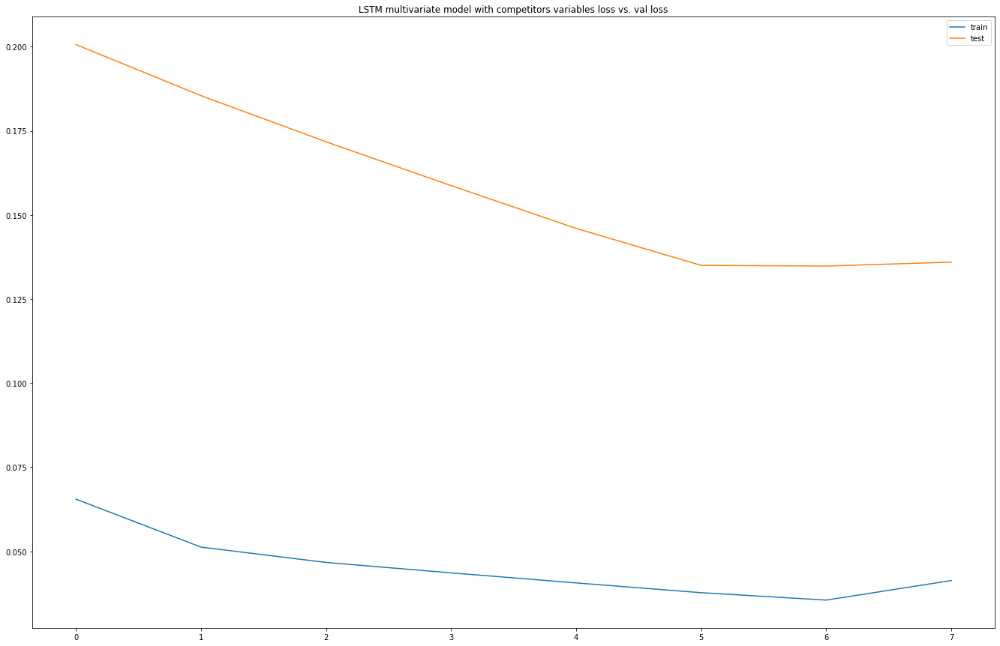

Test RMSE: 0.151


In [86]:
multivariate_with_competitor(mcv_dig_250g_with_comp)

### Tesco Large - McVitie's Digestives 400g

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,78347,39173.5,79616.2,100,0,1.016200,2.032399,2014,4,12,50
1,2014-12-20,83568,41784.0,84988.2,100,0,1.016995,2.033989,2014,4,12,51
2,2014-12-27,68893,34446.5,70350.9,100,0,1.021162,2.042324,2014,4,12,52
3,2015-01-03,51032,25516.0,52059.5,100,0,1.020134,2.040269,2015,1,1,1
4,2015-01-10,57749,28874.5,58890.2,100,0,1.019761,2.039523,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,75168.345455,34708.030182,76682.187636,99.418182,0.0,1.019348,2.219072,2017.083636,2.469091,6.414545,26.043636
std,12253.884201,5818.124410,12669.131085,4.666588,0.0,0.055092,0.260179,1.534371,1.140635,3.547767,15.490223
min,11859.000000,5929.500000,8659.900000,32.000000,0.0,0.688175,1.376351,2014.000000,1.000000,1.000000,1.000000
25%,68407.000000,31948.000000,70161.900000,100.000000,0.0,1.000520,2.001226,2016.000000,1.000000,3.000000,12.000000
50%,74856.000000,34194.500000,77097.200000,100.000000,0.0,1.000696,2.201081,2017.000000,2.000000,6.000000,26.000000
75%,81863.000000,37139.250000,83212.100000,100.000000,0.0,1.030717,2.501570,2018.000000,3.500000,9.500000,39.500000
95%,95479.400000,46621.200000,95618.290000,100.000000,0.0,1.100870,2.501947,2019.000000,4.000000,12.000000,50.000000
99%,103800.840000,48888.840000,107197.874000,100.000000,0.0,1.190843,2.977107,2020.000000,4.000000,12.000000,52.000000
max,111030.000000,53374.000000,112421.200000,100.000000,0.0,1.191022,2.977555,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

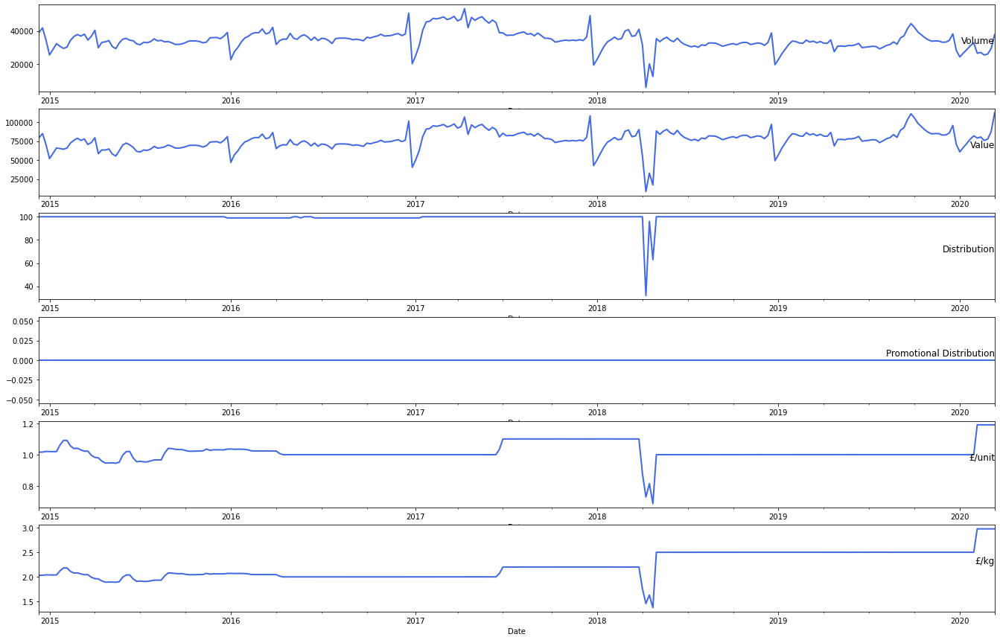

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31bf012358>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31beffca90>)

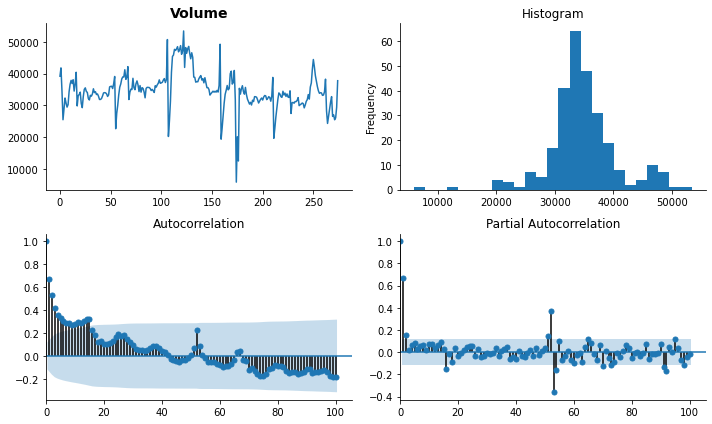

In [87]:
basic_info(mcv_dig_400g_origin)
plot_data(mcv_dig_400g_origin)
tsplot(mcv_dig_400g_origin['Volume'].dropna(), title=mcv_dig_400g_origin.columns[2], lags=100)


Test Statistic                -5.782802e+00
p-value                        5.079624e-07
#Lags Used                     1.000000e+00
Number of Observations Used    2.730000e+02
Critical Value (1%)           -3.454533e+00
Critical Value (5%)           -2.872186e+00
Critical Value (10%)          -2.572443e+00
dtype: float64


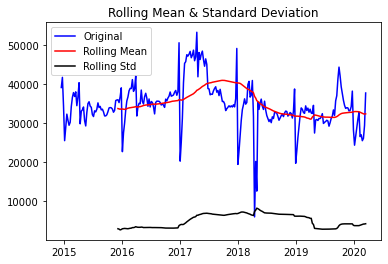

In [88]:
plot(mcv_dig_400g_origin)

#plot stationary graph
# series_transformed=mcv_dig_400g_origin.copy()
# series_transformed['Volume_transformed']=np.log(mcv_dig_400g_origin.Volume).diff(1)
# tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)
# plot_transform(mcv_dig_400g_origin)

       t-4      t+1
0      NaN  39173.5
1      NaN  41784.0
2      NaN  34446.5
3      NaN  25516.0
4  39173.5  28874.5
Test MSE: 21256610.700
Test RMSE: 4610.489


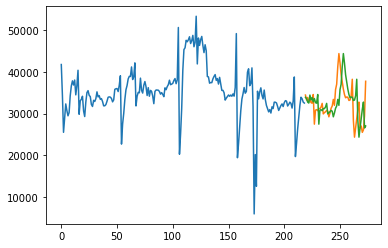

Observations: 271
Training Observations: 216
Testing Observations: 55


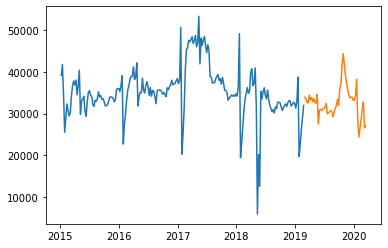

RMSE for Simple Exponential Smoothing α= 0.1 is: 4457.08
RMSE for Simple Exponential Smoothing α= 0.2 is: 5019.66
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 5213.61
RMSE for Simple Exponential Smoothing α= 0.4 is: 5097.04
RMSE for Simple Exponential Smoothing α= 0.5 is: 4815.19
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 4496.78
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 4223.07
RMSE for Simple Exponential Smoothing α= 0.8 is: 4024.97
RMSE for Simple Exponential Smoothing α= 0.9 is: 3897.46


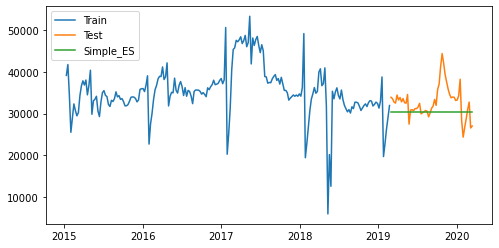

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 4716.35
Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.7000000000000001 and β= 0.1 is: 3936.74


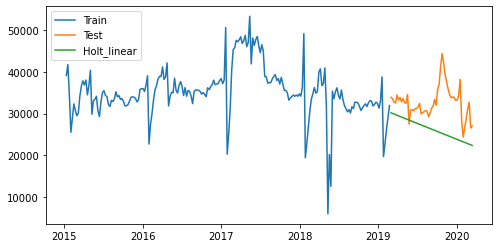

Observations: 275
Training Observations: 204
Testing Observations: 59


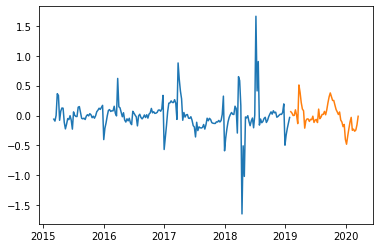

             Volume    pred_value
Date                             
2019-02-02  33932.0  30964.393046
2019-02-09  33574.4  30297.016175
2019-02-16  32764.8  29237.322970
2019-02-23  32535.2  28709.263409
2019-03-02  34455.2  30065.043029
2019-03-09  33267.6  28705.625253
2019-03-16  33879.6  28908.283119
2019-03-23  32824.4  27696.143895
2019-03-30  33608.8  28042.323960
2019-04-06  32637.6  26928.843151
2019-04-13  32506.0  26521.708512
2019-04-20  34588.8  27906.922551
2019-04-27  27474.0  21919.812312
2019-05-04  30836.8  24328.914193
2019-05-11  30958.8  24153.275023
2019-05-18  30700.8  23685.365218
2019-05-25  31223.6  23820.553754
2019-06-01  31192.0  23531.552790
2019-06-08  31597.6  23572.190721
2019-06-15  32459.6  23945.697858
2019-06-22  29940.8  21841.689064
2019-06-29  30234.0  21810.062698
2019-07-06  30444.0  21717.083638
2019-07-13  30760.4  21698.527088
2019-07-20  30580.4  21331.427683
2019-07-27  29236.8  20167.175774
2019-08-03  30151.2  20566.402618
2019-08-10  31

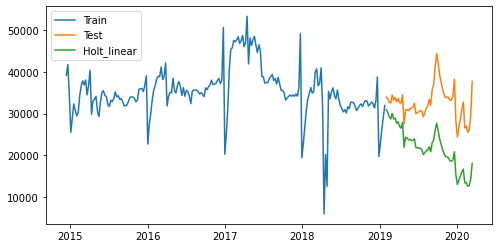

RMSE for Holt Linear Forecasting with transformation is: 11459.618531439128


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/

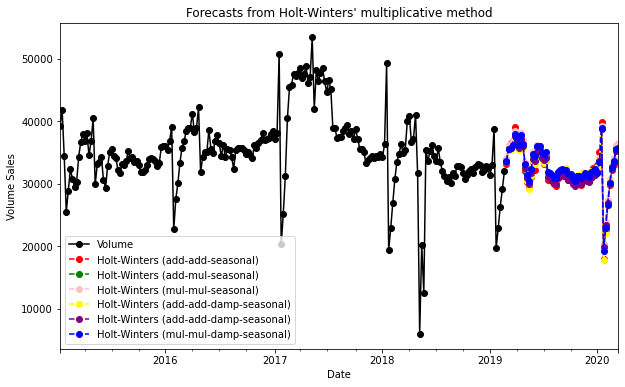

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
4740.254302263319
4688.694204401072
4746.067553672114
4378.859902874493
4647.796074966063
4552.730591435354


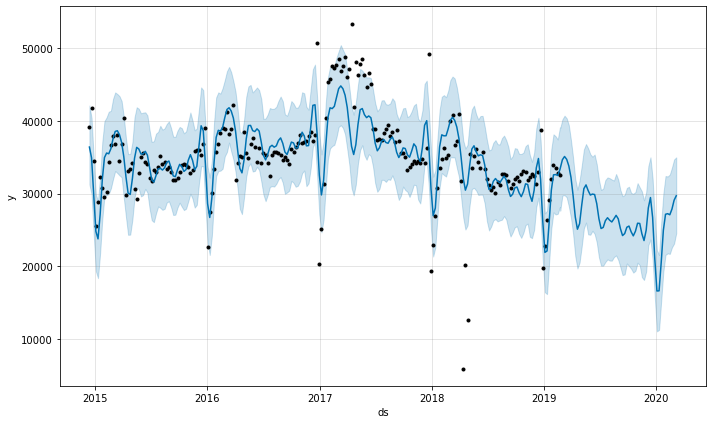

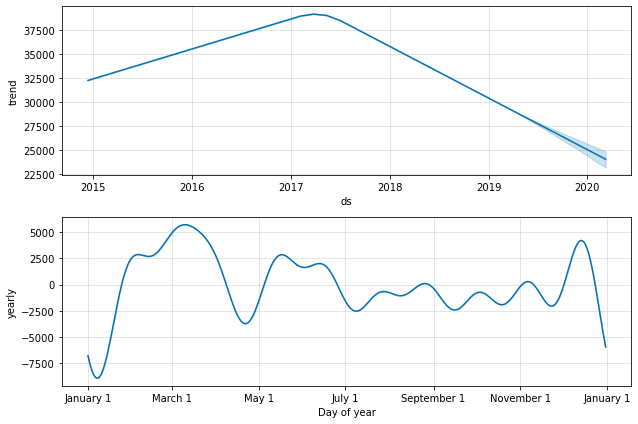

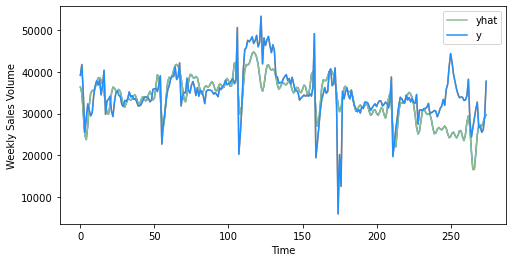

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 5048.407437410792


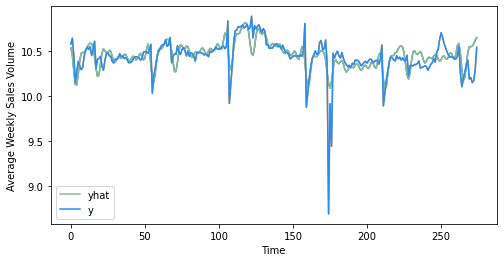

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 4174.285950060743
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

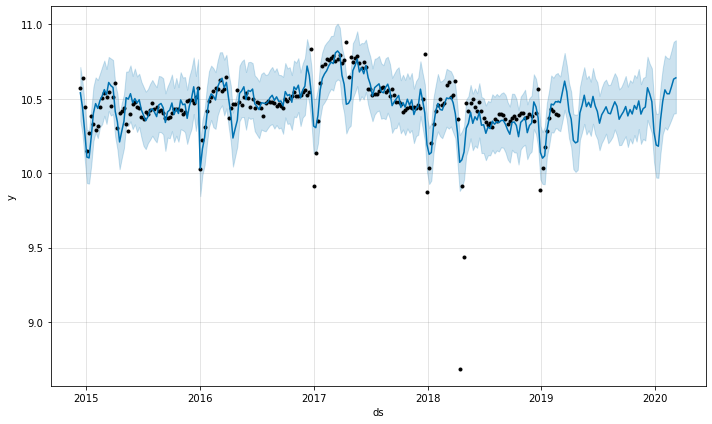

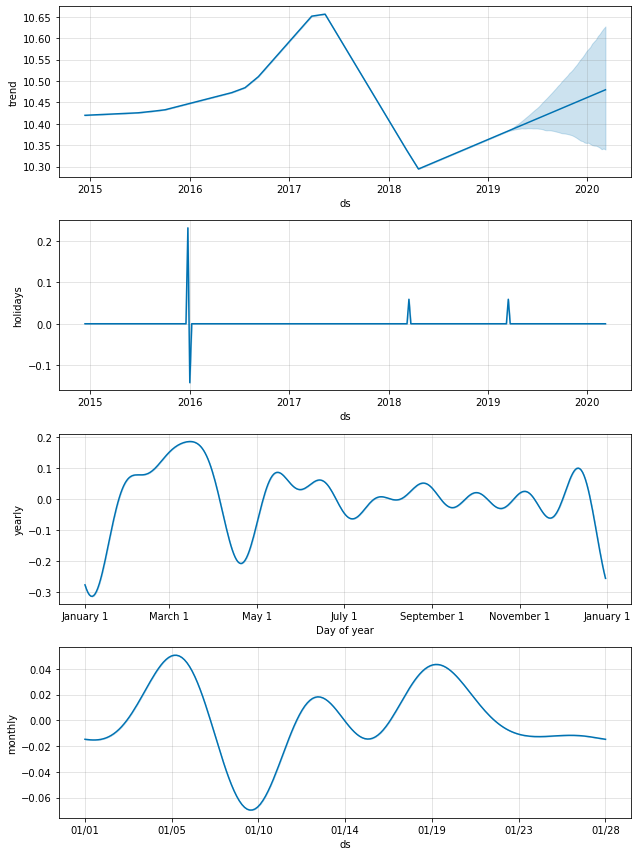

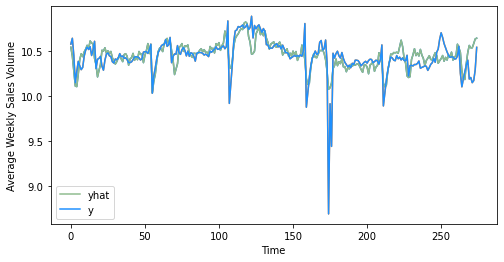

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 4186.581503045961


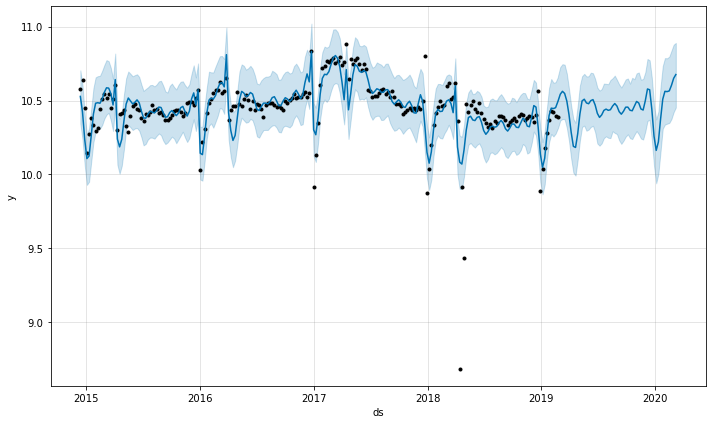

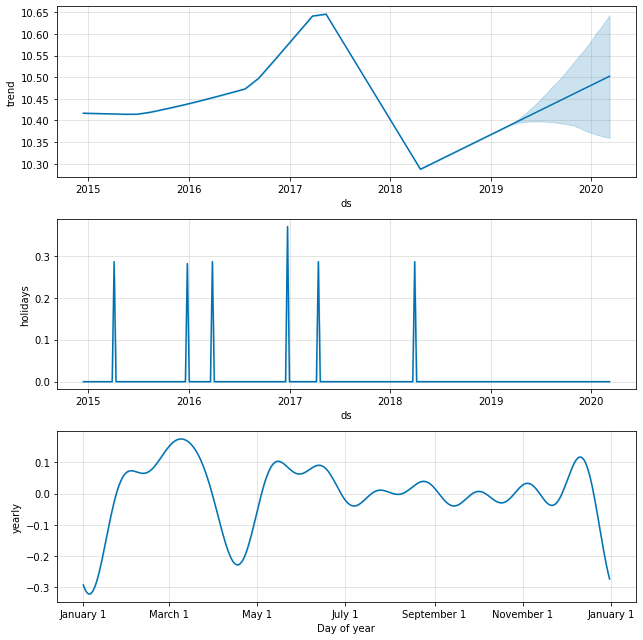

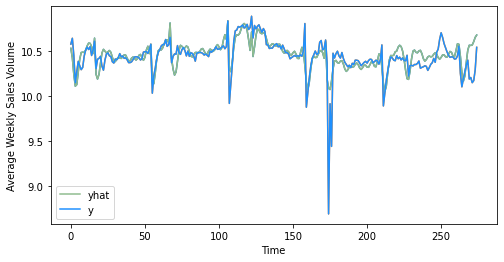

4004.8712115929848


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [89]:
# #plot stationary graph
# series_transformed=mcv_dig_400g_origin.copy()
# series_transformed['Volume_transformed']=np.log(mcv_dig_400g_origin.Volume).diff(1)
# tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_250g_origin.columns[2], lags=100)
# plot_transform(mcv_dig_400g_origin)

#time series models
baseline_model(mcv_dig_400g_origin)
ses_model(mcv_dig_400g_origin)
holt_linear_model(mcv_dig_400g_origin)
holt_linear_model_log(mcv_dig_400g_origin)
holt_winter_model(mcv_dig_400g_origin)
prophet_model(mcv_dig_400g_origin)
prophet_model_log(mcv_dig_400g_origin)
prophet_log_season(mcv_dig_400g_origin)
prophet_log_two_holiday(mcv_dig_400g_origin)


Observations: 27
Training Observations: 15
Testing Observations: 12
[  0.24651044  -2.65500654  -1.49000143 -56.30228958  -3.56447908]
Mean Absolute Error: 4570.145000000004
Mean Squared Error: 21556178.54530004
Root Mean Squared Error: 4642.863183995415
Observations: 39
Training Observations: 27
Testing Observations: 12
[-2.46497860e-01 -5.75764153e+00 -3.49818786e+01 -3.22791502e+00
  8.80002951e-03]
Mean Absolute Error: 3070.7966666666603
Mean Squared Error: 15187936.707533315
Root Mean Squared Error: 3897.1703462298533
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.35146047 -28.54888146   0.22132457  -4.99363945  -0.40151376]
Mean Absolute Error: 3229.471666666668
Mean Squared Error: 23900576.935100008
Root Mean Squared Error: 4888.821630526114
Observations: 63
Training Observations: 51
Testing Observations: 12
[-0.7326092  -1.85659591 -5.43060103 -2.66976823 -0.74050454]
Mean Absolute Error: 1963.5466666666691
Mean Squared Error: 5656129.200000008
Root Me

,var1(t-4),var1(t)
Date,,
2015-01-10,39173.5,28874.5
2015-01-17,41784.0,32329.0
2015-01-24,34446.5,30754.0
2015-01-31,25516.0,29475.5
2015-02-07,28874.5,30237.0
...,...,...
2020-02-15,28730.4,27026.8
2020-02-22,31036.0,25507.2
2020-02-29,32767.6,26099.6


   var1(t-4)   var1(t)
4   0.700692  0.483618
5   0.755715  0.556429
6   0.601060  0.523232
7   0.412830  0.496285
8   0.483618  0.512336
(216, 1, 1) (216,) (55, 1, 1) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 2s - loss: 0.6047 - val_loss: 0.5393
Epoch 2/50
216/216 - 0s - loss: 0.5927 - val_loss: 0.5274
Epoch 3/50
216/216 - 0s - loss: 0.5805 - val_loss: 0.5151
Epoch 4/50
216/216 - 0s - loss: 0.5678 - val_loss: 0.5023
Epoch 5/50
216/216 - 0s - loss: 0.5544 - val_loss: 0.4887
Epoch 6/50
216/216 - 0s - loss: 0.5403 - val_loss: 0.4743
Epoch 7/50
216/216 - 0s - loss: 0.5253 - val_loss: 0.4589
Epoch 8/50
216/216 - 0s - loss: 0.5091 - val_loss: 0.4423
Epoch 9/50
216/216 - 0s - loss: 0.4916 - val_loss: 0.4242
Epoch 10/50
216/216 - 0s - loss: 0.4728 - val_loss: 0.4046
Epoch 11/50
216/216 - 0s - loss: 0.4523 - val_loss: 0.3832
Epoch 12/50
216/216 - 0s - loss: 0.4299 - val_loss: 0.3597
Epoch 13/50
216/216 - 0s - loss: 0.4053 - val_loss: 0.3340
Epoch 14/50
216/216 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

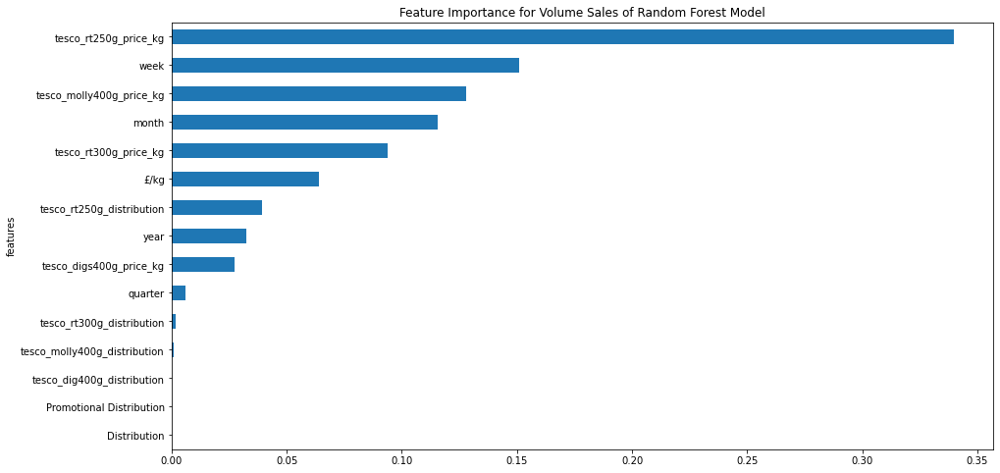

<Figure size 432x288 with 0 Axes>

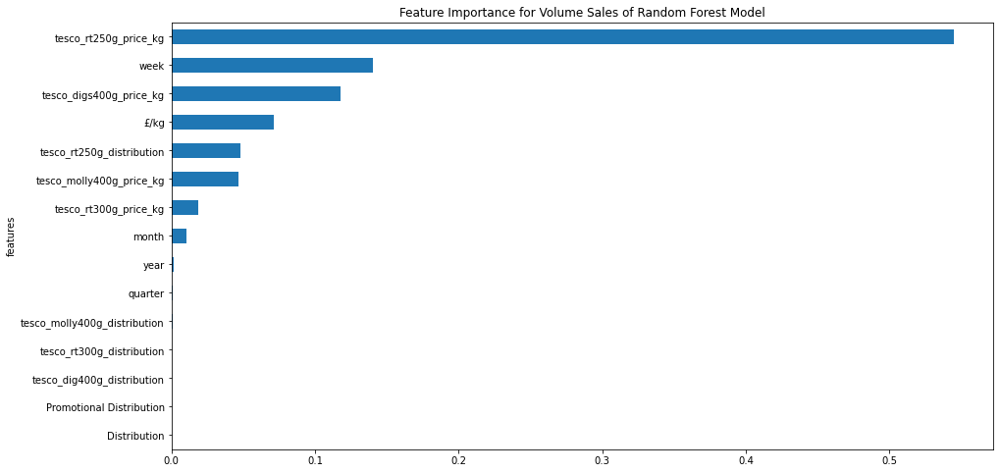

<Figure size 432x288 with 0 Axes>

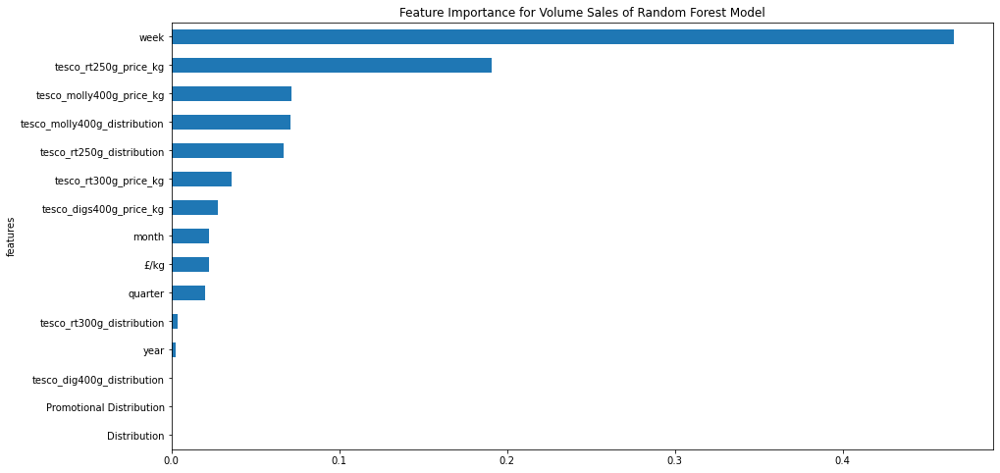

<Figure size 432x288 with 0 Axes>

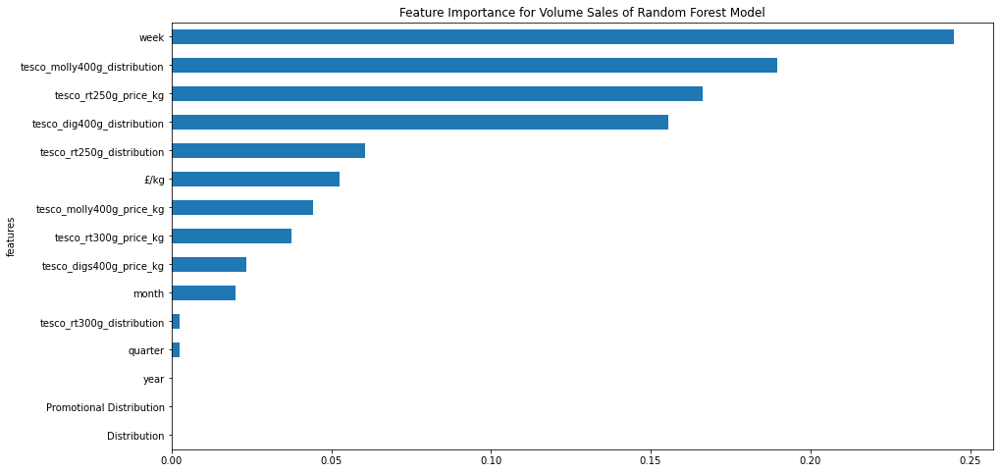

<Figure size 432x288 with 0 Axes>

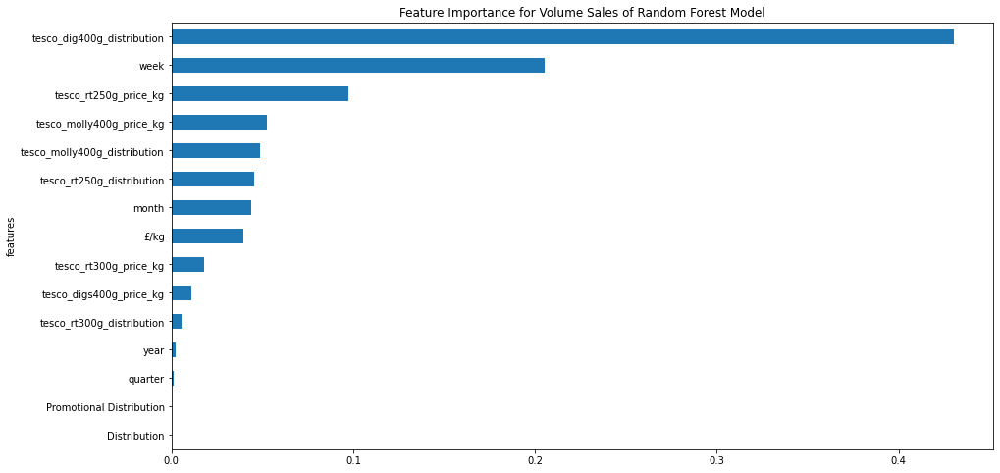

<Figure size 432x288 with 0 Axes>

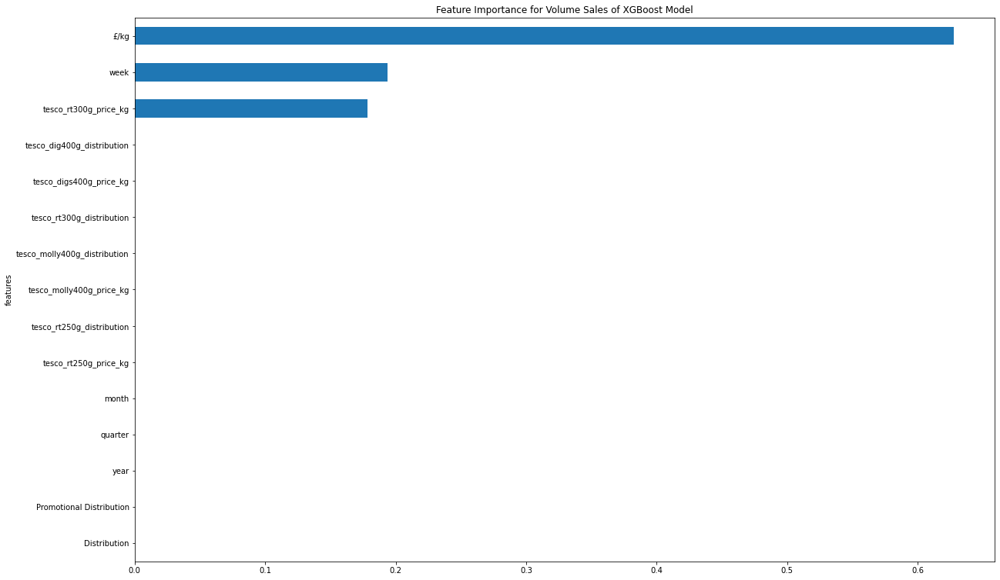

<Figure size 432x288 with 0 Axes>

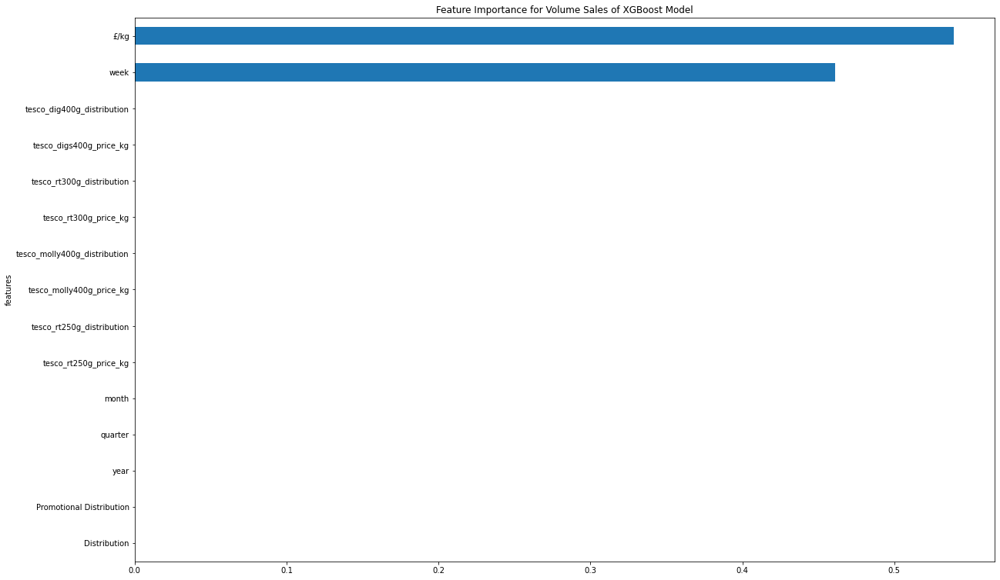

<Figure size 432x288 with 0 Axes>

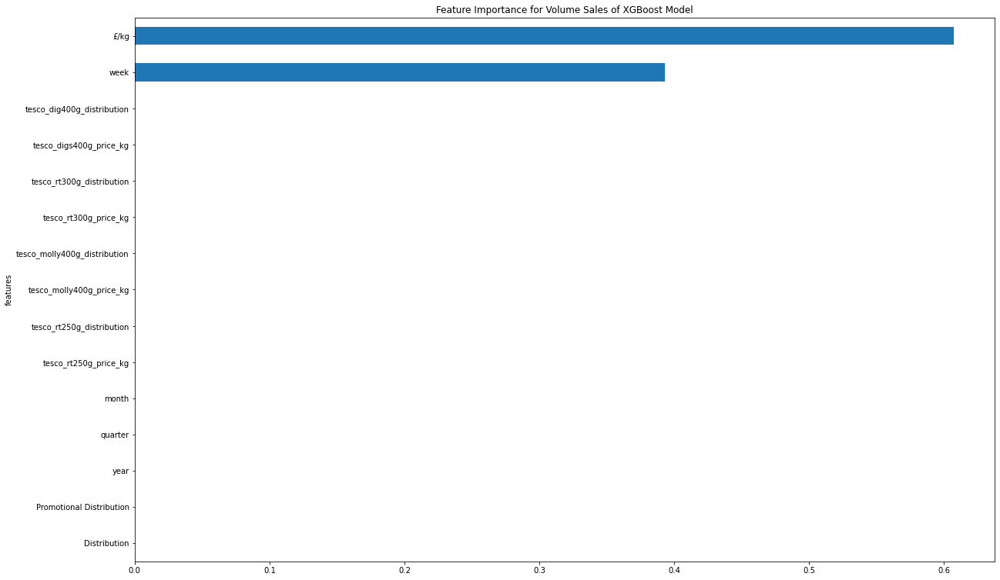

<Figure size 432x288 with 0 Axes>

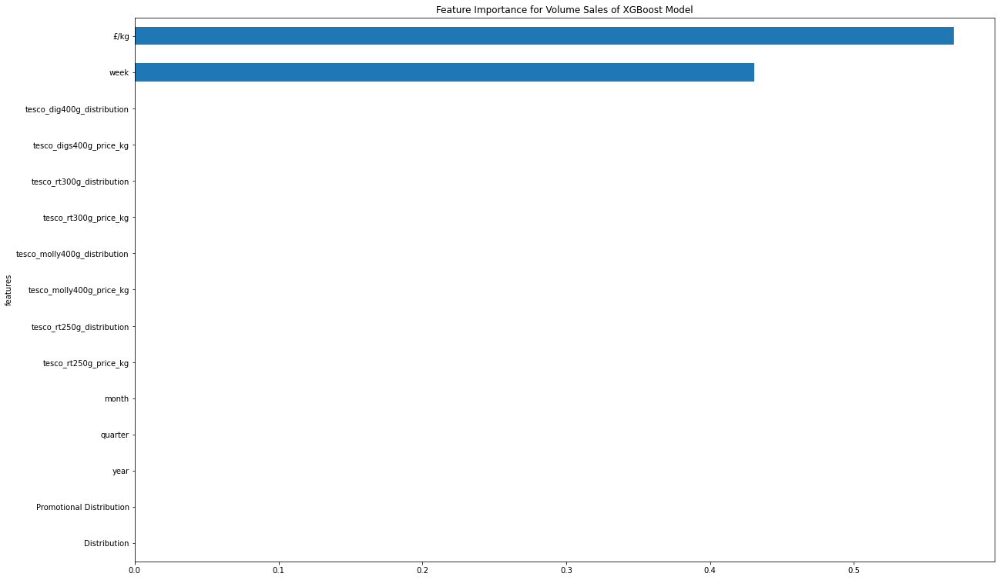

<Figure size 432x288 with 0 Axes>

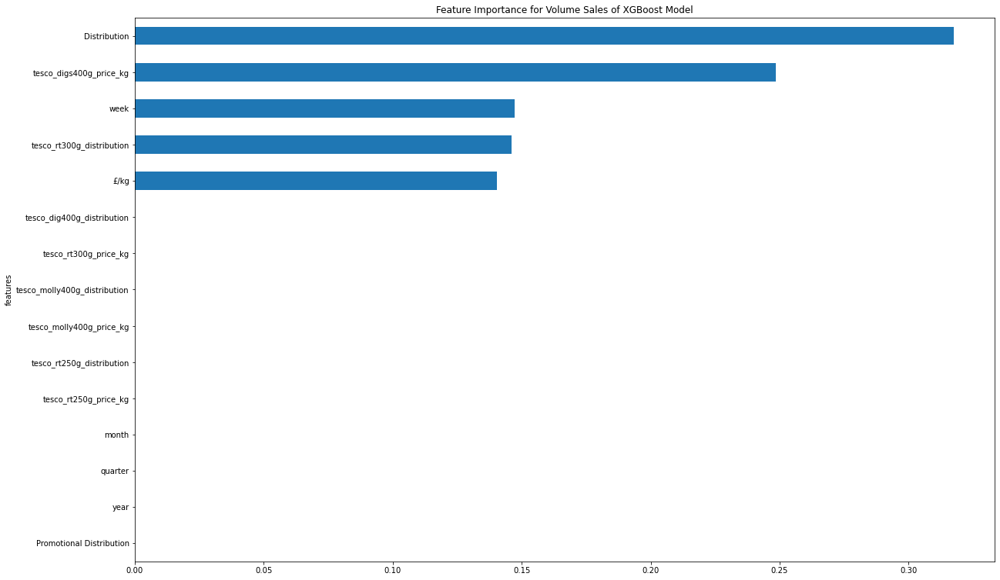

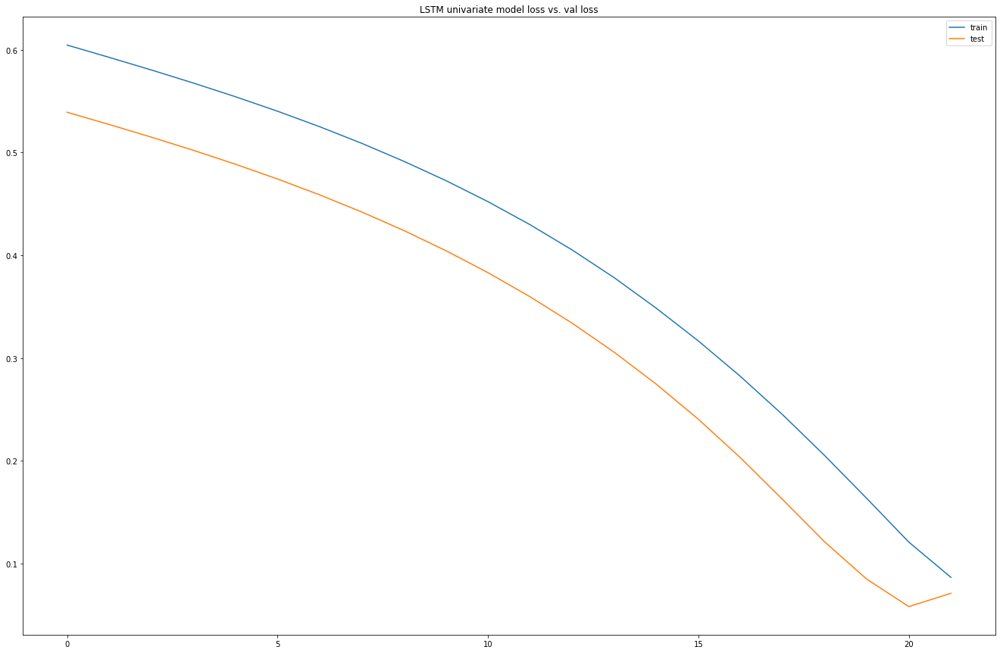

Test RMSE: 4234.644


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
Date,,,,,,,,,,,,,,,,
2015-01-10,39173.5,2.032399,100.0,0.0,2014.0,4.0,12.0,50.0,28874.5,2.039523,100,0,2015,1,1,2
2015-01-17,41784.0,2.033989,100.0,0.0,2014.0,4.0,12.0,51.0,32329.0,2.040478,100,0,2015,1,1,3
2015-01-24,34446.5,2.042324,100.0,0.0,2014.0,4.0,12.0,52.0,30754.0,2.123438,100,0,2015,1,1,4
2015-01-31,25516.0,2.040269,100.0,0.0,2015.0,1.0,1.0,1.0,29475.5,2.182389,100,0,2015,1,1,5
2015-02-07,28874.5,2.039523,100.0,0.0,2015.0,1.0,1.0,2.0,30237.0,2.182429,100,0,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,28730.4,2.502099,100.0,0.0,2020.0,1.0,1.0,3.0,27026.8,2.977519,100,0,2020,1,2,7
2020-02-22,31036.0,2.501775,100.0,0.0,2020.0,1.0,1.0,4.0,25507.2,2.977555,100,0,2020,1,2,8
2020-02-29,32767.6,2.501675,100.0,0.0,2020.0,1.0,2.0,5.0,26099.6,2.977099,100,0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.700692   0.409722        1.0        0.0   0.000000        1.0   
5   0.755715   0.410715        1.0        0.0   0.000000        1.0   
6   0.601060   0.415920        1.0        0.0   0.000000        1.0   
7   0.412830   0.414637        1.0        0.0   0.166656        0.0   
8   0.483618   0.414171        1.0        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)   var1(t)  
4        1.0   0.942308  0.483618  
5        1.0   0.961538  0.556429  
6        1.0   0.980769  0.523232  
7        0.0   0.000000  0.496285  
8        0.0   0.019231  0.512336  
(216, 1, 8) (216,) (55, 1, 8) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 2s - loss: 0.6075 - val_loss: 0.5256
Epoch 2/50
216/216 - 0s - loss: 0.5784 - val_loss: 0.4934
Epoch 3/50
216/216 - 0s - loss: 0.5478 - val_loss: 0.4587
Epoch 4/50
216/216 - 0s - loss: 0.5149 - val_loss: 0.4204
Epoch 5/50
216/216 - 0s - loss: 0.4784 - val

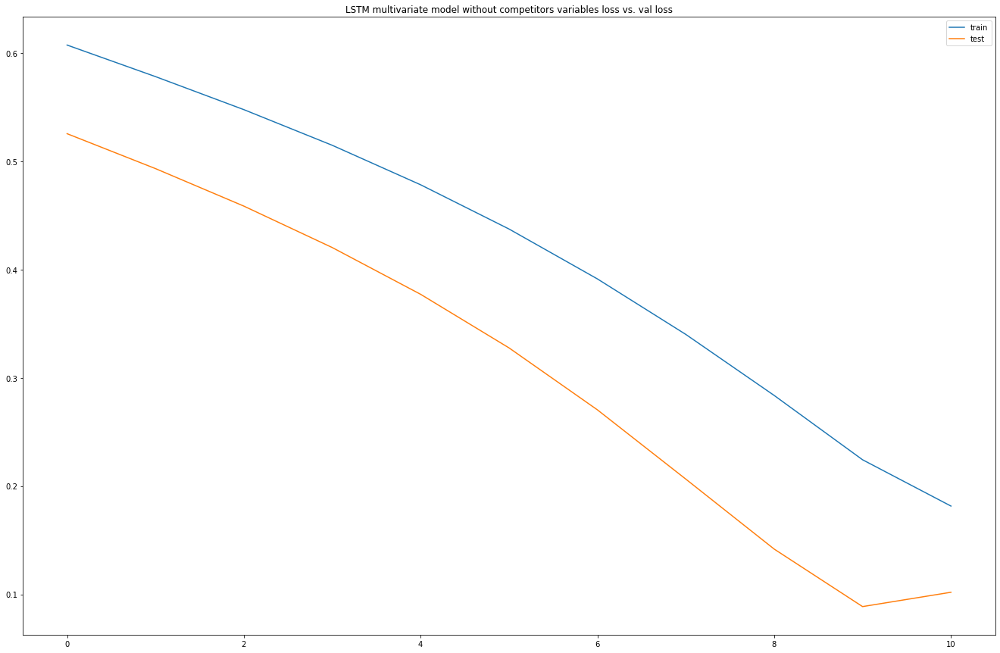

Test RMSE: 6239.058


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-11-10,31698.0,2.501574,100.0,0.0,2018.0,4.0,10.0,41.0,2.241567,100.0,...,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,32629.2,2.501698,100.0,0.0,2018.0,4.0,10.0,42.0,2.241541,100.0,...,11,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
2018-11-24,33110.0,2.501824,100.0,0.0,2018.0,4.0,10.0,43.0,2.241566,100.0,...,11,47,2.241489,100,0.774914,58.0,0.999886,83.0,1.125535,99
2018-12-01,33014.8,2.501599,100.0,0.0,2018.0,4.0,11.0,44.0,2.241457,100.0,...,12,48,2.241464,100,0.774983,58.0,0.999433,83.0,1.125242,99
2018-12-08,31830.0,2.501929,100.0,0.0,2018.0,4.0,11.0,45.0,2.241417,100.0,...,12,49,2.241518,100,0.774887,58.0,0.999955,83.0,1.125299,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,28730.4,2.502099,100.0,0.0,2020.0,1.0,1.0,3.0,2.241691,100.0,...,2,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,31036.0,2.501775,100.0,0.0,2020.0,1.0,1.0,4.0,2.241683,100.0,...,2,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,32767.6,2.501675,100.0,0.0,2020.0,1.0,2.0,5.0,2.241582,100.0,...,2,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.485638   0.000515        0.0        0.0        0.0        1.0   
5   0.523311   0.000773        0.0        0.0        0.0        1.0   
6   0.542762   0.001039        0.0        0.0        0.0        1.0   
7   0.538911   0.000567        0.0        0.0        0.0        1.0   
8   0.490978   0.001259        0.0        0.0        0.0        1.0   

   var7(t-4)  var8(t-4)  var9(t-4)  var10(t-4)  var11(t-4)  var12(t-4)  \
4   0.818182   0.784314   0.994400         1.0    0.980005    0.136842   
5   0.818182   0.803922   0.993778         1.0    0.979163    0.589474   
6   0.818182   0.823529   0.994396         1.0    0.978738    0.589474   
7   0.909091   0.843137   0.991779         1.0    0.979244    0.589474   
8   0.909091   0.862745   0.990829         1.0    0.978948    0.600000   

   var13(t-4)  var14(t-4)  var15(t-4)  var16(t-4)   var1(t)  
4    0.982941         0.5    0.760128         1.0  0.490978  
5   

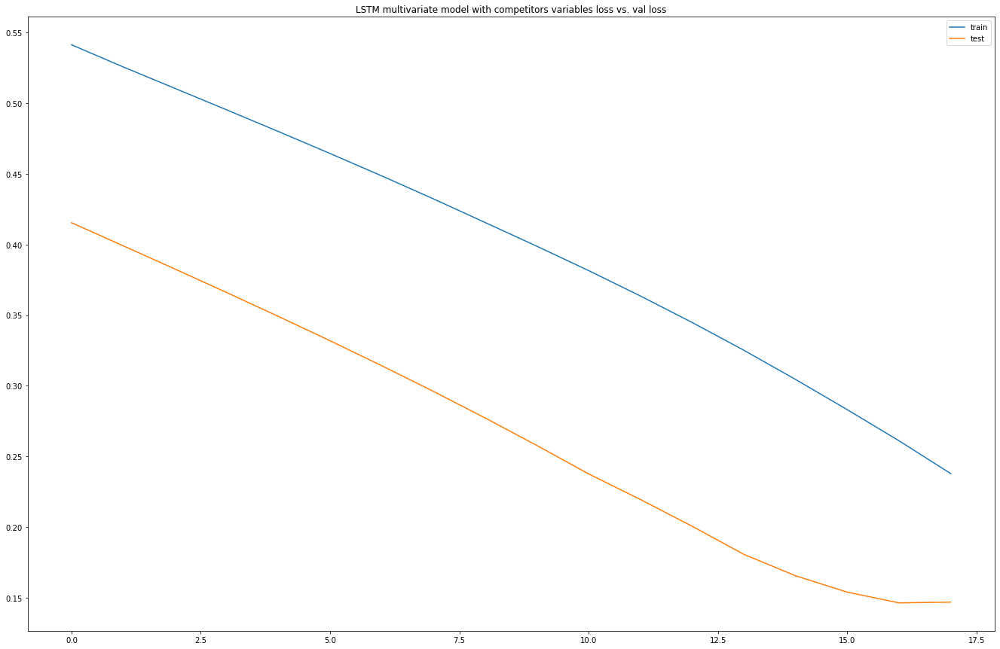

Test RMSE: 4687.050


In [90]:
#ml models
mcv_dig_400g_input_X,mcv_dig_400g_input_Y=input_var(mcv_dig_400g_with_comp)
rf_regressor_mcv(mcv_dig_400g_input_X,mcv_dig_400g_input_Y)

mcv_dig_250g_input_X,mcv_dig_250g_input_Y=input_var(mcv_dig_250g_with_comp)
xgb_regressor_mcv(mcv_dig_250g_input_X,mcv_dig_250g_input_Y)

#lstm models
series_to_supervised(mcv_dig_400g_volume)
lstm_univariate(mcv_dig_400g_volume)

series_to_supervised(mcv_dig_400g_own_variable)
multivariate_lstm_without_competitor(mcv_dig_400g_own_variable)

series_to_supervised(mcv_dig_400g_with_comp)
multivariate_with_competitor(mcv_dig_400g_with_comp)

### Tesco Large - McVitie's Digestives 400g Twin Pack

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,40945,40945.0,77372.6,96,0,1.889672,1.889672,2014,4,12,50
1,2014-12-20,43265,43265.0,81754.1,96,0,1.889613,1.889613,2014,4,12,51
2,2014-12-27,34195,34195.0,64618.4,96,0,1.889703,1.889703,2014,4,12,52
3,2015-01-03,26667,26667.0,50390.0,96,0,1.889601,1.889601,2015,1,1,1
4,2015-01-10,31957,31957.0,60388.8,96,0,1.889689,1.889689,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,36779.381818,33916.016727,69716.069455,94.858182,0.0,1.896369,2.067643,2017.083636,2.469091,6.414545,26.043636
std,6871.435738,6245.329915,12820.214358,8.254941,0.0,0.082345,0.250159,1.534371,1.140635,3.547767,15.490223
min,6129.000000,6129.000000,8001.000000,23.000000,0.0,1.305433,1.305433,2014.000000,1.000000,1.000000,1.000000
25%,33385.500000,30186.900000,62796.650000,97.000000,0.0,1.889671,1.889799,2016.000000,1.000000,3.000000,12.000000
50%,37153.000000,33301.000000,70816.300000,98.000000,0.0,1.889863,1.890073,2017.000000,2.000000,6.000000,26.000000
75%,39870.500000,37904.500000,75634.250000,98.000000,0.0,1.890003,2.362057,2018.000000,3.500000,9.500000,39.500000
95%,45736.900000,42645.840000,85332.960000,98.000000,0.0,1.989909,2.362570,2019.000000,4.000000,12.000000,50.000000
99%,61387.080000,54761.120000,101580.580000,98.000000,0.0,1.989997,2.487385,2020.000000,4.000000,12.000000,52.000000
max,78414.000000,63655.000000,156042.300000,98.000000,0.0,2.612341,3.265426,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

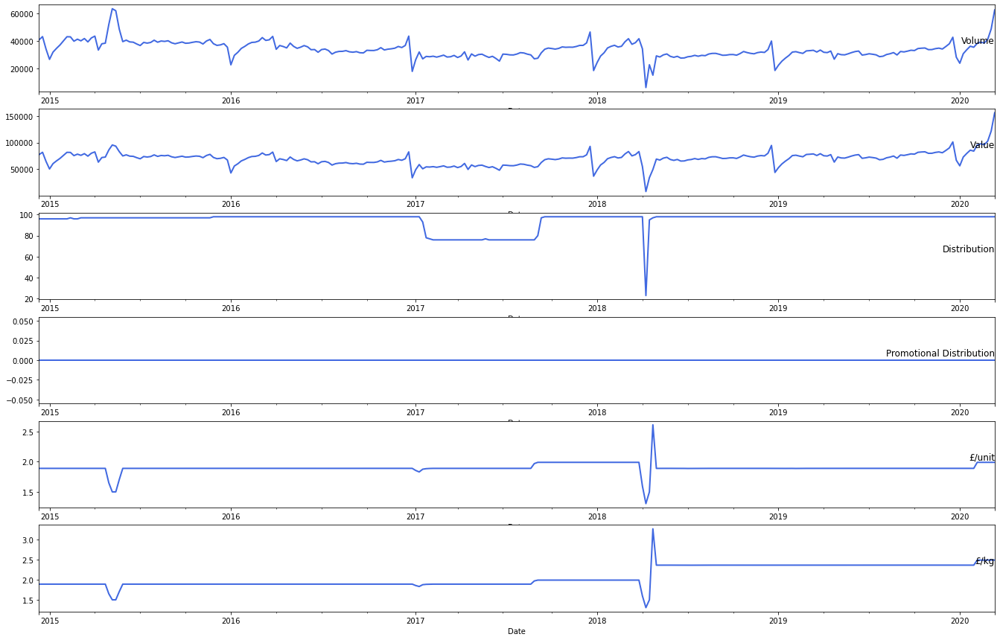

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31babb8c50>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31baae2908>)

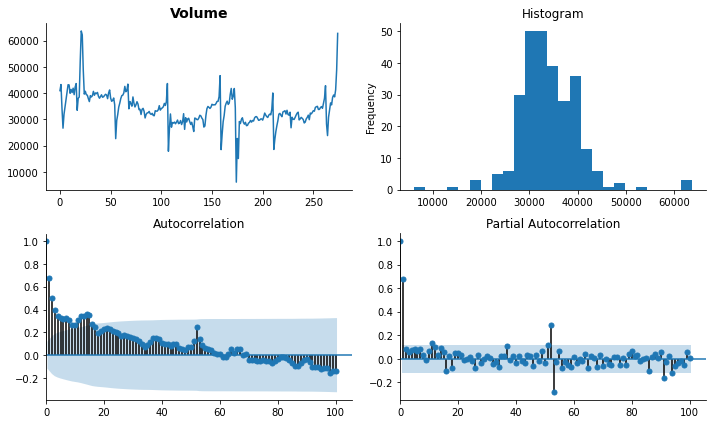

In [91]:
basic_info(mcv_dig_400g_twin_origin)
plot_data(mcv_dig_400g_twin_origin)
tsplot(mcv_dig_400g_twin_origin['Volume'].dropna(), title=mcv_dig_400g_twin_origin.columns[2], lags=100)


Test Statistic                  -4.984032
p-value                          0.000024
#Lags Used                       1.000000
Number of Observations Used    273.000000
Critical Value (1%)             -3.454533
Critical Value (5%)             -2.872186
Critical Value (10%)            -2.572443
dtype: float64


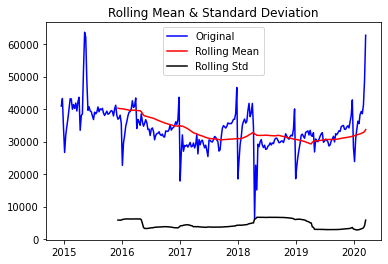

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31ba99ce48>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31ba8b7518>)

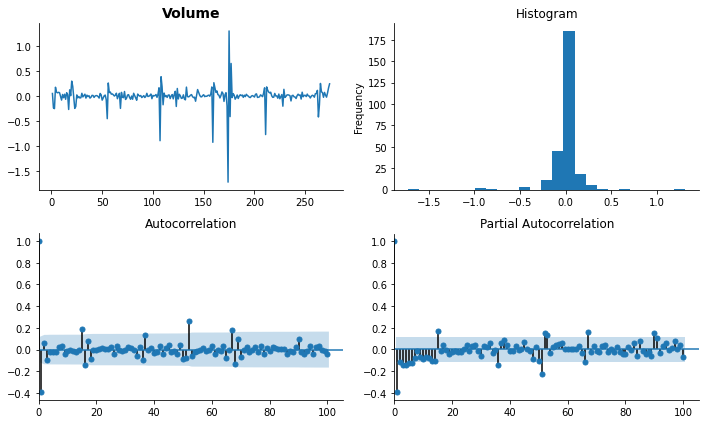

In [92]:
plot(mcv_dig_400g_twin_origin)
series_transformed=mcv_dig_400g_twin_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_dig_400g_twin_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_dig_400g_twin_origin.columns[2], lags=100)


       t-4      t+1
0      NaN  40945.0
1      NaN  43265.0
2      NaN  34195.0
3      NaN  26667.0
4  40945.0  31957.0
Test MSE: 28107875.025
Test RMSE: 5301.686


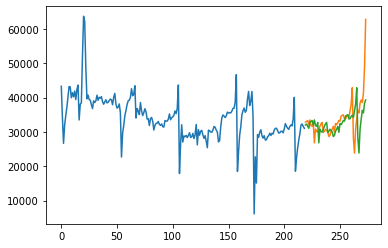

Observations: 271
Training Observations: 216
Testing Observations: 55


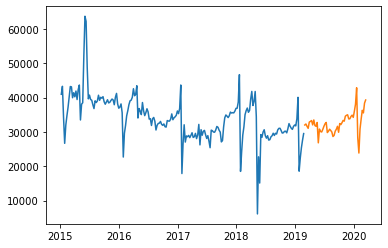

RMSE for Simple Exponential Smoothing α= 0.1 is: 4456.27
RMSE for Simple Exponential Smoothing α= 0.2 is: 5147.54
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 5569.53
RMSE for Simple Exponential Smoothing α= 0.4 is: 5644.07
RMSE for Simple Exponential Smoothing α= 0.5 is: 5475.02
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 5189.69
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 4886.86
RMSE for Simple Exponential Smoothing α= 0.8 is: 4623.2
RMSE for Simple Exponential Smoothing α= 0.9 is: 4417.18


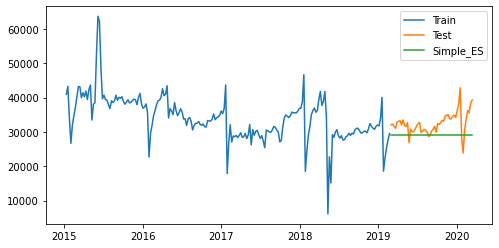

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 7220.0
Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.8 and β= 0.2 is: 3515.79


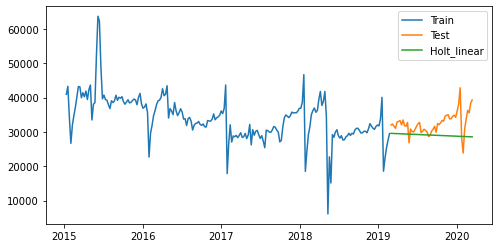

Observations: 275
Training Observations: 204
Testing Observations: 59


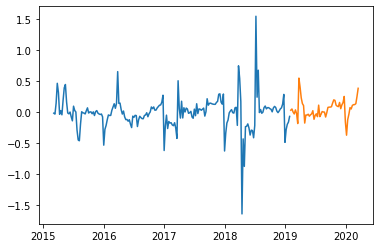

             Volume    pred_value
Date                             
2019-02-02  32004.8  31490.193425
2019-02-09  32293.6  31544.847294
2019-02-16  31604.0  30648.256800
2019-02-23  31036.0  29880.043477
2019-03-02  32858.4  31406.074106
2019-03-09  33044.8  31356.105986
2019-03-16  33306.4  31376.062874
2019-03-23  32035.2  29960.561605
2019-03-30  33474.4  31080.433578
2019-04-06  31841.6  29350.865123
2019-04-13  31624.0  28939.737183
2019-04-20  32735.2  29740.244673
2019-04-27  26814.4  24185.183073
2019-05-04  30820.0  27597.242325
2019-05-11  30091.2  26750.032681
2019-05-18  29973.6  26453.033025
2019-05-25  30748.8  26941.172684
2019-06-01  31648.8  27529.436940
2019-06-08  32377.6  27959.956502
2019-06-15  32746.4  28074.185008
2019-06-22  29802.4  25365.684805
2019-06-29  30188.8  25508.972141
2019-07-06  30772.0  25813.957465
2019-07-13  30415.2  25330.356377
2019-07-20  29964.0  24774.344301
2019-07-27  28642.4  23510.590821
2019-08-03  28981.6  23617.191590
2019-08-10  30

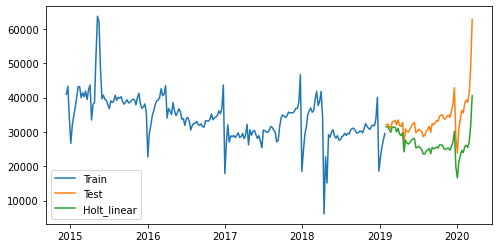

RMSE for Holt Linear Forecasting with transformation is: 8107.23163268702


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

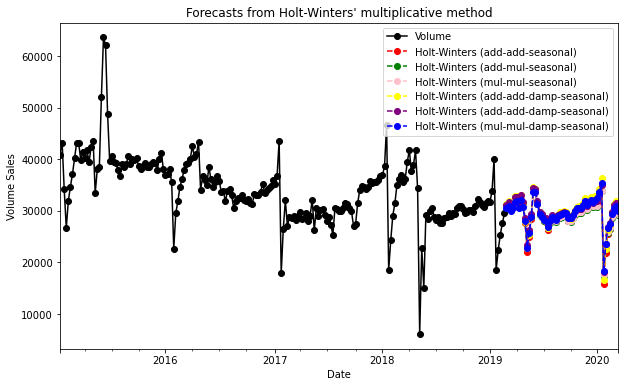

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
4346.697423285409
4435.403778979445
4340.611526047391
3801.284710608994
3790.337945842033
3924.05542609741


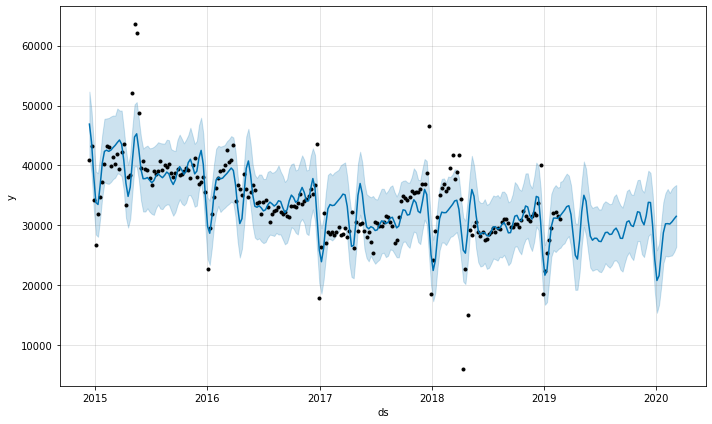

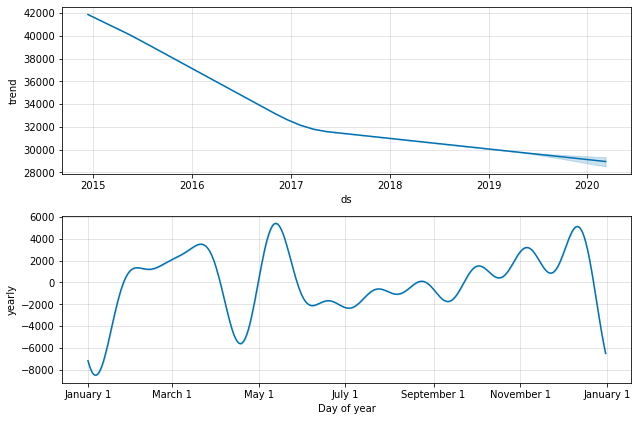

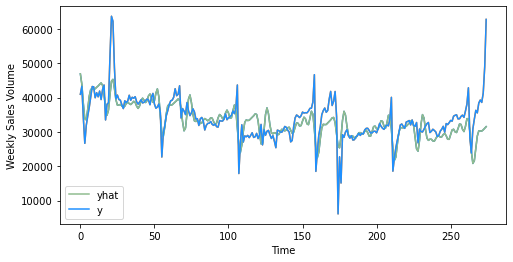

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 4809.125119002391


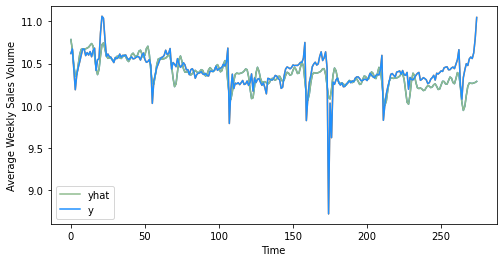

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 5026.988836311825
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

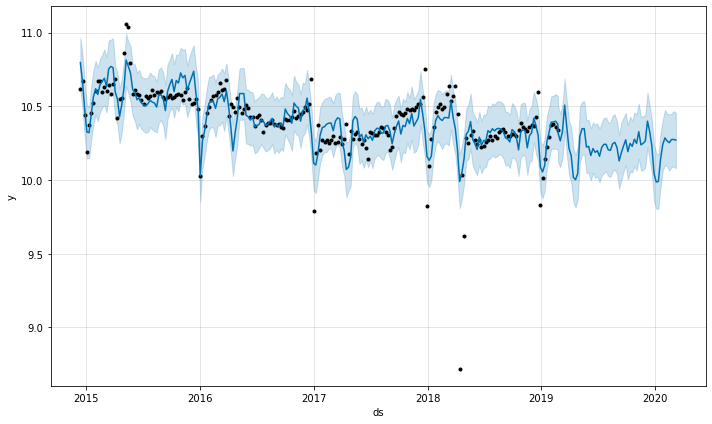

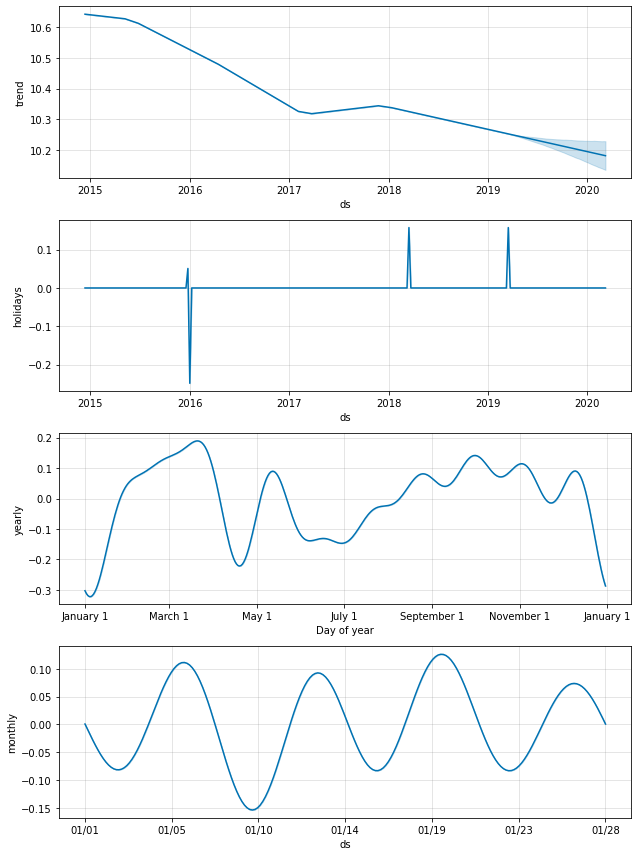

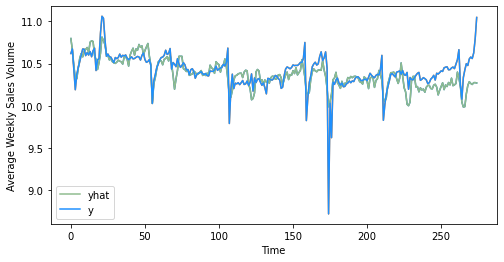

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 5059.318876463421


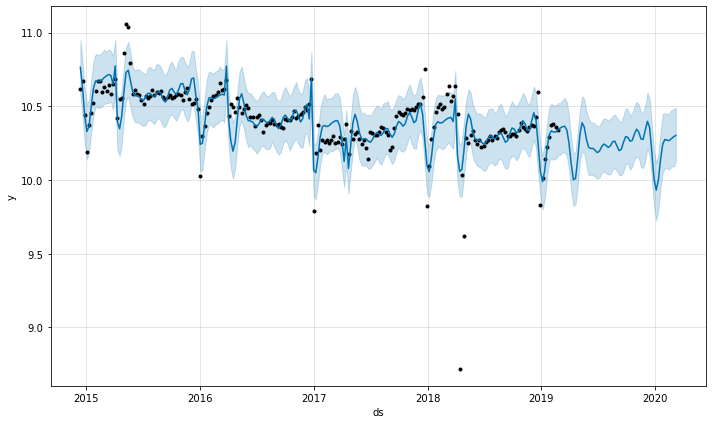

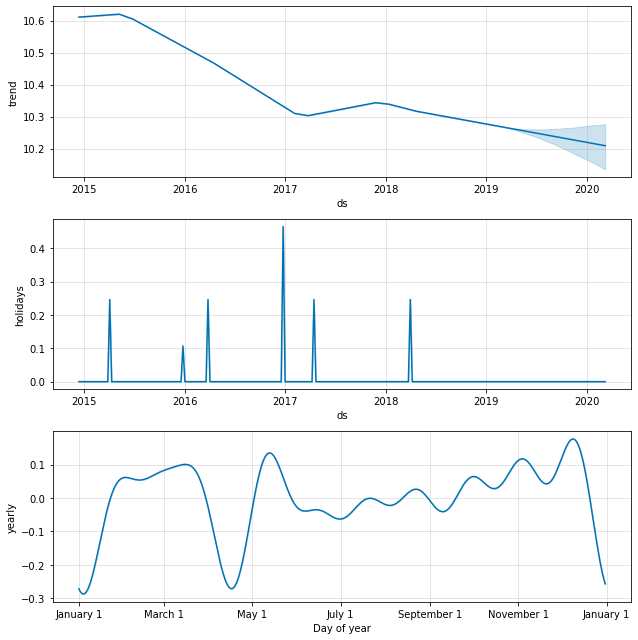

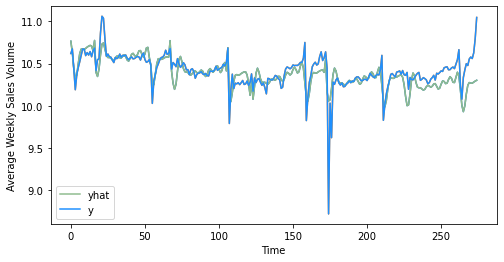

4865.595713578276


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [93]:
#time series models
baseline_model(mcv_dig_400g_twin_origin)
ses_model(mcv_dig_400g_twin_origin)
holt_linear_model(mcv_dig_400g_twin_origin)
holt_linear_model_log(mcv_dig_400g_twin_origin)
holt_winter_model(mcv_dig_400g_twin_origin)
prophet_model(mcv_dig_400g_twin_origin)
prophet_model_log(mcv_dig_400g_twin_origin)
prophet_log_season(mcv_dig_400g_twin_origin)
prophet_log_two_holiday(mcv_dig_400g_twin_origin)

Observations: 27
Training Observations: 15
Testing Observations: 12
[ -0.57751105 -17.67227446  -3.13883754 -43.73207934 -11.07137193]
Mean Absolute Error: 4616.656666666664
Mean Squared Error: 22942212.48839998
Root Mean Squared Error: 4789.802969684659
Observations: 39
Training Observations: 27
Testing Observations: 12
[ -0.8653927   -7.82477239 -13.75010493   0.07431938   0.0371552 ]
Mean Absolute Error: 2512.5499999999997
Mean Squared Error: 9998648.645466674
Root Mean Squared Error: 3162.063985036779
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.23770129 -13.31852388  -0.50543151  -4.81550935  -0.40833089]
Mean Absolute Error: 1086.4866666666667
Mean Squared Error: 1471017.095999998
Root Mean Squared Error: 1212.854936090874
Observations: 63
Training Observations: 51
Testing Observations: 12
[-1.3499958   0.17269733 -3.58939853 -0.68163112 -0.32525942]
Mean Absolute Error: 3621.2233333333297
Mean Squared Error: 18179040.923333317
Root Mean Squared Error:

,var1(t-4),var1(t)
Date,,
2015-01-10,40945.0,31957.0
2015-01-17,43265.0,34705.0
2015-01-24,34195.0,37172.0
2015-01-31,26667.0,40222.0
2015-02-07,31957.0,43199.0
...,...,...
2020-02-15,33702.4,39277.6
2020-02-22,36274.4,38577.6
2020-02-29,35528.8,41269.6


   var1(t-4)   var1(t)
4   0.605222  0.448980
5   0.645552  0.496749
6   0.487884  0.539634
7   0.357021  0.592654
8   0.448980  0.644404
(216, 1, 1) (216,) (55, 1, 1) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 3s - loss: 0.4840 - val_loss: 0.4702
Epoch 2/50
216/216 - 0s - loss: 0.4711 - val_loss: 0.4575
Epoch 3/50
216/216 - 0s - loss: 0.4583 - val_loss: 0.4445
Epoch 4/50
216/216 - 0s - loss: 0.4452 - val_loss: 0.4313
Epoch 5/50
216/216 - 0s - loss: 0.4317 - val_loss: 0.4176
Epoch 6/50
216/216 - 0s - loss: 0.4177 - val_loss: 0.4032
Epoch 7/50
216/216 - 0s - loss: 0.4030 - val_loss: 0.3880
Epoch 8/50
216/216 - 0s - loss: 0.3874 - val_loss: 0.3719
Epoch 9/50
216/216 - 0s - loss: 0.3709 - val_loss: 0.3547
Epoch 10/50
216/216 - 0s - loss: 0.3531 - val_loss: 0.3361
Epoch 11/50
216/216 - 0s - loss: 0.3340 - val_loss: 0.3160
Epoch 12/50
216/216 - 0s - loss: 0.3135 - val_loss: 0.2943
Epoch 13/50
216/216 - 0s - loss: 0.2912 - val_loss: 0.2706
Epoch 14/50
216/216 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

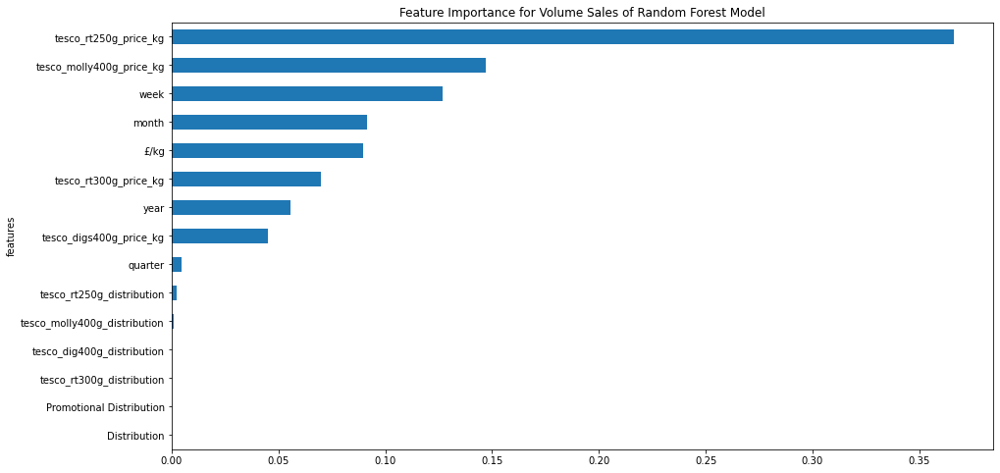

<Figure size 432x288 with 0 Axes>

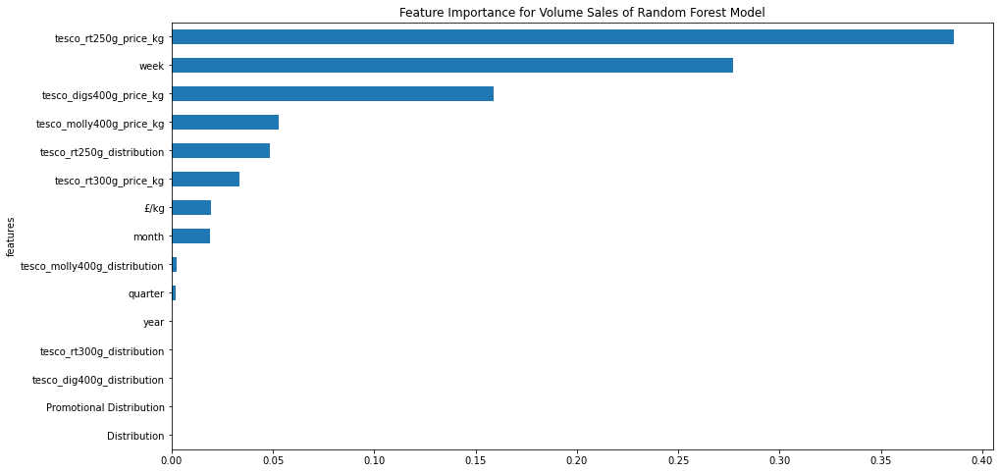

<Figure size 432x288 with 0 Axes>

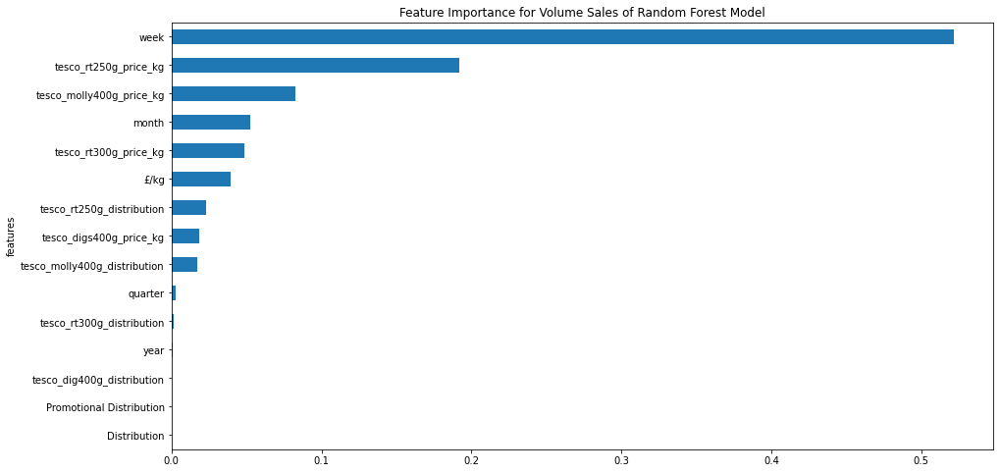

<Figure size 432x288 with 0 Axes>

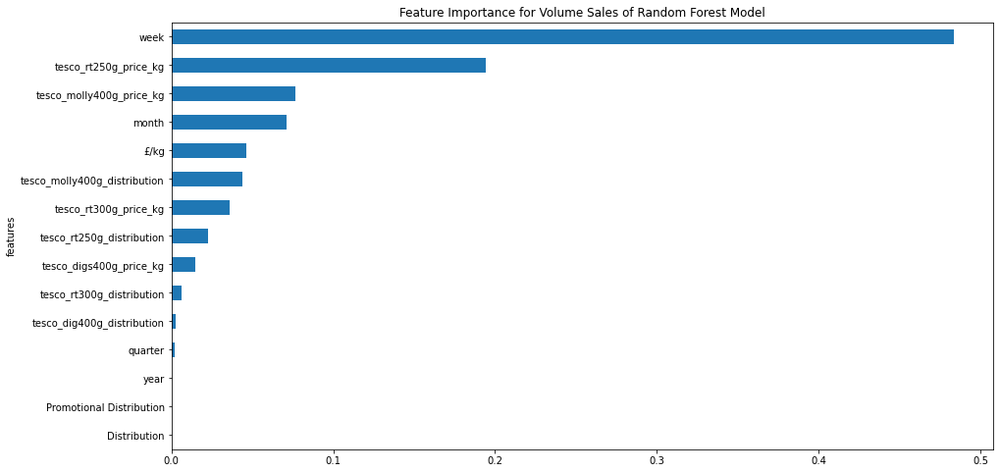

<Figure size 432x288 with 0 Axes>

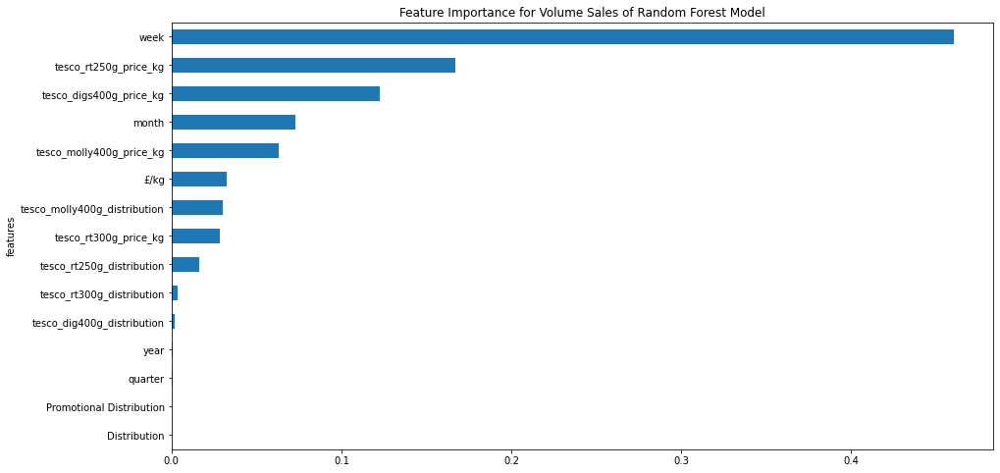

<Figure size 432x288 with 0 Axes>

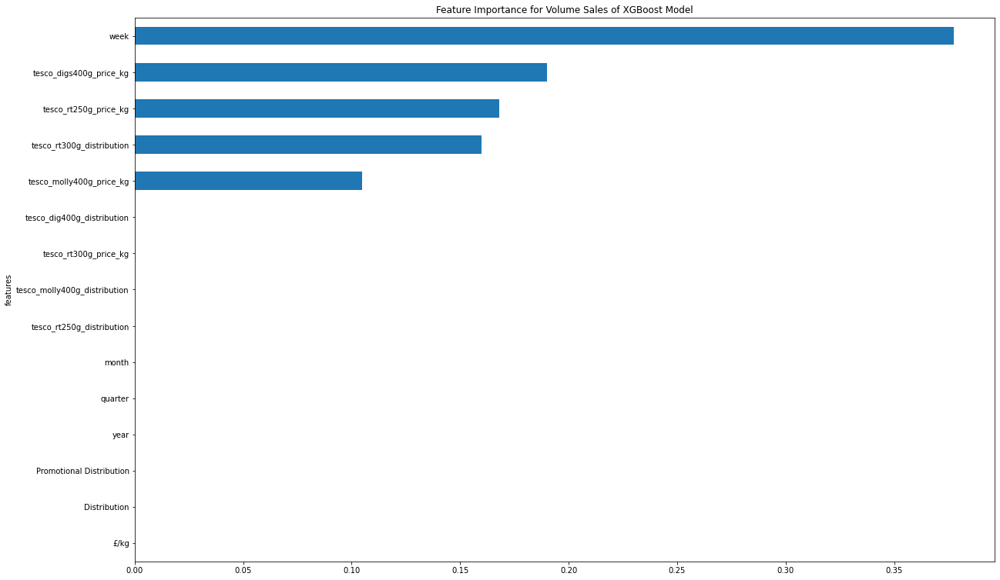

<Figure size 432x288 with 0 Axes>

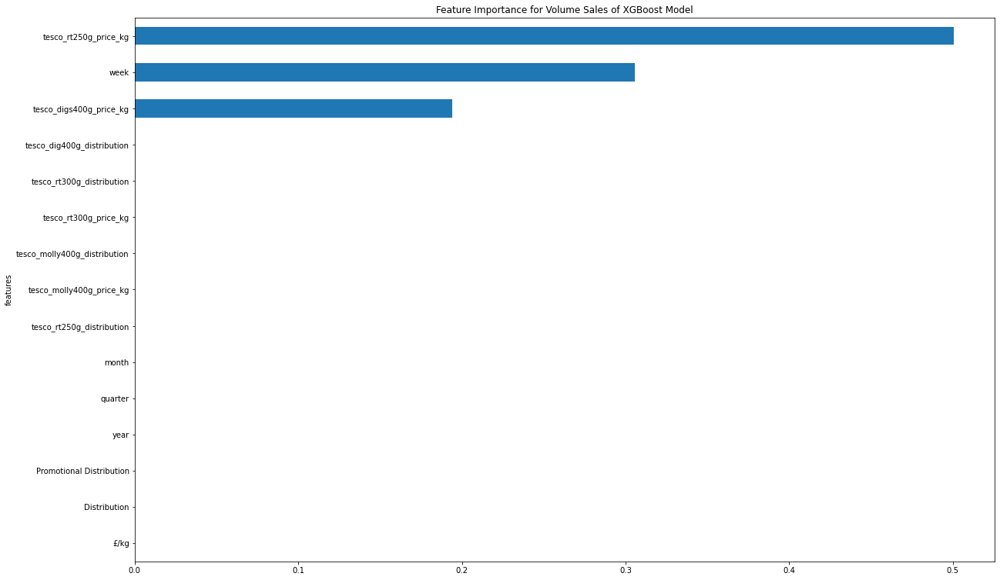

<Figure size 432x288 with 0 Axes>

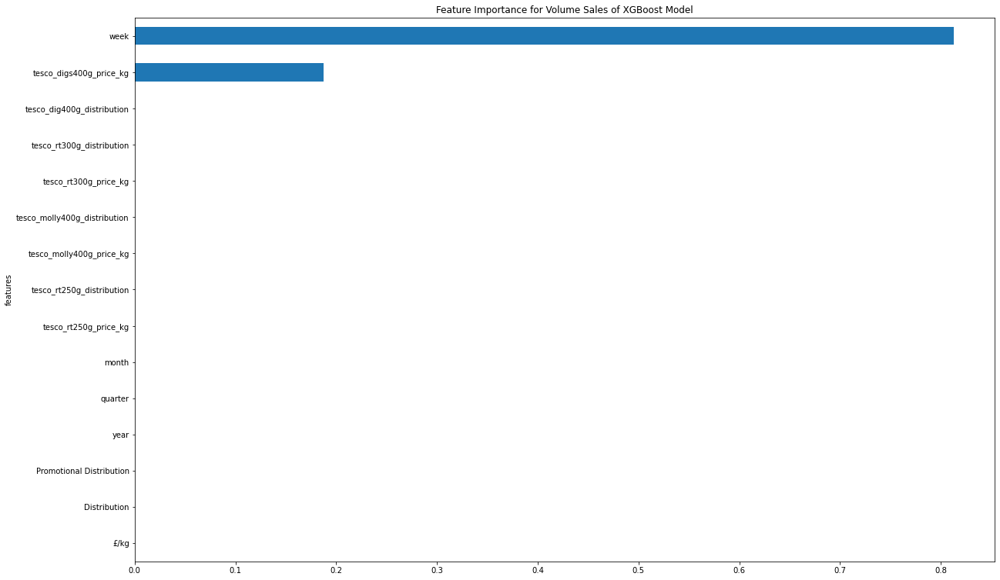

<Figure size 432x288 with 0 Axes>

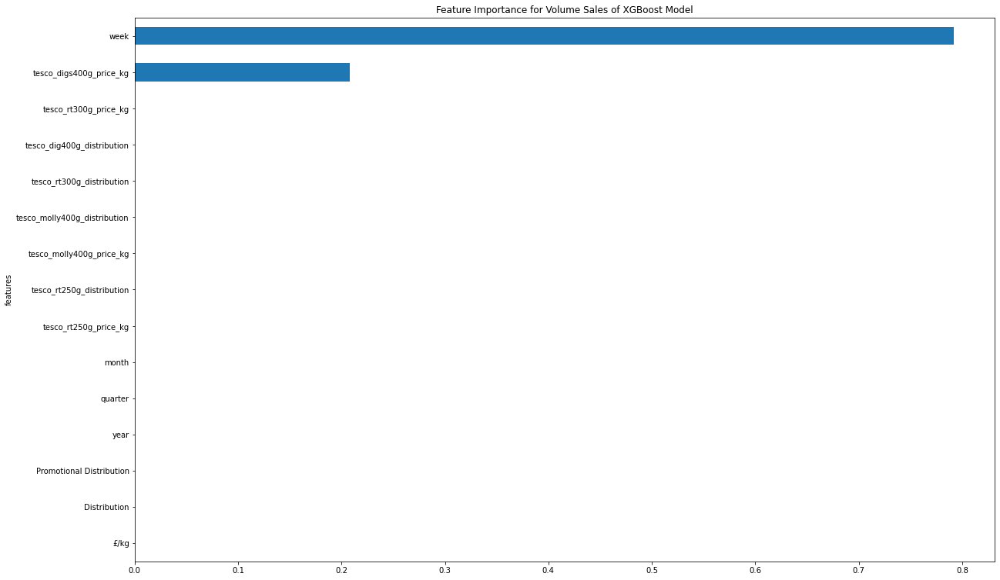

<Figure size 432x288 with 0 Axes>

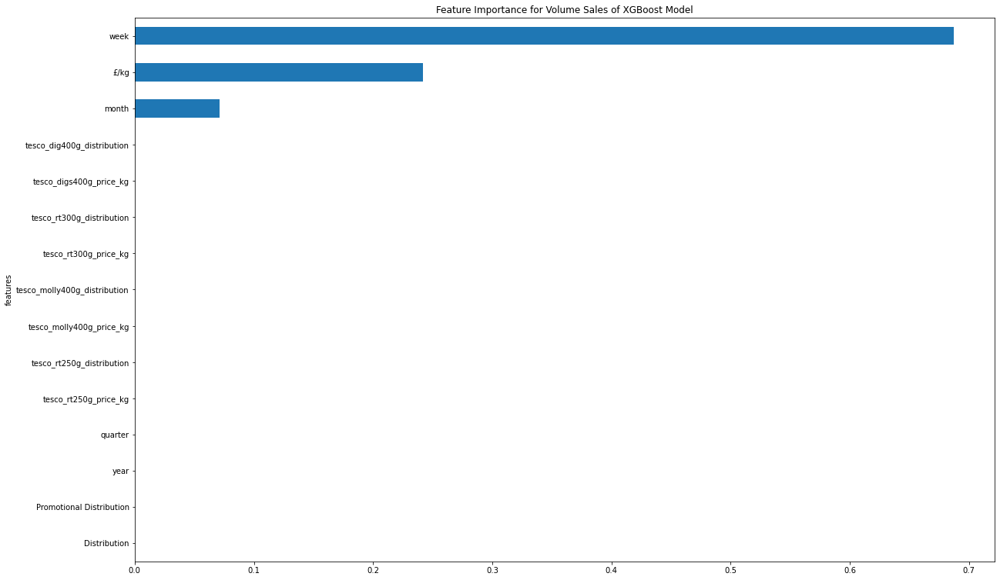

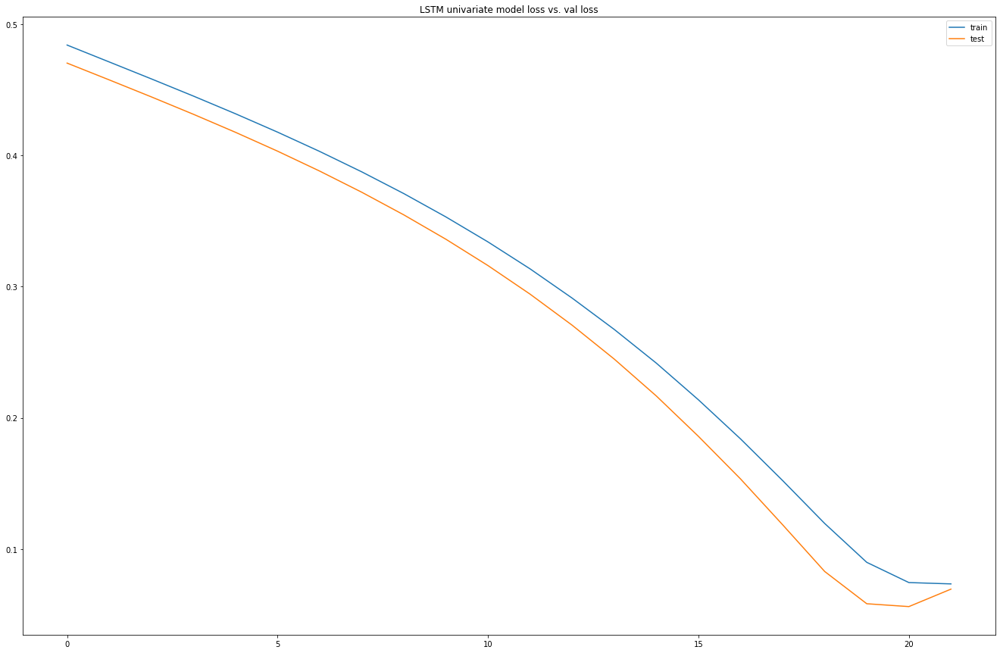

Test RMSE: 5509.357


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
Date,,,,,,,,,,,,,,,,
2015-01-10,40945.0,1.889672,96.0,0.0,2014.0,4.0,12.0,50.0,31957.0,1.889689,96,0,2015,1,1,2
2015-01-17,43265.0,1.889613,96.0,0.0,2014.0,4.0,12.0,51.0,34705.0,1.889442,96,0,2015,1,1,3
2015-01-24,34195.0,1.889703,96.0,0.0,2014.0,4.0,12.0,52.0,37172.0,1.889339,96,0,2015,1,1,4
2015-01-31,26667.0,1.889601,96.0,0.0,2015.0,1.0,1.0,1.0,40222.0,1.889769,96,0,2015,1,1,5
2015-02-07,31957.0,1.889689,96.0,0.0,2015.0,1.0,1.0,2.0,43199.0,1.889773,96,0,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,33702.4,2.362428,98.0,0.0,2020.0,1.0,1.0,3.0,39277.6,2.487499,98,0,2020,1,2,7
2020-02-22,36274.4,2.362101,98.0,0.0,2020.0,1.0,1.0,4.0,38577.6,2.487350,98,0,2020,1,2,8
2020-02-29,35528.8,2.362396,98.0,0.0,2020.0,1.0,2.0,5.0,41269.6,2.487354,98,0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.605222   0.298082   0.973333        0.0   0.000000        1.0   
5   0.645552   0.298052   0.973333        0.0   0.000000        1.0   
6   0.487884   0.298098   0.973333        0.0   0.000000        1.0   
7   0.357021   0.298046   0.973333        0.0   0.166656        0.0   
8   0.448980   0.298091   0.973333        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)   var1(t)  
4        1.0   0.942308  0.448980  
5        1.0   0.961538  0.496749  
6        1.0   0.980769  0.539634  
7        0.0   0.000000  0.592654  
8        0.0   0.019231  0.644404  
(216, 1, 8) (216,) (55, 1, 8) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 3s - loss: 0.4692 - val_loss: 0.4418
Epoch 2/50
216/216 - 0s - loss: 0.4436 - val_loss: 0.4131
Epoch 3/50
216/216 - 0s - loss: 0.4169 - val_loss: 0.3823
Epoch 4/50
216/216 - 0s - loss: 0.3880 - val_loss: 0.3484
Epoch 5/50
216/216 - 0s - loss: 0.3561 - val

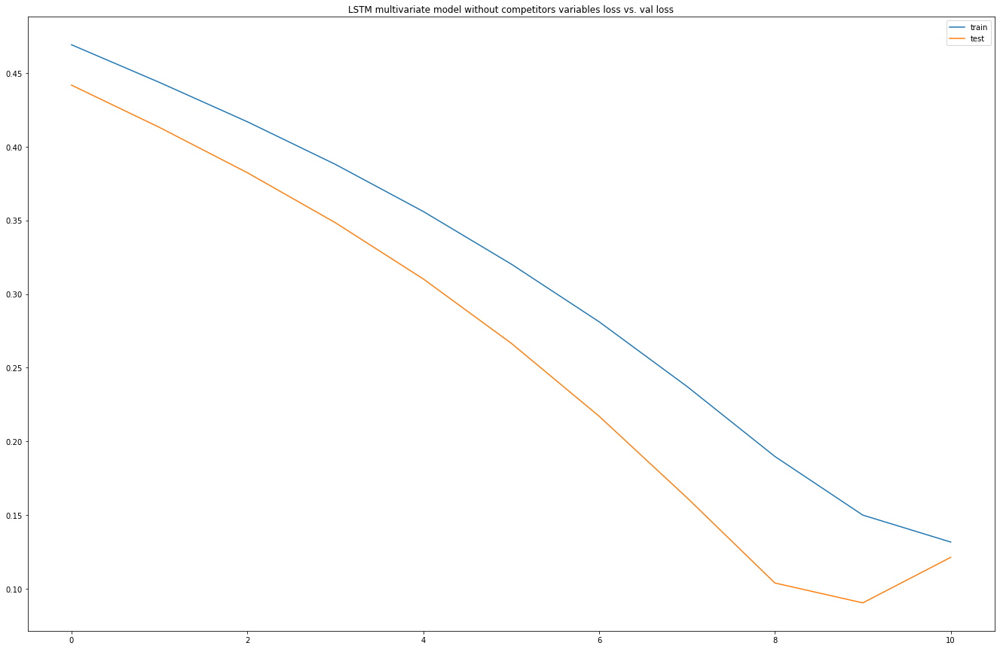

Test RMSE: 8708.264


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-11-10,29722.4,2.361640,98.0,0.0,2018.0,4.0,10.0,41.0,2.241567,100.0,...,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,30899.2,2.362333,98.0,0.0,2018.0,4.0,10.0,42.0,2.241541,100.0,...,11,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
2018-11-24,32409.6,2.362053,98.0,0.0,2018.0,4.0,10.0,43.0,2.241566,100.0,...,11,47,2.241489,100,0.774914,58.0,0.999886,83.0,1.125535,99
2018-12-01,31647.2,2.362421,98.0,0.0,2018.0,4.0,11.0,44.0,2.241457,100.0,...,12,48,2.241464,100,0.774983,58.0,0.999433,83.0,1.125242,99
2018-12-08,31065.6,2.361049,98.0,0.0,2018.0,4.0,11.0,45.0,2.241417,100.0,...,12,49,2.241518,100,0.774887,58.0,0.999955,83.0,1.125299,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,33702.4,2.362428,98.0,0.0,2020.0,1.0,1.0,3.0,2.241691,100.0,...,2,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,36274.4,2.362101,98.0,0.0,2020.0,1.0,1.0,4.0,2.241683,100.0,...,2,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,35528.8,2.362396,98.0,0.0,2020.0,1.0,2.0,5.0,2.241582,100.0,...,2,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.252613   0.008791        0.0        0.0        0.0        1.0   
5   0.279258   0.014252        0.0        0.0        0.0        1.0   
6   0.313457   0.012047        0.0        0.0        0.0        1.0   
7   0.296194   0.014942        0.0        0.0        0.0        1.0   
8   0.283026   0.004137        0.0        0.0        0.0        1.0   

   var7(t-4)  var8(t-4)  var9(t-4)  var10(t-4)  var11(t-4)  var12(t-4)  \
4   0.818182   0.784314   0.994400         1.0    0.980005    0.136842   
5   0.818182   0.803922   0.993778         1.0    0.979163    0.589474   
6   0.818182   0.823529   0.994396         1.0    0.978738    0.589474   
7   0.909091   0.843137   0.991779         1.0    0.979244    0.589474   
8   0.909091   0.862745   0.990829         1.0    0.978948    0.600000   

   var13(t-4)  var14(t-4)  var15(t-4)  var16(t-4)   var1(t)  
4    0.982941         0.5    0.760128         1.0  0.283026  
5   

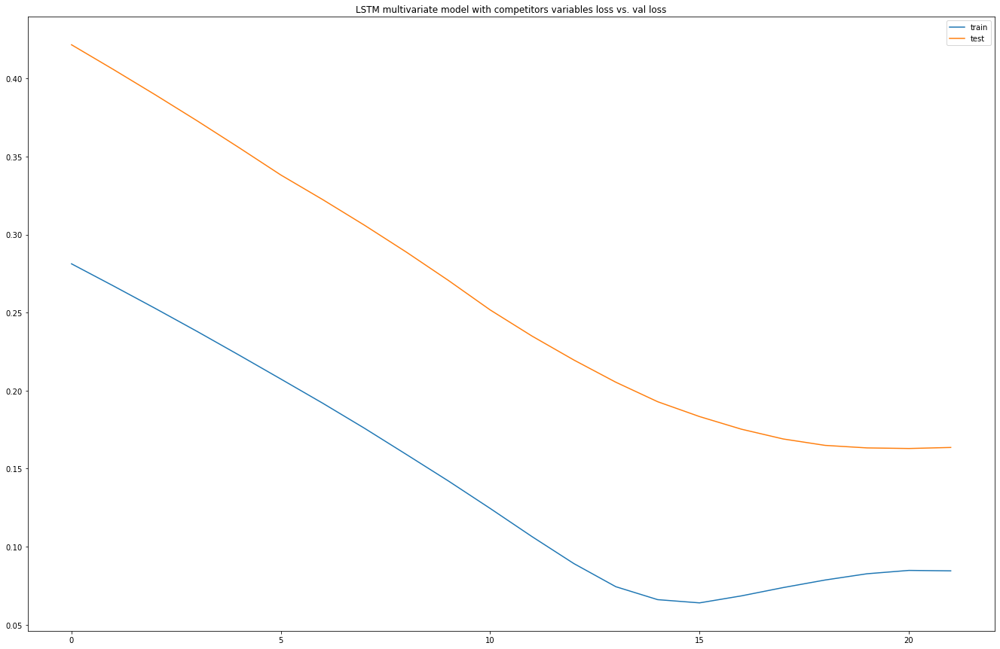

Test RMSE: 9634.008


In [94]:
#ml models
mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y=input_var(mcv_dig_400g_twin_with_comp)
rf_regressor_mcv(mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y)

mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y=input_var(mcv_dig_400g_twin_with_comp)
xgb_regressor_mcv(mcv_dig_400g_twin_input_X,mcv_dig_400g_twin_input_Y)

#lstm models
series_to_supervised(mcv_dig_400g_twin_volume)
lstm_univariate(mcv_dig_400g_twin_volume)

series_to_supervised(mcv_dig_400g_twin_own_variable)
multivariate_lstm_without_competitor(mcv_dig_400g_twin_own_variable)

series_to_supervised(mcv_dig_400g_twin_with_comp)
multivariate_with_competitor(mcv_dig_400g_twin_with_comp)

### Tesco Large - McVitie's Digestives Rich Tea 300g

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,57531,17259.3,58416.3,100,0,1.015388,3.384627,2014,4,12,50
1,2014-12-20,56103,16830.9,57004.8,100,0,1.016074,3.386913,2014,4,12,51
2,2014-12-27,38403,11520.9,39167.2,100,0,1.019899,3.399665,2014,4,12,52
3,2015-01-03,38308,11492.4,39034.1,100,0,1.018954,3.396514,2015,1,1,1
4,2015-01-10,50283,15084.9,51242.8,100,0,1.019088,3.396960,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,53297.174545,16001.358545,53642.773091,98.647273,0.0,1.007279,3.355066,2017.083636,2.469091,6.414545,26.043636
std,7029.099821,2111.164423,6974.649766,2.031491,0.0,0.032892,0.109373,1.534371,1.140635,3.547767,15.490223
min,22252.000000,6675.600000,22264.700000,94.000000,0.0,0.940687,3.135623,2014.000000,1.000000,1.000000,1.000000
25%,48920.500000,14689.500000,49196.050000,98.000000,0.0,1.000430,3.328587,2016.000000,1.000000,3.000000,12.000000
50%,54834.000000,16462.200000,54877.300000,100.000000,0.0,1.000639,3.333905,2017.000000,2.000000,6.000000,26.000000
75%,57466.500000,17249.700000,58015.300000,100.000000,0.0,1.000832,3.335557,2018.000000,3.500000,9.500000,39.500000
95%,63412.900000,19023.870000,63635.850000,100.000000,0.0,1.036534,3.455112,2019.000000,4.000000,12.000000,50.000000
99%,65649.020000,19694.706000,65800.988000,100.000000,0.0,1.191097,3.963430,2020.000000,4.000000,12.000000,52.000000
max,67015.000000,20130.900000,70512.700000,100.000000,0.0,1.191153,3.967342,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

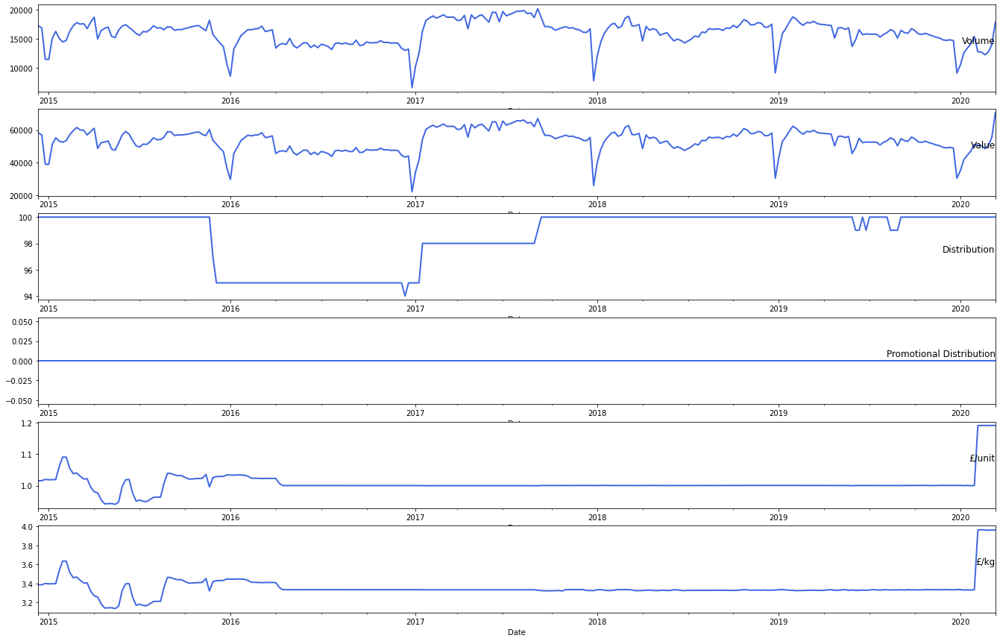

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31b64fe550>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31b6407630>)

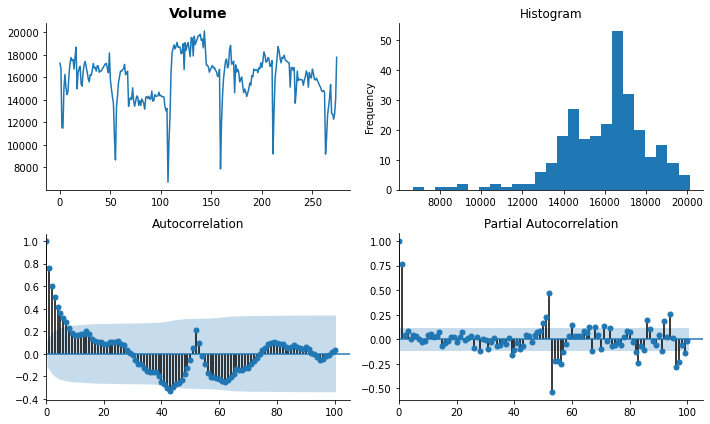

In [95]:
basic_info(mcv_rt_300g_origin)
plot_data(mcv_rt_300g_origin)
tsplot(mcv_rt_300g_origin['Volume'].dropna(), title=mcv_rt_300g_origin.columns[2], lags=100)


Test Statistic                -5.996790e+00
p-value                        1.694113e-07
#Lags Used                     0.000000e+00
Number of Observations Used    2.740000e+02
Critical Value (1%)           -3.454444e+00
Critical Value (5%)           -2.872147e+00
Critical Value (10%)          -2.572422e+00
dtype: float64


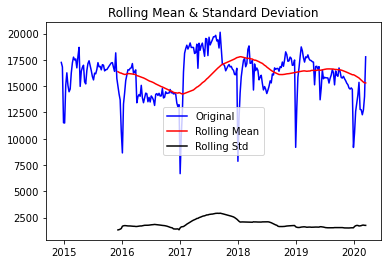

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning:

invalid value encountered in sqrt



(<matplotlib.axes._subplots.AxesSubplot at 0x7f31b6253ef0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31b61e7978>)

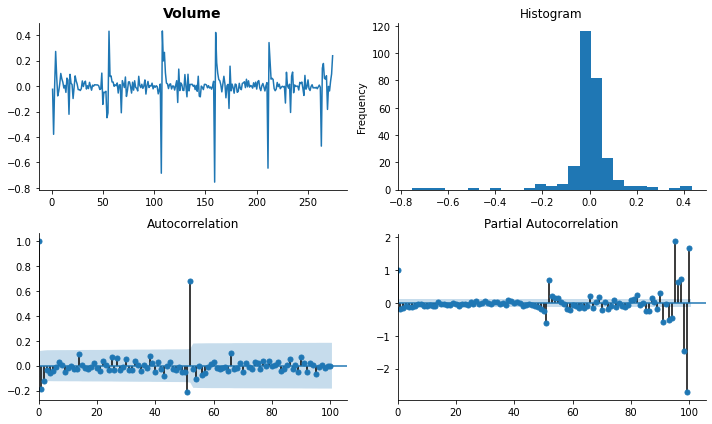

In [96]:
plot(mcv_rt_300g_origin)
series_transformed=mcv_rt_300g_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_rt_300g_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_rt_300g_origin.columns[2], lags=100)


       t-4      t+1
0      NaN  17259.3
1      NaN  16830.9
2      NaN  11520.9
3      NaN  11492.4
4  17259.3  15084.9
Test MSE: 3353758.881
Test RMSE: 1831.327


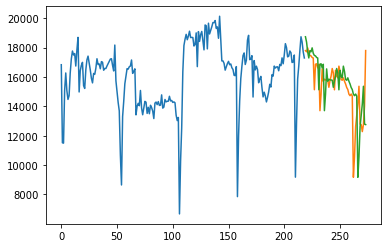

Observations: 271
Training Observations: 216
Testing Observations: 55


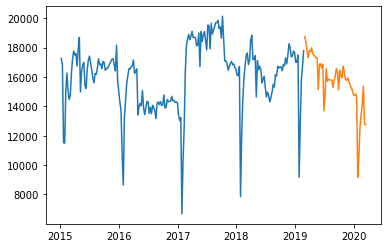

RMSE for Simple Exponential Smoothing α= 0.1 is: 1841.18
RMSE for Simple Exponential Smoothing α= 0.2 is: 1802.09
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 1814.66
RMSE for Simple Exponential Smoothing α= 0.4 is: 1886.75
RMSE for Simple Exponential Smoothing α= 0.5 is: 2026.89
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 2205.11
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 2379.96
RMSE for Simple Exponential Smoothing α= 0.8 is: 2526.12
RMSE for Simple Exponential Smoothing α= 0.9 is: 2638.78


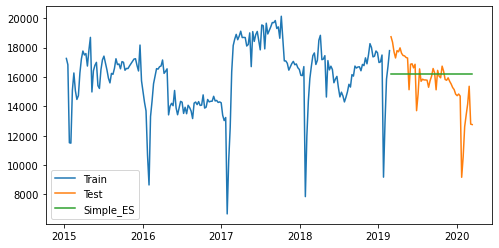

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 1884.29
Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.1 and β= 0.1 is: 1616.53


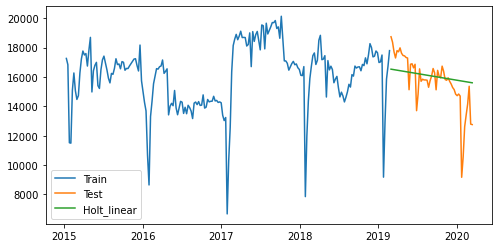

Observations: 275
Training Observations: 204
Testing Observations: 59


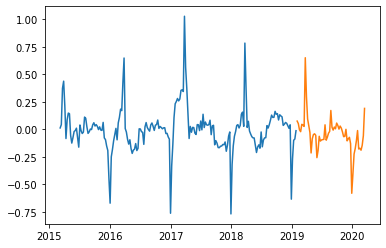

             Volume    pred_value
Date                             
2019-02-02  18735.3  17790.707023
2019-02-09  18369.3  17296.284387
2019-02-16  17707.2  16532.470535
2019-02-23  17291.4  16008.317029
2019-03-02  17789.1  16330.412308
2019-03-09  17710.5  16121.359030
2019-03-16  17978.1  16227.150864
2019-03-23  17613.3  15764.016061
2019-03-30  17459.1  15494.431386
2019-04-06  17432.1  15340.204654
2019-04-13  17323.5  15116.273454
2019-04-20  17287.8  14958.101754
2019-04-27  15129.0  12979.998158
2019-05-04  16863.9  14346.636030
2019-05-11  16895.1  14252.153239
2019-05-18  16617.9  13900.278834
2019-05-25  16860.9  13984.784481
2019-06-01  13703.7  11270.430937
2019-06-08  14822.4  12087.844454
2019-06-15  16547.7  13381.217412
2019-06-22  15704.4  12592.355935
2019-06-29  15844.8  12597.955168
2019-07-06  15794.7  12452.379063
2019-07-13  15794.4  12347.292543
2019-07-20  15776.7  12229.604915
2019-07-27  15295.8  11756.988961
2019-08-03  15747.0  12001.883197
2019-08-10  16

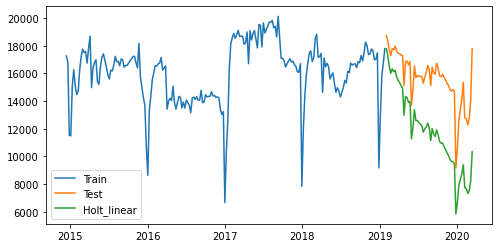

RMSE for Holt Linear Forecasting with transformation is: 4020.0015638471023


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

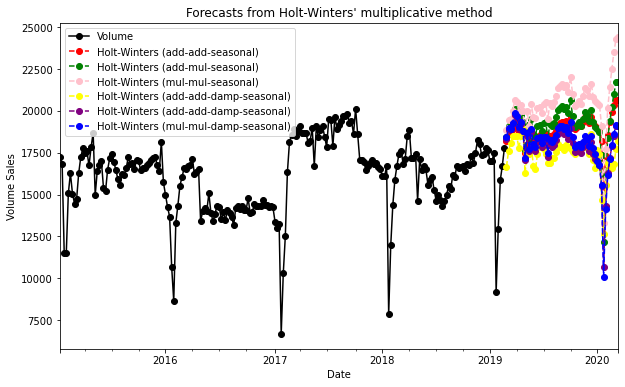

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
3653.631563963609
3943.026391979925
5270.784271231085
2235.2864686868134
2534.2197960860426
2697.4957022444246


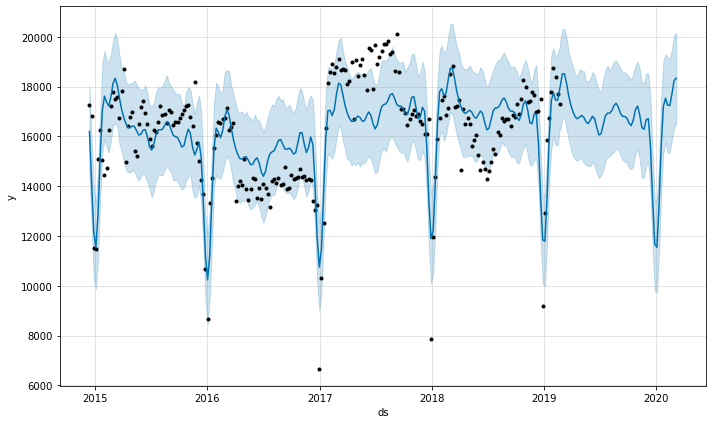

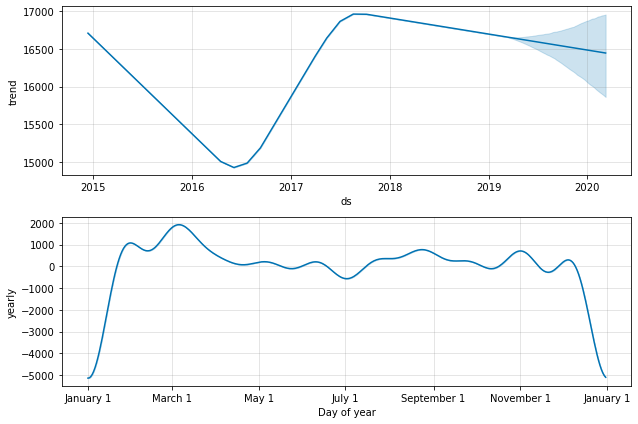

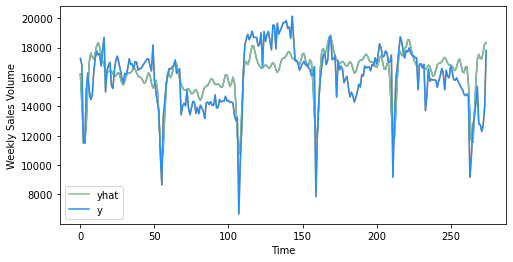

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 1482.0211478032347


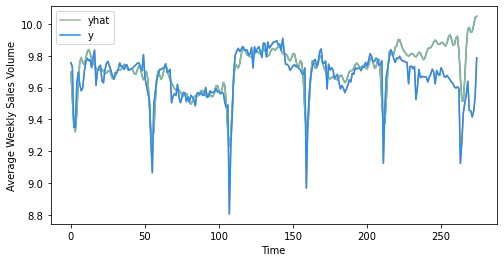

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 2092.9169734364827
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern I

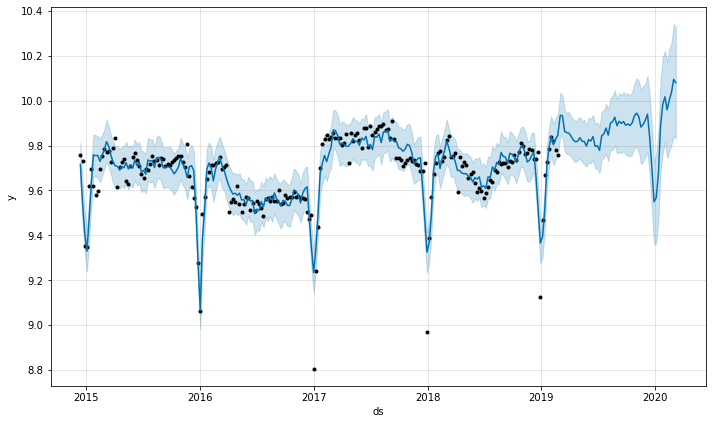

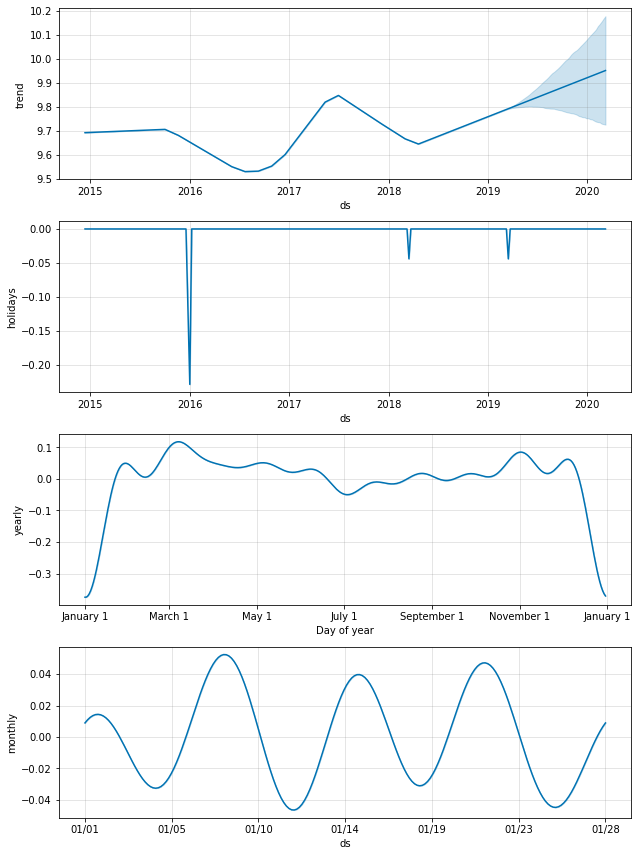

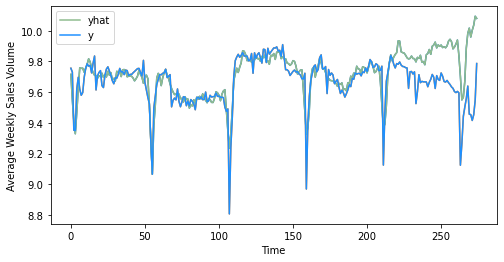

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 2248.0153554250087


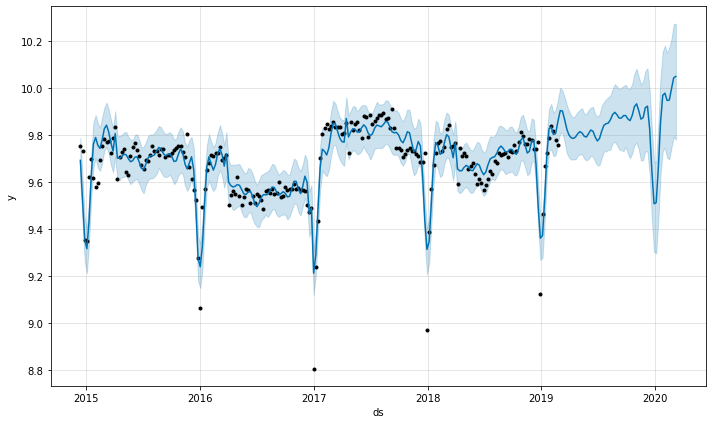

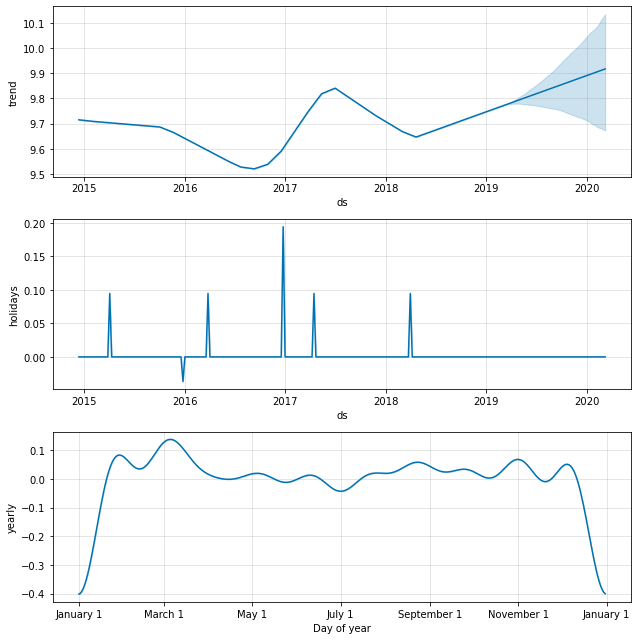

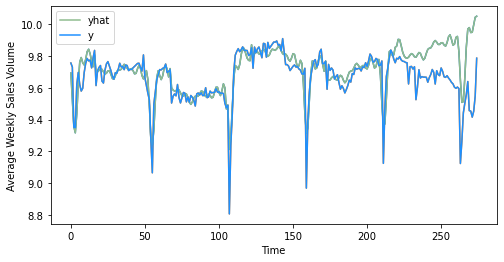

2084.076333134686


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [97]:
#time series models
baseline_model(mcv_rt_300g_origin)
ses_model(mcv_rt_300g_origin)
holt_linear_model(mcv_rt_300g_origin)
holt_linear_model_log(mcv_rt_300g_origin)
holt_winter_model(mcv_rt_300g_origin)
prophet_model(mcv_rt_300g_origin)
prophet_model_log(mcv_rt_300g_origin)
prophet_log_season(mcv_rt_300g_origin)
prophet_log_two_holiday(mcv_rt_300g_origin)


Observations: 27
Training Observations: 15
Testing Observations: 12
[  0.20782033  -2.15270729  -2.87442999 -12.17711239  -1.70361881]
Mean Absolute Error: 1659.5774999999956
Mean Squared Error: 3088179.1074374854
Root Mean Squared Error: 1757.3215720059563
Observations: 39
Training Observations: 27
Testing Observations: 12
[ -2.31658985  -1.77273571 -23.74678724  -1.34091146 -11.67818611]
Mean Absolute Error: 1889.5087499999993
Mean Squared Error: 5013939.275831246
Root Mean Squared Error: 2239.182724976067
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.8771624  -16.34853397  -0.96249111  -9.19138929  -1.48014193]
Mean Absolute Error: 460.44750000000005
Mean Squared Error: 304922.547525
Root Mean Squared Error: 552.1979242309772
Observations: 63
Training Observations: 51
Testing Observations: 12
[ -0.33351287  -1.86228744  -3.35385498 -13.31752824  -0.36253016]
Mean Absolute Error: 599.6575000000007
Mean Squared Error: 478063.4217000015
Root Mean Squared Erro

,var1(t-4),var1(t)
Date,,
2015-01-10,17259.3,15084.9
2015-01-17,16830.9,16269.3
2015-01-24,11520.9,15061.2
2015-01-31,11492.4,14468.4
2015-02-07,15084.9,14725.2
...,...,...
2020-02-15,13409.1,12756.6
2020-02-22,14161.5,12278.4
2020-02-29,15364.2,12749.4


   var1(t-4)   var1(t)
4   0.786582  0.624980
5   0.754743  0.713005
6   0.360103  0.623219
7   0.357985  0.579162
8   0.624980  0.598247
(216, 1, 1) (216,) (55, 1, 1) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 4s - loss: 0.6989 - val_loss: 0.6358
Epoch 2/50
216/216 - 0s - loss: 0.6852 - val_loss: 0.6221
Epoch 3/50
216/216 - 0s - loss: 0.6713 - val_loss: 0.6081
Epoch 4/50
216/216 - 0s - loss: 0.6571 - val_loss: 0.5936
Epoch 5/50
216/216 - 0s - loss: 0.6423 - val_loss: 0.5783
Epoch 6/50
216/216 - 0s - loss: 0.6267 - val_loss: 0.5622
Epoch 7/50
216/216 - 0s - loss: 0.6102 - val_loss: 0.5449
Epoch 8/50
216/216 - 0s - loss: 0.5925 - val_loss: 0.5262
Epoch 9/50
216/216 - 0s - loss: 0.5734 - val_loss: 0.5060
Epoch 10/50
216/216 - 0s - loss: 0.5526 - val_loss: 0.4839
Epoch 11/50
216/216 - 0s - loss: 0.5301 - val_loss: 0.4598
Epoch 12/50
216/216 - 0s - loss: 0.5057 - val_loss: 0.4342
Epoch 13/50
216/216 - 0s - loss: 0.4789 - val_loss: 0.4061
Epoch 14/50
216/216 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

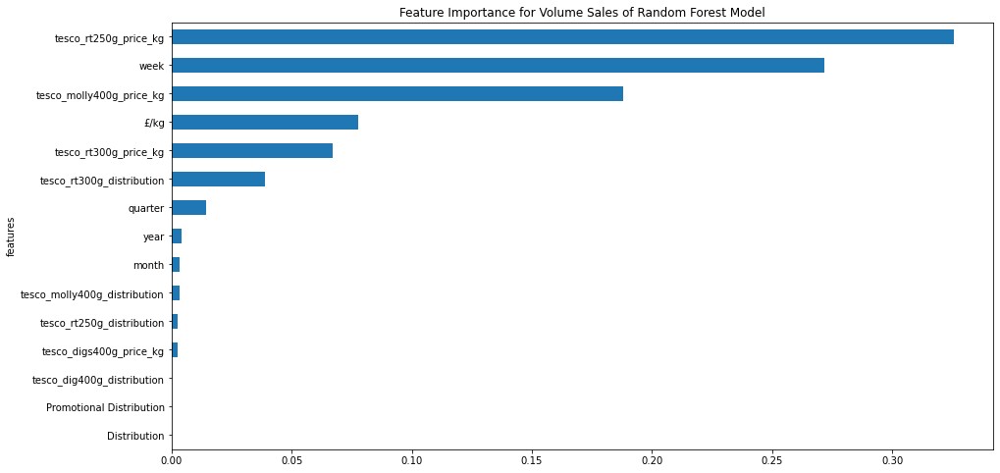

<Figure size 432x288 with 0 Axes>

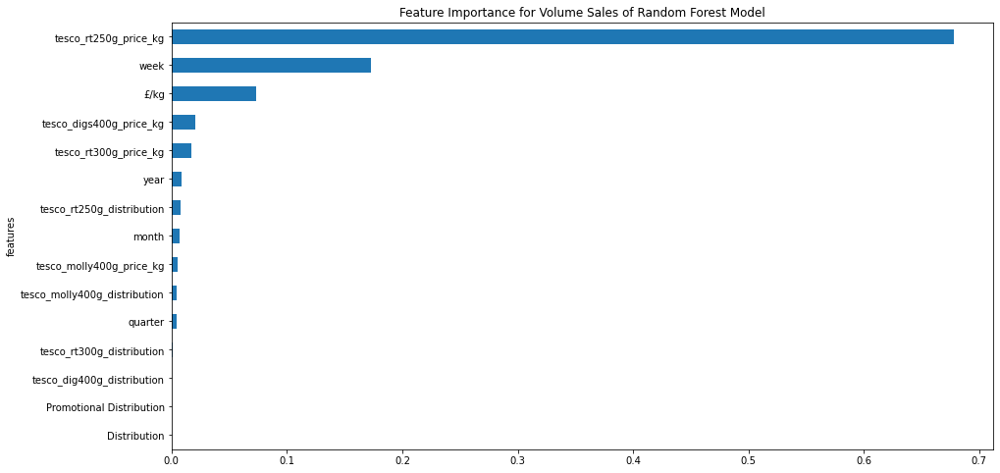

<Figure size 432x288 with 0 Axes>

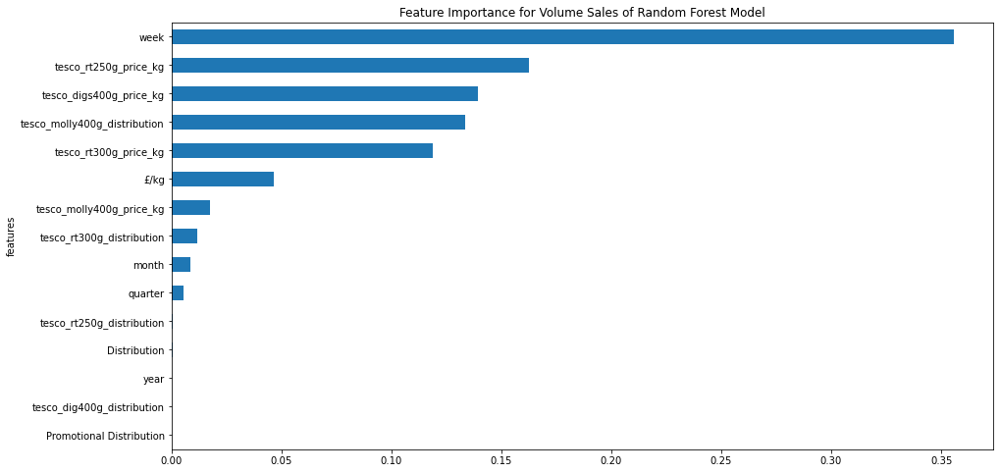

<Figure size 432x288 with 0 Axes>

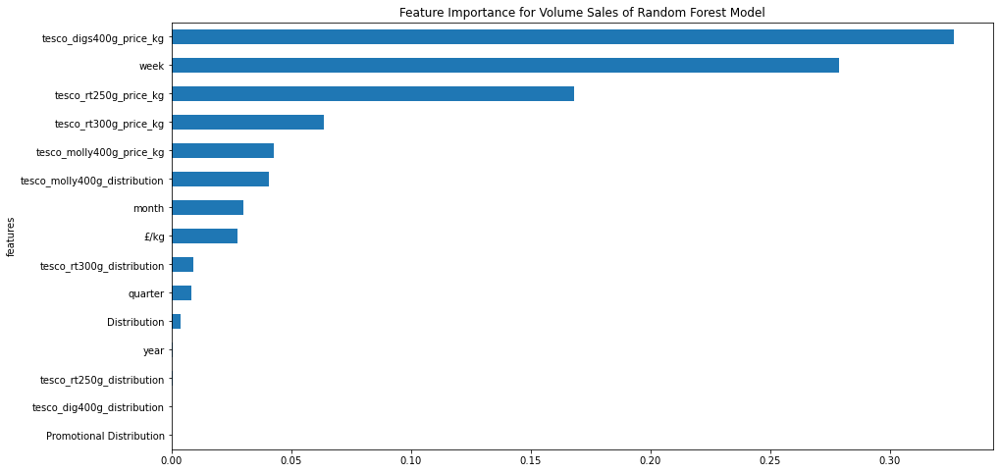

<Figure size 432x288 with 0 Axes>

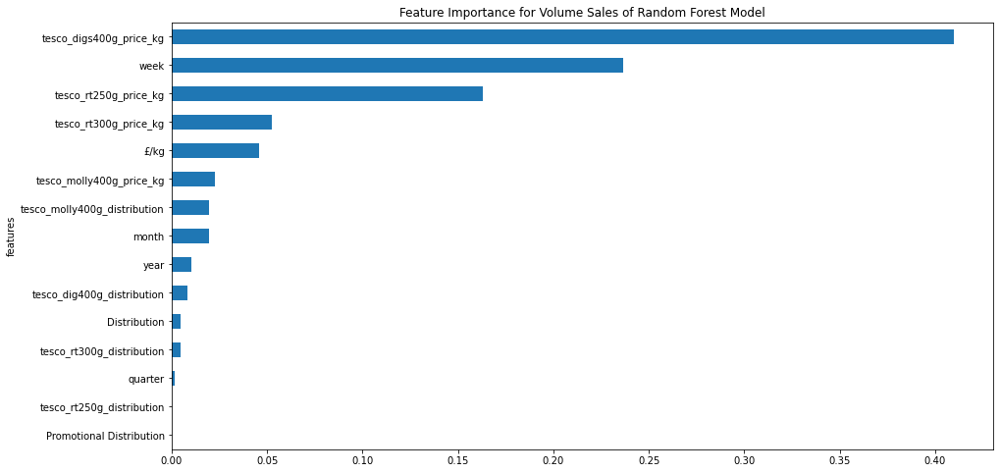

<Figure size 432x288 with 0 Axes>

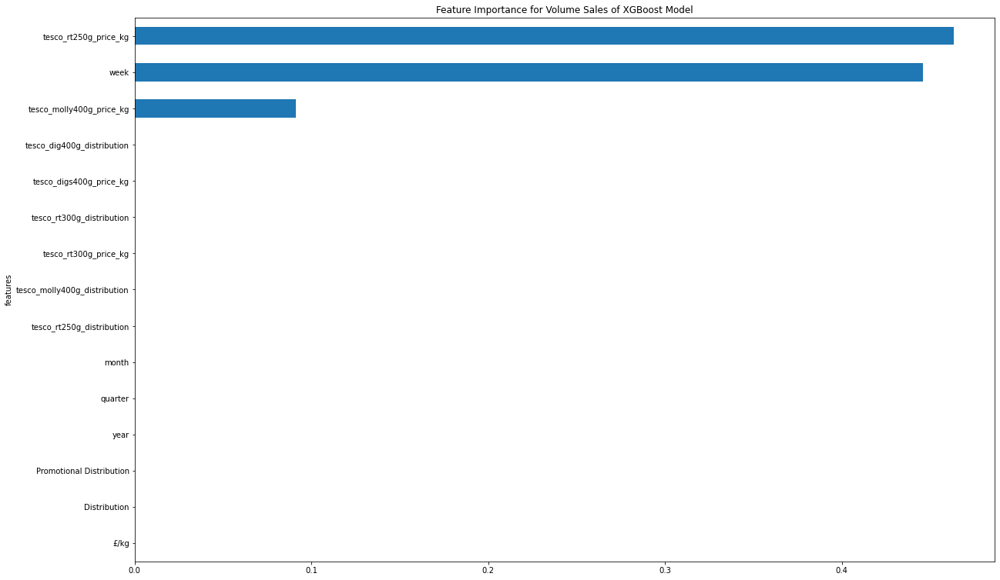

<Figure size 432x288 with 0 Axes>

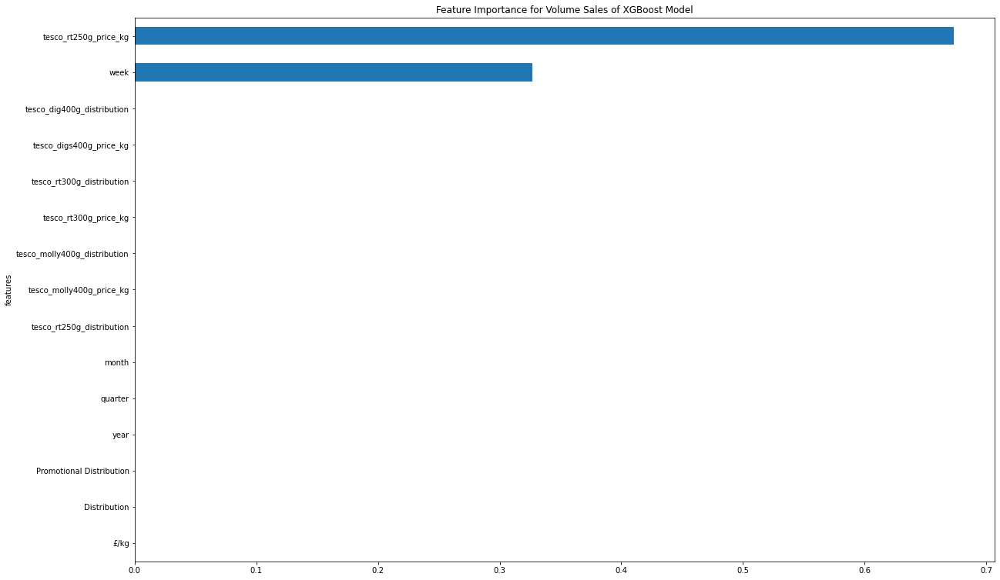

<Figure size 432x288 with 0 Axes>

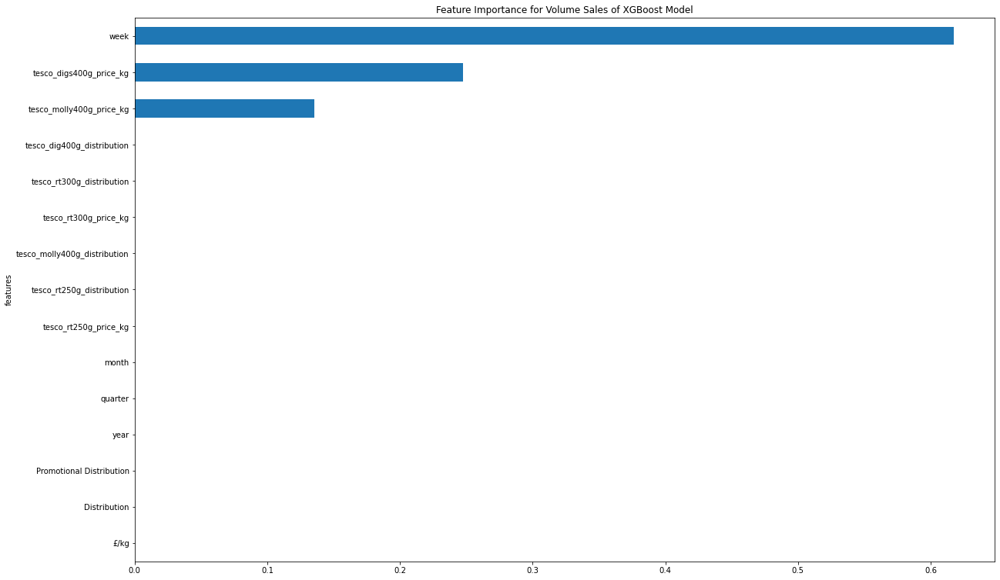

<Figure size 432x288 with 0 Axes>

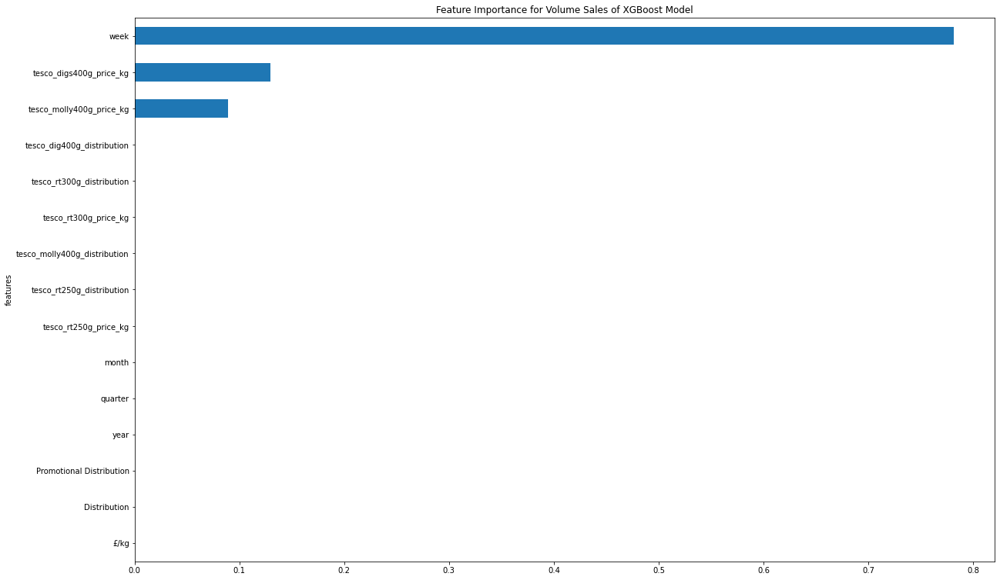

<Figure size 432x288 with 0 Axes>

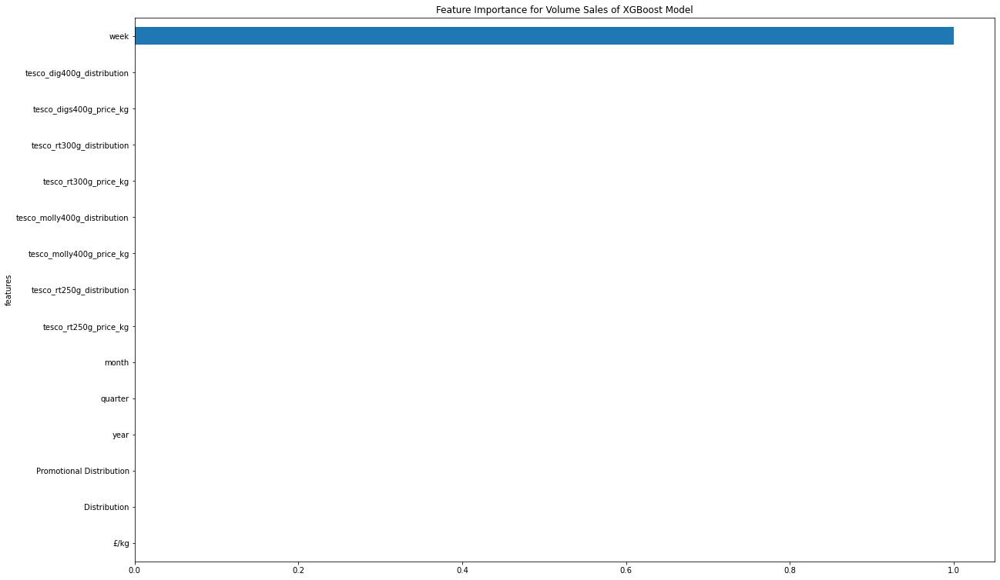

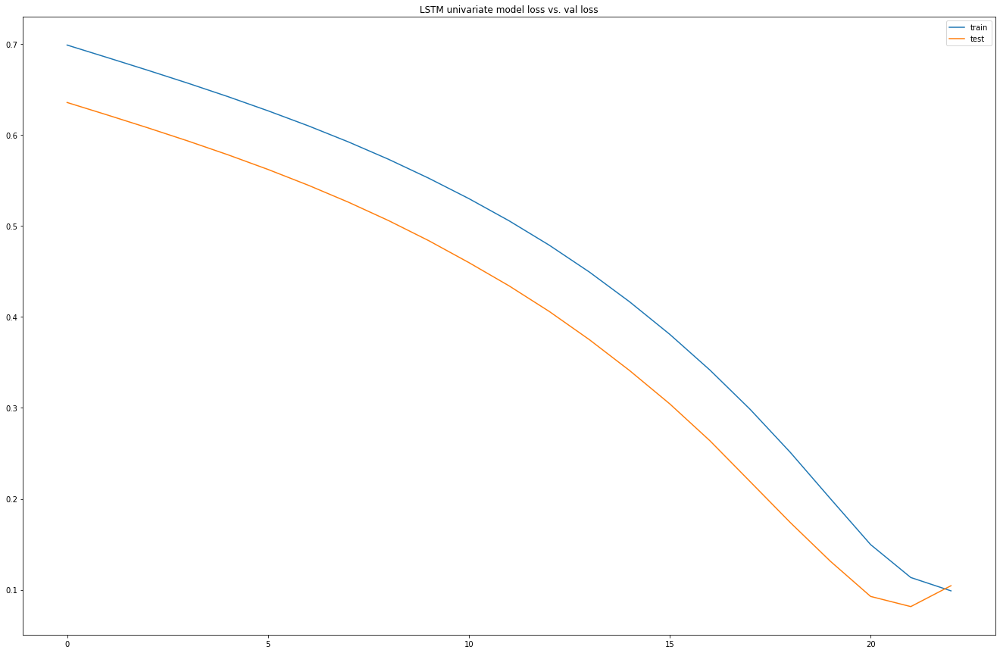

Test RMSE: 1952.459


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
Date,,,,,,,,,,,,,,,,
2015-01-10,17259.3,3.384627,100.0,0.0,2014.0,4.0,12.0,50.0,15084.9,3.396960,100,0,2015,1,1,2
2015-01-17,16830.9,3.386913,100.0,0.0,2014.0,4.0,12.0,51.0,16269.3,3.398573,100,0,2015,1,1,3
2015-01-24,11520.9,3.399665,100.0,0.0,2014.0,4.0,12.0,52.0,15061.2,3.536073,100,0,2015,1,1,4
2015-01-31,11492.4,3.396514,100.0,0.0,2015.0,1.0,1.0,1.0,14468.4,3.636788,100,0,2015,1,1,5
2015-02-07,15084.9,3.396960,100.0,0.0,2015.0,1.0,1.0,2.0,14725.2,3.635421,100,0,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,13409.1,3.332535,100.0,0.0,2020.0,1.0,1.0,3.0,12756.6,3.967342,100,0,2020,1,2,7
2020-02-22,14161.5,3.331737,100.0,0.0,2020.0,1.0,1.0,4.0,12278.4,3.963619,100,0,2020,1,2,8
2020-02-29,15364.2,3.334121,100.0,0.0,2020.0,1.0,2.0,5.0,12749.4,3.960884,100,0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.786582   0.299385   1.000001        0.0   0.000000        1.0   
5   0.754743   0.302134   1.000001        0.0   0.000000        1.0   
6   0.360103   0.317465   1.000001        0.0   0.000000        1.0   
7   0.357985   0.313677   1.000001        0.0   0.166656        0.0   
8   0.624980   0.314213   1.000001        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)   var1(t)  
4        1.0   0.942308  0.624980  
5        1.0   0.961538  0.713005  
6        1.0   0.980769  0.623219  
7        0.0   0.000000  0.579162  
8        0.0   0.019231  0.598247  
(216, 1, 8) (216,) (55, 1, 8) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 4s - loss: 0.6988 - val_loss: 0.6244
Epoch 2/50
216/216 - 0s - loss: 0.6706 - val_loss: 0.5923
Epoch 3/50
216/216 - 0s - loss: 0.6411 - val_loss: 0.5580
Epoch 4/50
216/216 - 0s - loss: 0.6098 - val_loss: 0.5203
Epoch 5/50
216/216 - 0s - loss: 0.5753 - val

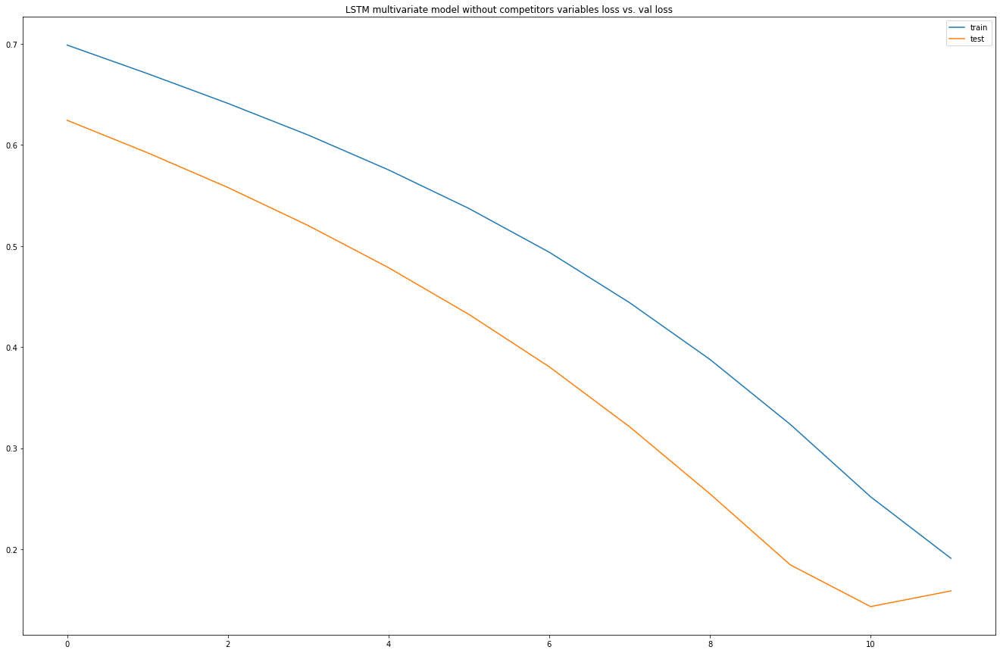

Test RMSE: 2830.474


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-11-10,16893.0,3.328089,100.0,0.0,2018.0,4.0,10.0,41.0,2.241567,100.0,...,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,17493.9,3.330738,100.0,0.0,2018.0,4.0,10.0,42.0,2.241541,100.0,...,11,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
2018-11-24,18264.9,3.335835,100.0,0.0,2018.0,4.0,10.0,43.0,2.241566,100.0,...,11,47,2.241489,100,0.774914,58.0,0.999886,83.0,1.125535,99
2018-12-01,18000.0,3.332644,100.0,0.0,2018.0,4.0,11.0,44.0,2.241457,100.0,...,12,48,2.241464,100,0.774983,58.0,0.999433,83.0,1.125242,99
2018-12-08,17365.2,3.329135,100.0,0.0,2018.0,4.0,11.0,45.0,2.241417,100.0,...,12,49,2.241518,100,0.774887,58.0,0.999955,83.0,1.125299,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,13409.1,3.332535,100.0,0.0,2020.0,1.0,1.0,3.0,2.241691,100.0,...,2,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,14161.5,3.331737,100.0,0.0,2020.0,1.0,1.0,4.0,2.241683,100.0,...,2,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,15364.2,3.334121,100.0,0.0,2020.0,1.0,2.0,5.0,2.241582,100.0,...,2,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.807426   0.004945        1.0        0.0        0.0        1.0   
5   0.870237   0.009069        1.0        0.0        0.0        1.0   
6   0.950829   0.017004        1.0        0.0        0.0        1.0   
7   0.923140   0.012037        1.0        0.0        0.0        1.0   
8   0.856784   0.006575        1.0        0.0        0.0        1.0   

   var7(t-4)  var8(t-4)  var9(t-4)  var10(t-4)  var11(t-4)  var12(t-4)  \
4   0.818182   0.784314   0.994400         1.0    0.980005    0.136842   
5   0.818182   0.803922   0.993778         1.0    0.979163    0.589474   
6   0.818182   0.823529   0.994396         1.0    0.978738    0.589474   
7   0.909091   0.843137   0.991779         1.0    0.979244    0.589474   
8   0.909091   0.862745   0.990829         1.0    0.978948    0.600000   

   var13(t-4)  var14(t-4)  var15(t-4)  var16(t-4)   var1(t)  
4    0.982941         0.5    0.760128         1.0  0.856784  
5   

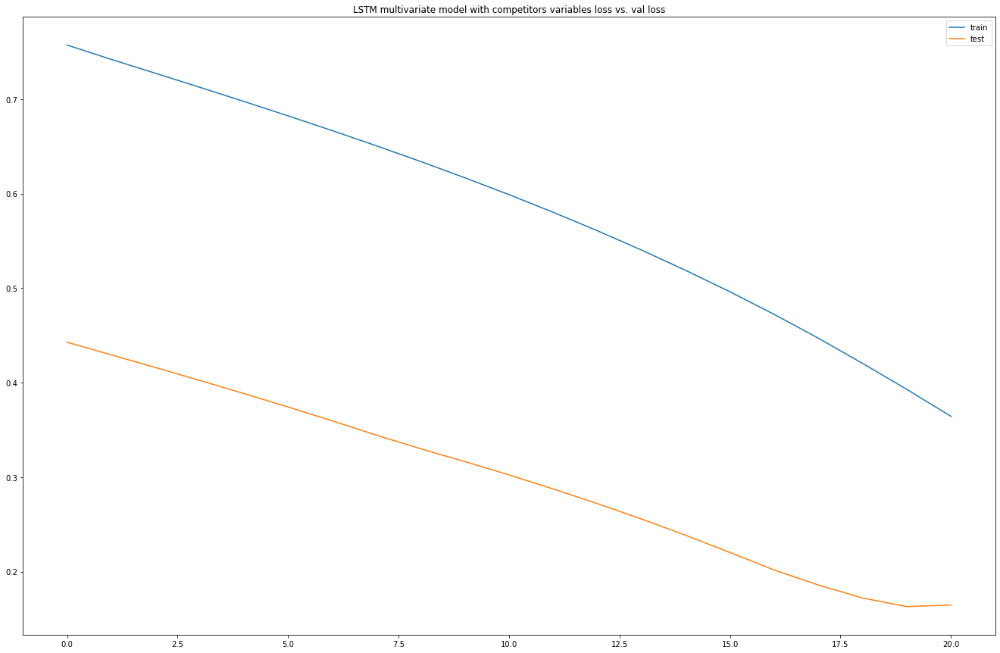

Test RMSE: 2128.310


In [98]:
#ml models
mcv_rt_300g_input_X,mcv_rt_300g_input_Y=input_var(mcv_rt_300g_with_comp)
rf_regressor_mcv(mcv_rt_300g_input_X,mcv_rt_300g_input_Y)

mcv_rt_300g_input_X,mcv_rt_300g_input_Y=input_var(mcv_rt_300g_with_comp)
xgb_regressor_mcv(mcv_rt_300g_input_X,mcv_rt_300g_input_Y)

#lstm models
series_to_supervised(mcv_rt_300g_volume)
lstm_univariate(mcv_rt_300g_volume)

series_to_supervised(mcv_rt_300g_own_variable)
multivariate_lstm_without_competitor(mcv_rt_300g_own_variable)

series_to_supervised(mcv_rt_300g_with_comp)
multivariate_with_competitor(mcv_rt_300g_with_comp)

### Tesco Large - McVitie's Digestives Rich Tea 300g Twin Pack

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,29186,17512,55159,96,0,1.89,3.15,2014,4,12,50
1,2014-12-20,29296,17578,55368,96,0,1.89,3.15,2014,4,12,51
2,2014-12-27,19627,11776,37097,96,0,1.89,3.15,2014,4,12,52
3,2015-01-03,20399,12239,38553,96,0,1.89,3.15,2015,1,1,1
4,2015-01-10,26463,15878,50015,96,0,1.89,3.15,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                               int64
Value                                int64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.0,275.00000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,30580.287273,18348.160000,57701.327273,93.810909,0.0,1.88720,3.145345,2017.083636,2.469091,6.414545,26.043636
std,5783.902741,3470.324743,11033.581557,11.254548,0.0,0.04098,0.068520,1.534371,1.140635,3.547767,15.490223
min,16518.000000,9911.000000,31211.000000,62.000000,0.0,1.50000,2.500000,2014.000000,1.000000,1.000000,1.000000
25%,28326.000000,16995.500000,53532.500000,97.000000,0.0,1.89000,3.150000,2016.000000,1.000000,3.000000,12.000000
50%,31847.000000,19108.000000,60114.000000,98.000000,0.0,1.89000,3.150000,2017.000000,2.000000,6.000000,26.000000
75%,33942.000000,20365.500000,64057.500000,98.000000,0.0,1.89000,3.150000,2018.000000,3.500000,9.500000,39.500000
95%,37289.300000,22373.700000,69994.900000,99.000000,0.0,1.89000,3.150000,2019.000000,4.000000,12.000000,50.000000
99%,41694.480000,25016.340000,77315.800000,99.000000,0.0,1.99000,3.320000,2020.000000,4.000000,12.000000,52.000000
max,61037.000000,36622.000000,121479.000000,99.000000,0.0,1.99000,3.320000,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

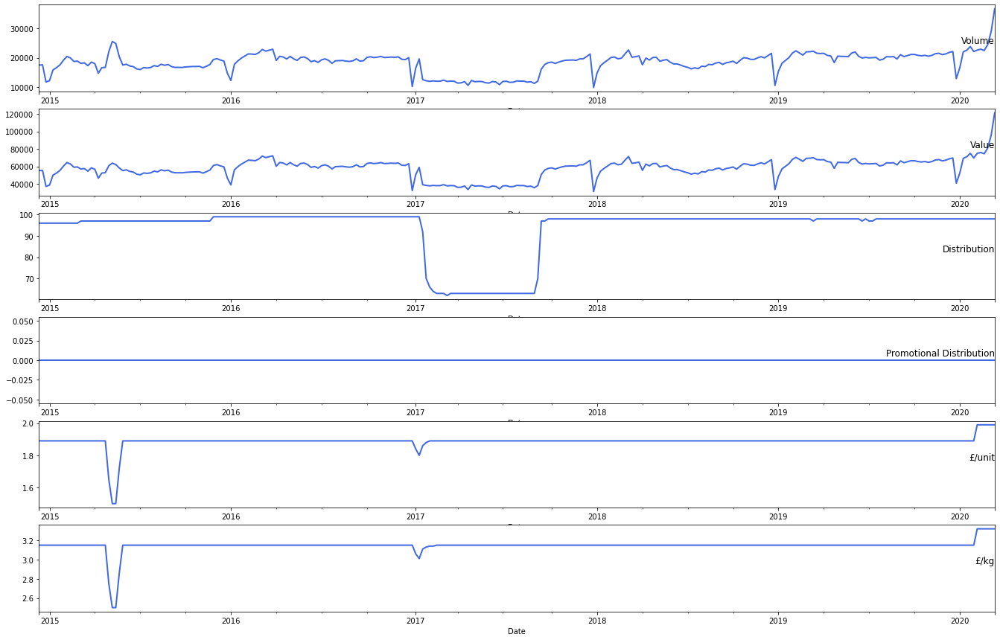

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31b173b2e8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31b16a6a90>)

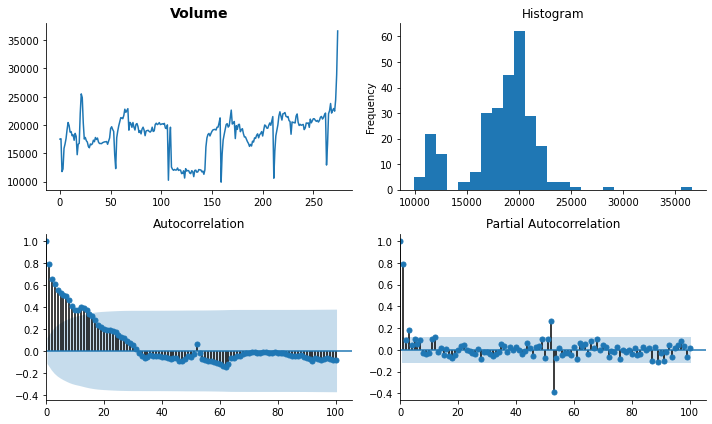

In [99]:
basic_info(mcv_rt_300g_twin_origin)
plot_data(mcv_rt_300g_twin_origin)
tsplot(mcv_rt_300g_twin_origin['Volume'].dropna(), title=mcv_rt_300g_twin_origin.columns[2], lags=100)


Test Statistic                  -2.115810
p-value                          0.238205
#Lags Used                       2.000000
Number of Observations Used    272.000000
Critical Value (1%)             -3.454622
Critical Value (5%)             -2.872225
Critical Value (10%)            -2.572464
dtype: float64


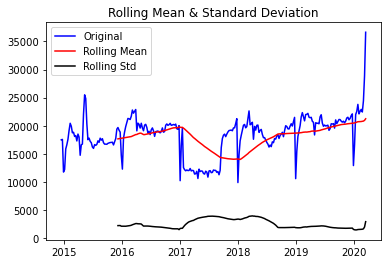

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1406: RuntimeWarning:

invalid value encountered in sqrt



(<matplotlib.axes._subplots.AxesSubplot at 0x7f31b155b9e8>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31b147f860>)

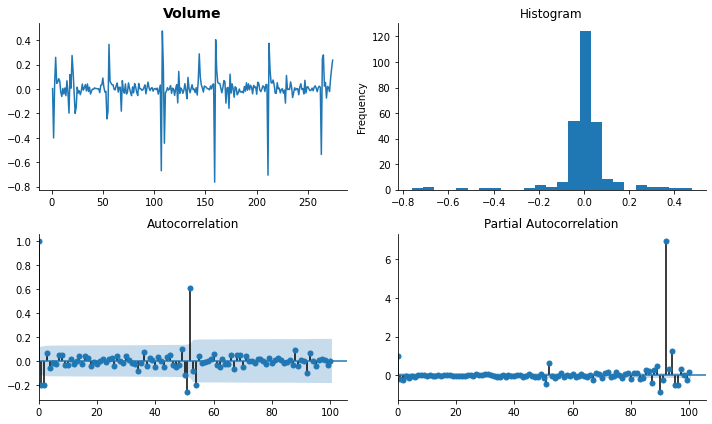

In [100]:

plot(mcv_rt_300g_twin_origin)
series_transformed=mcv_rt_300g_twin_origin.copy()
series_transformed['Volume_transformed']=np.log(mcv_rt_300g_twin_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=mcv_rt_300g_twin_origin.columns[2], lags=100)

       t-4    t+1
0      NaN  17512
1      NaN  17578
2      NaN  11776
3      NaN  12239
4  17512.0  15878
Test MSE: 9255843.855
Test RMSE: 3042.342


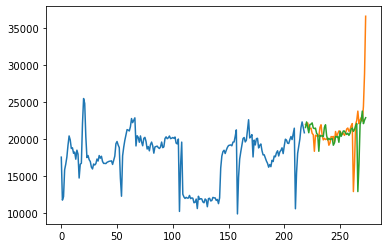

Observations: 271
Training Observations: 216
Testing Observations: 55


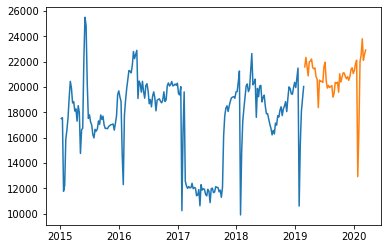

RMSE for Simple Exponential Smoothing α= 0.1 is: 2804.78
RMSE for Simple Exponential Smoothing α= 0.2 is: 2856.96
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 2813.88
RMSE for Simple Exponential Smoothing α= 0.4 is: 2634.98
RMSE for Simple Exponential Smoothing α= 0.5 is: 2397.24
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 2172.25
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 1996.97
RMSE for Simple Exponential Smoothing α= 0.8 is: 1876.88
RMSE for Simple Exponential Smoothing α= 0.9 is: 1799.67


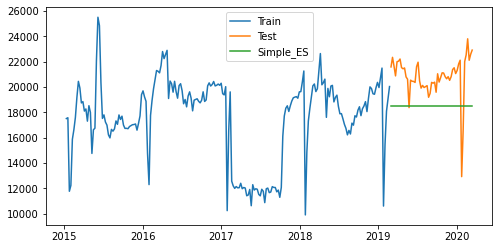

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 4113.33
Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.1 and β= 0.2 is: 1849.33


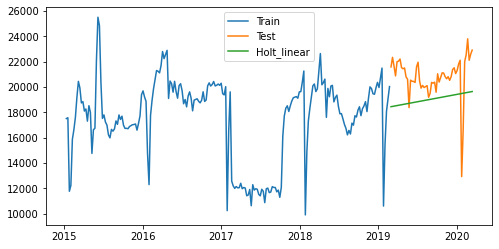

Observations: 275
Training Observations: 204
Testing Observations: 59


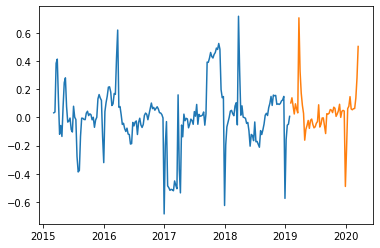

            Volume    pred_value
Date                            
2019-02-02   21585  22300.382994
2019-02-09   22341  23125.807603
2019-02-16   21639  22442.204594
2019-02-23   20878  21694.580382
2019-03-02   21995  22899.202531
2019-03-09   22038  22988.074790
2019-03-16   22208  23209.933825
2019-03-23   21531  22545.646079
2019-03-30   21438  22491.415132
2019-04-06   21504  22604.025946
2019-04-13   20797  21902.882247
2019-04-20   20617  21755.049621
2019-04-27   18374  19425.506442
2019-05-04   20543  21760.382998
2019-05-11   20457  21710.940881
2019-05-18   20442  21736.725167
2019-05-25   20360  21691.147861
2019-06-01   21599  23055.388052
2019-06-08   21957  23482.580757
2019-06-15   20485  21950.419356
2019-06-22   19914  21379.590718
2019-06-29   20126  21648.727972
2019-07-06   19960  21511.439959
2019-07-13   20034  21632.695934
2019-07-20   20108  21754.338596
2019-07-27   19192  20803.254064
2019-08-03   19495  21172.313127
2019-08-10   20366  22160.769626
2019-08-17

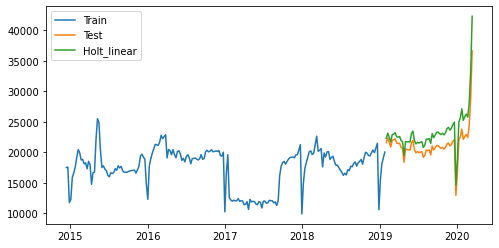

RMSE for Holt Linear Forecasting with transformation is: 2226.1010824244304


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/

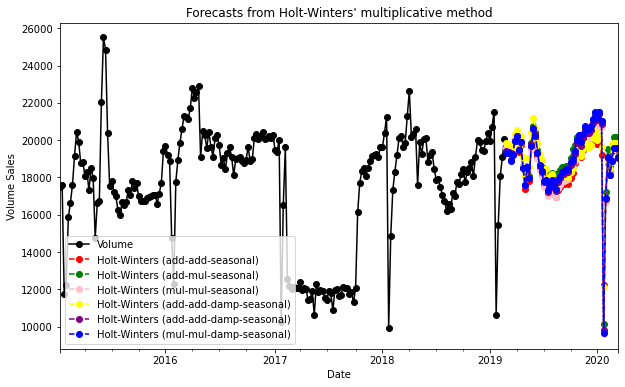

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
2430.1528699865894
2014.3240433910987
2402.574111515291
2071.562748203051
2267.6445712201876
2228.043185142992


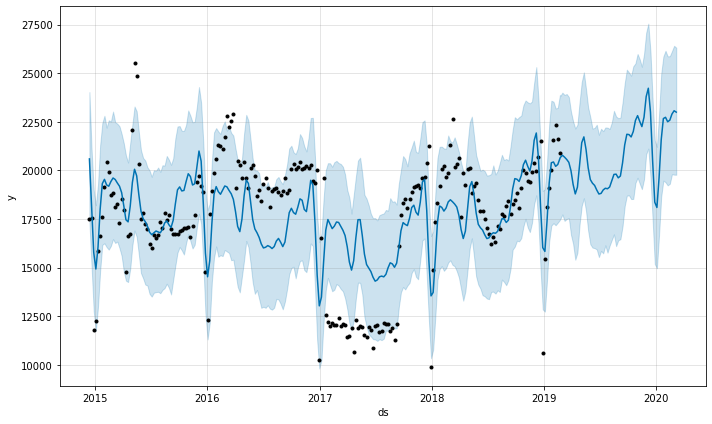

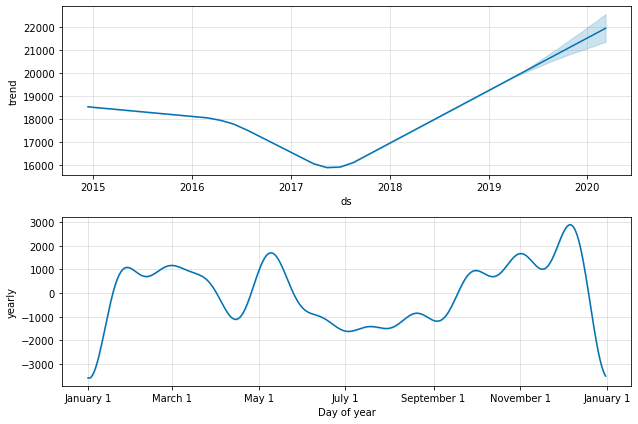

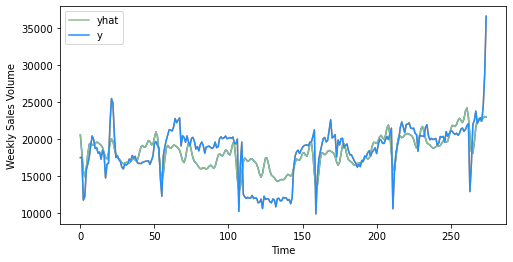

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 2504.930588969978


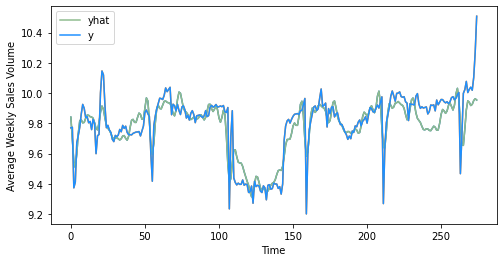

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 2017.9933959315483
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern I

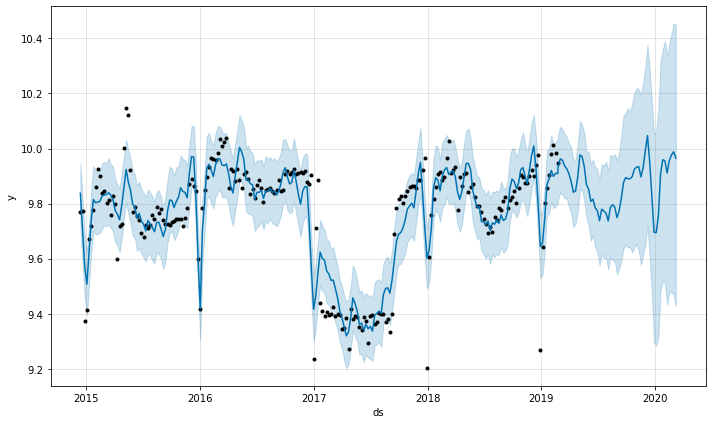

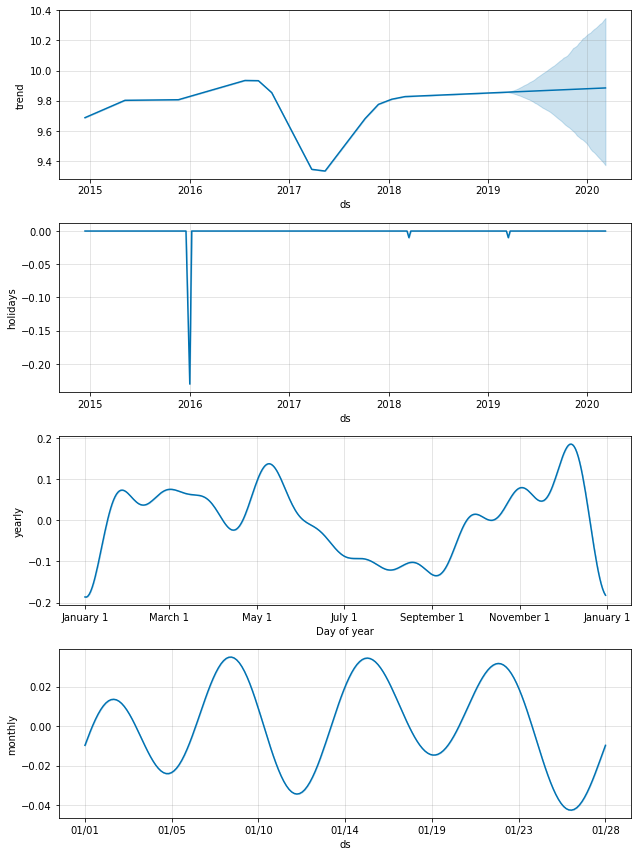

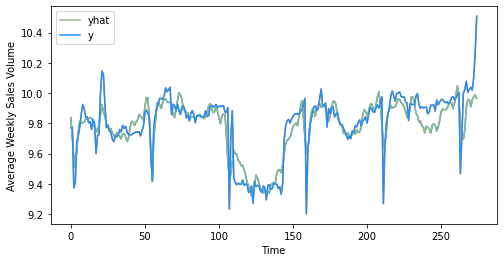

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 1952.1479073952528


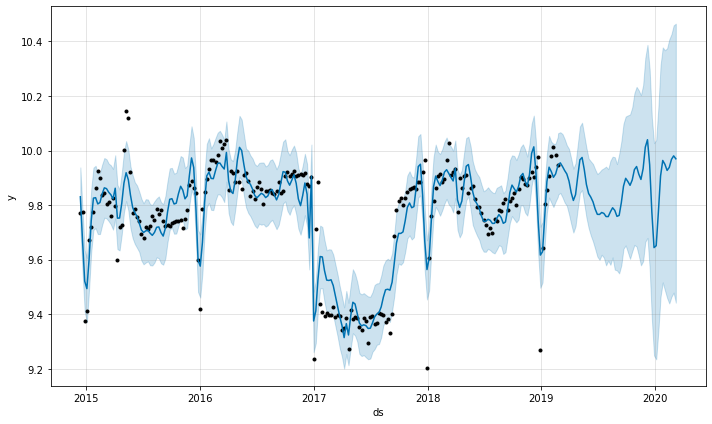

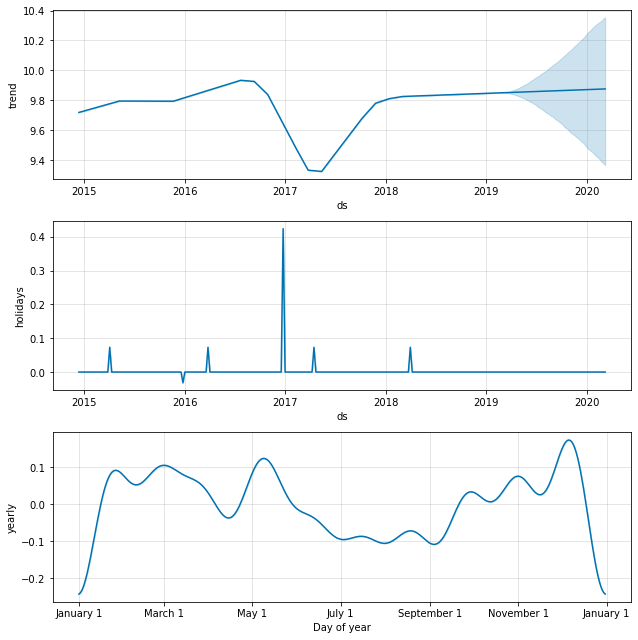

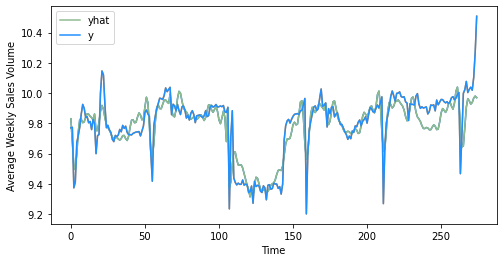

1939.454492947377


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [101]:
#time series models
baseline_model(mcv_rt_300g_twin_origin)
ses_model(mcv_rt_300g_twin_origin)
holt_linear_model(mcv_rt_300g_twin_origin)
holt_linear_model_log(mcv_rt_300g_twin_origin)
holt_winter_model(mcv_rt_300g_twin_origin)
prophet_model(mcv_rt_300g_twin_origin)
prophet_model_log(mcv_rt_300g_twin_origin)
prophet_log_season(mcv_rt_300g_twin_origin)
prophet_log_two_holiday(mcv_rt_300g_twin_origin)

Observations: 27
Training Observations: 15
Testing Observations: 12
[ -1.76496519  -5.86059321 -10.91273258  -8.2398983   -4.25761145]
Mean Absolute Error: 3054.2666666666664
Mean Squared Error: 10192827.3925
Root Mean Squared Error: 3192.6207717954853
Observations: 39
Training Observations: 27
Testing Observations: 12
[ -3.38695807  -1.52373763 -13.89673231 -10.2314233   -5.77652747]
Mean Absolute Error: 1414.4041666666665
Mean Squared Error: 4294626.429791667
Root Mean Squared Error: 2072.3480474552694
Observations: 51
Training Observations: 39
Testing Observations: 12
[ -0.24735005 -16.89432803  -6.17591504 -11.21638349  -1.4896983 ]
Mean Absolute Error: 729.2791666666666
Mean Squared Error: 982730.9043750003
Root Mean Squared Error: 991.3278490867692
Observations: 63
Training Observations: 51
Testing Observations: 12
[-0.18233748 -7.73205134 -4.91987158 -7.81483158 -3.41001138]
Mean Absolute Error: 732.433333333333
Mean Squared Error: 1389916.8820833329
Root Mean Squared Error: 117

,var1(t-4),var1(t)
Date,,
2015-01-10,17512.0,15878
2015-01-17,17578.0,16634
2015-01-24,11776.0,17597
2015-01-31,12239.0,19168
2015-02-07,15878.0,20446
...,...,...
2020-02-15,22543.0,22913
2020-02-22,23803.0,22450
2020-02-29,22112.0,24445


   var1(t-4)   var1(t)
4   0.284564  0.223391
5   0.287035  0.251694
6   0.069821  0.287747
7   0.087155  0.346561
8   0.223391  0.394407
(216, 1, 1) (216,) (55, 1, 1) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 4s - loss: 0.2853 - val_loss: 0.4121
Epoch 2/50
216/216 - 0s - loss: 0.2743 - val_loss: 0.4000
Epoch 3/50
216/216 - 0s - loss: 0.2632 - val_loss: 0.3874
Epoch 4/50
216/216 - 0s - loss: 0.2518 - val_loss: 0.3743
Epoch 5/50
216/216 - 0s - loss: 0.2399 - val_loss: 0.3605
Epoch 6/50
216/216 - 0s - loss: 0.2274 - val_loss: 0.3458
Epoch 7/50
216/216 - 0s - loss: 0.2146 - val_loss: 0.3301
Epoch 8/50
216/216 - 0s - loss: 0.2022 - val_loss: 0.3137
Epoch 9/50
216/216 - 0s - loss: 0.1914 - val_loss: 0.2974
Epoch 10/50
216/216 - 0s - loss: 0.1806 - val_loss: 0.2804
Epoch 11/50
216/216 - 0s - loss: 0.1692 - val_loss: 0.2624
Epoch 12/50
216/216 - 0s - loss: 0.1572 - val_loss: 0.2432
Epoch 13/50
216/216 - 0s - loss: 0.1443 - val_loss: 0.2224
Epoch 14/50
216/216 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

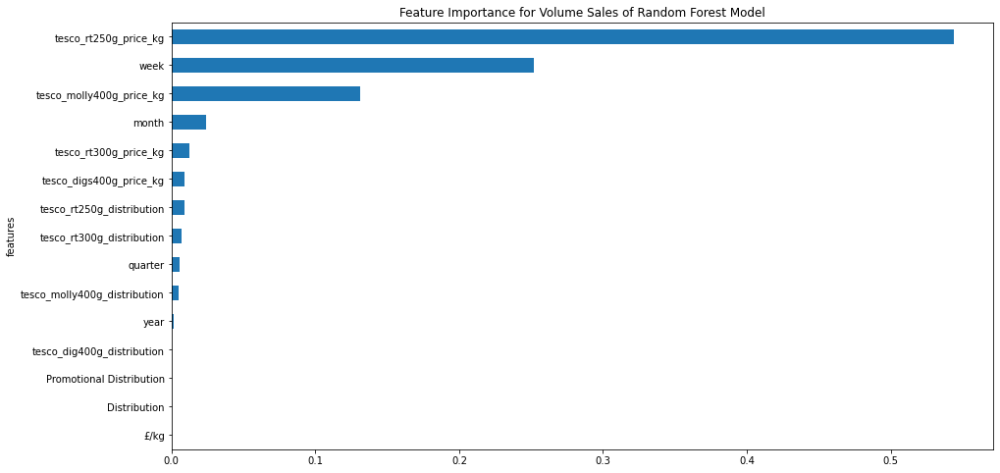

<Figure size 432x288 with 0 Axes>

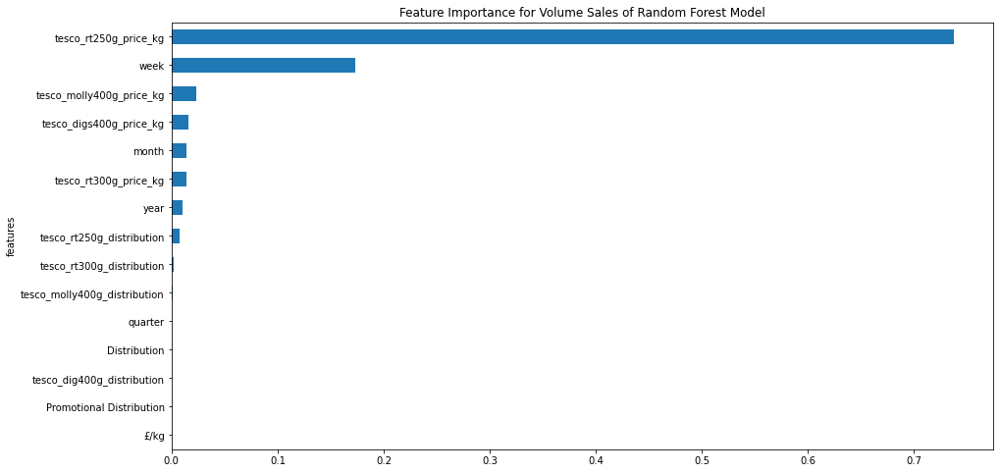

<Figure size 432x288 with 0 Axes>

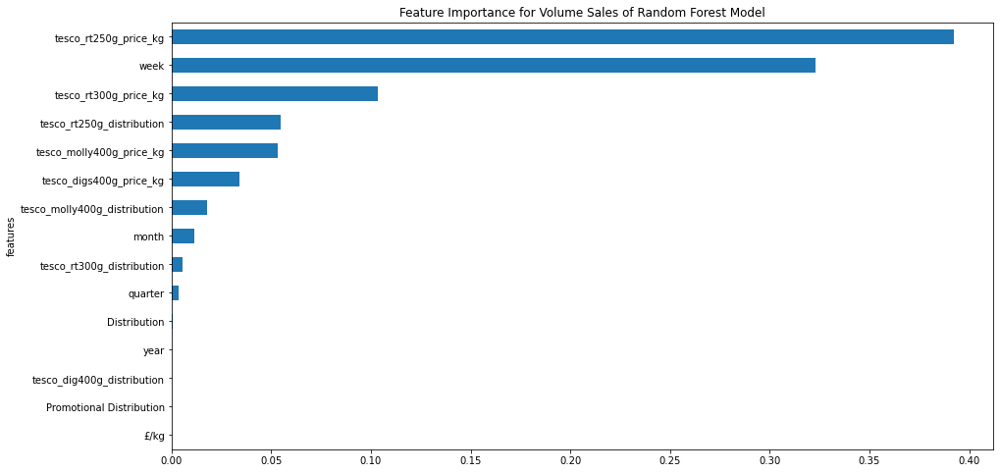

<Figure size 432x288 with 0 Axes>

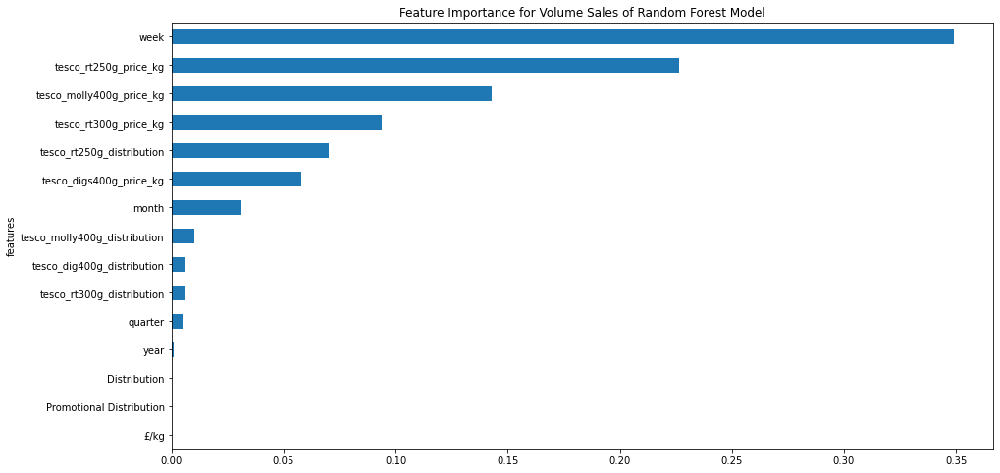

<Figure size 432x288 with 0 Axes>

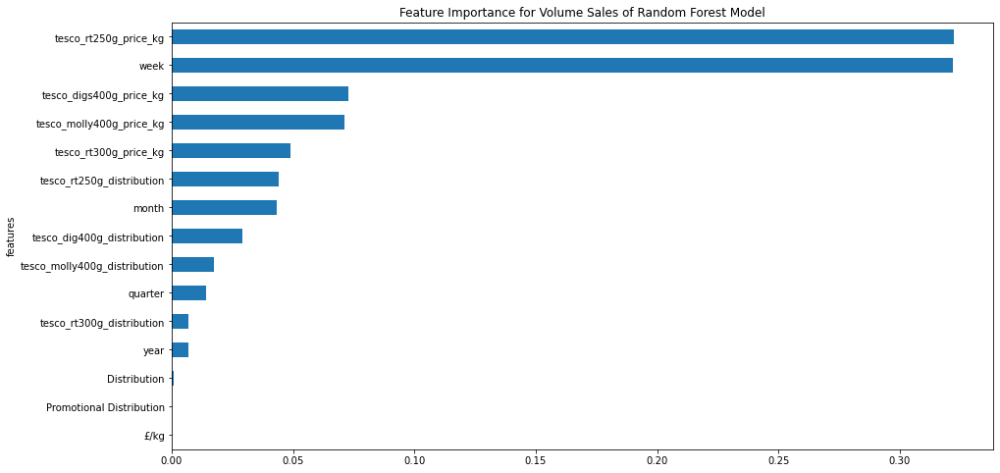

<Figure size 432x288 with 0 Axes>

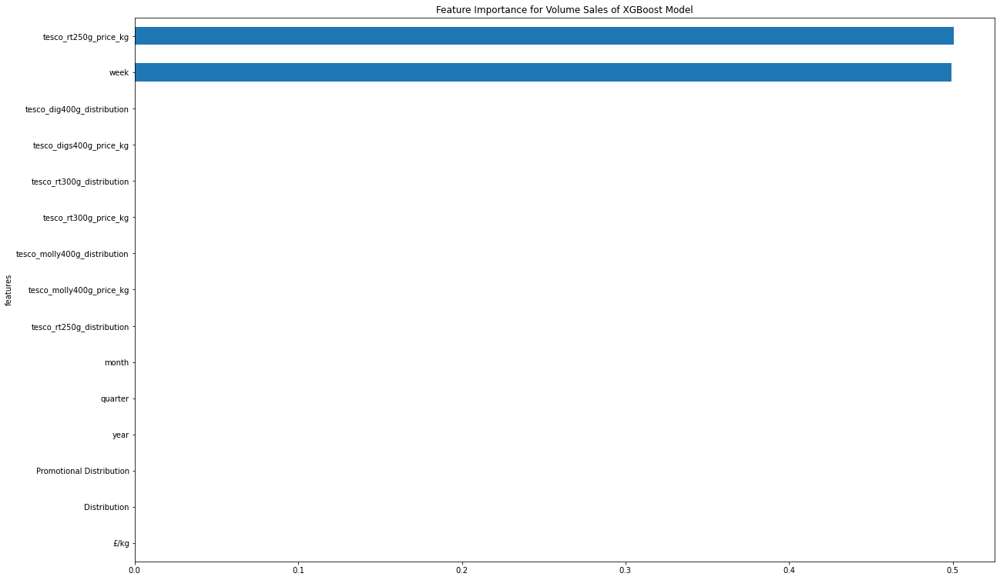

<Figure size 432x288 with 0 Axes>

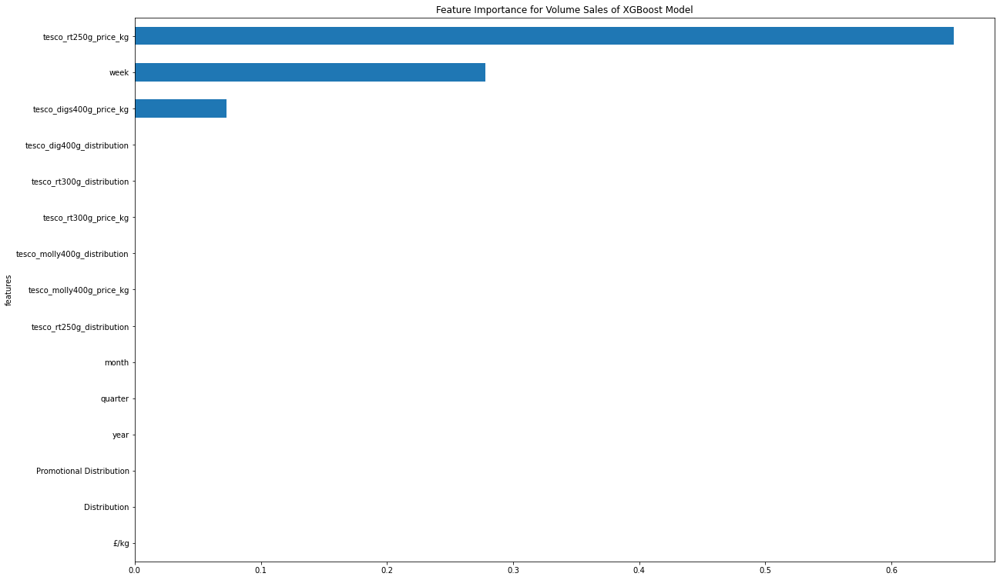

<Figure size 432x288 with 0 Axes>

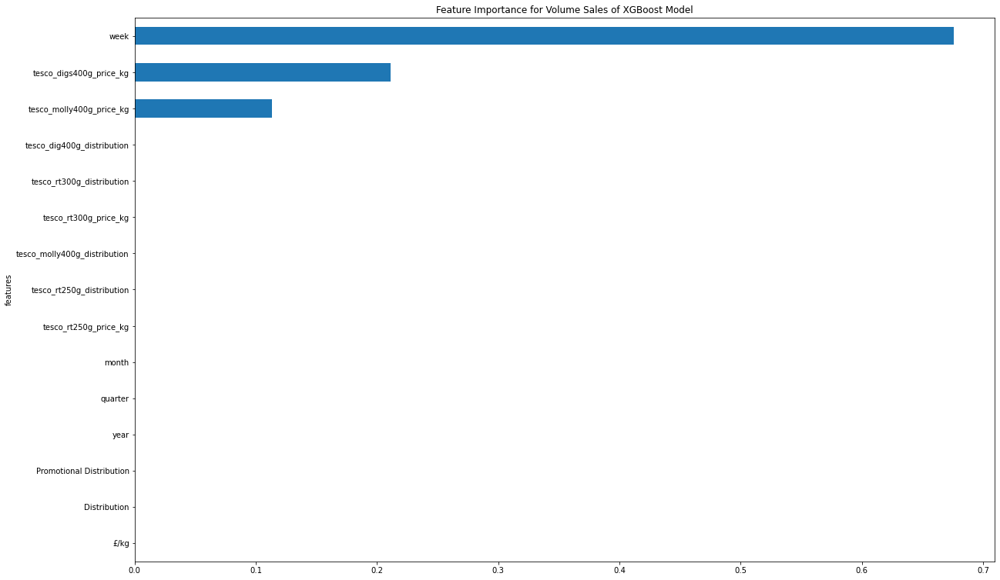

<Figure size 432x288 with 0 Axes>

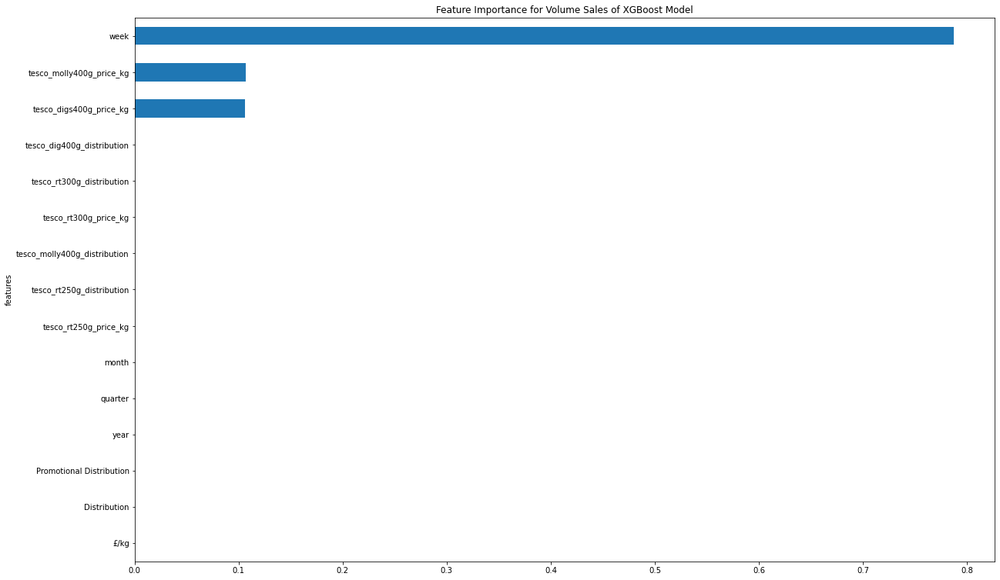

<Figure size 432x288 with 0 Axes>

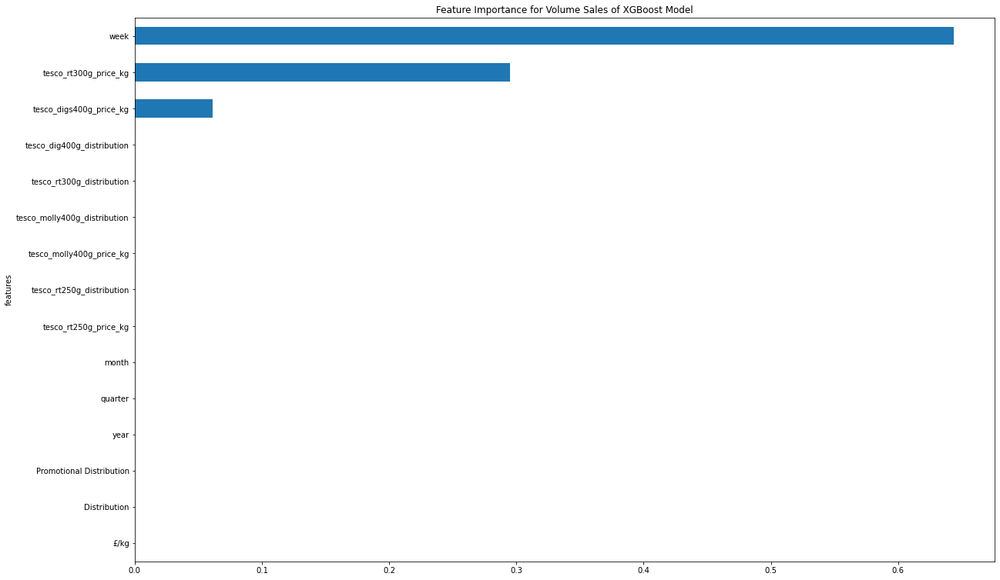

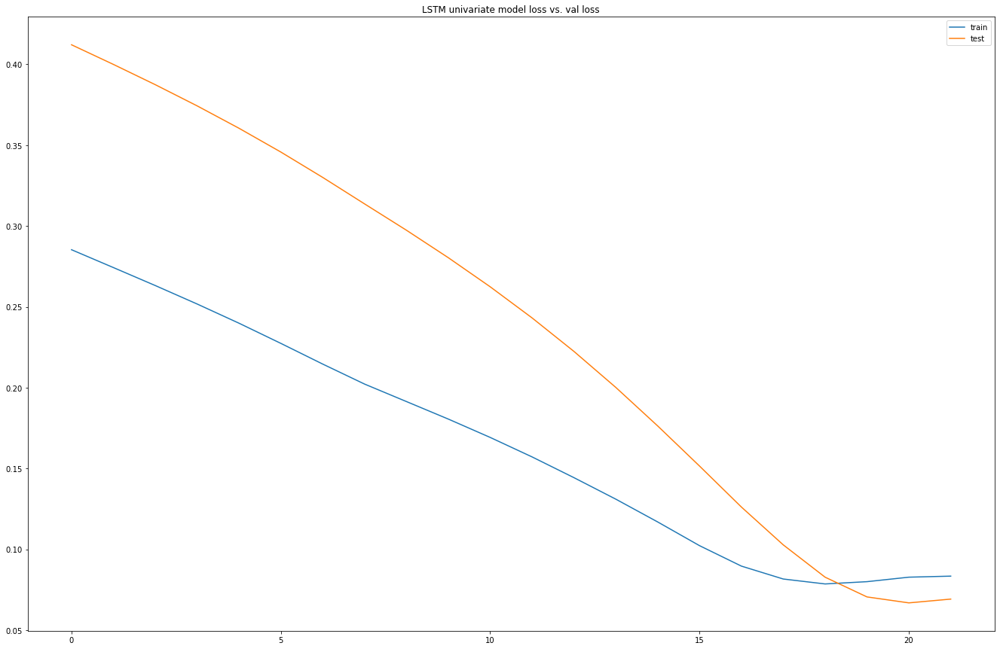

Test RMSE: 3126.536


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
Date,,,,,,,,,,,,,,,,
2015-01-10,17512.0,3.15,96.0,0.0,2014.0,4.0,12.0,50.0,15878,3.15,96,0,2015,1,1,2
2015-01-17,17578.0,3.15,96.0,0.0,2014.0,4.0,12.0,51.0,16634,3.15,96,0,2015,1,1,3
2015-01-24,11776.0,3.15,96.0,0.0,2014.0,4.0,12.0,52.0,17597,3.15,96,0,2015,1,1,4
2015-01-31,12239.0,3.15,96.0,0.0,2015.0,1.0,1.0,1.0,19168,3.15,96,0,2015,1,1,5
2015-02-07,15878.0,3.15,96.0,0.0,2015.0,1.0,1.0,2.0,20446,3.15,96,0,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,22543.0,3.15,98.0,0.0,2020.0,1.0,1.0,3.0,22913,3.32,98,0,2020,1,2,7
2020-02-22,23803.0,3.15,98.0,0.0,2020.0,1.0,1.0,4.0,22450,3.32,98,0,2020,1,2,8
2020-02-29,22112.0,3.15,98.0,0.0,2020.0,1.0,2.0,5.0,24445,3.32,98,0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.284564   0.792683   0.918919        0.0   0.000000        1.0   
5   0.287035   0.792683   0.918919        0.0   0.000000        1.0   
6   0.069821   0.792683   0.918919        0.0   0.000000        1.0   
7   0.087155   0.792683   0.918919        0.0   0.166656        0.0   
8   0.223391   0.792683   0.918919        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)   var1(t)  
4        1.0   0.942308  0.223391  
5        1.0   0.961538  0.251694  
6        1.0   0.980769  0.287747  
7        0.0   0.000000  0.346561  
8        0.0   0.019231  0.394407  
(216, 1, 8) (216,) (55, 1, 8) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 5s - loss: 0.2872 - val_loss: 0.4030
Epoch 2/50
216/216 - 0s - loss: 0.2590 - val_loss: 0.3704
Epoch 3/50
216/216 - 0s - loss: 0.2306 - val_loss: 0.3363
Epoch 4/50
216/216 - 0s - loss: 0.2019 - val_loss: 0.3012
Epoch 5/50
216/216 - 0s - loss: 0.1760 - val

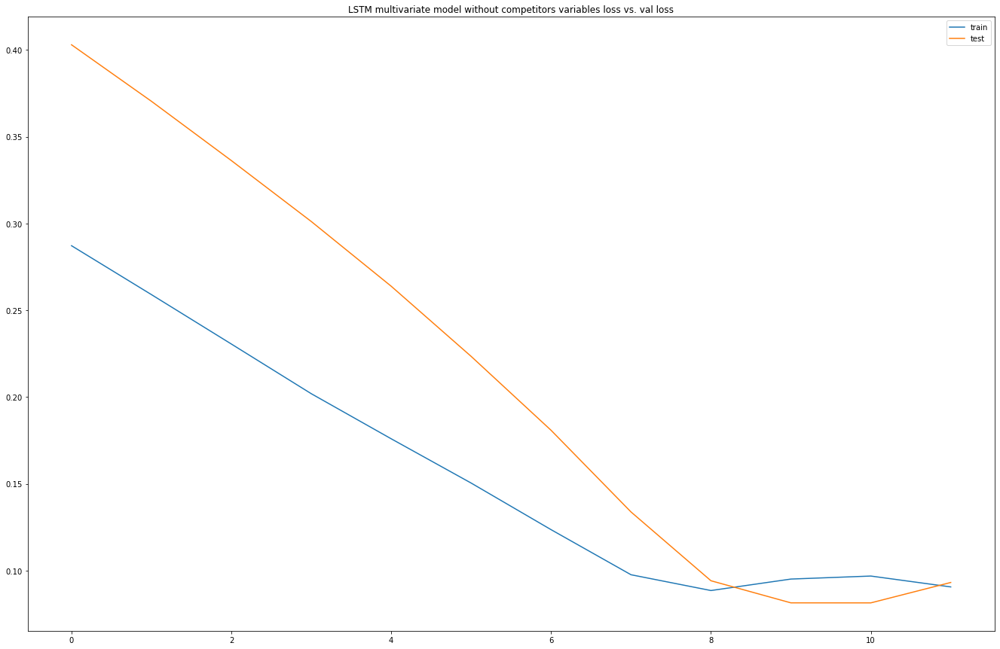

Test RMSE: 3894.921


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var7(t),var8(t),var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t)
Date,,,,,,,,,,,,,,,,,,,,,
2018-11-10,18062.0,3.15,98.0,0.0,2018.0,4.0,10.0,41.0,2.241567,100.0,...,11,45,2.241417,100,0.774982,58.0,0.999921,83.0,1.125193,99
2018-11-17,19108.0,3.15,98.0,0.0,2018.0,4.0,10.0,42.0,2.241541,100.0,...,11,46,2.241440,100,0.774977,58.0,0.999939,83.0,1.125797,99
2018-11-24,20010.0,3.15,98.0,0.0,2018.0,4.0,10.0,43.0,2.241566,100.0,...,11,47,2.241489,100,0.774914,58.0,0.999886,83.0,1.125535,99
2018-12-01,19879.0,3.15,98.0,0.0,2018.0,4.0,11.0,44.0,2.241457,100.0,...,12,48,2.241464,100,0.774983,58.0,0.999433,83.0,1.125242,99
2018-12-08,19467.0,3.15,98.0,0.0,2018.0,4.0,11.0,45.0,2.241417,100.0,...,12,49,2.241518,100,0.774887,58.0,0.999955,83.0,1.125299,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,22543.0,3.15,98.0,0.0,2020.0,1.0,1.0,3.0,2.241691,100.0,...,2,7,2.241447,100,0.774976,93.0,0.999991,82.0,1.250139,98
2020-02-22,23803.0,3.15,98.0,0.0,2020.0,1.0,1.0,4.0,2.241683,100.0,...,2,8,2.241482,100,0.774958,93.0,0.999908,83.0,1.250196,98
2020-02-29,22112.0,3.15,98.0,0.0,2020.0,1.0,2.0,5.0,2.241582,100.0,...,2,9,2.241656,100,0.774974,93.0,0.999982,83.0,1.250162,98


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.286511        0.0        1.0        0.0        0.0        1.0   
5   0.326721        0.0        1.0        0.0        0.0        1.0   
6   0.361396        0.0        1.0        0.0        0.0        1.0   
7   0.356360        0.0        1.0        0.0        0.0        1.0   
8   0.340522        0.0        1.0        0.0        0.0        1.0   

   var7(t-4)  var8(t-4)  var9(t-4)  var10(t-4)  var11(t-4)  var12(t-4)  \
4   0.818182   0.784314   0.994400         1.0    0.980005    0.136842   
5   0.818182   0.803922   0.993778         1.0    0.979163    0.589474   
6   0.818182   0.823529   0.994396         1.0    0.978738    0.589474   
7   0.909091   0.843137   0.991779         1.0    0.979244    0.589474   
8   0.909091   0.862745   0.990829         1.0    0.978948    0.600000   

   var13(t-4)  var14(t-4)  var15(t-4)  var16(t-4)   var1(t)  
4    0.982941         0.5    0.760128         1.0  0.340522  
5   

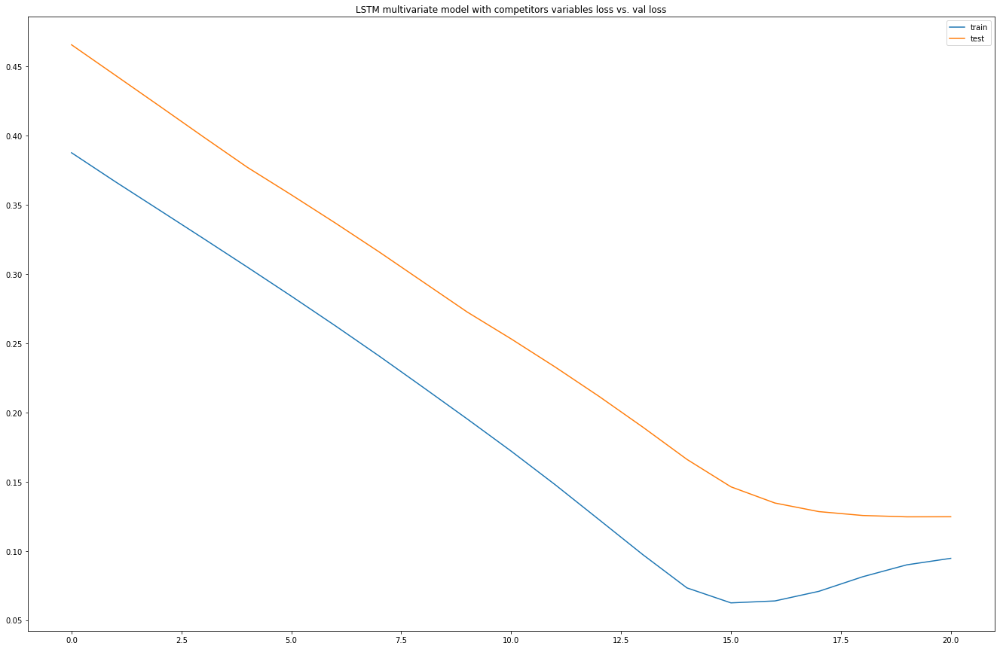

Test RMSE: 5356.337


In [102]:
#ml models
mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y=input_var(mcv_rt_300g_twin_with_comp)
rf_regressor_mcv(mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y)

mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y=input_var(mcv_rt_300g_twin_with_comp)
xgb_regressor_mcv(mcv_rt_300g_twin_input_X,mcv_rt_300g_twin_input_Y)

#lstm models
series_to_supervised(mcv_rt_300g_twin_volume)
lstm_univariate(mcv_rt_300g_twin_volume)

series_to_supervised(mcv_rt_300g_twin_own_variable)
multivariate_lstm_without_competitor(mcv_rt_300g_twin_own_variable)

series_to_supervised(mcv_rt_300g_twin_with_comp)
multivariate_with_competitor(mcv_rt_300g_twin_with_comp)

## Tesco Large - Tesco Rich Tea 250g (Competitor)

,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,54378,13594.5,27201.2,98,0,0.500224,2.000897,2014,4,12,50
1,2014-12-20,51398,12849.5,25709.2,98,0,0.500198,2.000794,2014,4,12,51
2,2014-12-27,35281,8820.3,17648.5,98,0,0.500227,2.000896,2014,4,12,52
3,2015-01-03,35677,8919.3,17847.5,98,0,0.500252,2.000998,2015,1,1,1
4,2015-01-10,48619,12154.8,24322.0,98,0,0.500257,2.001020,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.00000,275.000000,275.000000,275.000000,275.0,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,56206.12000,14051.554182,27940.253818,95.465455,0.0,0.492309,1.969162,2017.083636,2.469091,6.414545,26.043636
std,13731.15737,3432.792086,7969.553785,18.323972,0.0,0.067310,0.269348,1.534371,1.140635,3.547767,15.490223
min,2.00000,0.500000,0.800000,0.000000,0.0,0.389474,1.541667,2014.000000,1.000000,1.000000,1.000000
25%,54871.00000,13717.800000,24597.800000,98.000000,0.0,0.400055,1.600222,2016.000000,1.000000,3.000000,12.000000
50%,59591.00000,14897.800000,29419.500000,100.000000,0.0,0.500217,2.000870,2017.000000,2.000000,6.000000,26.000000
75%,62805.50000,15701.400000,33396.050000,100.000000,0.0,0.560321,2.241278,2018.000000,3.500000,9.500000,39.500000
95%,67047.70000,16761.940000,36391.630000,100.000000,0.0,0.560395,2.241577,2019.000000,4.000000,12.000000,50.000000
99%,70972.94000,17743.272000,39030.728000,100.000000,0.0,0.560431,2.241716,2020.000000,4.000000,12.000000,52.000000
max,94573.00000,23643.300000,52998.200000,100.000000,0.0,0.560452,2.241802,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

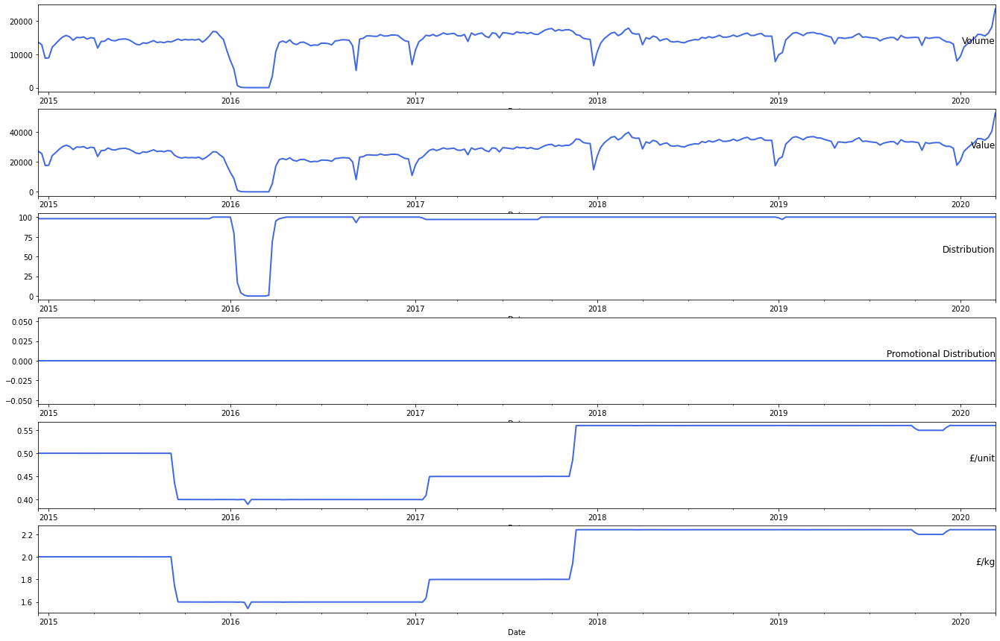

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31ace698d0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31acde3eb8>)

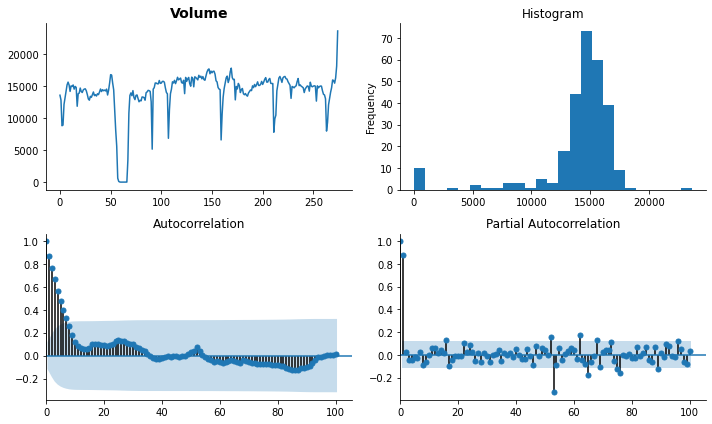

In [103]:
basic_info(tes_rt_250g_origin)
plot_data(tes_rt_250g_origin)
tsplot(tes_rt_250g_origin['Volume'].dropna(), title=tes_rt_250g_origin.columns[2], lags=100)


Test Statistic                  -3.567857
p-value                          0.006406
#Lags Used                       0.000000
Number of Observations Used    274.000000
Critical Value (1%)             -3.454444
Critical Value (5%)             -2.872147
Critical Value (10%)            -2.572422
dtype: float64


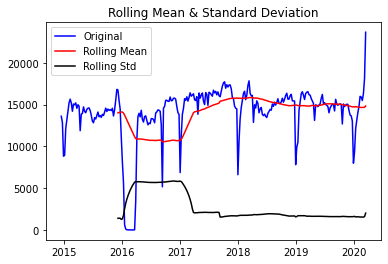

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31aff3a9b0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31b12ce6d8>)

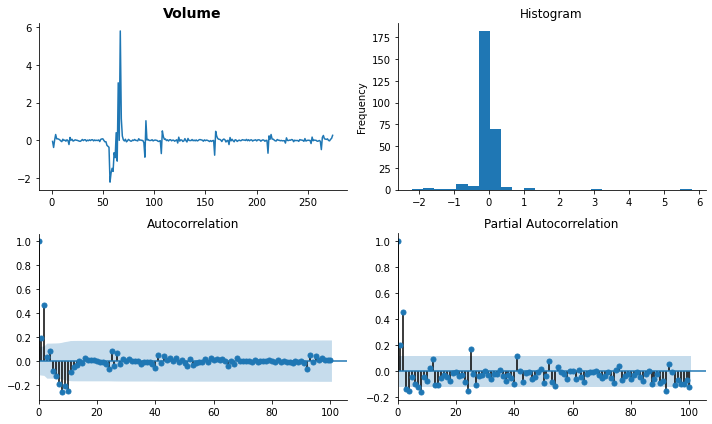

In [104]:
plot(tes_rt_250g_origin)
series_transformed=tes_rt_250g_origin.copy()
series_transformed['Volume_transformed']=np.log(tes_rt_250g_origin.Volume).diff(1)
tsplot(series_transformed['Volume_transformed'].dropna(), title=tes_rt_250g_origin.columns[2], lags=100)


       t-4      t+1
0      NaN  13594.5
1      NaN  12849.5
2      NaN   8820.3
3      NaN   8919.3
4  13594.5  12154.8
Test MSE: 4803236.685
Test RMSE: 2191.629


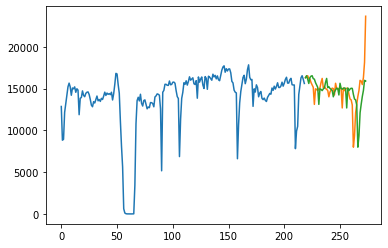

Observations: 271
Training Observations: 216
Testing Observations: 55


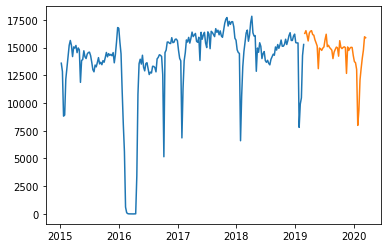

RMSE for Simple Exponential Smoothing α= 0.1 is: 1682.49
RMSE for Simple Exponential Smoothing α= 0.2 is: 1996.59
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 2082.4
RMSE for Simple Exponential Smoothing α= 0.4 is: 1957.99
RMSE for Simple Exponential Smoothing α= 0.5 is: 1760.86
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 1602.75
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 1533.41
RMSE for Simple Exponential Smoothing α= 0.8 is: 1539.9
RMSE for Simple Exponential Smoothing α= 0.9 is: 1580.92


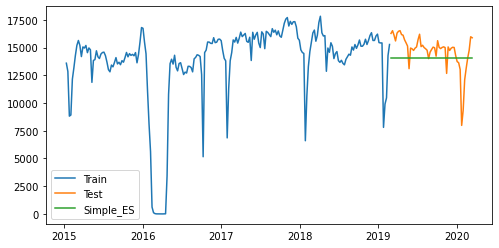

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 2286.44
Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.6000000000000001 and β= 0.1 is: 1678.67


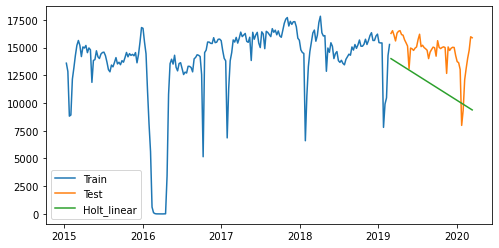

Observations: 275
Training Observations: 204
Testing Observations: 59


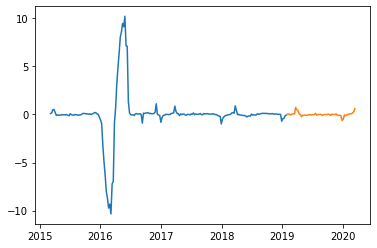

             Volume    pred_value
Date                             
2019-02-02  16279.8  14374.950992
2019-02-09  16528.8  14414.946121
2019-02-16  16116.5  13882.152870
2019-02-23  15603.0  13274.207120
2019-03-02  16307.8  13702.829346
2019-03-09  16476.3  13673.791541
2019-03-16  16529.0  13548.469395
2019-03-23  16176.8  13096.361740
2019-03-30  16123.8  12892.580150
2019-04-06  15709.5  12406.497469
2019-04-13  15435.5  12039.873448
2019-04-20  15141.3  11664.839714
2019-04-27  13101.8   9969.215132
2019-05-04  14962.3  11244.567400
2019-05-11  14891.3  11053.285759
2019-05-18  14747.8  10811.860050
2019-05-25  14952.5  10826.831516
2019-06-01  15063.8  10772.996025
2019-06-08  15725.8  11107.826763
2019-06-15  16206.8  11306.495491
2019-06-22  15092.3  10399.215109
2019-06-29  15211.8  10352.378220
2019-07-06  15008.5  10088.142411
2019-07-13  14897.8   9890.322332
2019-07-20  14765.8   9681.879631
2019-07-27  14009.0   9072.442489
2019-08-03  14590.0   9332.258750
2019-08-10  14

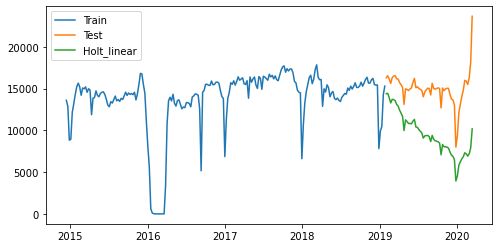

RMSE for Holt Linear Forecasting with transformation is: 5905.724922505295


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

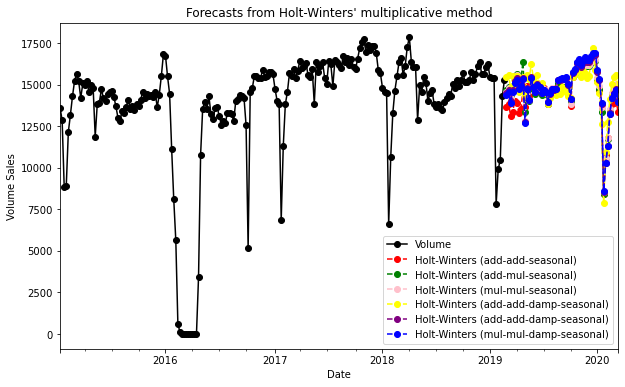

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
1577.1161324806146
1170.125034624273
1234.5069781389673
1106.4054525209729
1338.3054056240962
1398.8848211383574


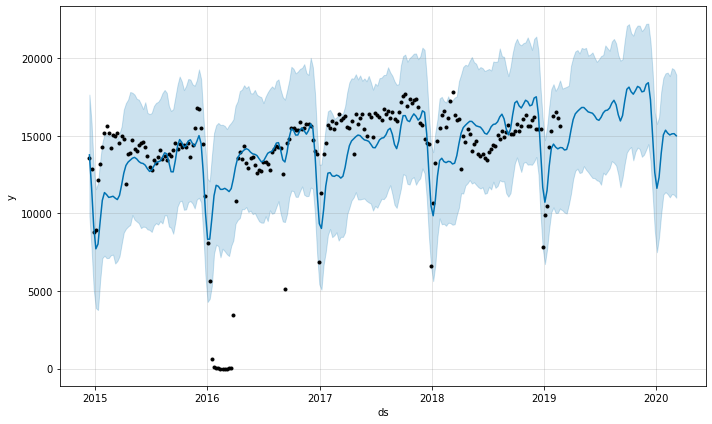

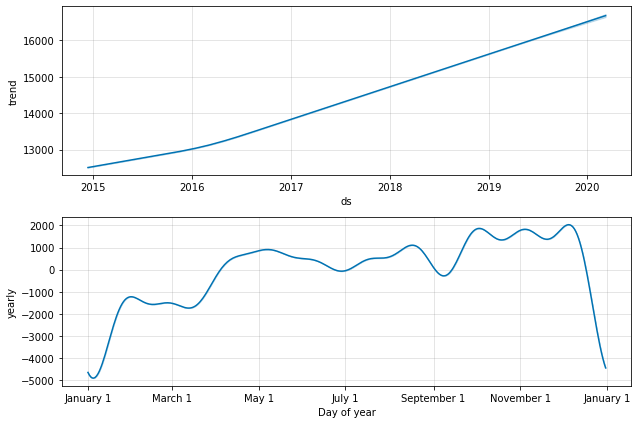

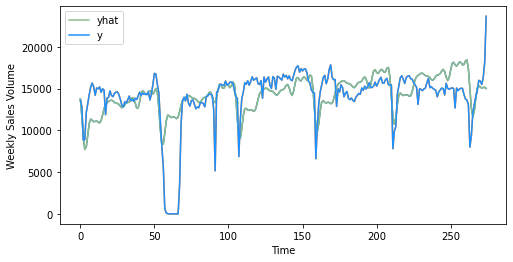

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 3019.956152313255


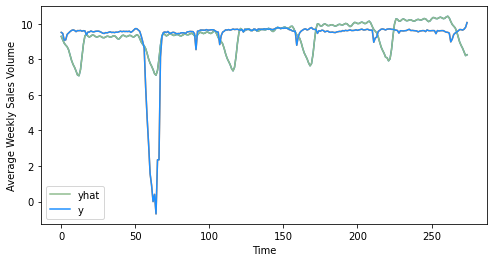

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 7988.168941159391
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

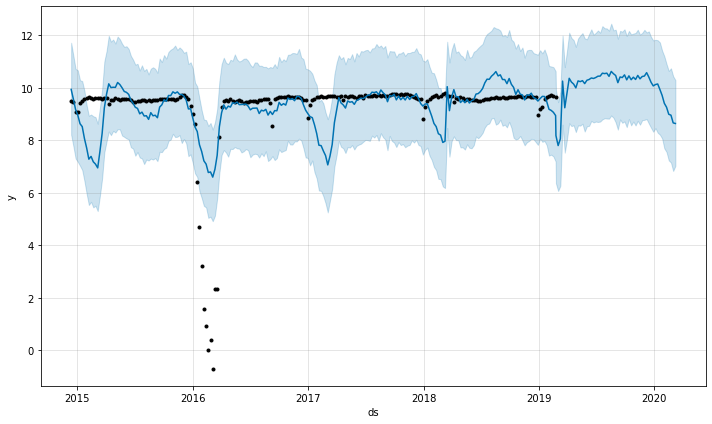

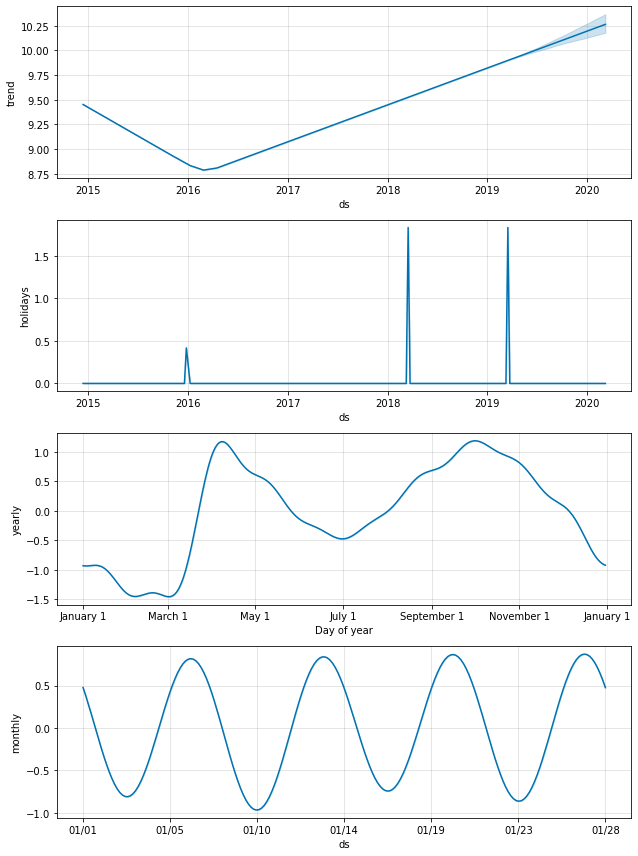

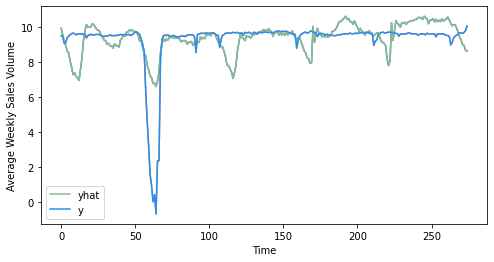

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 9679.200507828386


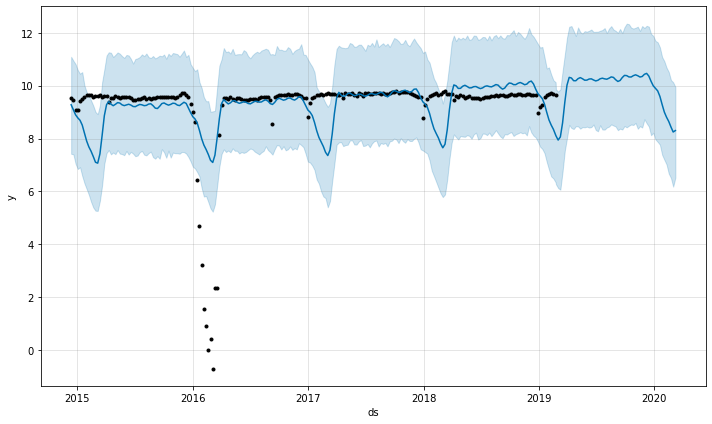

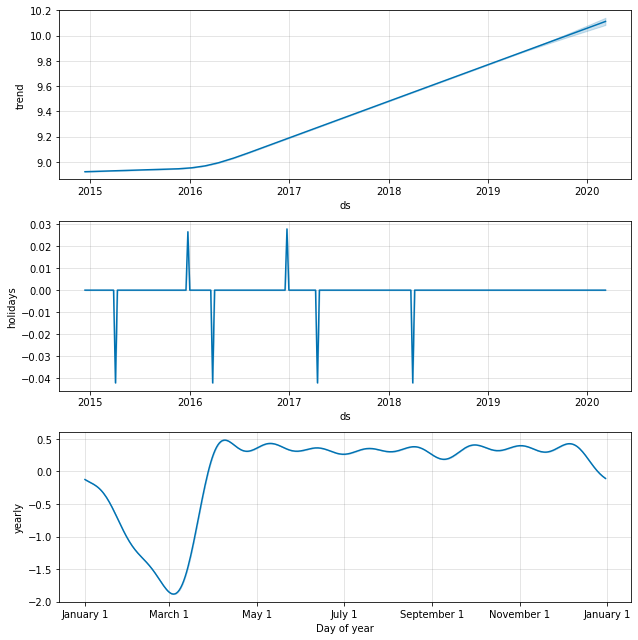

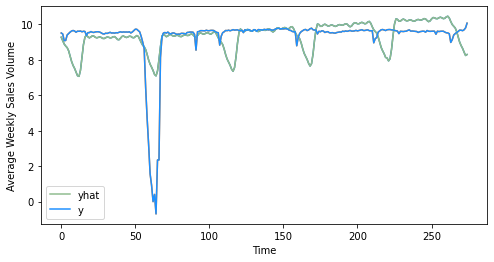

8279.147807762565


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [105]:
#time series models
baseline_model(tes_rt_250g_origin)
ses_model(tes_rt_250g_origin)
holt_linear_model(tes_rt_250g_origin)
holt_linear_model_log(tes_rt_250g_origin)
holt_winter_model(tes_rt_250g_origin)
prophet_model(tes_rt_250g_origin)
prophet_model_log(tes_rt_250g_origin)
prophet_log_season(tes_rt_250g_origin)
prophet_log_two_holiday(tes_rt_250g_origin)

## trend comparison


In [106]:
# tes_rt_250g_with_comp_1=tes_rt_250g_own_variable
# tes_dig_400g_with_comp_1=tes_dig_400g_own_variable
# tes_rt_300g_with_comp1=tes_rt_300g_own_variable
# tes_molly_400g_with_comp1=tes_molly_400g_own_variable


<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_volume')

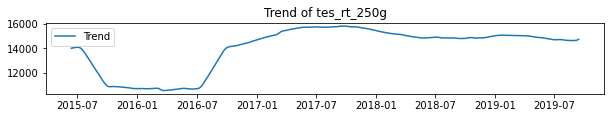

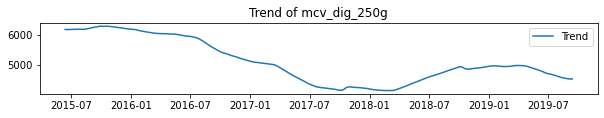

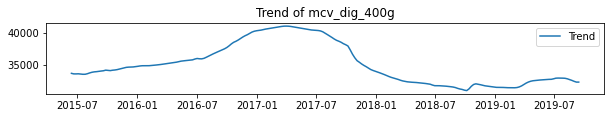

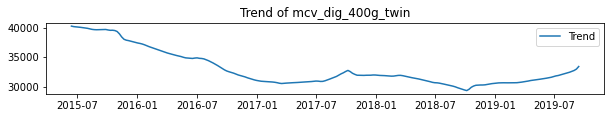

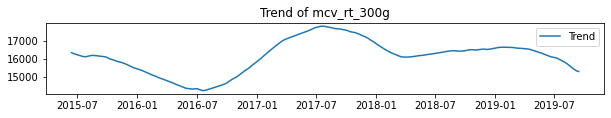

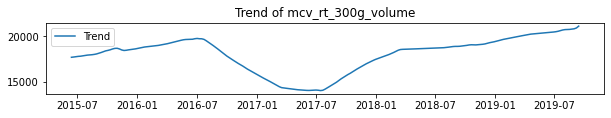

In [107]:
tes_rt_250g_competitor=[tes_rt_250g_volume, mcv_dig_250g_volume, mcv_dig_400g_volume, mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_rt_250g_competitor_list=['tes_rt_250g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']
tes_dig_400g_competitor=[tes_dig_400g_volume,mcv_dig_250g_volume,mcv_dig_400g_volume,mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_dig_400g_competitor_list=['tes_dig_400g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']
tes_rt_300g_competitor=[tes_rt_300g_volume,mcv_dig_250g_volume,mcv_dig_400g_volume,mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_rt_300g_competitor_list=['tes_rt_300g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']
tes_molly_400g_competitor=[tes_molly_400g_volume,mcv_dig_250g_volume,mcv_dig_400g_volume,mcv_dig_400g_twin_volume, mcv_rt_300g_volume, mcv_rt_300g_twin_volume]
tes_molly_400g_competitor_list=['tes_molly_400g','mcv_dig_250g','mcv_dig_400g','mcv_dig_400g_twin','mcv_rt_300g','mcv_rt_300g_volume']

# product_name=['mcv_dig_250g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#              'mcv_dig_400g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_dig_400g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g',
#               'mcv_rt_300g_twin','tes_dig_400g','tes_molly_400g','tes_rt_250g','tes_rt_300g'
#              ]

i=0
for product in tes_rt_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + tes_rt_250g_competitor_list[i] )
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_volume')

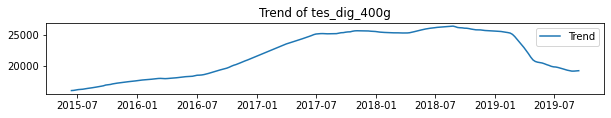

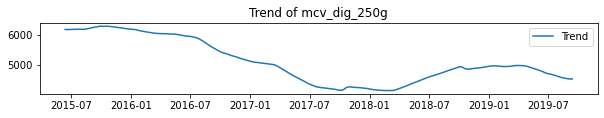

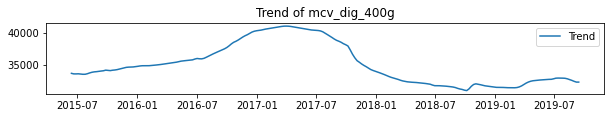

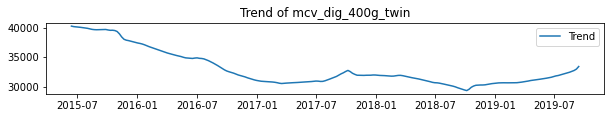

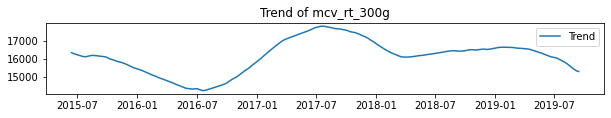

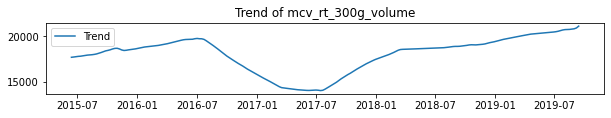

In [108]:
i=0
for product in tes_dig_400g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + tes_dig_400g_competitor_list[i] )
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of tes_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_volume')

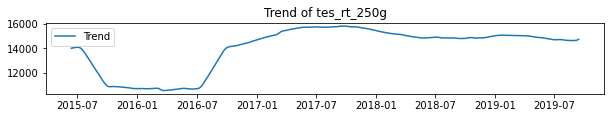

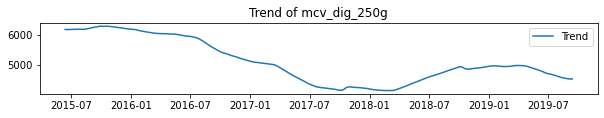

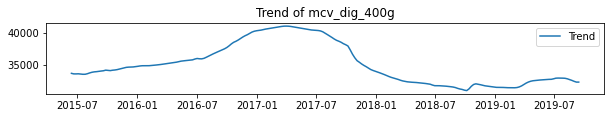

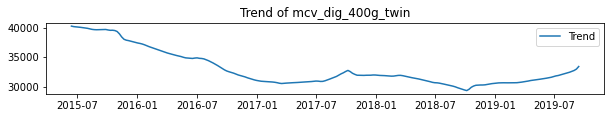

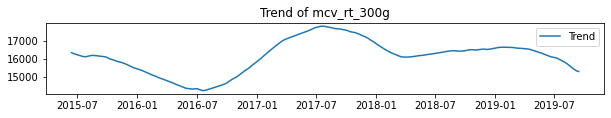

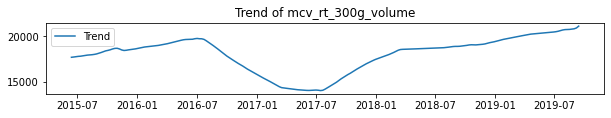

In [109]:
i=0
for product in tes_rt_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + tes_rt_250g_competitor_list[i] )
    i=i+1

Tesco molly400g does not contain enough datapoints to capture the trends.

In [110]:
# i=0
# for product in tes_molly_400g_competitor:
#     decomposition=seasonal_decompose(product)
#     trend_1=decomposition.trend

#     plt.figure(figsize=(10,6))
#     plt.subplot(412)
#     plt.plot(trend_1, label='Trend')
#     plt.legend(loc='best')
#     plt.title('Trend of ' + tes_molly_400g_competitor_list[i] )
#     i=i+1

plot trend comparisons graphs

In [111]:
decomposition_1=seasonal_decompose(tes_rt_250g_volume)
trend_1=decomposition_1.trend
trend_1=trend_1.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
comp_trend5=comp_decomposition_5.trend
comp_trend5=comp_trend5.to_frame()

tes_rt_250g_comp=pd.merge(trend_1,comp_trend1, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend2, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend3, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend4, how='left', on='Date')
tes_rt_250g_comp=pd.merge(tes_rt_250g_comp,comp_trend5, how='left', on='Date')
tes_rt_250g_comp.columns=['tes_rt_250g_trend', 'mcv_dig_250g_trend','mcv_dig_400g_trend','mcv_dig_400g_twin_trend','mcv_rt_300g_trend','mcv_rt_300g_twin_trend']

tes_rt_250g_comp.corr()

#correlation graph
tes_rt_250g_comp_corr=tes_rt_250g_comp.corr()
# mcv_rt_300g_twin_comp_corr.iloc[0][1:]
tes_rt_250g_comp_corr.iloc[0][1:].plot(kind='barh', x='features', y='Correlation', title="Feature Correlation for mcv_rt_300g Trend",legend=False, figsize=(15, 8))



,tes_rt_250g_trend,mcv_dig_250g_trend,mcv_dig_400g_trend,mcv_dig_400g_twin_trend,mcv_rt_300g_trend,mcv_rt_300g_twin_trend
tes_rt_250g_trend,1.000000,-0.886110,0.073859,-0.767722,0.760581,-0.394315
mcv_dig_250g_trend,-0.886110,1.000000,-0.000553,0.815187,-0.665818,0.284689
mcv_dig_400g_trend,0.073859,-0.000553,1.000000,-0.057685,0.122796,-0.833973
mcv_dig_400g_twin_trend,-0.767722,0.815187,-0.057685,1.000000,-0.426095,0.183894
mcv_rt_300g_trend,0.760581,-0.665818,0.122796,-0.426095,1.000000,-0.563714
mcv_rt_300g_twin_trend,-0.394315,0.284689,-0.833973,0.183894,-0.563714,1.000000


In [112]:
decomposition_2=seasonal_decompose(tes_dig_400g_volume)
trend_2=decomposition_2.trend
trend_2=trend_2.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
comp_trend5=comp_decomposition_5.trend
comp_trend5=comp_trend5.to_frame()

tes_dig_400g_comp=pd.merge(trend_2,comp_trend1, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend2, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend3, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend4, how='left', on='Date')
tes_dig_400g_comp=pd.merge(tes_dig_400g_comp,comp_trend5, how='left', on='Date')
tes_dig_400g_comp.columns=['tes_dig_400g_trend', 'mcv_dig_250g_trend','mcv_dig_400g_trend','mcv_dig_400g_twin_trend','mcv_rt_300g_trend','mcv_rt_300g_twin_trend']

tes_dig_400g_comp.corr()


,tes_dig_400g_trend,mcv_dig_250g_trend,mcv_dig_400g_trend,mcv_dig_400g_twin_trend,mcv_rt_300g_trend,mcv_rt_300g_twin_trend
tes_dig_400g_trend,1.000000,-0.866579,-0.079756,-0.838641,0.675009,-0.299945
mcv_dig_250g_trend,-0.866579,1.000000,-0.000553,0.815187,-0.665818,0.284689
mcv_dig_400g_trend,-0.079756,-0.000553,1.000000,-0.057685,0.122796,-0.833973
mcv_dig_400g_twin_trend,-0.838641,0.815187,-0.057685,1.000000,-0.426095,0.183894
mcv_rt_300g_trend,0.675009,-0.665818,0.122796,-0.426095,1.000000,-0.563714
mcv_rt_300g_twin_trend,-0.299945,0.284689,-0.833973,0.183894,-0.563714,1.000000


In [113]:
decomposition_3=seasonal_decompose(tes_rt_300g_volume)
trend_3=decomposition_3.trend
trend_3=trend_3.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
comp_trend5=comp_decomposition_5.trend
comp_trend5=comp_trend5.to_frame()

tes_rt_300g_comp=pd.merge(trend_3,comp_trend1, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend2, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend3, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend4, how='left', on='Date')
tes_rt_300g_comp=pd.merge(tes_rt_300g_comp,comp_trend5, how='left', on='Date')
tes_rt_300g_comp.columns=['tes_rt_300g_trend', 'mcv_dig_250g_trend','mcv_dig_400g_trend','mcv_dig_400g_twin_trend','mcv_rt_300g_trend','mcv_rt_300g_twin_trend']

tes_rt_300g_comp.corr()


,tes_rt_300g_trend,mcv_dig_250g_trend,mcv_dig_400g_trend,mcv_dig_400g_twin_trend,mcv_rt_300g_trend,mcv_rt_300g_twin_trend
tes_rt_300g_trend,1.000000,0.609020,0.013966,0.159325,-0.195562,0.843504
mcv_dig_250g_trend,0.609020,1.000000,-0.603819,-0.660605,-0.369204,0.665707
mcv_dig_400g_trend,0.013966,-0.603819,1.000000,0.338117,0.825617,-0.895918
mcv_dig_400g_twin_trend,0.159325,-0.660605,0.338117,1.000000,-0.027466,-0.115013
mcv_rt_300g_trend,-0.195562,-0.369204,0.825617,-0.027466,1.000000,-0.889759
mcv_rt_300g_twin_trend,0.843504,0.665707,-0.895918,-0.115013,-0.889759,1.000000


In [114]:
# decomposition_4=seasonal_decompose(tes_molly_400g_volume)
# trend_4=decomposition_4.trend
# trend_4=trend_4.to_frame()

# comp_decomposition_1=seasonal_decompose(mcv_dig_250g_volume)
# comp_trend1=comp_decomposition_1.trend
# comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(mcv_dig_400g_volume)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

# comp_decomposition_3=seasonal_decompose(mcv_dig_400g_twin_volume)
# comp_trend3=comp_decomposition_3.trend
# comp_trend3=comp_trend3.to_frame()

# comp_decomposition_4=seasonal_decompose(mcv_rt_300g_volume)
# comp_trend4=comp_decomposition_4.trend
# comp_trend4=comp_trend4.to_frame()

# comp_decomposition_5=seasonal_decompose(mcv_rt_300g_twin_volume)
# comp_trend5=comp_decomposition_5.trend
# comp_trend5=comp_trend5.to_frame()

# tes_molly_400g_comp=pd.merge(trend_4,comp_trend1, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend2, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend3, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend4, how='left', on='Date')
# tes_molly_400g_comp=pd.merge(tes_molly_400g_comp,comp_trend5, how='left', on='Date')
# tes_molly_400g_comp.columns=['trend', 'competitor_trend1','competitor_trend2','competitor_trend3','competitor_trend4','competitor_trend5']


# tes_molly_400g_comp.corr()

In [115]:
#extract own product variables: sales price distribution promotional week month quarter
def own_product_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
    x=x[['Volume','£/kg','Distribution','Promotional Distribution','year','quarter','month','week']]
    return x

tes_rt_250g_own_variable=own_product_variables(tes_rt_250g_origin)
tes_dig_400g_own_variable=own_product_variables(tes_dig_400g_origin)
tes_rt_300g_own_variable=own_product_variables(tes_rt_300g_origin)
tes_molly_400g_own_variable=own_product_variables(tes_molly_400g_origin)

tes_rt_250g_with_comp_1=tes_rt_250g_own_variable
tes_dig_400g_with_comp_1=tes_dig_400g_own_variable
tes_rt_300g_with_comp1=tes_rt_300g_own_variable
tes_molly_400g_with_comp1=tes_molly_400g_own_variable


In [116]:
def comp_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
#     x=x.dropna(subset=['Volume'])
    x=x[['£/kg','Distribution']]
    return x

mcv_dig_250g_price_dis=comp_variables(mcv_dig_250g_origin)
mcv_dig_400g_price_dis=comp_variables(mcv_dig_400g_origin)
mcv_dig_400g_twin_price_dis=comp_variables(mcv_dig_400g_twin_origin)
mcv_rt_300g_price_dis=comp_variables(mcv_rt_300g_origin)
mcv_rt_300g_twin_price_dis=comp_variables(mcv_rt_300g_twin_origin)


In [117]:
# compose competitors' variables as a list
competitor_list=[mcv_dig_250g_price_dis, mcv_dig_400g_price_dis, mcv_dig_400g_twin_price_dis, mcv_rt_300g_price_dis,mcv_rt_300g_twin_price_dis]

variable_columns=['Volume','£/kg','Distribution','Promotional Distribution',
                  'year','quarter','month','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
                  ]

In [118]:
# each variable with their competitors
# merge own product variables with four competitors' variables
#tesco rich tea 250g
for variable in competitor_list:
    tes_rt_250g_with_comp_1=tes_rt_250g_with_comp_1.merge(variable, how='left', on='Date')
    tes_rt_250g_with_comp=tes_rt_250g_with_comp_1
    
#drop all missing values
tes_rt_250g_with_comp.columns=variable_columns
tes_rt_250g_with_comp=tes_rt_250g_with_comp.dropna()
tes_rt_250g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,,
2014-12-13,13594.5,2.000897,98,0,2014,4,12,50,3.560262,97,2.032399,100,1.889672,96,3.384627,100,3.15,96
2014-12-20,12849.5,2.000794,98,0,2014,4,12,51,3.560043,97,2.033989,100,1.889613,96,3.386913,100,3.15,96
2014-12-27,8820.3,2.000896,98,0,2014,4,12,52,3.560118,97,2.042324,100,1.889703,96,3.399665,100,3.15,96
2015-01-03,8919.3,2.000998,98,0,2015,1,1,1,3.560110,97,2.040269,100,1.889601,96,3.396514,100,3.15,96
2015-01-10,12154.8,2.001020,98,0,2015,1,1,2,3.559761,97,2.039523,100,1.889689,96,3.396960,100,3.15,96


In [119]:
# tes_dig_400g product
for variable in competitor_list:
    tes_dig_400g_with_comp_1=tes_dig_400g_with_comp_1.merge(variable, how='left', on='Date')
    tes_dig_400g_with_comp=tes_dig_400g_with_comp_1
    
tes_dig_400g_with_comp.columns=variable_columns
tes_dig_400g_with_comp=tes_dig_400g_with_comp.dropna()
tes_dig_400g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,,
2014-12-13,16038.4,1.475527,99,0,2014,4,12,50,3.560262,97,2.032399,100,1.889672,96,3.384627,100,3.15,96
2014-12-20,17876.4,1.475431,99,0,2014,4,12,51,3.560043,97,2.033989,100,1.889613,96,3.386913,100,3.15,96
2014-12-27,14999.6,1.475346,99,0,2014,4,12,52,3.560118,97,2.042324,100,1.889703,96,3.399665,100,3.15,96
2015-01-03,10573.2,1.475504,99,0,2015,1,1,1,3.560110,97,2.040269,100,1.889601,96,3.396514,100,3.15,96
2015-01-10,11548.8,1.475625,99,0,2015,1,1,2,3.559761,97,2.039523,100,1.889689,96,3.396960,100,3.15,96


In [120]:
#tes_rt_300g_twin product
for variable in competitor_list:
    tes_rt_300g_with_comp1=tes_rt_300g_with_comp1.merge(variable, how='left', on='Date')
    tes_rt_300g_with_comp=tes_rt_300g_with_comp1
    
tes_rt_300g_with_comp.columns=variable_columns
tes_rt_300g_with_comp=tes_rt_300g_with_comp.dropna()
tes_rt_300g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,,
2017-06-10,1102.2,1.001270,56.0,0.0,2017,2,6,23,3.558804,76,2.001012,100,1.889756,76,3.333901,98,3.15,63
2017-06-17,13431.3,1.000834,98.0,0.0,2017,2,6,24,3.560043,75,2.001368,100,1.889877,76,3.333698,98,3.15,63
2017-06-24,17079.3,1.000790,100.0,0.0,2017,2,6,25,3.559407,75,2.070402,100,1.889621,76,3.333970,98,3.15,63
2017-07-01,22086.0,1.000756,100.0,0.0,2017,3,7,26,3.556533,76,2.201208,100,1.889670,76,3.333684,98,3.15,63
2017-07-08,21796.2,1.000807,100.0,0.0,2017,3,7,27,3.559703,75,2.201493,100,1.889815,76,3.333788,98,3.15,63


In [121]:
#tesco molly 400g
for variable in competitor_list:
    tes_molly_400g_with_comp1=tes_molly_400g_with_comp1.merge(variable, how='left', on='Date')
    tes_molly_400g_with_comp=tes_molly_400g_with_comp1
    
tes_molly_400g_with_comp.columns=variable_columns
tes_molly_400g_with_comp=tes_molly_400g_with_comp.dropna()
tes_molly_400g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution
Date,,,,,,,,,,,,,,,,,,
2018-10-13,163.2,0.775123,14.0,0.0,2018,4,10,41,3.559244,69,2.501574,100,2.361640,98,3.328089,100,3.15,98
2018-10-20,6549.2,0.775011,57.0,0.0,2018,4,10,42,3.558718,69,2.501698,100,2.362333,98,3.330738,100,3.15,98
2018-10-27,9401.2,0.774954,57.0,0.0,2018,4,10,43,3.557684,68,2.501824,100,2.362053,98,3.335835,100,3.15,98
2018-11-03,10259.2,0.775021,57.0,0.0,2018,4,11,44,3.558061,68,2.501599,100,2.362421,98,3.332644,100,3.15,98
2018-11-10,10667.6,0.774982,58.0,0.0,2018,4,11,45,3.557921,68,2.501929,100,2.361049,98,3.329135,100,3.15,98


In [122]:
def variable_lag_tesco(df):
    df=pd.DataFrame(df)
    X_lag=df[['£/kg','Distribution','Promotional Distribution',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
             ]]
    X_lagged=X_lag.shift(4)
    non_lag=df[['Volume','year','quarter','month','week']]
    final_df=pd.merge(X_lagged,non_lag,left_index=True, right_index=True)
    final_df=final_df.dropna()
    return final_df

In [123]:
variable_lag_tesco(tes_rt_250g_with_comp)

,£/kg,Distribution,Promotional Distribution,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution,Volume,year,quarter,month,week
Date,,,,,,,,,,,,,,,,,,
2015-01-10,2.000897,98.0,0.0,3.560262,97.0,2.032399,100.0,1.889672,96.0,3.384627,100.0,3.15,96.0,12154.8,2015,1,1,2
2015-01-17,2.000794,98.0,0.0,3.560043,97.0,2.033989,100.0,1.889613,96.0,3.386913,100.0,3.15,96.0,13175.5,2015,1,1,3
2015-01-24,2.000896,98.0,0.0,3.560118,97.0,2.042324,100.0,1.889703,96.0,3.399665,100.0,3.15,96.0,14290.8,2015,1,1,4
2015-01-31,2.000998,98.0,0.0,3.560110,97.0,2.040269,100.0,1.889601,96.0,3.396514,100.0,3.15,96.0,15203.0,2015,1,1,5
2015-02-07,2.001020,98.0,0.0,3.559761,97.0,2.039523,100.0,1.889689,96.0,3.396960,100.0,3.15,96.0,15643.5,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,2.241691,100.0,0.0,3.595392,58.0,2.502099,100.0,2.362428,98.0,3.332535,100.0,3.15,98.0,15888.8,2020,1,2,7
2020-02-22,2.241683,100.0,0.0,3.599547,58.0,2.501775,100.0,2.362101,98.0,3.331737,100.0,3.15,98.0,15479.0,2020,1,2,8
2020-02-29,2.241582,100.0,0.0,3.599397,58.0,2.501675,100.0,2.362396,98.0,3.334121,100.0,3.15,98.0,16310.8,2020,1,2,9


In [124]:
def input_var_tesco(var):
#     for var in final_var_list:
    X=var[['£/kg','Distribution','Promotional Distribution',
                  'year','quarter','month','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
              ]].values
    y=var['Volume'].values
    return X,y


In [125]:
#train test split
from sklearn.model_selection import TimeSeriesSplit

def rf_regressor_tesco(X, y):
    splits = TimeSeriesSplit(n_splits=5)

    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler

        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        regressor = RandomForestRegressor(n_estimators=20, random_state=0)
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        print(cross_val_score(regressor, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
                  'year','month','quarter','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'
], 'importance': regressor.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of Random Forest Model",legend=False, figsize=(15, 8))

In [126]:
def xgb_regressor_tesco(X, y):
    splits = TimeSeriesSplit(n_splits=5)
    
    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler


        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                    max_depth = 5, alpha = 10, n_estimators = 10)
        xg_reg.fit(X_train, y_train)
        y_pred = xg_reg.predict(X_test)
        print(cross_val_score(xg_reg, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
                  'year','quarter','month','week',
                   'mcv_dig_250g_price_kg', 'mcv_dig_250g_distribution',
                   'mcv_dig_400g_price_kg','mcv_dig_400g_distribution',
                   'mcv_dig_400g_twin_price_kg','mcv_dig_400g_twin_distribution',
                   'mcv_rt_300g_price_kg','mcv_rt_300g_distribution',
                  'mcv_rt_300g_twin_price_kg','mcv_rt_300g_twin_distribution'],'importance': xg_reg.feature_importances_})

        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of XGBoost Model",legend=False, figsize=(20, 13))


,£/kg,Distribution,Promotional Distribution,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution,Volume,year,quarter,month,week
Date,,,,,,,,,,,,,,,,,,
2015-01-10,2.000897,98.0,0.0,3.560262,97.0,2.032399,100.0,1.889672,96.0,3.384627,100.0,3.15,96.0,12154.8,2015,1,1,2
2015-01-17,2.000794,98.0,0.0,3.560043,97.0,2.033989,100.0,1.889613,96.0,3.386913,100.0,3.15,96.0,13175.5,2015,1,1,3
2015-01-24,2.000896,98.0,0.0,3.560118,97.0,2.042324,100.0,1.889703,96.0,3.399665,100.0,3.15,96.0,14290.8,2015,1,1,4
2015-01-31,2.000998,98.0,0.0,3.560110,97.0,2.040269,100.0,1.889601,96.0,3.396514,100.0,3.15,96.0,15203.0,2015,1,1,5
2015-02-07,2.001020,98.0,0.0,3.559761,97.0,2.039523,100.0,1.889689,96.0,3.396960,100.0,3.15,96.0,15643.5,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,2.241691,100.0,0.0,3.595392,58.0,2.502099,100.0,2.362428,98.0,3.332535,100.0,3.15,98.0,15888.8,2020,1,2,7
2020-02-22,2.241683,100.0,0.0,3.599547,58.0,2.501775,100.0,2.362101,98.0,3.331737,100.0,3.15,98.0,15479.0,2020,1,2,8
2020-02-29,2.241582,100.0,0.0,3.599397,58.0,2.501675,100.0,2.362396,98.0,3.334121,100.0,3.15,98.0,16310.8,2020,1,2,9


Observations: 95
Training Observations: 50
Testing Observations: 45
[ -4.17526721 -14.46267938  -3.92595803   0.08857381  -4.42494639]
Mean Absolute Error: 4516.350777777776
Mean Squared Error: 52081630.72804609
Root Mean Squared Error: 7216.760403951768
Observations: 140
Training Observations: 95
Testing Observations: 45
[-1.06961525 -2.921696   -1.39170005  0.19253448  0.25174777]
Mean Absolute Error: 1796.1370000000015
Mean Squared Error: 3741670.263413894
Root Mean Squared Error: 1934.3397487033901
Observations: 185
Training Observations: 140
Testing Observations: 45
[-1.16419613 -1.09480802  0.16379824  0.32743237 -0.80644513]
Mean Absolute Error: 1184.8590000000008
Mean Squared Error: 2077729.313106113
Root Mean Squared Error: 1441.4330761801302
Observations: 230
Training Observations: 185
Testing Observations: 45
[-0.39583818 -0.11230998  0.01087781 -3.38312342 -0.51304243]
Mean Absolute Error: 1284.0672222222238
Mean Squared Error: 2194379.972777227
Root Mean Squared Error: 148

,£/kg,Distribution,Promotional Distribution,mcv_dig_250g_price_kg,mcv_dig_250g_distribution,mcv_dig_400g_price_kg,mcv_dig_400g_distribution,mcv_dig_400g_twin_price_kg,mcv_dig_400g_twin_distribution,mcv_rt_300g_price_kg,mcv_rt_300g_distribution,mcv_rt_300g_twin_price_kg,mcv_rt_300g_twin_distribution,Volume,year,quarter,month,week
Date,,,,,,,,,,,,,,,,,,
2015-01-10,2.000897,98.0,0.0,3.560262,97.0,2.032399,100.0,1.889672,96.0,3.384627,100.0,3.15,96.0,12154.8,2015,1,1,2
2015-01-17,2.000794,98.0,0.0,3.560043,97.0,2.033989,100.0,1.889613,96.0,3.386913,100.0,3.15,96.0,13175.5,2015,1,1,3
2015-01-24,2.000896,98.0,0.0,3.560118,97.0,2.042324,100.0,1.889703,96.0,3.399665,100.0,3.15,96.0,14290.8,2015,1,1,4
2015-01-31,2.000998,98.0,0.0,3.560110,97.0,2.040269,100.0,1.889601,96.0,3.396514,100.0,3.15,96.0,15203.0,2015,1,1,5
2015-02-07,2.001020,98.0,0.0,3.559761,97.0,2.039523,100.0,1.889689,96.0,3.396960,100.0,3.15,96.0,15643.5,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,2.241691,100.0,0.0,3.595392,58.0,2.502099,100.0,2.362428,98.0,3.332535,100.0,3.15,98.0,15888.8,2020,1,2,7
2020-02-22,2.241683,100.0,0.0,3.599547,58.0,2.501775,100.0,2.362101,98.0,3.331737,100.0,3.15,98.0,15479.0,2020,1,2,8
2020-02-29,2.241582,100.0,0.0,3.599397,58.0,2.501675,100.0,2.362396,98.0,3.334121,100.0,3.15,98.0,16310.8,2020,1,2,9


Observations: 95
Training Observations: 50
Testing Observations: 45
[ -39.11304739 -322.7028176   -98.29565605 -207.57791644 -132.51059004]
Mean Absolute Error: 5554.453342013888
Mean Squared Error: 35693919.35341717
Root Mean Squared Error: 5974.43883167425
Observations: 140
Training Observations: 95
Testing Observations: 45
[ -81.94771037 -117.01242517   -0.19433306   -1.62644522   -5.03213326]
Mean Absolute Error: 7015.8159809027775
Mean Squared Error: 51075993.5479387
Root Mean Squared Error: 7146.747060582086
Observations: 185
Training Observations: 140
Testing Observations: 45
[-1.04044962e+02 -8.13166008e-02 -9.35284016e+00 -1.13868471e+01
 -1.13145278e+02]
Mean Absolute Error: 6079.104817708332
Mean Squared Error: 39563892.13353442
Root Mean Squared Error: 6289.983476411875
Observations: 230
Training Observations: 185
Testing Observations: 45
[-3.64419806e-02 -3.47805008e+00 -1.41114017e+01 -1.11717437e+02
 -4.85908440e+00]
Mean Absolute Error: 6085.994620225693
Mean Squared Er

,var1(t-4),var1(t)
Date,,
2015-01-10,13594.5,12154.8
2015-01-17,12849.5,13175.5
2015-01-24,8820.3,14290.8
2015-01-31,8919.3,15203.0
2015-02-07,12154.8,15643.5
...,...,...
2020-02-15,13123.8,15888.8
2020-02-22,14044.0,15479.0
2020-02-29,14768.5,16310.8


   var1(t-4)   var1(t)
4   0.574974  0.514080
5   0.543464  0.557252
6   0.373044  0.604425
7   0.377231  0.643008
8   0.514080  0.661639
(216, 1, 1) (216,) (55, 1, 1) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 5s - loss: 0.5822 - val_loss: 0.6171
Epoch 2/50
216/216 - 0s - loss: 0.5711 - val_loss: 0.6050
Epoch 3/50
216/216 - 0s - loss: 0.5600 - val_loss: 0.5928
Epoch 4/50
216/216 - 0s - loss: 0.5488 - val_loss: 0.5803
Epoch 5/50
216/216 - 0s - loss: 0.5373 - val_loss: 0.5674
Epoch 6/50
216/216 - 0s - loss: 0.5254 - val_loss: 0.5538
Epoch 7/50
216/216 - 0s - loss: 0.5127 - val_loss: 0.5393
Epoch 8/50
216/216 - 0s - loss: 0.4993 - val_loss: 0.5239
Epoch 9/50
216/216 - 0s - loss: 0.4849 - val_loss: 0.5072
Epoch 10/50
216/216 - 0s - loss: 0.4693 - val_loss: 0.4891
Epoch 11/50
216/216 - 0s - loss: 0.4523 - val_loss: 0.4694
Epoch 12/50
216/216 - 0s - loss: 0.4337 - val_loss: 0.4477
Epoch 13/50
216/216 - 0s - loss: 0.4134 - val_loss: 0.4240
Epoch 14/50
216/216 - 0

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<Figure size 432x288 with 0 Axes>

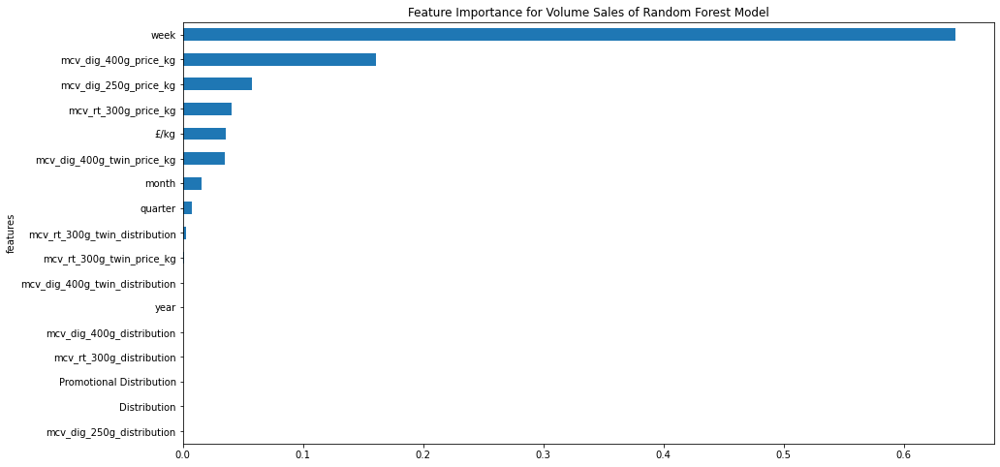

<Figure size 432x288 with 0 Axes>

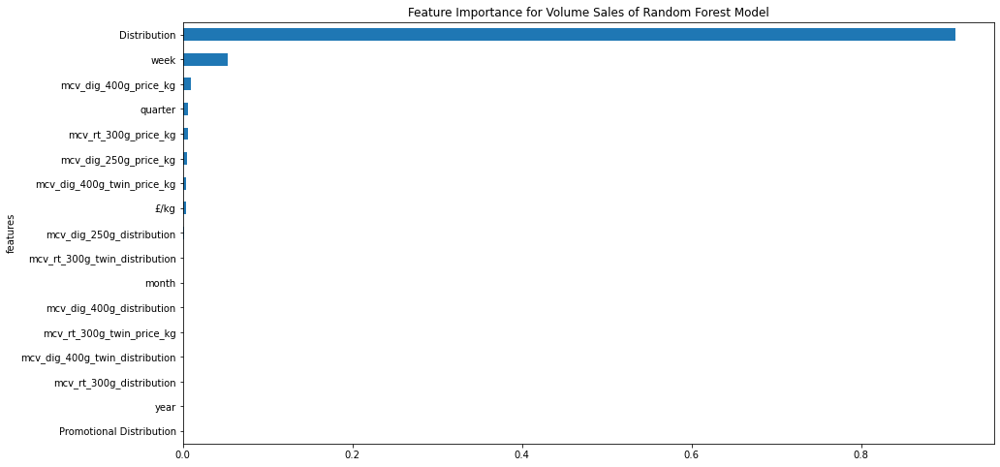

<Figure size 432x288 with 0 Axes>

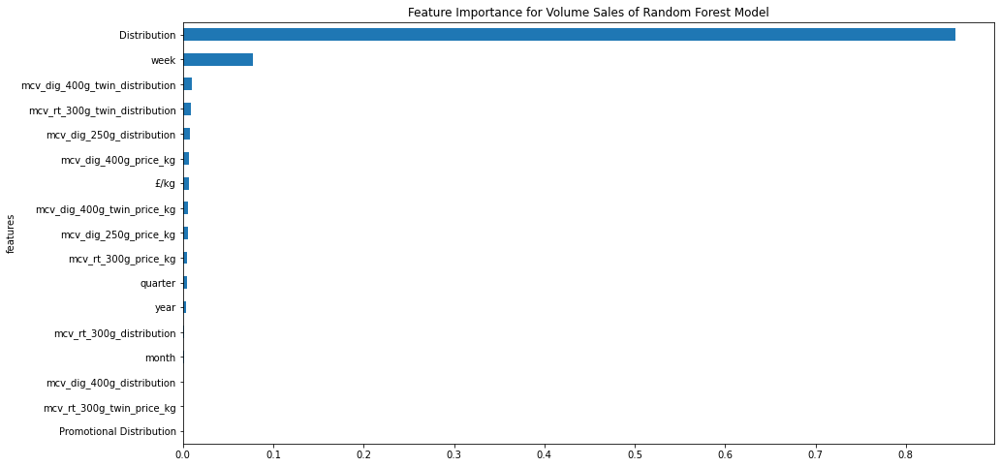

<Figure size 432x288 with 0 Axes>

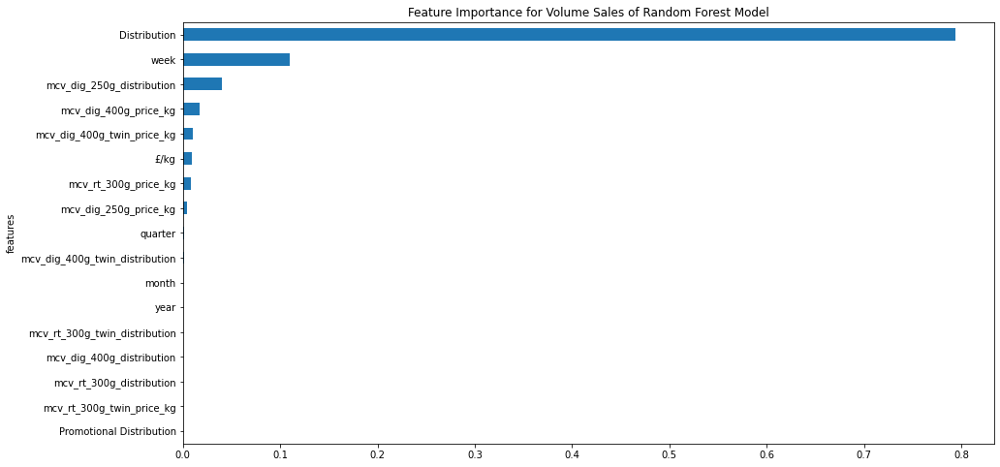

<Figure size 432x288 with 0 Axes>

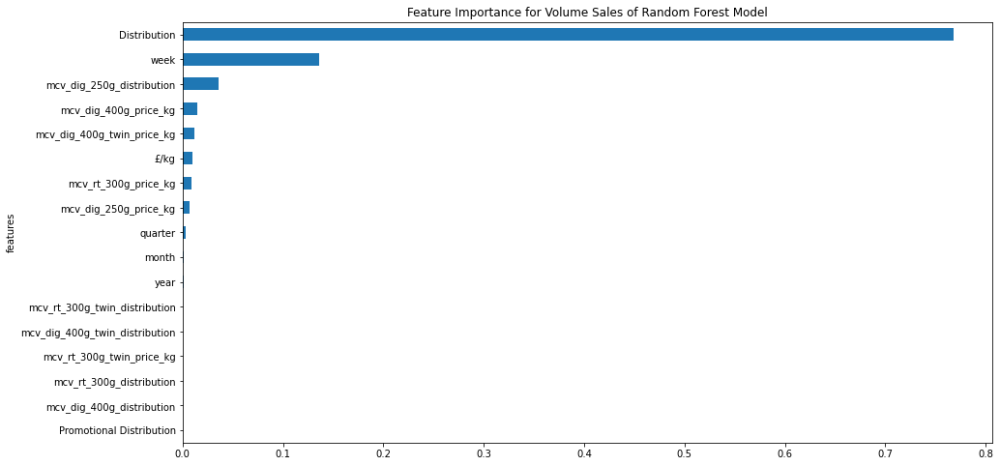

<Figure size 432x288 with 0 Axes>

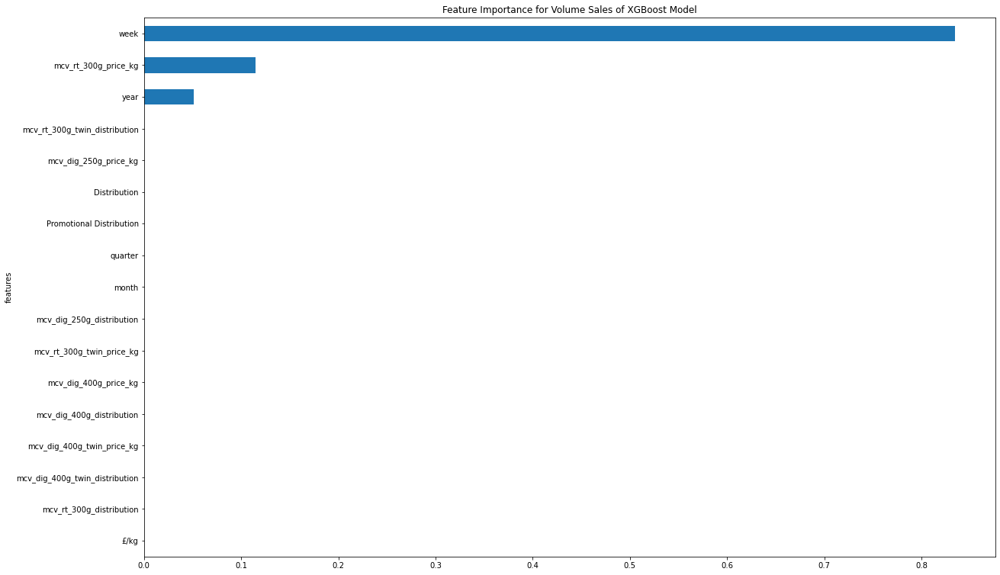

<Figure size 432x288 with 0 Axes>

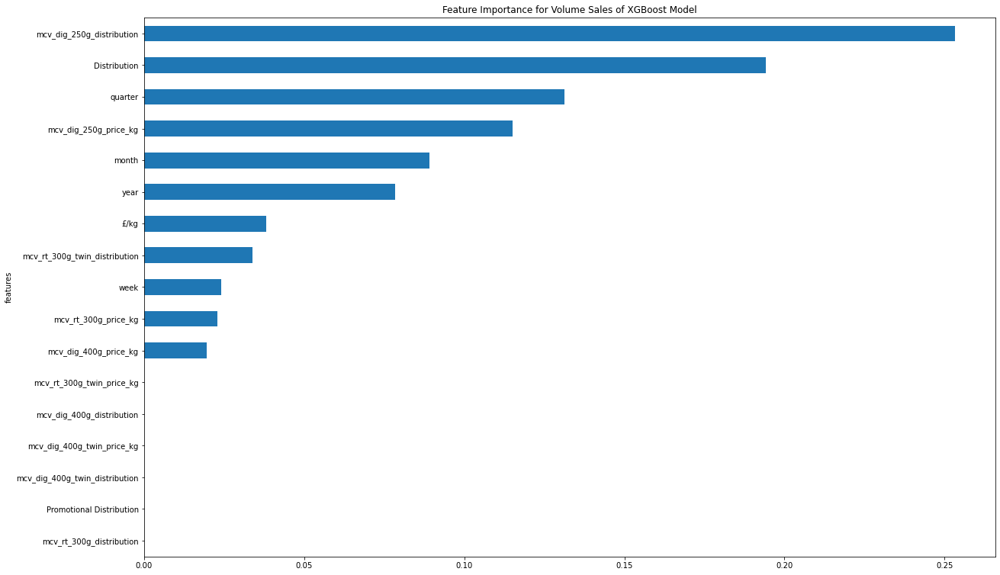

<Figure size 432x288 with 0 Axes>

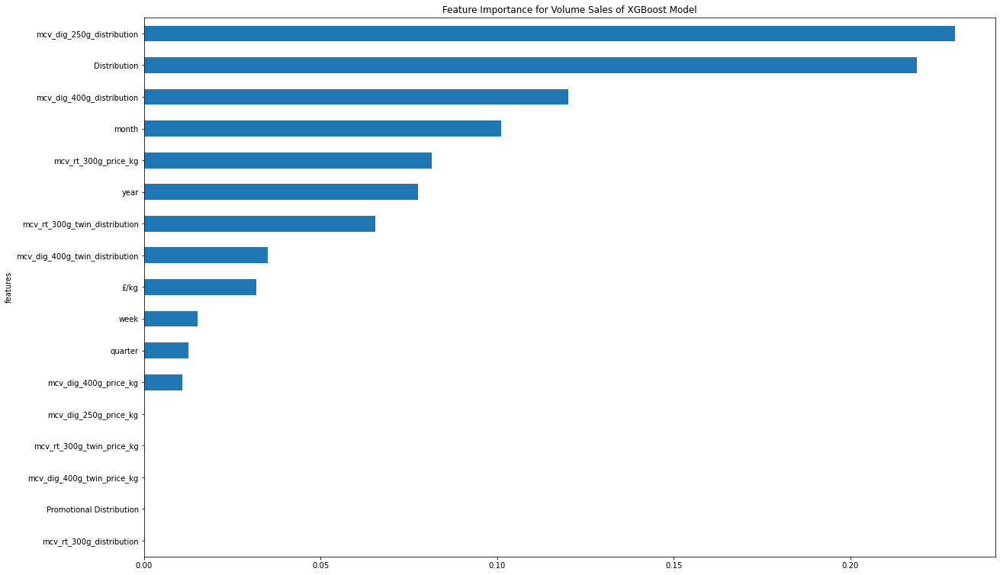

<Figure size 432x288 with 0 Axes>

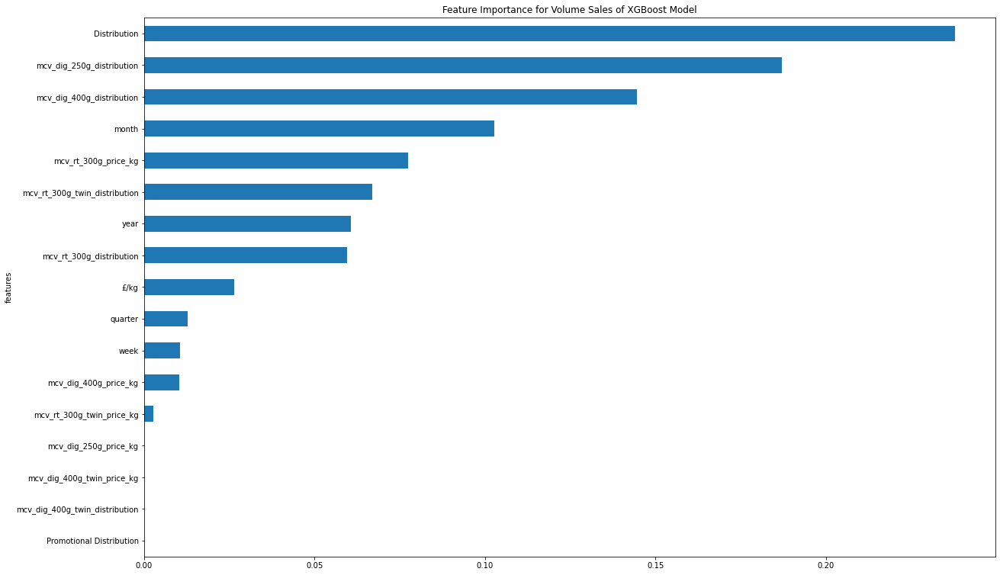

<Figure size 432x288 with 0 Axes>

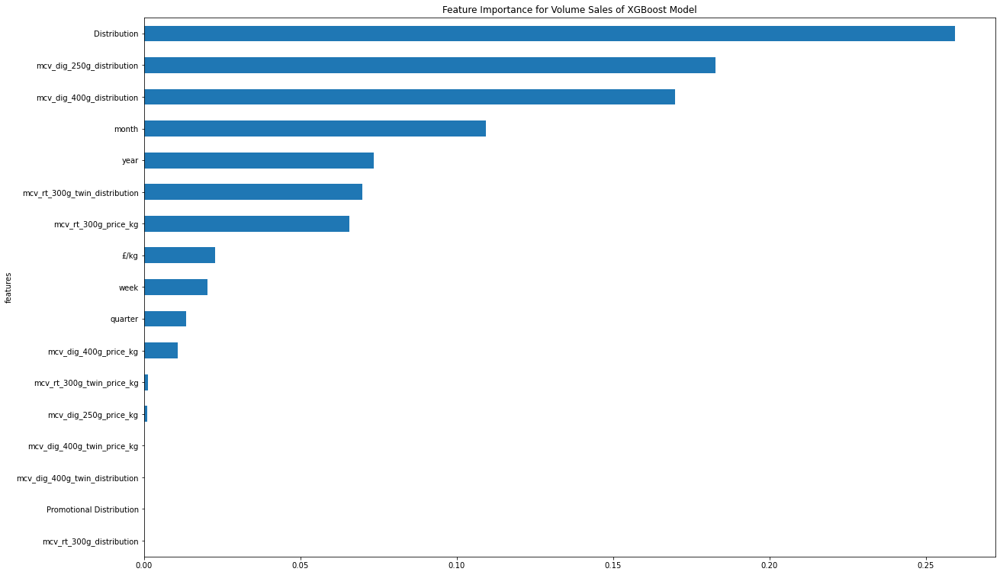

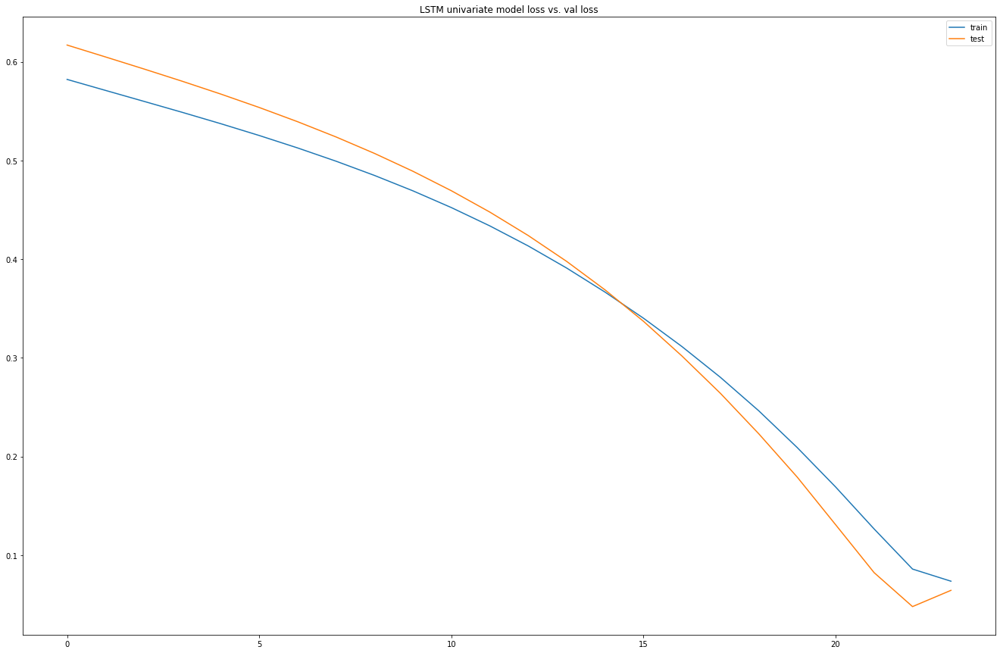

Test RMSE: 2170.590


,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
Date,,,,,,,,,,,,,,,,
2015-01-10,13594.5,2.000897,98.0,0.0,2014.0,4.0,12.0,50.0,12154.8,2.001020,98,0,2015,1,1,2
2015-01-17,12849.5,2.000794,98.0,0.0,2014.0,4.0,12.0,51.0,13175.5,2.000934,98,0,2015,1,1,3
2015-01-24,8820.3,2.000896,98.0,0.0,2014.0,4.0,12.0,52.0,14290.8,2.001008,98,0,2015,1,1,4
2015-01-31,8919.3,2.000998,98.0,0.0,2015.0,1.0,1.0,1.0,15203.0,2.001026,98,0,2015,1,1,5
2015-02-07,12154.8,2.001020,98.0,0.0,2015.0,1.0,1.0,2.0,15643.5,2.001048,98,0,2015,1,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,13123.8,2.241691,100.0,0.0,2020.0,1.0,1.0,3.0,15888.8,2.241447,100,0,2020,1,2,7
2020-02-22,14044.0,2.241683,100.0,0.0,2020.0,1.0,1.0,4.0,15479.0,2.241482,100,0,2020,1,2,8
2020-02-29,14768.5,2.241582,100.0,0.0,2020.0,1.0,2.0,5.0,16310.8,2.241656,100,0,2020,1,2,9


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.574974   0.655917       0.98        0.0   0.000000        1.0   
5   0.543464   0.655769       0.98        0.0   0.000000        1.0   
6   0.373044   0.655915       0.98        0.0   0.000000        1.0   
7   0.377231   0.656060       0.98        0.0   0.166656        0.0   
8   0.514080   0.656092       0.98        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)   var1(t)  
4        1.0   0.942308  0.514080  
5        1.0   0.961538  0.557252  
6        1.0   0.980769  0.604425  
7        0.0   0.000000  0.643008  
8        0.0   0.019231  0.661639  
(216, 1, 8) (216,) (55, 1, 8) (55,)
Train on 216 samples, validate on 55 samples
Epoch 1/50
216/216 - 6s - loss: 0.5759 - val_loss: 0.5966
Epoch 2/50
216/216 - 0s - loss: 0.5473 - val_loss: 0.5628
Epoch 3/50
216/216 - 0s - loss: 0.5181 - val_loss: 0.5266
Epoch 4/50
216/216 - 0s - loss: 0.4866 - val_loss: 0.4865
Epoch 5/50
216/216 - 0s - loss: 0.4514 - val

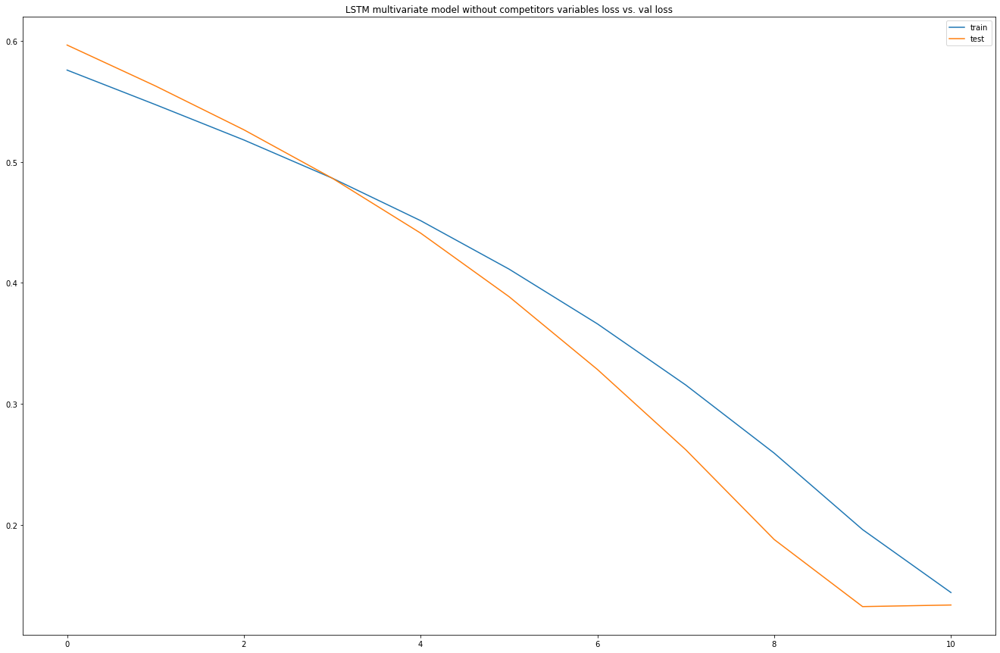

Test RMSE: 4054.513


In [127]:
#ml models
variable_lag_tesco(tes_rt_250g_with_comp)
tes_rt_250g_input_X,tes_rt_250g_input_Y=input_var_tesco(tes_rt_250g_with_comp)
rf_regressor_tesco(tes_rt_250g_input_X,tes_rt_250g_input_Y)

variable_lag_tesco(tes_rt_250g_with_comp)
tes_rt_250g_input_X,tes_rt_250g_input_Y=input_var_tesco(tes_rt_250g_with_comp)
xgb_regressor_tesco(tes_rt_250g_input_X,tes_rt_250g_input_Y)

#lstm models
series_to_supervised(tes_rt_250g_volume)
lstm_univariate(tes_rt_250g_volume)

series_to_supervised(tes_rt_250g_own_variable)
multivariate_lstm_without_competitor(tes_rt_250g_own_variable)


In [128]:
def multivariate_with_competitor_tesco(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 4, 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model with competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

,var1(t-4),var2(t-4),var3(t-4),var4(t-4),var5(t-4),var6(t-4),var7(t-4),var8(t-4),var9(t-4),var10(t-4),...,var9(t),var10(t),var11(t),var12(t),var13(t),var14(t),var15(t),var16(t),var17(t),var18(t)
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-10,13594.5,2.000897,98.0,0.0,2014.0,4.0,12.0,50.0,3.560262,97.0,...,3.559761,97,2.039523,100,1.889689,96,3.396960,100,3.15,96
2015-01-17,12849.5,2.000794,98.0,0.0,2014.0,4.0,12.0,51.0,3.560043,97.0,...,3.556789,97,2.040478,100,1.889442,96,3.398573,100,3.15,96
2015-01-24,8820.3,2.000896,98.0,0.0,2014.0,4.0,12.0,52.0,3.560118,97.0,...,3.555143,97,2.123438,100,1.889339,96,3.536073,100,3.15,96
2015-01-31,8919.3,2.000998,98.0,0.0,2015.0,1.0,1.0,1.0,3.560110,97.0,...,3.559082,97,2.182389,100,1.889769,96,3.636788,100,3.15,96
2015-02-07,12154.8,2.001020,98.0,0.0,2015.0,1.0,1.0,2.0,3.559761,97.0,...,3.555369,97,2.182429,100,1.889773,96,3.635421,100,3.15,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-15,13123.8,2.241691,100.0,0.0,2020.0,1.0,1.0,3.0,3.595392,58.0,...,3.999050,58,2.977519,100,2.487499,98,3.967342,100,3.32,98
2020-02-22,14044.0,2.241683,100.0,0.0,2020.0,1.0,1.0,4.0,3.599547,58.0,...,3.999678,58,2.977555,100,2.487350,98,3.963619,100,3.32,98
2020-02-29,14768.5,2.241582,100.0,0.0,2020.0,1.0,2.0,5.0,3.599397,58.0,...,3.998827,58,2.977099,100,2.487354,98,3.960884,100,3.32,98


   var1(t-4)  var2(t-4)  var3(t-4)  var4(t-4)  var5(t-4)  var6(t-4)  \
4   0.574974   0.655917       0.98        0.0   0.000000        1.0   
5   0.543464   0.655769       0.98        0.0   0.000000        1.0   
6   0.373044   0.655915       0.98        0.0   0.000000        1.0   
7   0.377231   0.656060       0.98        0.0   0.166656        0.0   
8   0.514080   0.656092       0.98        0.0   0.166656        0.0   

   var7(t-4)  var8(t-4)  var9(t-4)  var10(t-4)  var11(t-4)  var12(t-4)  \
4        1.0   0.942308   0.227363    0.951219    0.409722         1.0   
5        1.0   0.961538   0.226979    0.951219    0.410715         1.0   
6        1.0   0.980769   0.227110    0.951219    0.415920         1.0   
7        0.0   0.000000   0.227096    0.951219    0.414637         1.0   
8        0.0   0.019231   0.226483    0.951219    0.414171         1.0   

   var13(t-4)  var14(t-4)  var15(t-4)  var16(t-4)  var17(t-4)  var18(t-4)  \
4    0.298082    0.973333    0.299385    1.000001  

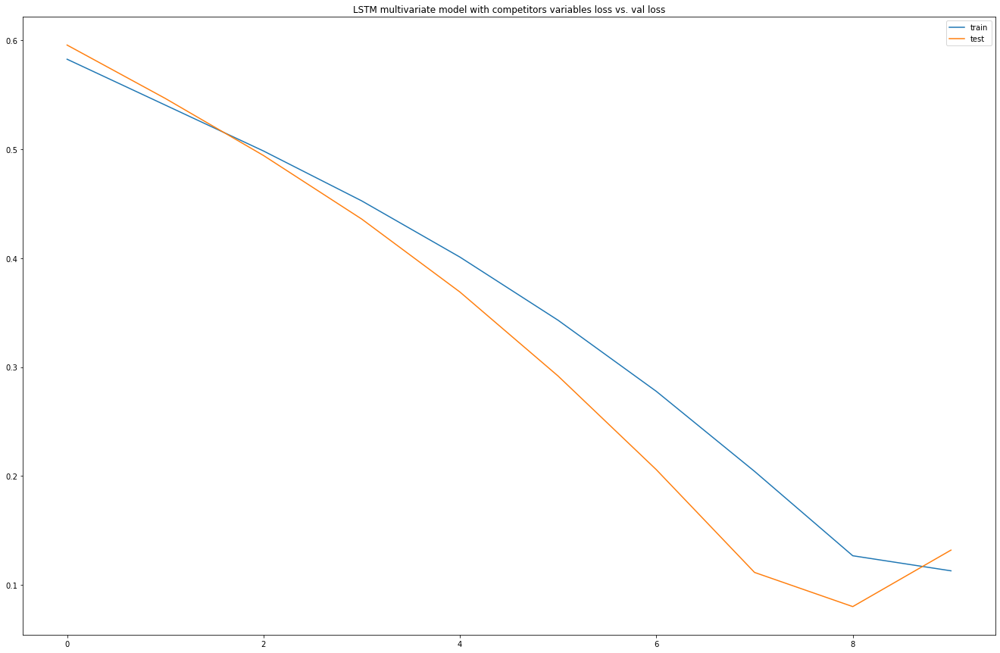

Test RMSE: 3865.456


In [129]:
series_to_supervised(tes_rt_250g_with_comp)
multivariate_with_competitor_tesco(tes_rt_250g_with_comp)

### 这里以上都整理完了

In [130]:
# #数据的突变点
# from fbprophet.plot import add_changepoints_to_plot
# fig = model_holiday.plot(forecast_holiday)
# a = add_changepoints_to_plot(fig.gca(), model_holiday, forecast_holiday)

In [131]:
# # cross validation (不要)
# from fbprophet.diagnostics import cross_validation
# df_cv = cross_validation(model_holiday, horizon = '180 days')
# df_cv.head()


In [132]:
# from fbprophet.diagnostics import performance_metrics
# df_p = performance_metrics(df_cv)
# df_p.head()

In [133]:
# from fbprophet.plot import plot_cross_validation_metric
# fig = plot_cross_validation_metric(df_cv, metric='mape')


In [134]:
# #feature importance value
# df_featImp.sort_values('importance', ascending=False).reset_index(drop=True).head(15)


# Asda

In [158]:
#import dataset - asda products
mcv_dig_400g_asda=pd.read_excel("Asda/Asda MCVTS DGSTVS 400G SNGL.xlsx")
mcv_dig_400g_twin_asda=pd.read_excel("Asda/Asda MCVTS DGSTVS 400G 2PACK.xlsx")
mcv_rt_300g_asda=pd.read_excel("Asda/Asda RCH T MCVTS RCH T PLN 300 GM SNGL.xlsx")
mcv_rt_300g_twin_asda=pd.read_excel("Asda/Asda RCH T MCVTS RCH T PLN 300 GM 2 PCK.xlsx")

#import dataset - competitors products
asda_dig_400g=pd.read_excel("Asda/Asda (own label) TSC DGSTVS PLN 400 GM SNGL.xlsx")
asda_rt_250g=pd.read_excel("Asda/Asda (own label) RCH T TSC RCH T FNGRS PLN 250 GM SNGL.xlsx")
asda_rt_300g=pd.read_excel("Asda/Asda (own label) RCH T TSC RCH T PLN 300 GM SNGL.xlsx")



In [159]:
#put corresponding dataset file into lists
mcv_list=[mcv_dig_400g_asda,mcv_dig_400g_twin_asda,mcv_rt_300g_asda,mcv_rt_300g_twin_asda]
asda_list=[asda_dig_400g,asda_rt_250g,asda_rt_300g]
asda_total=[mcv_dig_400g_asda,mcv_dig_400g_twin_asda,
            mcv_rt_300g_asda,mcv_rt_300g_twin_asda,
           asda_dig_400g,asda_rt_250g,asda_rt_300g]


In [160]:
#transform date format and add quarter, week and month
asda_product=[]

for df in asda_total:
#     df = DataFrame(data)
    df=df[:275]
    date_time = df['SDESC'].str[3:]
    date_time=pd.to_datetime(date_time, format='%d.%m.%y')
    df['SDESC']=date_time
    df=df.dropna()
    df.rename(columns={'SDESC':'Date'}, inplace=True)
    
    df['year'] = pd.DatetimeIndex(df['Date']).year
    df['quarter'] = pd.DatetimeIndex(df['Date']).quarter
    # month as number
    df['month'] = pd.DatetimeIndex(df['Date']).month
    # week as number
    df['week'] = pd.DatetimeIndex(df['Date']).week
#     df=df.set_index('Date')

    asda_product.append(df)
    continue


#assign list name
mcv_dig_400g_asda_origin=asda_product[0]
mcv_dig_400g_twin_asda_origin=asda_product[1]
mcv_rt_300g_asda_origin=asda_product[2]
mcv_rt_300g_twin_asda_origin=asda_product[3]
asda_dig_400g_origin=asda_product[4]
asda_rt_250g_origin=asda_product[5]
asda_rt_300g_origin=asda_product[6]


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Date,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
0,2014-12-13,67468,33734.0,68223.0,100,22,1.011190,2.022381,2014,4,12,50
1,2014-12-20,70251,35125.5,71049.0,100,25,1.011359,2.022719,2014,4,12,51
2,2014-12-27,60800,30400.0,61668.2,100,25,1.014280,2.028559,2014,4,12,52
3,2015-01-03,45074,22537.0,45399.9,100,36,1.007230,2.014461,2015,1,1,1
4,2015-01-10,57355,28677.5,56019.3,100,50,0.976712,1.953423,2015,1,1,2


(275, 12)

Date                        datetime64[ns]
Units                                int64
Volume                             float64
Value                              float64
Distribution                         int64
Promotional Distribution             int64
£/unit                             float64
£/kg                               float64
year                                 int64
quarter                              int64
month                                int64
week                                 int64
dtype: object

,Units,Volume,Value,Distribution,Promotional Distribution,£/unit,£/kg,year,quarter,month,week
count,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000,275.000000
mean,64677.770909,28515.661091,64011.872364,99.854545,14.207273,0.991883,2.294104,2017.083636,2.469091,6.414545,26.043636
std,12602.014703,7615.877084,11796.188424,1.039690,25.057539,0.041887,0.262126,1.534371,1.140635,3.547767,15.490223
min,24747.000000,9898.800000,21736.400000,85.000000,0.000000,0.820686,1.641372,2014.000000,1.000000,1.000000,1.000000
25%,57330.500000,23872.200000,57348.750000,100.000000,0.000000,0.998713,1.999331,2016.000000,1.000000,3.000000,12.000000
50%,63848.000000,26470.000000,63353.200000,100.000000,0.000000,0.999516,2.496433,2017.000000,2.000000,6.000000,26.000000
75%,69958.000000,32056.350000,68804.450000,100.000000,14.500000,0.999749,2.499132,2018.000000,3.500000,9.500000,39.500000
95%,88221.500000,44110.750000,88183.210000,100.000000,69.000000,0.999910,2.499711,2019.000000,4.000000,12.000000,50.000000
99%,98159.520000,49079.760000,94590.412000,100.000000,99.260000,1.181846,2.954615,2020.000000,4.000000,12.000000,52.000000
max,117558.000000,58779.000000,96748.000000,100.000000,100.000000,1.187854,2.969636,2020.000000,4.000000,12.000000,53.000000


Dataset has: 275rows
Missing values:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out distribution>100:
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional Distribution    0
£/unit                      0
£/kg                        0
year                        0
quarter                     0
month                       0
week                        0
dtype: int64
Screen out negative data: 
Date                        0
Units                       0
Volume                      0
Value                       0
Distribution                0
Promotional

<Figure size 432x288 with 0 Axes>

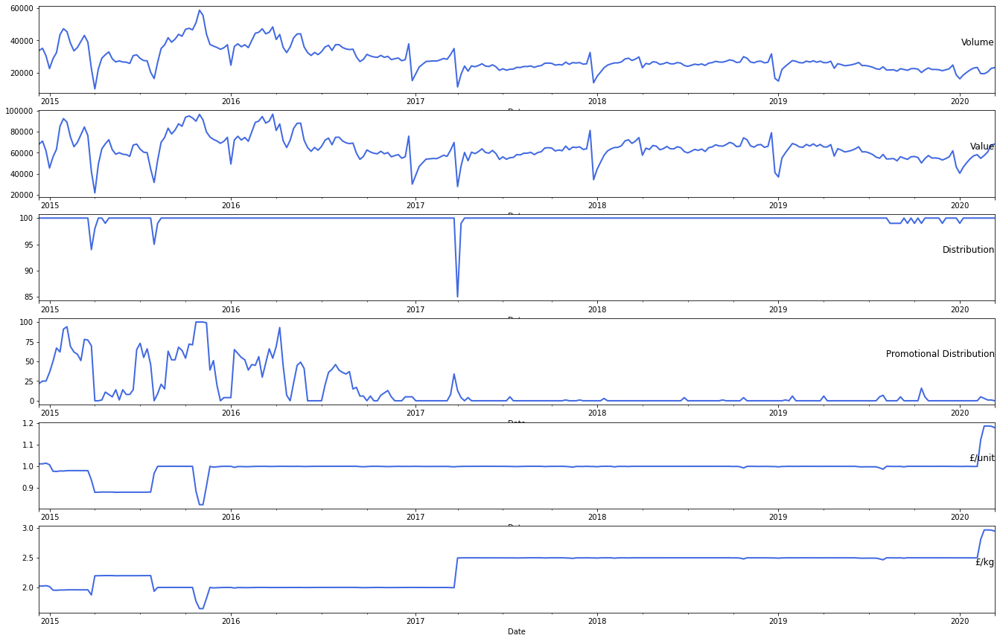

(<matplotlib.axes._subplots.AxesSubplot at 0x7f31a4e676a0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f31a4d68ba8>)

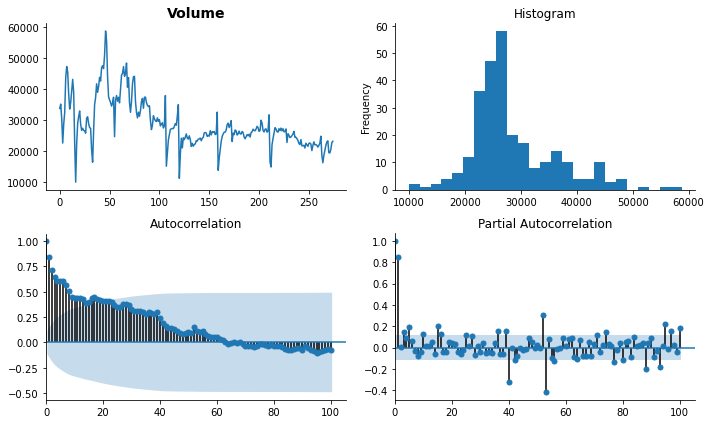

In [161]:
basic_info(mcv_dig_400g_asda_origin)
plot_data(mcv_dig_400g_asda_origin)
tsplot(mcv_dig_400g_asda_origin['Volume'].dropna(), title=mcv_dig_400g_asda_origin.columns[2], lags=100)


Test Statistic                  -2.579539
p-value                          0.097300
#Lags Used                       4.000000
Number of Observations Used    270.000000
Critical Value (1%)             -3.454804
Critical Value (5%)             -2.872305
Critical Value (10%)            -2.572506
dtype: float64


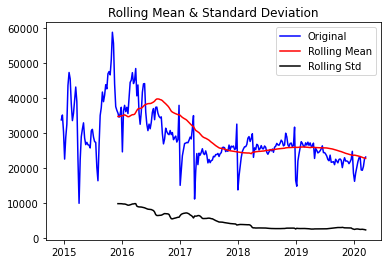

In [162]:
plot(mcv_dig_400g_asda_origin)

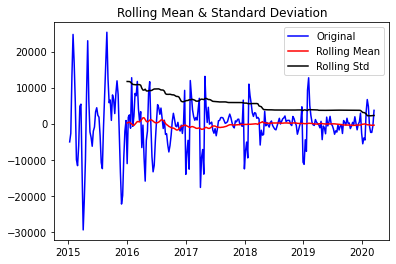

Results of Dickey-Fuller Test:
Test Statistic                -6.296919e+00
p-value                        3.487614e-08
#Lags Used                     1.200000e+01
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64


In [163]:
plot_transform(mcv_dig_400g_asda_origin)

       t-4      t+1
0      NaN  33734.0
1      NaN  35125.5
2      NaN  30400.0
3      NaN  22537.0
4  33734.0  28677.5
Test MSE: 4950236.902
Test RMSE: 2224.913


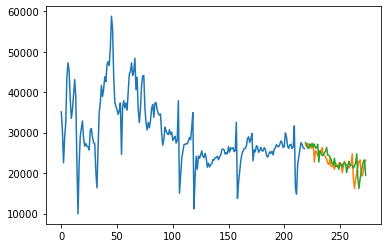

Observations: 271
Training Observations: 216
Testing Observations: 55


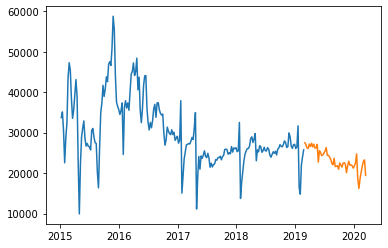

RMSE for Simple Exponential Smoothing α= 0.1 is: 2879.23
RMSE for Simple Exponential Smoothing α= 0.2 is: 2558.73
RMSE for Simple Exponential Smoothing α= 0.30000000000000004 is: 2527.56
RMSE for Simple Exponential Smoothing α= 0.4 is: 2535.11
RMSE for Simple Exponential Smoothing α= 0.5 is: 2595.52
RMSE for Simple Exponential Smoothing α= 0.6000000000000001 is: 2742.16
RMSE for Simple Exponential Smoothing α= 0.7000000000000001 is: 2946.28
RMSE for Simple Exponential Smoothing α= 0.8 is: 3153.21
RMSE for Simple Exponential Smoothing α= 0.9 is: 3326.31


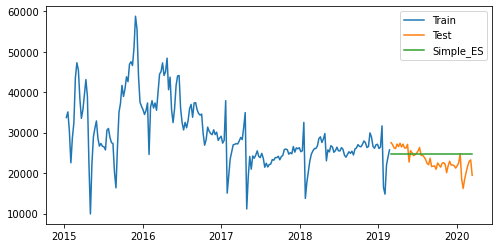

RMSE with the best simple exponential smoothing model parameter after log transformation generates: 2742.41
Observations: 271
Training Observations: 216
Testing Observations: 55
Min RMSE for Holt Linear Forecasting α= 0.6000000000000001 and β= 0.1 is: 2026.92


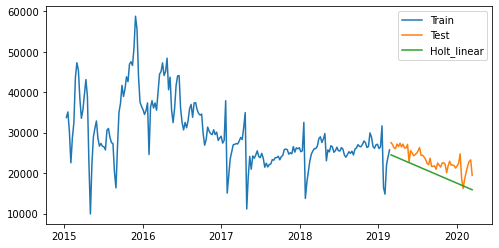

Observations: 275
Training Observations: 204
Testing Observations: 59


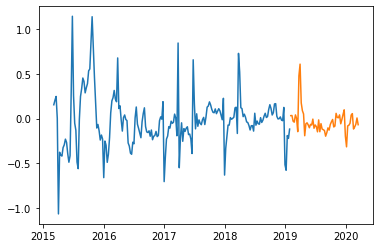

             Volume    pred_value
Date                             
2019-02-02  27507.2  24204.619213
2019-02-09  27052.4  23534.384632
2019-02-16  26231.2  22561.105821
2019-02-23  26056.4  22156.533485
2019-03-02  27172.8  22843.727471
2019-03-09  26559.6  22074.927466
2019-03-16  27372.0  22492.071925
2019-03-23  26466.0  21500.889023
2019-03-30  27160.8  21815.031486
2019-04-06  26196.8  20802.077409
2019-04-13  26215.2  20580.542388
2019-04-20  27101.6  21035.059705
2019-04-27  22722.8  17436.360557
2019-05-04  25539.2  19375.211915
2019-05-11  25029.2  18772.897888
2019-05-18  24298.8  18018.322374
2019-05-25  24535.2  17987.230748
2019-06-01  24914.0  18057.737717
2019-06-08  25472.8  18253.314788
2019-06-15  26319.2  18645.881472
2019-06-22  24385.6  17080.038989
2019-06-29  24403.6  16898.746339
2019-07-06  23978.0  16415.674123
2019-07-13  23382.8  15826.593885
2019-07-20  22394.0  14985.381176
2019-07-27  22061.2  14595.212732
2019-08-03  23662.0  15476.684335
2019-08-10  21

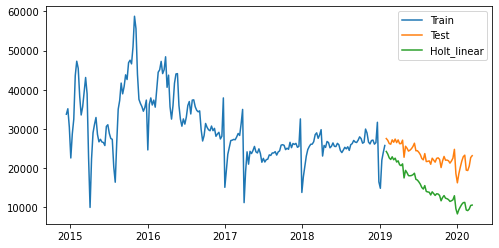

RMSE for Holt Linear Forecasting with transformation is: 8347.375985601668


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency W-SAT will be used.

/opt/anaconda/envs/Python3/lib/python3.6/site

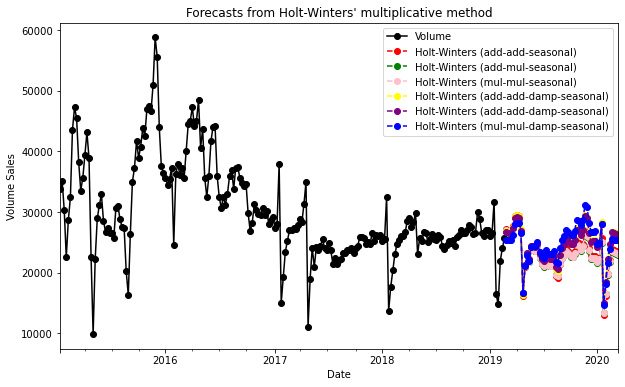

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for Holt-winter are:
2970.822194902957
2791.0717792719875
2804.094346140534
3797.2117713056637
3654.164258700454
4153.692218249149


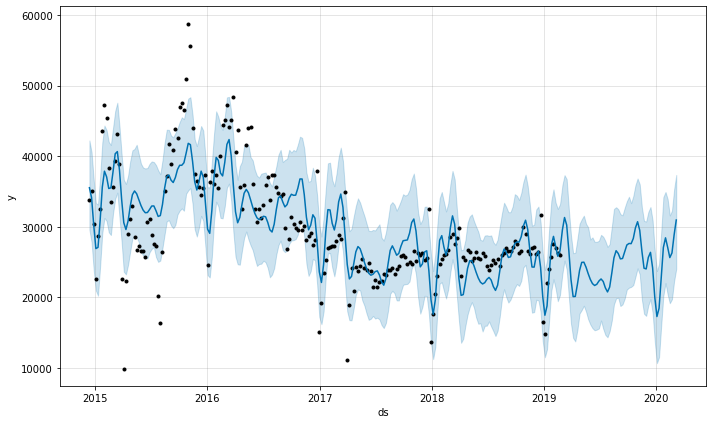

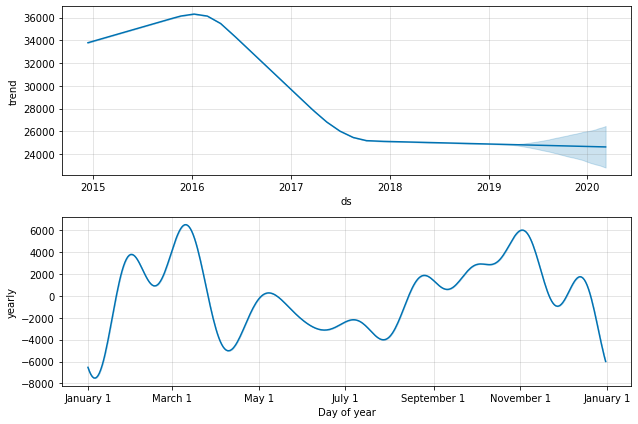

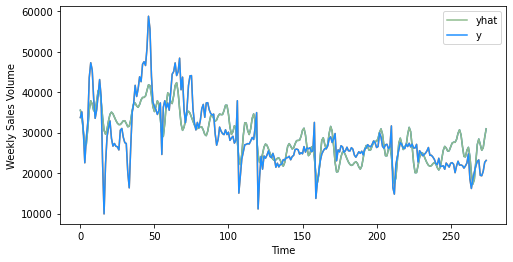

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


RMSE for prophet model is: 4820.905647014377


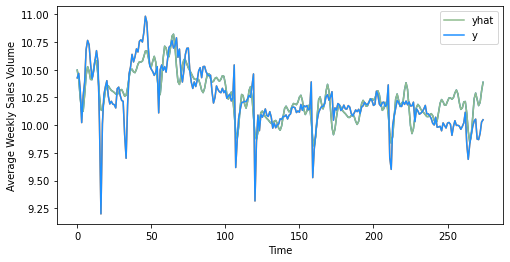

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:48: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet model after transformation is: 4345.190154420724
0                                        New Year's Day
1                           New Year Holiday [Scotland]
2                New Year Holiday [Scotland] (Observed)
3                  St. Patrick's Day [Northern Ireland]
4                                           Good Friday
5      Easter Monday [England, Wales, Northern Ireland]
6                                               May Day
7                                   Spring Bank Holiday
8                Battle of the Boyne [Northern Ireland]
9                        Summer Bank Holiday [Scotland]
10    Late Summer Bank Holiday [England, Wales, Nort...
11                          St. Andrew's Day [Scotland]
12                                        Christmas Day
13                             Christmas Day (Observed)
14                                           Boxing Day
15    New Year Holiday [Scotland], New Year's Day (O...
16      St. Patrick's Day [Northern Ir

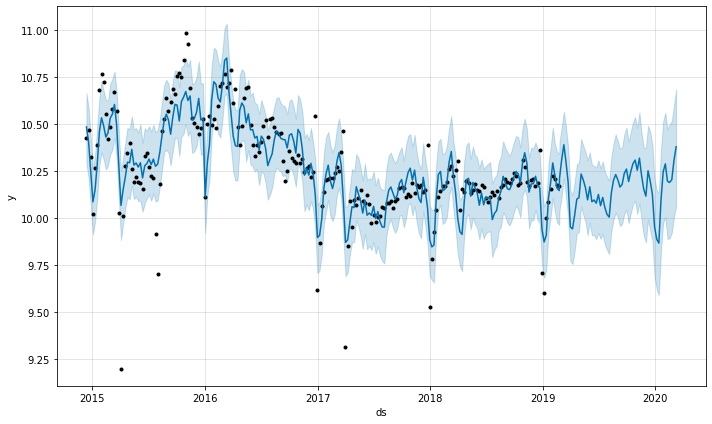

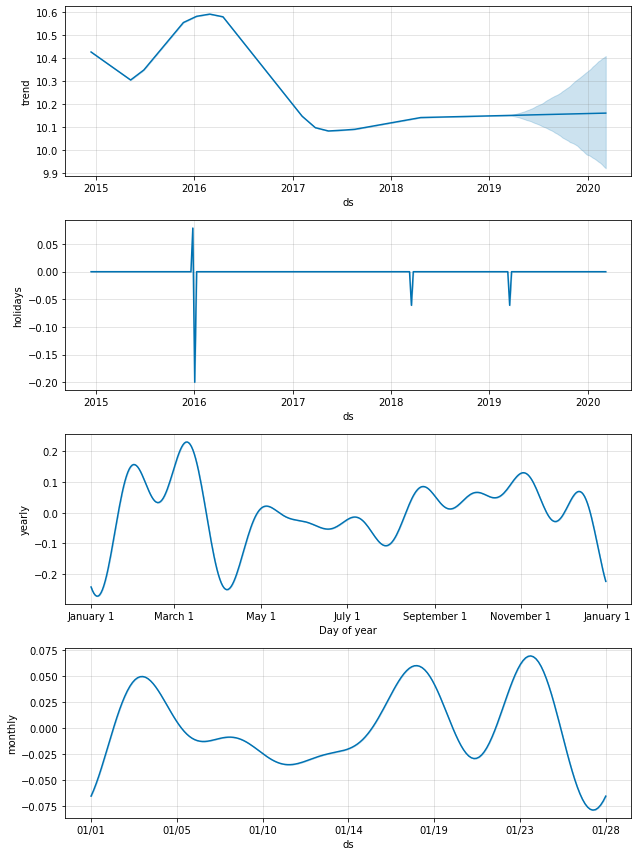

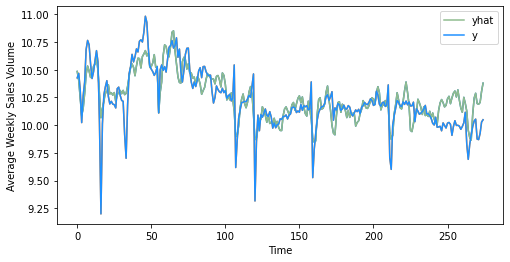

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:54: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:55: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:56: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

RMSE for prophet with transformation and holiday is: 4287.763069848028


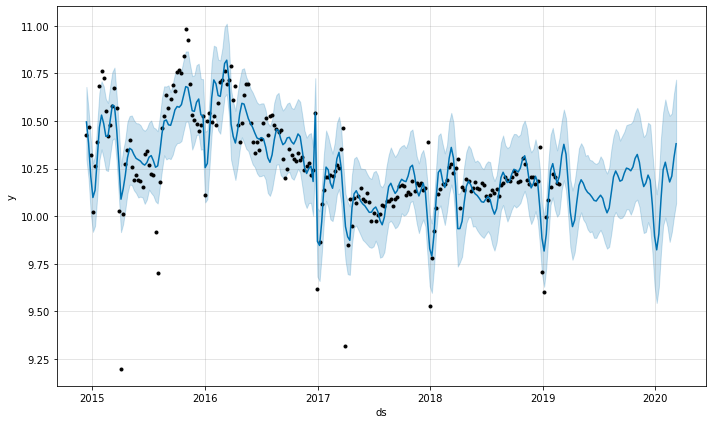

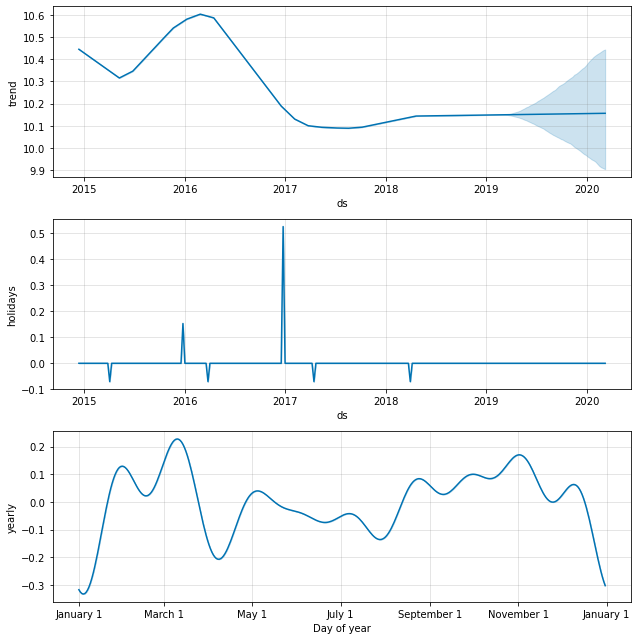

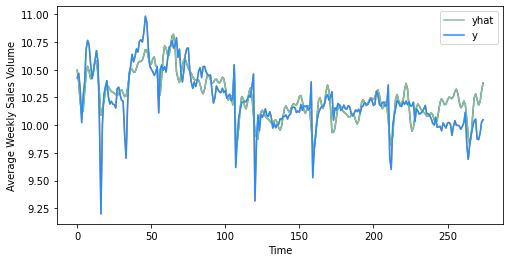

4218.6366771276325


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:52: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/ipykernel/__main__.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [164]:
#time series models
baseline_model(mcv_dig_400g_asda_origin)
ses_model(mcv_dig_400g_asda_origin)
holt_linear_model(mcv_dig_400g_asda_origin)
holt_linear_model_log(mcv_dig_400g_asda_origin)
holt_winter_model(mcv_dig_400g_asda_origin)
prophet_model(mcv_dig_400g_asda_origin)
prophet_model_log(mcv_dig_400g_asda_origin)
prophet_log_season(mcv_dig_400g_asda_origin)
prophet_log_two_holiday(mcv_dig_400g_asda_origin)


<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_asda')

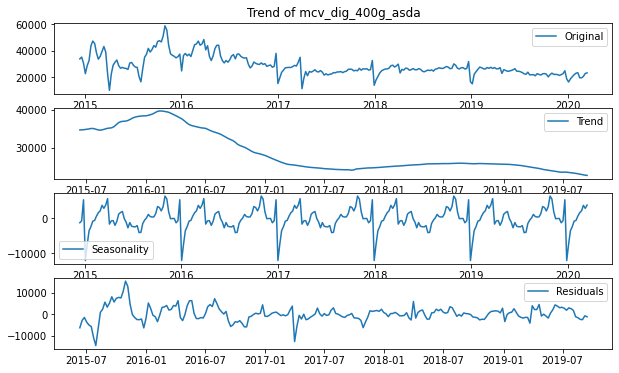

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin_asda')

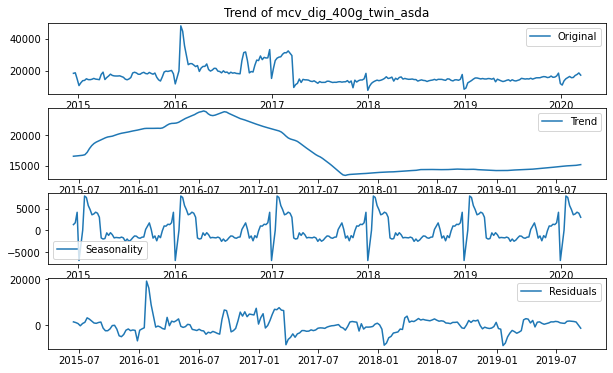

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_asda')

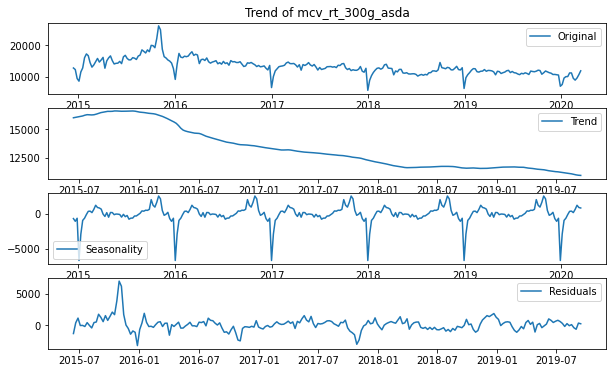

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin_asda')

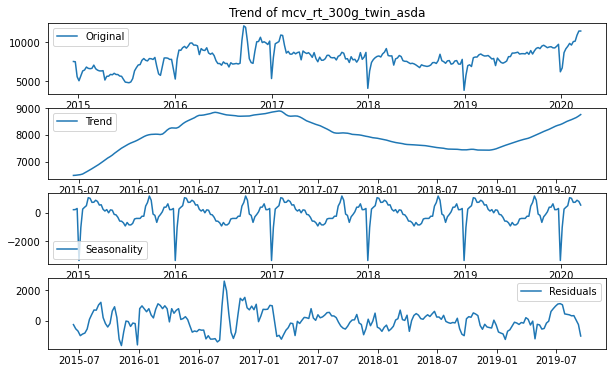

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_dig_400g')

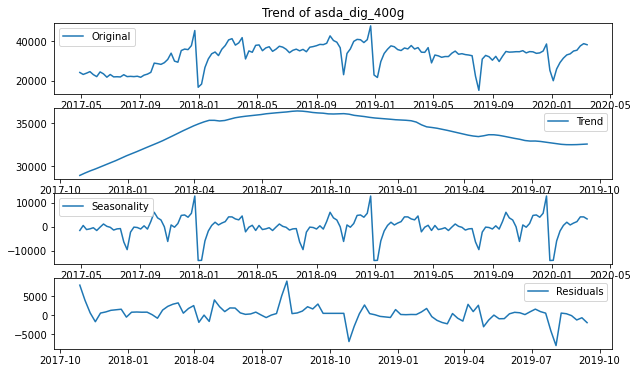

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_250g')

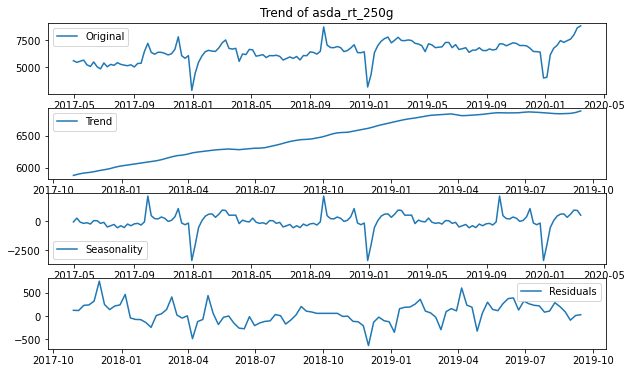

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_300g')

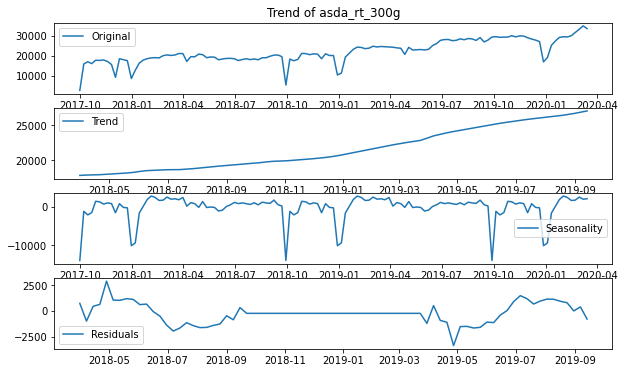

In [165]:
#variable analysis
from statsmodels.tsa.seasonal import seasonal_decompose

asda_name=['mcv_dig_400g_asda','mcv_dig_400g_twin_asda',
          'mcv_rt_300g_asda','mcv_rt_300g_twin_asda',
          'asda_dig_400g', 'asda_rt_250g','asda_rt_300g'
         ]

asda_total_2=[]
i=0
for df in asda_product:
    df=df.set_index('Date')
    df=df[['Volume']]
    df = df.dropna()
    asda_total_2.append(df)
    
    try:
        decomposition=seasonal_decompose(df)
    except ValueError:
        print('No enough datapoints for plotting the complete graphs')
   
    trend=decomposition.trend
    seasonal=decomposition.seasonal
    residual=decomposition.resid

    plt.figure(figsize=(10,6))
    plt.subplot(411)
    plt.plot(df, label='Original')
    plt.legend(loc='best')
    plt.title('Trend of ' + asda_name[i] )
    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal, label='Seasonality')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals')
    plt.legend(loc='best')
    plt.show()
    i=i+1

mcv_dig_400g_asda_volume=asda_total_2[0]
mcv_dig_400g_twin_asda_volume=asda_total_2[1]
mcv_rt_300g_asda_volume=asda_total_2[2]
mcv_rt_300g_twin_asda_volume=asda_total_2[3]
asda_dig_400g_volume=asda_total_2[4]
asda_rt_250g_volume=asda_total_2[5]
asda_rt_300g_volume=asda_total_2[6]


#### Compare trends with Pladis product and competitors' product

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_250g')

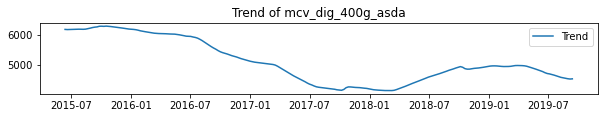

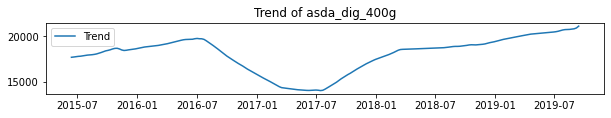

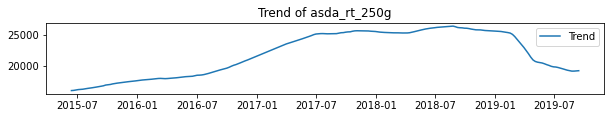

In [175]:
# mcv_dig_400g_asda_competitor=[mcv_dig_400g_asda_volume,asda_dig_400g_volume,asda_rt_250g_volume,asda_rt_300g_volume]
# mcv_dig_400g_asda_competitor_list=['mcv_dig_400g_asda','asda_dig_400g','asda_rt_250g','asda_rt_300g']
# mcv_dig_400g_twin_asda_competitor=[mcv_dig_400g_twin_asda_volume,asda_dig_400g_volume,asda_rt_250g_volume,asda_rt_300g_volume]
# mcv_dig_400g_twin_asda_competitor_list=['mcv_dig_400g_twin_asda','asda_dig_400g','asda_rt_250g','asda_rt_300g']
# mcv_rt_300g_asda_competitor=[asda_rt_250g_volume,asda_dig_400g_volume,asda_rt_250g_volume,asda_rt_300g_volume]
# mcv_rt_300g_asda_competitor_list=['mcv_rt_300g','asda_dig_400g','asda_rt_250g','asda_rt_300g']
# mcv_rt_300g_twin_asda_competitor=[mcv_rt_300g_twin_asda_volume,asda_dig_400g_volume,asda_rt_250g_volume,asda_rt_300g_volume]
# mcv_rt_300g_twin_asda_competitor_list=['mcv_rt_300g_twin','asda_dig_400g','asda_rt_250g','asda_rt_300g']

mcv_dig_400g_asda_competitor=[mcv_dig_400g_asda_volume,asda_dig_400g_volume,asda_rt_250g_volume]
mcv_dig_400g_asda_competitor_list=['mcv_dig_400g_asda','asda_dig_400g','asda_rt_250g']
mcv_dig_400g_twin_asda_competitor=[mcv_dig_400g_twin_asda_volume,asda_dig_400g_volume,asda_rt_250g_volume]
mcv_dig_400g_twin_asda_competitor_list=['mcv_dig_400g_twin_asda','asda_dig_400g','asda_rt_250g']
mcv_rt_300g_asda_competitor=[asda_rt_250g_volume,asda_dig_400g_volume,asda_rt_250g_volume]
mcv_rt_300g_asda_competitor_list=['mcv_rt_300g','asda_dig_400g','asda_rt_250g']
mcv_rt_300g_twin_asda_competitor=[mcv_rt_300g_twin_asda_volume,asda_dig_400g_volume,asda_rt_250g_volume]
mcv_rt_300g_twin_asda_competitor_list=['mcv_rt_300g_twin','asda_dig_400g','asda_rt_250g']

i=0
for product in mcv_dig_400g_asda_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_400g_asda_competitor_list[i] )
    i=i+1
    
#asda rt 300g les than 104 observations, cannot plot trend

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_250g')

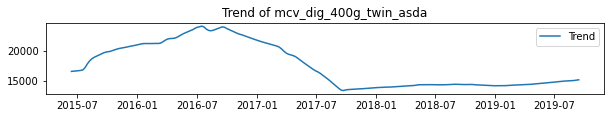

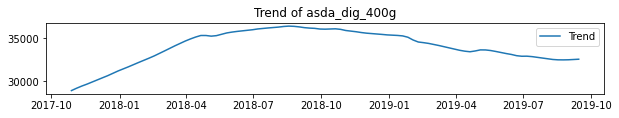

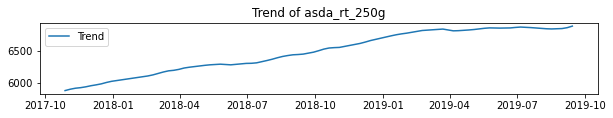

In [167]:
i=0
for product in mcv_dig_400g_twin_asda_competitor:
    decomposition=seasonal_decompose(product)
    trend_2=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_2, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_dig_400g_twin_asda_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_250g')

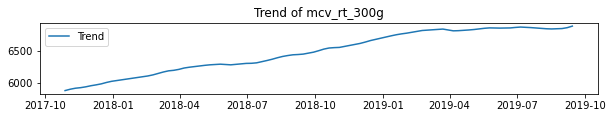

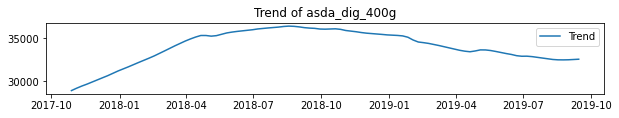

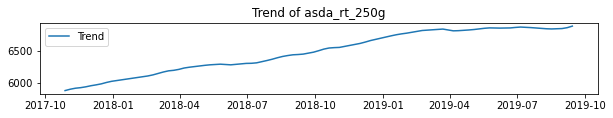

In [168]:
i=0
for product in mcv_rt_300g_asda_competitor:
    decomposition=seasonal_decompose(product)
    trend_3=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_3, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_rt_300g_asda_competitor_list[i])
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_250g')

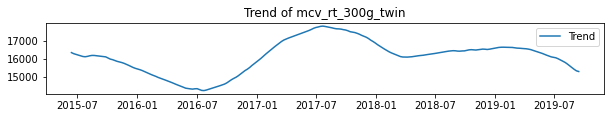

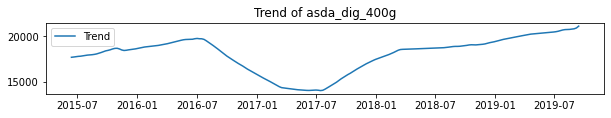

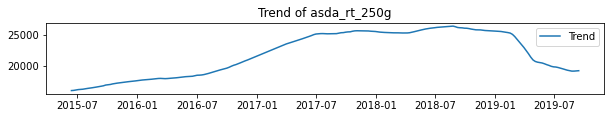

In [176]:
i=0
for product in mcv_rt_300g_twin_asda_competitor:
    decomposition=seasonal_decompose(product)
    trend_4=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_4, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + mcv_rt_300g_twin_asda_competitor_list[i])
    i=i+1

In [177]:
mcv_dig_400g_asda_volume=tes_large2[0]
mcv_dig_400g_twin_asda_volume=tes_large2[1]
mcv_rt_300g_asda_volume=tes_large2[2]
mcv_rt_300g_twin_asda_volume=tes_large2[3]
asda_dig_400g_volume=tes_large2[4]
asda_rt_250g_volume=tes_large2[5]
asda_rt_300g_volume=tes_large2[6]

In [178]:
#trend correlation
decomposition_1=seasonal_decompose(mcv_dig_400g_asda_volume)
trend_1=decomposition_1.trend
trend_1=trend_1.to_frame()

comp_decomposition_1=seasonal_decompose(asda_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(asda_rt_250g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

# # datapoints are less than 104 observations
# comp_decomposition_3=seasonal_decompose(asda_rt_300g_volume)
# comp_trend3=comp_decomposition_3.trend
# comp_trend3=comp_trend3.to_frame()

# comp_decomposition_4=seasonal_decompose(tes_rt_300g_volume)
# comp_trend4=comp_decomposition_4.trend
# comp_trend4=comp_trend4.to_frame()

mcv_dig_400g_asda_comp=pd.merge(trend_1,comp_trend1, how='left', on='Date')
mcv_dig_400g_asda_comp=pd.merge(mcv_dig_400g_asda_comp,comp_trend2, how='left', on='Date')
# mcv_dig_400g_asda_comp=pd.merge(mcv_dig_250g_comp,comp_trend3, how='left', on='Date')
# mcv_dig_250g_comp=pd.merge(mcv_dig_250g_comp,comp_trend4, how='left', on='Date')
mcv_dig_400g_asda_comp.columns=['mcv_dig_400g_asda_trend', 'asda_dig_400g','asda_rt_250g']

mcv_dig_400g_asda_comp.corr()


,mcv_dig_400g_asda_trend,asda_dig_400g,asda_rt_250g
mcv_dig_400g_asda_trend,1.000000,0.284689,-0.866579
asda_dig_400g,0.284689,1.000000,-0.299945
asda_rt_250g,-0.866579,-0.299945,1.000000


In [172]:
decomposition_2=seasonal_decompose(mcv_dig_400g_twin_asda_volume)
trend_2=decomposition_2.trend
trend_2=trend_2.to_frame()

comp_decomposition_1=seasonal_decompose(asda_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(asda_rt_250g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

mcv_dig_400g_twin_asda_comp=pd.merge(trend_2,comp_trend1, how='left', on='Date')
mcv_dig_400g_twin_asda_comp=pd.merge(mcv_dig_400g_twin_asda_comp,comp_trend2, how='left', on='Date')
# mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend3, how='left', on='Date')
# mcv_400g_comp=pd.merge(mcv_400g_comp,comp_trend4, how='left', on='Date')
mcv_dig_400g_twin_asda_comp.columns=['mcv_dig_400g_twin_asda_trend', 'asda_dig_400g','asda_rt_250g']

mcv_dig_400g_twin_asda_comp.corr()


,mcv_dig_400g_twin_asda_trend,asda_dig_400g,asda_rt_250g
mcv_dig_400g_twin_asda_trend,1.000000,-0.833973,-0.079756
asda_dig_400g,-0.833973,1.000000,-0.299945
asda_rt_250g,-0.079756,-0.299945,1.000000


In [179]:
decomposition_3=seasonal_decompose(mcv_rt_300g_asda_volume)
trend_3=decomposition_3.trend
trend_3=trend_3.to_frame()

comp_decomposition_1=seasonal_decompose(asda_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(asda_rt_250g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

mcv_rt_300g_asda_comp=pd.merge(trend_3,comp_trend1, how='left', on='Date')
mcv_rt_300g_asda_comp=pd.merge(mcv_rt_300g_asda_comp,comp_trend2, how='left', on='Date')
# mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend3, how='left', on='Date')
# mcv_dig_400g_twin_comp=pd.merge(mcv_dig_400g_twin_comp,comp_trend4, how='left', on='Date')
mcv_rt_300g_asda_comp.columns=['mcv_rt_300g_asda_trend', 'asda_dig_400g','asda_rt_250g']

mcv_rt_300g_asda_comp.corr()


,mcv_rt_300g_asda_trend,asda_dig_400g,asda_rt_250g
mcv_rt_300g_asda_trend,1.000000,0.183894,-0.838641
asda_dig_400g,0.183894,1.000000,-0.299945
asda_rt_250g,-0.838641,-0.299945,1.000000


In [180]:
decomposition_4=seasonal_decompose(mcv_rt_300g_twin_asda_volume)
trend_4=decomposition_4.trend
trend_4=trend_4.to_frame()

comp_decomposition_1=seasonal_decompose(asda_dig_400g_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(asda_rt_250g_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

mcv_rt_300g_twin_asda_comp=pd.merge(trend_4,comp_trend1, how='left', on='Date')
mcv_rt_300g_twin_asda_comp=pd.merge(mcv_rt_300g_twin_asda_comp,comp_trend2, how='left', on='Date')
# mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend3, how='left', on='Date')
# mcv_rt_300g_comp=pd.merge(mcv_rt_300g_comp,comp_trend4, how='left', on='Date')
mcv_rt_300g_twin_asda_comp.columns=['mcv_rt_300g_twin_asda_trend', 'asda_dig_400g','asda_rt_250g']


mcv_rt_300g_twin_asda_comp.corr()

,mcv_rt_300g_twin_asda_trend,asda_dig_400g,asda_rt_250g
mcv_rt_300g_twin_asda_trend,1.000000,-0.563714,0.675009
asda_dig_400g,-0.563714,1.000000,-0.299945
asda_rt_250g,0.675009,-0.299945,1.000000


## Machine Learning Models

In [181]:
#extract own product variables: sales price distribution promotional week month quarter
def own_product_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
    x=x[['Volume','£/kg','Distribution','Promotional Distribution','year','quarter','month','week']]
    return x

mcv_dig_400g_asda_own_variable=own_product_variables(mcv_dig_400g_asda_origin)
mcv_dig_400g_twin_asda_own_variable=own_product_variables(mcv_dig_400g_twin_asda_origin)
mcv_rt_300g_asda_own_variable=own_product_variables(mcv_rt_300g_asda_origin)
mcv_rt_300g_twin_asda_own_variable=own_product_variables(mcv_rt_300g_twin_asda_origin)


In [182]:
mcv_dig_400g_asda_with_comp_1=mcv_dig_400g_asda_own_variable
mcv_dig_400g_twin_asda_with_comp_1=mcv_dig_400g_twin_asda_own_variable
mcv_rt_300g_asda_with_comp1=mcv_rt_300g_asda_own_variable
mcv_rt_300g_twin_asda_with_comp1=mcv_rt_300g_twin_asda_own_variable


In [183]:
def comp_variables(x):
    x=x.set_index('Date')
    x=x[['£/kg','Distribution']]
    return x

asda_dig_400g_price_dis=comp_variables(asda_dig_400g_origin)
asda_rt_250g_price_dis=comp_variables(asda_rt_250g_origin)
asda_rt_300g_price_dis=comp_variables(asda_rt_300g_origin)


In [184]:

competitor_list=[asda_dig_400g_price_dis, asda_rt_250g_price_dis, asda_rt_300g_price_dis]

variable_columns=['Volume','£/kg','Distribution','Promotional Distribution',
                  'year','quarter','month','week',
                   'asda_dig_400g_price_kg', 'asda_dig_400g_distribution',
                   'asda_rt_250g_price_kg','asda_rt_250g_distribution',
                   'asda_rt_300g_price_kg','asda_rt_300g_distribution',
                  ]

In [185]:
# each variable with their competitors
# merge own product variables with four competitors' variables
for variable in competitor_list:
    mcv_dig_400g_asda_with_comp_1=mcv_dig_400g_asda_with_comp_1.merge(variable, how='left', on='Date')
    mcv_dig_400g_asda_with_comp=mcv_dig_400g_asda_with_comp_1
    
#drop all missing values
mcv_dig_400g_asda_with_comp.columns=variable_columns
mcv_dig_400g_asda_with_comp=mcv_dig_400g_asda_with_comp.dropna()
mcv_dig_400g_asda_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,asda_dig_400g_price_kg,asda_dig_400g_distribution,asda_rt_250g_price_kg,asda_rt_250g_distribution,asda_rt_300g_price_kg,asda_rt_300g_distribution
Date,,,,,,,,,,,,,,
2017-09-30,25932.0,2.498431,100,0,2017,3,9,39,1.124957,100.0,2.246399,100.0,1.000000,81.0
2017-10-07,25776.8,2.498840,100,0,2017,4,10,40,1.125051,100.0,2.248000,100.0,0.999994,99.0
2017-10-14,24672.8,2.499514,100,0,2017,4,10,41,1.125064,100.0,2.246524,100.0,0.999988,100.0
2017-10-21,25041.2,2.499453,100,0,2017,4,10,42,1.124475,100.0,2.246162,100.0,0.999912,99.0
2017-10-28,24755.6,2.499447,100,0,2017,4,10,43,1.008029,100.0,2.248666,100.0,1.000000,100.0


In [186]:
for variable in competitor_list:
    mcv_dig_400g_twin_asda_with_comp_1=mcv_dig_400g_twin_asda_with_comp_1.merge(variable, how='left', on='Date')
    mcv_dig_400g_twin_asda_with_comp=mcv_dig_400g_twin_asda_with_comp_1
    
mcv_dig_400g_twin_asda_with_comp.columns=variable_columns
mcv_dig_400g_twin_asda_with_comp=mcv_dig_400g_twin_asda_with_comp.dropna()
mcv_dig_400g_twin_asda_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,asda_dig_400g_price_kg,asda_dig_400g_distribution,asda_rt_250g_price_kg,asda_rt_250g_distribution,asda_rt_300g_price_kg,asda_rt_300g_distribution
Date,,,,,,,,,,,,,,
2017-09-30,13166.4,2.411411,93,4,2017,3,9,39,1.124957,100.0,2.246399,100.0,1.000000,81.0
2017-10-07,13207.2,2.357964,92,80,2017,4,10,40,1.125051,100.0,2.248000,100.0,0.999994,99.0
2017-10-14,13923.2,2.355306,92,88,2017,4,10,41,1.125064,100.0,2.246524,100.0,0.999988,100.0
2017-10-21,12684.0,2.357994,92,92,2017,4,10,42,1.124475,100.0,2.246162,100.0,0.999912,99.0
2017-10-28,13729.6,2.360666,92,90,2017,4,10,43,1.008029,100.0,2.248666,100.0,1.000000,100.0


In [ ]:
for variable in competitor_list:
    mcv_rt_300g_asda_with_comp1=mcv_rt_300g_asda_with_comp1.merge(variable, how='left', on='Date')
    mcv_rt_300g_asda_with_comp=mcv_rt_300g_asda_with_comp1
    
mcv_rt_300g_asda_with_comp.columns=variable_columns
mcv_rt_300g_asda_with_comp=mcv_rt_300g_asda_with_comp.dropna()
mcv_rt_300g_asda_with_comp.head()


In [ ]:
for variable in competitor_list:
    mcv_rt_300g_twin_asda_with_comp1=mcv_rt_300g_twin_asda_with_comp1.merge(variable, how='left', on='Date')
    mcv_rt_300g_twin_asda_with_comp=mcv_rt_300g_twin_asda_with_comp1
    
mcv_rt_300g_twin_asda_with_comp.columns=variable_columns
mcv_rt_300g_twin_asda_with_comp=mcv_rt_300g_twin_asda_with_comp.dropna()
mcv_rt_300g_twin_asda_with_comp.head()


### Random Forest Regressor

In [ ]:
def variable_lag_mcv_asda(df):
    df=pd.DataFrame(df)
    X_lag=df[['£/kg','Distribution','Promotional Distribution',
             'asda_dig_400g_price_kg', 'asda_dig_400g_distribution',
                   'asda_rt_250g_price_kg','asda_rt_250g_distribution',
                   'asda_rt_300g_price_kg','asda_rt_300g_distribution',
             ]]
    X_lagged=X_lag.shift(4)
    non_lag=df[['Volume','year','quarter','month','week']]
    final_df=pd.merge(X_lagged,non_lag,left_index=True, right_index=True)
    final_df=final_df.dropna()
    return final_df

In [ ]:
def input_var_mcv_asda(var):
#     for var in final_var_list:
    X=var[['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
             'asda_dig_400g_price_kg', 'asda_dig_400g_distribution',
                   'asda_rt_250g_price_kg','asda_rt_250g_distribution',
                   'asda_rt_300g_price_kg','asda_rt_300g_distribution',
              ]].values
    y=var['Volume'].values
    return X,y

In [ ]:
#train test split
from sklearn.model_selection import TimeSeriesSplit

def rf_regressor_mcv_asda(X, y):
    splits = TimeSeriesSplit(n_splits=5)

    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler

        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        regressor = RandomForestRegressor(n_estimators=20, random_state=0)
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        print(cross_val_score(regressor, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
          'asda_dig_400g_price_kg', 'asda_dig_400g_distribution',
                   'asda_rt_250g_price_kg','asda_rt_250g_distribution',
                   'asda_rt_300g_price_kg','asda_rt_300g_distribution',
], 'importance': regressor.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of Random Forest Model",legend=False, figsize=(15, 8))

In [ ]:
mcv_dig_400g_asda_with_compwith_comp=variable_lag_mcv_asda(mcv_dig_400g_asda_with_comp)


In [ ]:
mcv_dig_400g_asda_input_X,mcv_dig_400g_asda_input_Y=input_var(mcv_dig_400g_asda_with_comp)
rf_regressor_mcv_asda(mcv_dig_400g_asda_input_X,mcv_dig_400g_asda_input_Y)



### XGBoost Model

In [219]:
def xgb_regressor_mcv_asda(X, y):
    splits = TimeSeriesSplit(n_splits=5)
    
    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler


        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                    max_depth = 5, alpha = 10, n_estimators = 10)
        xg_reg.fit(X_train, y_train)
        y_pred = xg_reg.predict(X_test)
        print(cross_val_score(xg_reg, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
                 'asda_dig_400g_price_kg', 'asda_dig_400g_distribution',
                   'asda_rt_250g_price_kg','asda_rt_250g_distribution',
                   'asda_rt_300g_price_kg','asda_rt_300g_distribution',], 'importance': xg_reg.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of XGBoost Model",legend=False, figsize=(20, 13))


In [ ]:
xgb_regressor_mcv_asda(mcv_dig_400g_asda_input_X,mcv_dig_400g_asda_input_Y)

In [ ]:
#lstm models
series_to_supervised(mcv_dig_400g_asda_volume)
lstm_univariate(mcv_dig_400g_asda_volume)

# series_to_supervised(mcv_dig_400g_with_comp)
# multivariate_with_competitor(mcv_dig_400g_with_comp)

#### Multivariate LSTM - Without Competitors' Variables

In [ ]:
series_to_supervised(mcv_dig_400g_asda_own_variable)

In [ ]:
multivariate_lstm_without_competitor(mcv_dig_400g_asda_own_variable)

### LSTM Multivariate with Competitors'

In [ ]:
series_to_supervised(mcv_dig_400g_asda_with_comp)

In [ ]:
def multivariate_with_competitor_mcv_asda(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 4, 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[15,16,17,18,19,20,21,22,23,24,25,26,27]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model with competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)


In [ ]:
multivariate_with_competitor_mcv_asda(mcv_dig_400g_asda_with_comp)

## Asda -  Asda Digestives 400g (Competitor)

In [ ]:
# asda_dig_400g_origin=asda_product[4]
# asda_rt_250g_origin=asda_product[5]
# asda_rt_300g_origin=asda_product[6]


In [ ]:
#asda own-labelled products
basic_info(asda_dig_400g_origin)
plot_data(asda_dig_400g_origin)
tsplot(asda_dig_400g_origin['Volume'].dropna(), title=asda_dig_400g_origin.columns[2], lags=100)


In [ ]:
plot(asda_dig_400g_origin)

In [ ]:
plot_transform(asda_dig_400g_origin)

In [ ]:
#time series models
baseline_model(mcv_dig_400g_asda_origin)
ses_model(mcv_dig_400g_asda_origin)
holt_linear_model(mcv_dig_400g_asda_origin)
holt_linear_model_log(mcv_dig_400g_asda_origin)
holt_winter_model(mcv_dig_400g_asda_origin)
prophet_model(mcv_dig_400g_asda_origin)
prophet_model_log(mcv_dig_400g_asda_origin)
prophet_log_season(mcv_dig_400g_asda_origin)
prophet_log_two_holiday(mcv_dig_400g_asda_origin)


<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_dig_400g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin_asda')

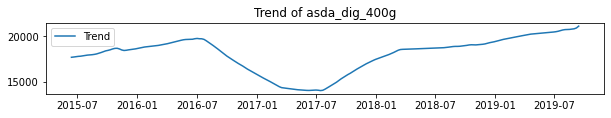

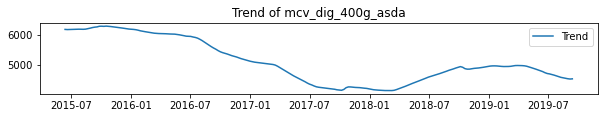

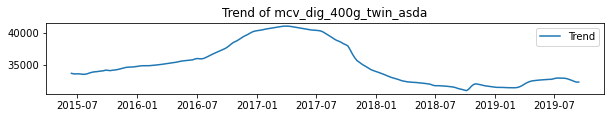

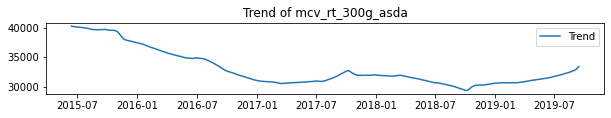

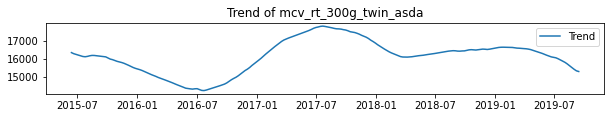

In [187]:
asda_dig_400g_competitor=[asda_dig_400g_volume,mcv_dig_400g_asda_volume,mcv_dig_400g_twin_asda_volume,mcv_rt_300g_asda_volume,mcv_rt_300g_twin_asda_volume]
asda_dig_400g_competitor_list=['asda_dig_400g','mcv_dig_400g_asda','mcv_dig_400g_twin_asda','mcv_rt_300g_asda','mcv_rt_300g_twin_asda']
asda_rt_250g_competitor=[asda_rt_250g_volume,mcv_dig_400g_asda_volume,mcv_dig_400g_twin_asda_volume,mcv_rt_300g_asda_volume,mcv_rt_300g_twin_asda_volume]
asda_rt_250g_competitor_list=['asda_rt_250g','mcv_dig_400g_asda','mcv_dig_400g_twin_asda','mcv_rt_300g_asda','mcv_rt_300g_twin_asda']
asda_rt_300g_competitor=[asda_rt_300g_volume,mcv_dig_400g_asda_volume,mcv_dig_400g_twin_asda_volume,mcv_rt_300g_asda_volume,mcv_rt_300g_twin_asda_volume]
asda_rt_300g_competitor_list=['asda_rt_300g','mcv_dig_400g_asda','mcv_dig_400g_twin_asda','mcv_rt_300g_asda','mcv_rt_300g_twin_asda']


i=0
for product in asda_dig_400g_competitor:
    decomposition=seasonal_decompose(product)
    trend_1=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_1, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + asda_dig_400g_competitor_list[i] )
    i=i+1

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of asda_rt_250g')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_dig_400g_twin_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_asda')

<Figure size 720x432 with 0 Axes>

Text(0.5, 1.0, 'Trend of mcv_rt_300g_twin_asda')

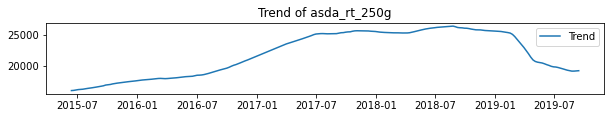

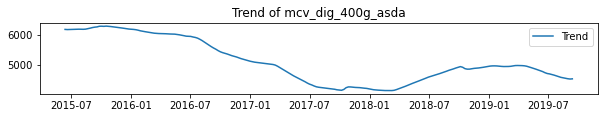

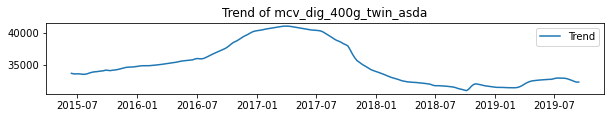

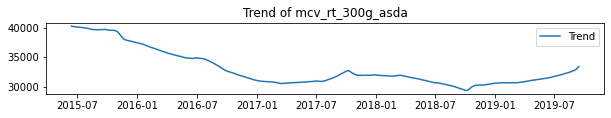

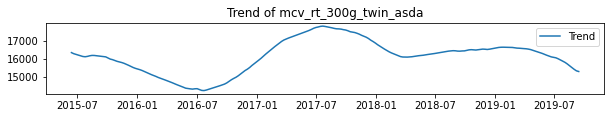

In [188]:
i=0
for product in asda_rt_250g_competitor:
    decomposition=seasonal_decompose(product)
    trend_2=decomposition.trend

    plt.figure(figsize=(10,6))
    plt.subplot(412)
    plt.plot(trend_2, label='Trend')
    plt.legend(loc='best')
    plt.title('Trend of ' + asda_rt_250g_competitor_list[i])
    i=i+1

In [190]:
# #asda rt 300g does not have enough data points to plot trend
# i=0
# for product in asda_rt_300g_competitor:
#     decomposition=seasonal_decompose(product)
#     trend_3=decomposition.trend

#     plt.figure(figsize=(10,6))
#     plt.subplot(412)
#     plt.plot(trend_3, label='Trend')
#     plt.legend(loc='best')
#     plt.title('Trend of ' + asda_rt_300g_competitor_list[i])
#     i=i+1

In [191]:
decomposition_1=seasonal_decompose(asda_dig_400g_volume)
trend_1=decomposition_1.trend
trend_1=trend_1.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_400g_asda_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_twin_asda_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_rt_300g_asda_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_twin_asda_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

asda_dig_400g_comp=pd.merge(trend_1,comp_trend1, how='left', on='Date')
asda_dig_400g_comp=pd.merge(asda_dig_400g_comp,comp_trend2, how='left', on='Date')
asda_dig_400g_comp=pd.merge(asda_dig_400g_comp,comp_trend3, how='left', on='Date')
asda_dig_400g_comp=pd.merge(asda_dig_400g_comp,comp_trend4, how='left', on='Date')
asda_dig_400g_comp.columns=['asda_dig_400g_trend', 'mcv_dig_400g_asda_trend','mcv_dig_400g_twin_asda_trend','mcv_rt_300g_asda_trend','mcv_rt_300g_twin_asda_trend']

asda_dig_400g_comp.corr()


,asda_dig_400g_trend,mcv_dig_400g_asda_trend,mcv_dig_400g_twin_asda_trend,mcv_rt_300g_asda_trend,mcv_rt_300g_twin_asda_trend
asda_dig_400g_trend,1.000000,0.284689,-0.833973,0.183894,-0.563714
mcv_dig_400g_asda_trend,0.284689,1.000000,-0.000553,0.815187,-0.665818
mcv_dig_400g_twin_asda_trend,-0.833973,-0.000553,1.000000,-0.057685,0.122796
mcv_rt_300g_asda_trend,0.183894,0.815187,-0.057685,1.000000,-0.426095
mcv_rt_300g_twin_asda_trend,-0.563714,-0.665818,0.122796,-0.426095,1.000000


In [192]:
decomposition_2=seasonal_decompose(asda_rt_250g_volume)
trend_2=decomposition_2.trend
trend_2=trend_2.to_frame()

comp_decomposition_1=seasonal_decompose(mcv_dig_400g_asda_volume)
comp_trend1=comp_decomposition_1.trend
comp_trend1=comp_trend1.to_frame()

comp_decomposition_2=seasonal_decompose(mcv_dig_400g_twin_asda_volume)
comp_trend2=comp_decomposition_2.trend
comp_trend2=comp_trend2.to_frame()

comp_decomposition_3=seasonal_decompose(mcv_rt_300g_asda_volume)
comp_trend3=comp_decomposition_3.trend
comp_trend3=comp_trend3.to_frame()

comp_decomposition_4=seasonal_decompose(mcv_rt_300g_twin_asda_volume)
comp_trend4=comp_decomposition_4.trend
comp_trend4=comp_trend4.to_frame()

asda_rt_250g_comp=pd.merge(trend_2,comp_trend1, how='left', on='Date')
asda_rt_250g_comp=pd.merge(asda_rt_250g_comp,comp_trend2, how='left', on='Date')
asda_rt_250g_comp=pd.merge(asda_rt_250g_comp,comp_trend3, how='left', on='Date')
asda_rt_250g_comp=pd.merge(asda_rt_250g_comp,comp_trend4, how='left', on='Date')
asda_rt_250g_comp.columns=['asda_rt_250g_trend', 'mcv_dig_400g_asda_trend','mcv_dig_400g_twin_asda_trend','mcv_rt_300g_asda_trend','mcv_rt_300g_twin_asda_trend']

asda_rt_250g_comp.corr()


,asda_rt_250g_trend,mcv_dig_400g_asda_trend,mcv_dig_400g_twin_asda_trend,mcv_rt_300g_asda_trend,mcv_rt_300g_twin_asda_trend
asda_rt_250g_trend,1.000000,-0.866579,-0.079756,-0.838641,0.675009
mcv_dig_400g_asda_trend,-0.866579,1.000000,-0.000553,0.815187,-0.665818
mcv_dig_400g_twin_asda_trend,-0.079756,-0.000553,1.000000,-0.057685,0.122796
mcv_rt_300g_asda_trend,-0.838641,0.815187,-0.057685,1.000000,-0.426095
mcv_rt_300g_twin_asda_trend,0.675009,-0.665818,0.122796,-0.426095,1.000000


In [194]:
# decomposition_3=seasonal_decompose(asda_rt_300g_volume)
# trend_3=decomposition_3.trend
# trend_3=trend_3.to_frame()

# comp_decomposition_1=seasonal_decompose(mcv_dig_400g_asda_volume)
# comp_trend1=comp_decomposition_1.trend
# comp_trend1=comp_trend1.to_frame()

# comp_decomposition_2=seasonal_decompose(mcv_dig_400g_twin_asda_volume)
# comp_trend2=comp_decomposition_2.trend
# comp_trend2=comp_trend2.to_frame()

# comp_decomposition_3=seasonal_decompose(mcv_rt_300g_asda_volume)
# comp_trend3=comp_decomposition_3.trend
# comp_trend3=comp_trend3.to_frame()

# comp_decomposition_4=seasonal_decompose(mcv_rt_300g_twin_asda_volume)
# comp_trend4=comp_decomposition_4.trend
# comp_trend4=comp_trend4.to_frame()

# asda_rt_300g_comp=pd.merge(trend_3,comp_trend1, how='left', on='Date')
# asda_rt_300g_comp=pd.merge(asda_rt_300g_comp,comp_trend2, how='left', on='Date')
# asda_rt_300g_comp=pd.merge(asda_rt_300g_comp,comp_trend3, how='left', on='Date')
# asda_rt_300g_comp=pd.merge(asda_rt_300g_comp,comp_trend4, how='left', on='Date')
# asda_rt_300g_comp.columns=['mcv_dig_400g_twin_trend', 'mcv_dig_400g_asda_trend','mcv_dig_400g_twin_asda_trend','mcv_rt_300g_asda_trend','mcv_rt_300g_twin_asda_trend']

# asda_rt_300g_comp.corr()


## Machine Learning Models

In [207]:
#extract own product variables: sales price distribution promotional week month quarter
def own_product_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
    x=x[['Volume','£/kg','Distribution','Promotional Distribution','year','quarter','month','week']]
    return x

asda_dig_400g_own_variable=own_product_variables(asda_dig_400g_origin)
asda_rt_250g_own_variable=own_product_variables(asda_rt_250g_origin)
asda_rt_300g_own_variable=own_product_variables(asda_rt_300g_origin)


In [216]:
asda_dig_400g_with_comp_1=asda_dig_400g_own_variable
asda_rt_250g_with_comp_1=asda_rt_250g_own_variable
asda_rt_300g_with_comp_1=asda_rt_300g_own_variable


In [209]:
def comp_variables(x):
#     x=x[:275]
#     date_time = x['SDESC'].str[3:]
#     date_time=pd.to_datetime(date_time, format='%d.%m.%y')
#     x['SDESC']=date_time
#     x.rename(columns={'SDESC':'Date'}, inplace=True)
    x=x.set_index('Date')
#     x=x.dropna(subset=['Volume'])
    x=x[['£/kg','Distribution']]
    return x

mcv_dig_400g_asda_price_dis=comp_variables(mcv_dig_400g_asda_origin)
mcv_dig_400g_twin_asda_price_dis=comp_variables(mcv_dig_400g_twin_asda_origin)
mcv_rt_300g_asda_price_dis=comp_variables(mcv_rt_300g_asda_origin)
mcv_rt_300g_twin_asda_price_dis=comp_variables(mcv_rt_300g_twin_asda_origin)


In [210]:
# compose competitors' variables as a list
competitor_list=[mcv_dig_400g_asda_price_dis, mcv_dig_400g_twin_asda_price_dis, mcv_rt_300g_asda_price_dis, mcv_rt_300g_twin_asda_price_dis]

variable_columns=['Volume','£/kg','Distribution','Promotional Distribution',
                  'year','quarter','month','week',
                   'mcv_dig_400g_asda_price_kg', 'mcv_dig_400g_asda_distribution',
                   'mcv_dig_400g_twin_asda_price_kg','mcv_dig_400g_twin_asda_distribution',
                   'mcv_rt_300g_asda_price_kg','mcv_rt_300g_asda_distribution',
                   'mcv_rt_300g_twin_asda_price_kg','mcv_rt_300g_twin_asda_distribution'
                  ]

In [211]:
# each variable with their competitors
# merge own product variables with four competitors' variables
for variable in competitor_list:
    asda_dig_400g_with_comp_1=asda_dig_400g_with_comp_1.merge(variable, how='left', on='Date')
    asda_dig_400g_with_comp=asda_dig_400g_with_comp_1
    
#drop all missing values
asda_dig_400g_with_comp.columns=variable_columns
asda_dig_400g_with_comp=asda_dig_400g_with_comp.dropna()
asda_dig_400g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_400g_asda_price_kg,mcv_dig_400g_asda_distribution,mcv_dig_400g_twin_asda_price_kg,mcv_dig_400g_twin_asda_distribution,mcv_rt_300g_asda_price_kg,mcv_rt_300g_asda_distribution,mcv_rt_300g_twin_asda_price_kg,mcv_rt_300g_twin_asda_distribution
Date,,,,,,,,,,,,,,,,
2017-04-29,24108.0,1.125000,100.0,0.0,2017,2,4,17,2.499055,100,2.486059,94,3.332553,100,3.149656,94
2017-05-06,23115.6,1.125015,100.0,0.0,2017,2,5,18,2.498982,100,2.486049,94,3.332633,100,3.149193,94
2017-05-13,23773.2,1.125048,100.0,0.0,2017,2,5,19,2.498393,100,2.486099,94,3.330996,100,3.149309,94
2017-05-20,24527.6,1.125047,100.0,0.0,2017,2,5,20,2.499553,100,2.486854,94,3.332933,100,3.149276,94
2017-05-27,23019.6,1.125159,100.0,0.0,2017,2,5,21,2.499631,100,2.486928,94,3.333035,100,3.149897,94


In [212]:
for variable in competitor_list:
    asda_rt_250g_with_comp_1=asda_rt_250g_with_comp_1.merge(variable, how='left', on='Date')
    asda_rt_250g_with_comp=asda_rt_250g_with_comp_1
    
asda_rt_250g_with_comp.columns=variable_columns
asda_rt_250g_with_comp=asda_rt_250g_with_comp.dropna()
asda_rt_250g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_400g_asda_price_kg,mcv_dig_400g_asda_distribution,mcv_dig_400g_twin_asda_price_kg,mcv_dig_400g_twin_asda_distribution,mcv_rt_300g_asda_price_kg,mcv_rt_300g_asda_distribution,mcv_rt_300g_twin_asda_price_kg,mcv_rt_300g_twin_asda_distribution
Date,,,,,,,,,,,,,,,,
2017-04-29,5600.8,2.249893,100.0,0.0,2017,2,4,17,2.499055,100,2.486059,94,3.332553,100,3.149656,94
2017-05-06,5453.6,2.250000,100.0,0.0,2017,2,5,18,2.498982,100,2.486049,94,3.332633,100,3.149193,94
2017-05-13,5555.0,2.250009,100.0,0.0,2017,2,5,19,2.498393,100,2.486099,94,3.330996,100,3.149309,94
2017-05-20,5656.8,2.250000,100.0,0.0,2017,2,5,20,2.499553,100,2.486854,94,3.332933,100,3.149276,94
2017-05-27,5226.0,2.250000,100.0,0.0,2017,2,5,21,2.499631,100,2.486928,94,3.333035,100,3.149897,94


In [217]:
for variable in competitor_list:
    asda_rt_300g_with_comp_1=asda_rt_300g_with_comp_1.merge(variable, how='left', on='Date')
    asda_rt_300g_with_comp=asda_rt_300g_with_comp_1
    
asda_rt_300g_with_comp.columns=variable_columns
asda_rt_300g_with_comp=asda_rt_300g_with_comp.dropna()
asda_rt_300g_with_comp.head()


,Volume,£/kg,Distribution,Promotional Distribution,year,quarter,month,week,mcv_dig_400g_asda_price_kg,mcv_dig_400g_asda_distribution,mcv_dig_400g_twin_asda_price_kg,mcv_dig_400g_twin_asda_distribution,mcv_rt_300g_asda_price_kg,mcv_rt_300g_asda_distribution,mcv_rt_300g_twin_asda_price_kg,mcv_rt_300g_twin_asda_distribution
Date,,,,,,,,,,,,,,,,
2017-09-30,2580.3,1.000000,81.0,0.0,2017,3,9,39,2.498431,100,2.411411,93,3.317040,100,3.137649,92
2017-10-07,15739.8,0.999994,99.0,0.0,2017,4,10,40,2.498840,100,2.357964,92,3.328819,100,3.141480,92
2017-10-14,16903.2,0.999988,100.0,0.0,2017,4,10,41,2.499514,100,2.355306,92,3.328735,100,3.142915,92
2017-10-21,15953.4,0.999912,99.0,0.0,2017,4,10,42,2.499453,100,2.357994,92,3.310259,100,3.143154,92
2017-10-28,17643.6,1.000000,100.0,0.0,2017,4,10,43,2.499447,100,2.360666,92,3.327491,100,3.148870,92


In [ ]:
# mcv_dig_400g_asda=pd.read_excel("Asda/Asda MCVTS DGSTVS 400G SNGL.xlsx")
# mcv_dig_400g_twin_asda=pd.read_excel("Asda/Asda MCVTS DGSTVS 400G 2PACK.xlsx")
# mcv_rt_300g_asda=pd.read_excel("Asda/Asda RCH T MCVTS RCH T PLN 300 GM SNGL.xlsx")
# mcv_rt_300g_twin_asda=pd.read_excel("Asda/Asda RCH T MCVTS RCH T PLN 300 GM 2 PCK.xlsx")

# asda_dig_400g_volume=tes_large2[4]
# asda_rt_250g_volume=tes_large2[5]
# asda_rt_300g_volume=tes_large2[6]


### Random Forest Regressor

In [220]:
def variable_lag_asda(df):
    df=pd.DataFrame(df)
    X_lag=df[['£/kg','Distribution','Promotional Distribution',
             'mcv_dig_400g_asda_price_kg', 'mcv_dig_400g_asda_distribution',
                'mcv_dig_400g_twin_asda_price_kg','mcv_dig_400g_twin_asda_distribution',
                'mcv_rt_300g_asda_price_kg','mcv_rt_300g_asda_distribution',
                'mcv_rt_300g_twin_asda_price_kg','mcv_rt_300g_twin_asda_distribution'
             ]]
    X_lagged=X_lag.shift(4)
    non_lag=df[['Volume','year','quarter','month','week']]
    final_df=pd.merge(X_lagged,non_lag,left_index=True, right_index=True)
    final_df=final_df.dropna()
    return final_df

In [ ]:
def input_var_asda(var):
#     for var in final_var_list:
    X=var[['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
            'mcv_dig_400g_asda_price_kg', 'mcv_dig_400g_asda_distribution',
                'mcv_dig_400g_twin_asda_price_kg','mcv_dig_400g_twin_asda_distribution',
                'mcv_rt_300g_asda_price_kg','mcv_rt_300g_asda_distribution',
                'mcv_rt_300g_twin_asda_price_kg','mcv_rt_300g_twin_asda_distribution'
              ]].values
    y=var['Volume'].values
    return X,y

In [ ]:
#train test split
from sklearn.model_selection import TimeSeriesSplit

def rf_regressor_asda(X, y):
    splits = TimeSeriesSplit(n_splits=5)

    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler

        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        regressor = RandomForestRegressor(n_estimators=20, random_state=0)
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        print(cross_val_score(regressor, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
         'mcv_dig_400g_asda_price_kg', 'mcv_dig_400g_asda_distribution',
                'mcv_dig_400g_twin_asda_price_kg','mcv_dig_400g_twin_asda_distribution',
                'mcv_rt_300g_asda_price_kg','mcv_rt_300g_asda_distribution',
                'mcv_rt_300g_twin_asda_price_kg','mcv_rt_300g_twin_asda_distribution'
], 'importance': regressor.feature_importances_})
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of Random Forest Model",legend=False, figsize=(15, 8))

In [ ]:
asda_dig_400g_with_compwith_comp=variable_lag_mcv_asda(asda_dig_400g_with_comp)


In [ ]:
asda_dig_400g_input_X,asda_dig_400g_input_Y=input_var_asda(asda_dig_400g_with_compwith_comp)
rf_regressor_mcv_asda(asda_dig_400g_input_X,asda_dig_400g_input_Y)


### XGBoost Regressor

In [ ]:
def xgb_regressor_asda(X, y):
    splits = TimeSeriesSplit(n_splits=5)
    
    for train_index, test_index in splits.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        print('Observations: %d' % (len(train_index) + len(test_index)))
        print('Training Observations: %d' % (len(train_index))) 
        print('Testing Observations: %d' % (len(test_index))) 
        from sklearn.preprocessing import StandardScaler


        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)

        from sklearn.ensemble import RandomForestRegressor
        from sklearn.model_selection import cross_val_score

        xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                    max_depth = 5, alpha = 10, n_estimators = 10)
        xg_reg.fit(X_train, y_train)
        y_pred = xg_reg.predict(X_test)
        print(cross_val_score(xg_reg, X_train, y_train, cv=splits))

        from sklearn import metrics

        print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
        print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
        print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

        #feature importance
        df_featImp = pd.DataFrame({'features':['£/kg','Distribution','Promotional Distribution',
           'year','quarter','month','week',
        'mcv_dig_400g_asda_price_kg', 'mcv_dig_400g_asda_distribution',
                'mcv_dig_400g_twin_asda_price_kg','mcv_dig_400g_twin_asda_distribution',
                'mcv_rt_300g_asda_price_kg','mcv_rt_300g_asda_distribution',
                'mcv_rt_300g_twin_asda_price_kg','mcv_rt_300g_twin_asda_distribution'
        df_featImp = df_featImp.sort_values('importance').reset_index(drop=True)

        plt.figure()
        df_featImp.plot(kind='barh', x='features', y='importance', title="Feature Importance for Volume Sales of XGBoost Model",legend=False, figsize=(20, 13))


In [ ]:
xgb_regressor_asda(asda_dig_400g_input_X,asda_dig_400g_input_Y)


In [ ]:
#lstm models
series_to_supervised(asda_dig_400g_volume)
lstm_univariate(asda_dig_400g_volume)


### LSTM Multivariate with Competitors'

In [ ]:
series_to_supervised(asda_dig_400g_with_comp)

In [ ]:
def multivariate_with_competitor_asda(df):
    values = df.values
    # integer encode direction
    #encoder = LabelEncoder()
    #values[:,4] = encoder.fit_transform(values[:,4])
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 4, 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[15,16,17,18,19,20,21,22,23,24,25,26,27]], axis=1, inplace=True)
    print(reframed.head())

    # split into train and test sets
    values = reframed.values
    train_size = int(len(values) * 0.8)
    train=values[:train_size]
    test=values[train_size:]
    # split into input and outputs
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

    model = Sequential()
    earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
    model.add(LSTM(100, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(LSTM(25))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False, callbacks=[earlystopping])
    # plot history
    plt.figure(figsize=(23, 15))
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title('LSTM multivariate model with competitors variables loss vs. val loss',loc='center')
    plt.legend()
    plt.show()

    from numpy import concatenate

    yhat = model.predict(test_X)
    test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    # invert scaling for actual
    test_y = test_y.reshape((len(test_y), 1))
    inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
    inv_y = scaler.inverse_transform(inv_y)
    inv_y = inv_y[:,0]
    # calculate RMSE
    rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
    print('Test RMSE: %.3f' % rmse)

In [ ]:
multivariate_with_competitor_asda(asda_dig_400g_with_comp)